Code based on GitHub repository https://github.com/eriklindernoren/Keras-GAN/blob/master/gan/gan.py

# Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random

from tensorflow.keras.datasets import mnist
from tensorflow.keras.utils import plot_model
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Input, Conv2D, Dense, Activation, Flatten, Reshape, Dropout, UpSampling2D, MaxPooling2D, BatchNormalization, Conv2DTranspose
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.optimizers import Adam

# Procesamiento de datos

## Dataset Load

We download MNIST dataset, consisting of 60.000 images of 28x28 pixels resolution. Each image defines a handwritten number in greyscale.

11490434/11490434 [==============================] - 2s 0us/step
(60000, 28, 28)


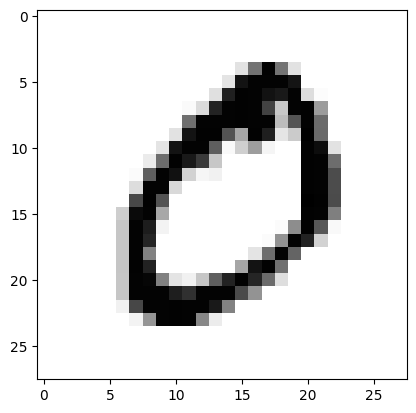

In [ ]:
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()
plt.imshow(X_train[1], cmap = 'Greys')
print(X_train.shape)

### Preprocessing data

The pixels in the source image are within the range [0, 256] we will normalize this range to [-1, 1] in order to treat this information with neural networks.

In [ ]:
X_train = X_train.astype('float32')/127.5 -1

X_train = np.expand_dims(X_train, axis=3)

# Primeros Pasos

En primera instancia decidí investigar a cerca de las DCGANs y de las GAN, consultando diferentes fuentes para ayudarme a implementar la DCGAN propuesta en la práctica.


*   [Todo lo que necesitas saber sobre las GAN: Redes Generativas Antagónicas](https://puentesdigitales.com/2019/04/05/todo-lo-que-necesitas-saber-sobre-las-gan-redes-generativas-antagonicas/)



*   [Dropout y Batch Normalization](https://vincentblog.xyz/posts/dropout-y-batch-normalization)


*   [Generación de Soluciones Factibles en Metaheurística Poblacionales en Base a Técnicas de Deep Learning](https://oa.upm.es/71416/1/TFM_MARCOS_NUNEZ_GUERRERO.pdf), Página 21 del pdf.

*   [Generación de elementos mediante técnicas de Deep Learning](https://uvadoc.uva.es/bitstream/handle/10324/59936/TFG-B.%201915.pdf?sequence=1&isAllowed=y), Página 76 del pdf.

Sinceramente hubo mucha información la cual no llegue a entender por completo, pero esto unida a la vista en clase me ayudo a asentar conceptualmente la arquitectura de una GAN y sus inconvenientes/limitaciones



# Baseline

## Generator definition

### Responda a las siguientes cuestiones:

* Describa el diseño de la red neuronal Generativa, justificando los hiperparámetros utilizados en la medida de lo posible.


> Para poder traernos el **espacio latente** al generador y añadir nuestras capas convulucionales necesitamos un **reshape** y por consiguiente una capa densa para este. Decidí implementar una arquitectura con dos capas de **64 y 32 filtros**, al decidir 64 filtros en la primera capa vi oportuno dimensionar inicialmente el reshape con 128 filtros. Por otro lado, la imagen la convirtí a 7 x 7, esto se debe a que es el tamaño que necesito para cuadrar las dimensiones del generador durante el UpSampling.

> Uso capas **Conv2DTranspose**, en lugar de las Conv2D típicas ya que he leido que son muy prácticas para implementar DCGANs y proporcionan mejores resultados. Además, me ahorro definir UpSamplings dado que permiten aumentar la resolución de la representación latente a medida que avanza la red, el **kernel_size** lo he definido a 3 porque es lo estandar en capas convulucionales, el **stride=2** para hacer saltos de 2 pixeles y jugar con el tamaño de la imagen. La capa **output** sirve para reducir el número de dimensiones a 1 que es el que desea el discriminador (28,28,1) y su función de activación es **tanh** debido a la estrategía de normalización que estamos usando (-1,1).

>  En cuanto a las funciones de activación de las 2 capas ocultas, estoy usando LeakyRelu ya que es una de las más utilizadas, ayuda a mitigar problemas como las "neuronas muertas" y proporciona "estabilidad" durante el fit mejorando los resultados de la DCGAN. Además, dado que los valores van de -1 a 1 parece que tiene más sentido la LeakyRelu que la Relu. El alpha voy a establecerlo en 0.01 ya que he visto que es muy común usarlo a pesar de que el valor por defecto sea 0.3.



* Existen una serie de capas que pueden ser beneficiosas para el entrenamiento de redes GAN, algunas de ellas son las capas de Dropout o BatchNormalization. En caso de utilizar dichas capas justifique su uso. Se **valorará positivamente** responder a este apartado.

> En primera instancia, no voy a añadir capas de Dropout aunque posiblemente lo haga en futuros entrenamientos. La capa de BatchNormalization si que voy a añadirla, he leido que normaliza los datos antes de que pasen por la función de activación en cada capa de la red neuronal, de esta manera siempre tendremos los datos normalizados y perdemos menos información. Voy a usar el momentum a 0.8 ya que al igual que me sucedio con la LeakyRelu he visto que es muy común usarlo.

>También considero que puede ser interesante usar otras medidas de regulación como la L1/L2 que probaré más adelante.

In [ ]:
def create_generator():

    input = Input(shape=(100))

    x = Dense(7 * 7 * 128)(input)
    x = Reshape((7, 7, 128))(x)

    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2DTranspose(32, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    output = Conv2DTranspose(1, kernel_size=3, strides=1, padding="same", activation="tanh")(x)

    generator = Model(input, output)

    return generator

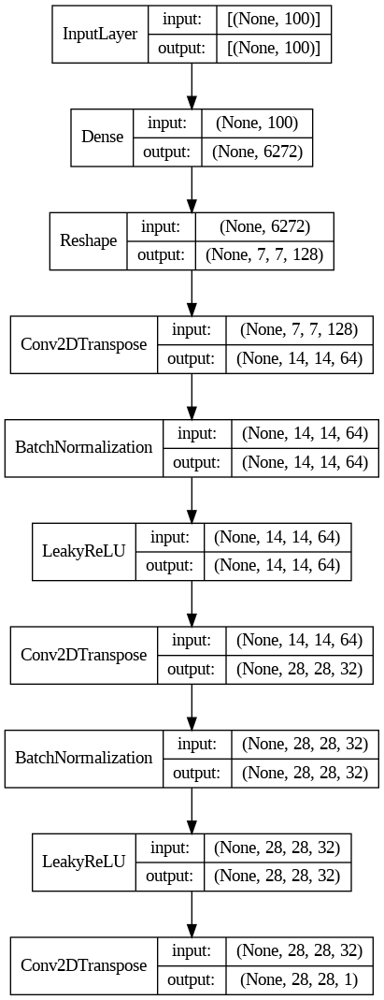

In [ ]:
generator = create_generator()
plot_model(generator, show_shapes=True, show_layer_names=False)

## Discriminator definition

### Responda a las siguientes cuestiones:

* Describa el diseño de la red neuronal Discriminadora, justificando los hiperparámetros utilizados en la medida de lo posible.

> En este caso recibimos imagenes por parte del generador y por parte del propio dataset, entonces debemos definir un **input de (28,28,1)** para que sea compatible con ambos.

> No voy a usar la misma arquitectura que en el generador, voy a añadir una conv2D más y además voy a definir strides de 2 para reducir el tamaño de la imagen. El kernel_size voy a mantenerlo a 3 que supuestamente es lo habitual en estos casos.

> Como se puede observar he seguido una filosofía una similar al generador en cuanto a las funciones de activación, manteniendo la LeakyRelu y usando los mismo hiperparámetros.

* Existen una serie de capas que pueden ser beneficiosas para el entrenamiento de redes GAN, algunas de ellas son las capas de Dropout o BatchNormalization. En caso de utilizar dichas capas justifique su uso. Se **valorará positivamente** responder a este apartado.

> A diferencia del generador, en el discriminador no voy a añadir más capas, quiero ver el comportamiento que presenta por si mismo. Sin embargo, lo más seguro es que necesite añadir alguna de estas capas en futuros entrenamientos.

In [ ]:
def create_discriminator():
    input = Input(shape=(28, 28, 1))

    # Rellene con la red neuronal convolucional deseada

    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(input)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2D(128, kernel_size=3, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2D(256, kernel_size=3, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Flatten()(x)


    output =  Dense(1, activation="sigmoid")(x)

    discriminator = Model(input, output)

    return discriminator

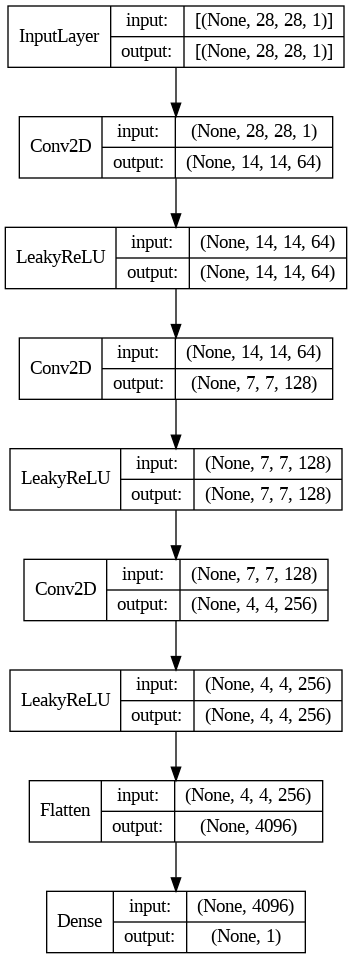

In [ ]:
discriminator = create_discriminator()
plot_model(discriminator, show_shapes=True, show_layer_names=False)

## GAN model definition

In [ ]:
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
discriminator.trainable = False

z = Input(shape=(100,))
img = generator(z)
validity = discriminator(img)

combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam())

## Training

In [ ]:
def train(X_train, generator, discriminator, combined, epochs, batch_size=32, sample_interval=100):
    # Adversarial ground truths (-1 fake and 1 real)
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    history = {
        'd_loss' : [],
        'd_acc' : [],
        'g_loss' : []
    }

    for epoch in range(epochs):
        print("----EPOCH " + str(epoch) + '-----')
        for batch in range(int(len(X_train)/batch_size)):
            #  Train the Discriminator
            noise = np.random.normal(0, 1, (batch_size, 100))
            gen_imgs = generator.predict(noise, verbose=0)
            imgs = X_train[batch*batch_size : (batch+1)*batch_size]

            d_loss_real = discriminator.train_on_batch(imgs, valid)
            d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Train the Generator
            noise = np.random.normal(0, 1, (batch_size, 100))
            g_loss = combined.train_on_batch(noise, valid)

            # Save losses
            history['d_loss'].append(d_loss[0])
            history['d_acc'].append(d_loss[1])
            history['g_loss'].append(g_loss)

            # Plot the progress
            if batch % 50 == 0:
                print ("%d [D loss: %.4f,\t acc.: %.2f%%]\t[G loss: %.4f]" % (batch, d_loss[0], 100*d_loss[1], g_loss))

            if batch % 500 == 0:
                sample_images(epoch, batch, gen_imgs, imgs)

        plot_losses(history)

## Plotting functions

In [ ]:
def sample_images(epoch, batch, gen_imgs, imgs):
    plt.rcParams['figure.figsize'] = [15, 5]
    fig, axs = plt.subplots(2, 5)
    fig.suptitle('Epoch: ' + str(epoch) + ', Batch: ' + str(batch), fontsize=16)
    for i in range(5):
        axs[0,i].imshow(gen_imgs[i,:,:,0], cmap='Greys')
        axs[0,i].axis('off')

    for i in range(5):
        axs[1,i].imshow(imgs[i,:,:,0], cmap='Greys')
        axs[1,i].axis('off')
    plt.show()
    plt.close()

In [ ]:
def plot_losses(history):
    plt.rcParams['figure.figsize'] = [20, 5]
    f, (ax1, ax2) = plt.subplots(1, 2, sharex=True)

    ax1.set_title('Losses')
    ax1.set_xlabel('epoch')
    ax1.legend(loc="upper right")
    ax1.grid()

    ax1.plot(history['d_loss'], label='D loss')
    ax1.plot(history['g_loss'], label='G loss')
    ax1.legend()

    ax2.set_title('D accuracy')
    ax2.set_xlabel('epoch')
    ax2.legend(loc="upper right")
    ax2.grid()

    ax2.plot(history['d_acc'], label='Accuracy')
    ax2.legend()

    plt.show()

## Responda a las siguientes cuestiones:

* Analice los resultados del entrenamiento realizado, identifique posibles problemas que hayan podido surgir en sus redes. En caso de que sea necesario haga más pruebas en otra celda, justificando la evolución y cambios de una a otra.

----EPOCH 0-----
0 [D loss: 0.6999,	 acc.: 35.94%]	[G loss: 0.5044]


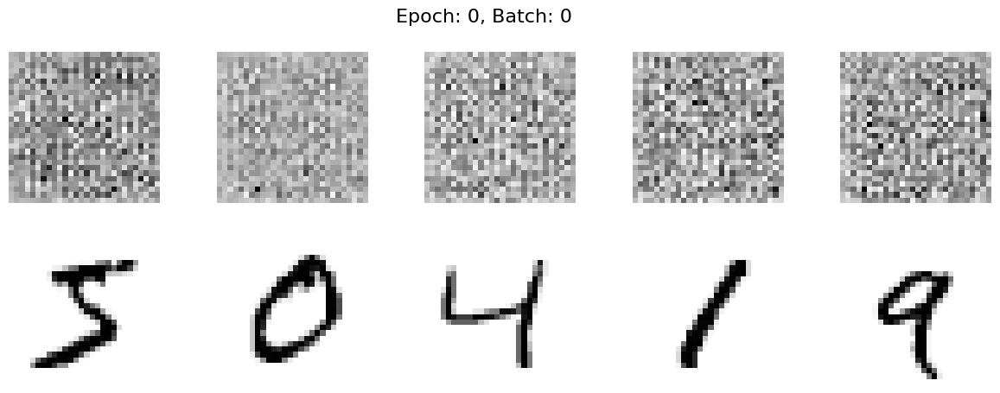

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 17.4616]
100 [D loss: 0.0022,	 acc.: 100.00%]	[G loss: 9.5885]
150 [D loss: 0.0014,	 acc.: 100.00%]	[G loss: 8.0755]
200 [D loss: 0.0316,	 acc.: 100.00%]	[G loss: 4.9842]
250 [D loss: 0.0191,	 acc.: 100.00%]	[G loss: 7.3766]
300 [D loss: 0.0001,	 acc.: 100.00%]	[G loss: 10.2138]
350 [D loss: 0.1616,	 acc.: 92.19%]	[G loss: 3.1439]
400 [D loss: 0.1981,	 acc.: 90.62%]	[G loss: 7.0021]
450 [D loss: 0.2322,	 acc.: 90.62%]	[G loss: 3.4043]
500 [D loss: 0.0270,	 acc.: 100.00%]	[G loss: 7.1302]


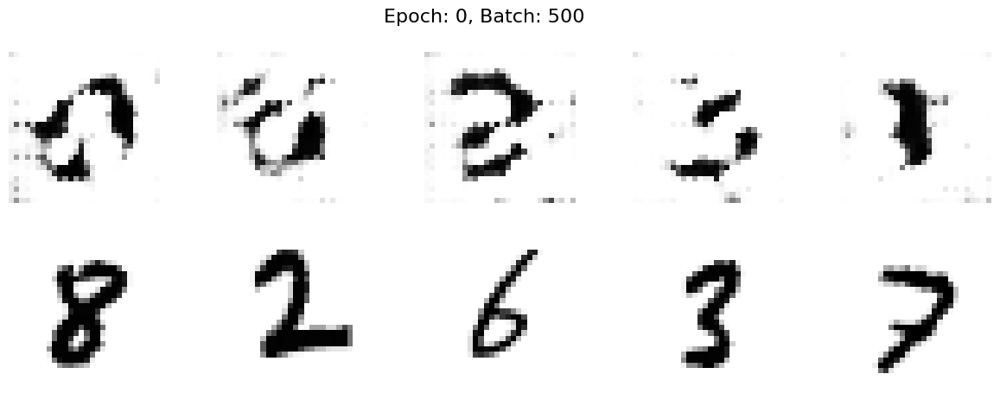

550 [D loss: 0.4820,	 acc.: 79.69%]	[G loss: 2.7761]
600 [D loss: 0.5268,	 acc.: 68.75%]	[G loss: 2.2799]
650 [D loss: 0.1441,	 acc.: 93.75%]	[G loss: 3.1878]
700 [D loss: 0.2197,	 acc.: 93.75%]	[G loss: 2.5781]
750 [D loss: 0.7120,	 acc.: 67.19%]	[G loss: 1.3460]
800 [D loss: 0.0978,	 acc.: 96.88%]	[G loss: 3.6431]
850 [D loss: 0.1578,	 acc.: 95.31%]	[G loss: 3.2311]
900 [D loss: 0.1810,	 acc.: 92.19%]	[G loss: 3.5196]
950 [D loss: 0.2403,	 acc.: 92.19%]	[G loss: 3.0938]
1000 [D loss: 0.4875,	 acc.: 79.69%]	[G loss: 2.6490]


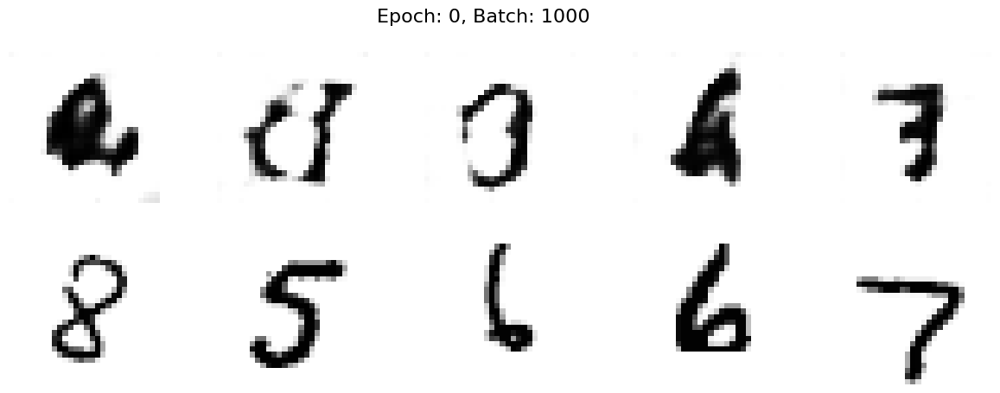

1050 [D loss: 0.1072,	 acc.: 96.88%]	[G loss: 3.3364]
1100 [D loss: 0.1248,	 acc.: 92.19%]	[G loss: 4.3586]
1150 [D loss: 0.2252,	 acc.: 95.31%]	[G loss: 3.2792]
1200 [D loss: 0.0893,	 acc.: 98.44%]	[G loss: 3.6146]
1250 [D loss: 0.2432,	 acc.: 89.06%]	[G loss: 2.9860]
1300 [D loss: 0.1393,	 acc.: 92.19%]	[G loss: 4.7114]
1350 [D loss: 0.1175,	 acc.: 92.19%]	[G loss: 3.5732]
1400 [D loss: 0.1689,	 acc.: 90.62%]	[G loss: 3.6090]
1450 [D loss: 0.0756,	 acc.: 98.44%]	[G loss: 4.0819]
1500 [D loss: 0.1581,	 acc.: 90.62%]	[G loss: 4.8354]


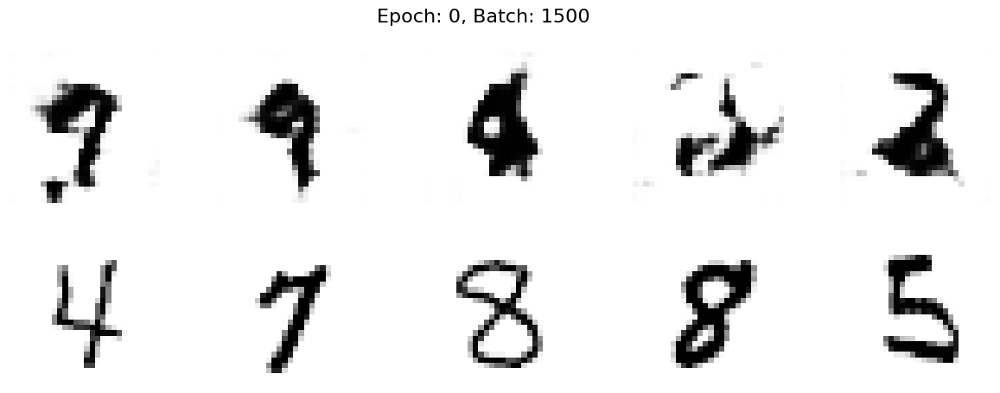

1550 [D loss: 0.2449,	 acc.: 89.06%]	[G loss: 3.4208]
1600 [D loss: 0.2372,	 acc.: 92.19%]	[G loss: 3.2528]
1650 [D loss: 0.1599,	 acc.: 92.19%]	[G loss: 4.2629]
1700 [D loss: 0.3359,	 acc.: 82.81%]	[G loss: 2.2112]
1750 [D loss: 0.2656,	 acc.: 93.75%]	[G loss: 3.8068]
1800 [D loss: 0.2144,	 acc.: 89.06%]	[G loss: 3.5152]
1850 [D loss: 0.0980,	 acc.: 96.88%]	[G loss: 4.8496]


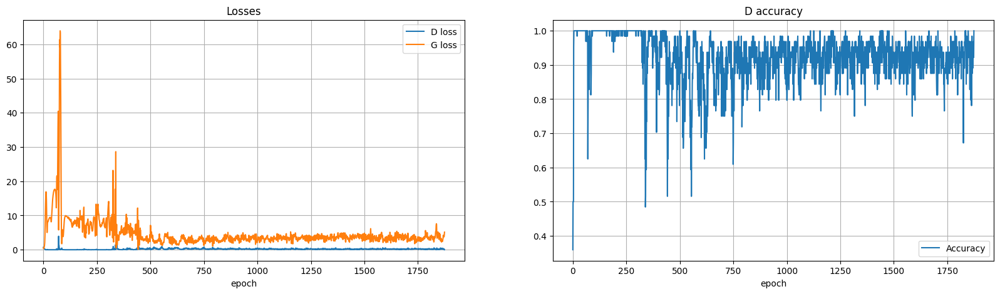

----EPOCH 1-----
0 [D loss: 0.2101,	 acc.: 90.62%]	[G loss: 5.0044]


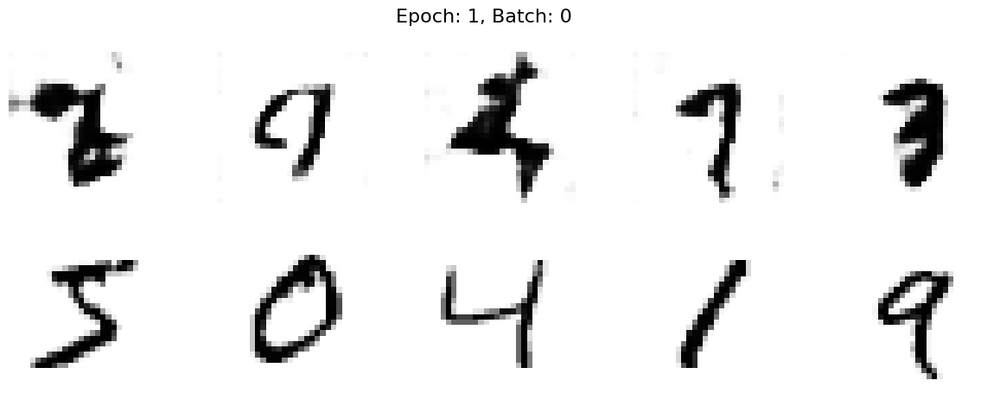

50 [D loss: 0.3142,	 acc.: 90.62%]	[G loss: 2.9670]
100 [D loss: 0.2326,	 acc.: 87.50%]	[G loss: 3.1046]
150 [D loss: 0.1768,	 acc.: 92.19%]	[G loss: 3.5948]
200 [D loss: 0.2737,	 acc.: 92.19%]	[G loss: 3.2560]
250 [D loss: 0.2635,	 acc.: 87.50%]	[G loss: 3.2230]
300 [D loss: 0.3919,	 acc.: 79.69%]	[G loss: 1.8122]
350 [D loss: 0.3186,	 acc.: 87.50%]	[G loss: 3.1370]
400 [D loss: 0.4045,	 acc.: 79.69%]	[G loss: 1.9116]
450 [D loss: 0.3342,	 acc.: 85.94%]	[G loss: 2.9083]
500 [D loss: 0.2239,	 acc.: 92.19%]	[G loss: 2.7299]


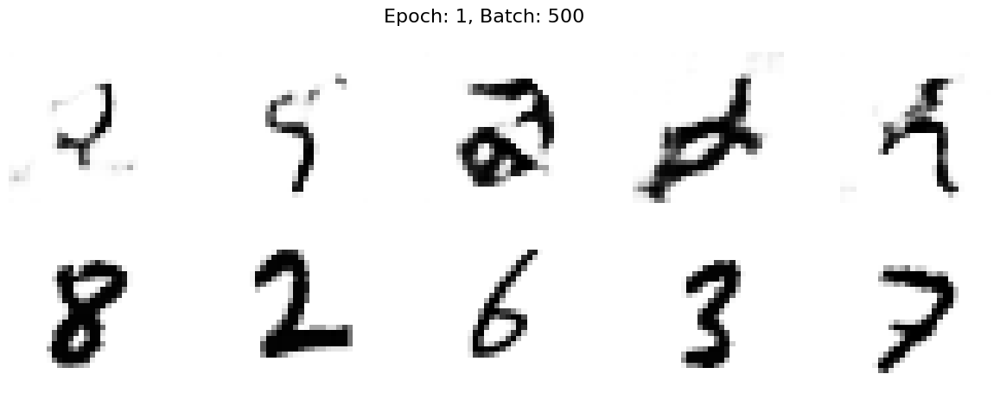

550 [D loss: 0.3177,	 acc.: 85.94%]	[G loss: 2.3716]
600 [D loss: 0.2146,	 acc.: 92.19%]	[G loss: 3.3427]
650 [D loss: 0.1148,	 acc.: 95.31%]	[G loss: 2.9262]
700 [D loss: 0.0903,	 acc.: 96.88%]	[G loss: 3.8183]
750 [D loss: 0.3632,	 acc.: 84.38%]	[G loss: 2.6625]
800 [D loss: 0.2391,	 acc.: 90.62%]	[G loss: 3.1202]
850 [D loss: 0.2866,	 acc.: 82.81%]	[G loss: 2.7555]
900 [D loss: 0.1249,	 acc.: 96.88%]	[G loss: 2.5976]
950 [D loss: 0.2053,	 acc.: 92.19%]	[G loss: 3.4189]
1000 [D loss: 0.5562,	 acc.: 71.88%]	[G loss: 2.3281]


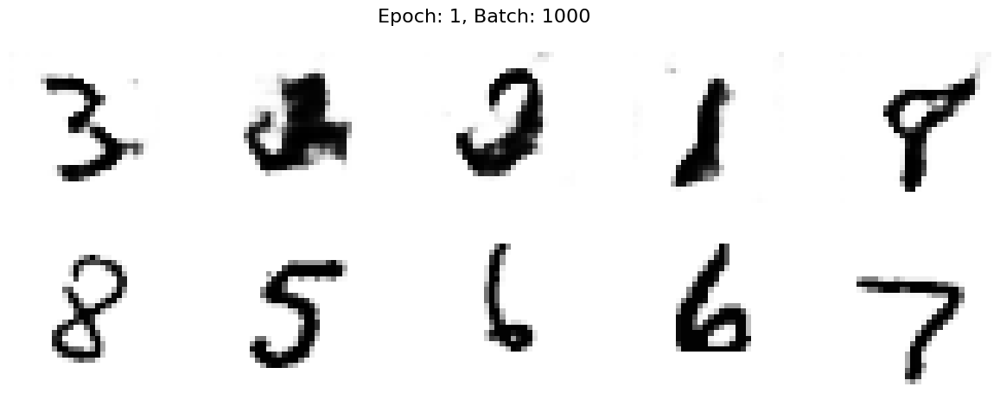

1050 [D loss: 0.2215,	 acc.: 89.06%]	[G loss: 3.0381]
1100 [D loss: 0.1744,	 acc.: 90.62%]	[G loss: 3.6637]
1150 [D loss: 0.2494,	 acc.: 90.62%]	[G loss: 3.7650]
1200 [D loss: 0.2773,	 acc.: 89.06%]	[G loss: 2.7931]
1250 [D loss: 0.1263,	 acc.: 95.31%]	[G loss: 2.9147]
1300 [D loss: 0.2094,	 acc.: 92.19%]	[G loss: 3.5816]
1350 [D loss: 0.2242,	 acc.: 89.06%]	[G loss: 3.7298]
1400 [D loss: 0.2910,	 acc.: 82.81%]	[G loss: 2.7748]
1450 [D loss: 0.2765,	 acc.: 87.50%]	[G loss: 3.1645]
1500 [D loss: 0.2914,	 acc.: 85.94%]	[G loss: 2.9179]


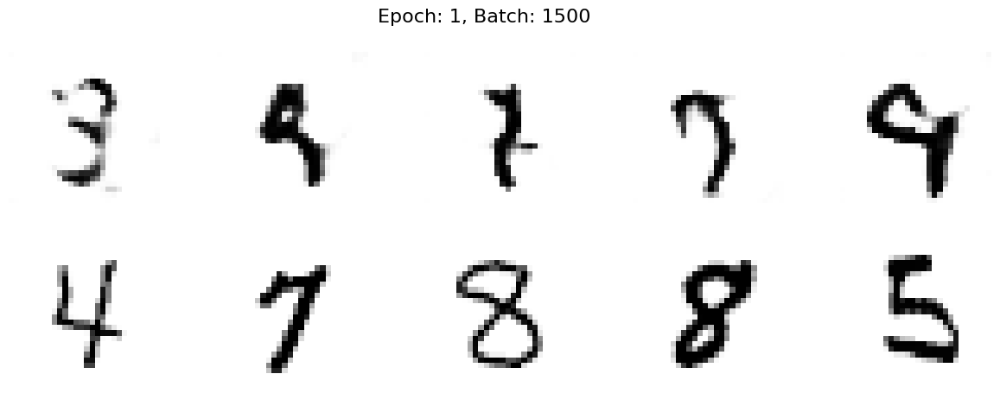

1550 [D loss: 0.2376,	 acc.: 92.19%]	[G loss: 3.5615]
1600 [D loss: 0.2883,	 acc.: 90.62%]	[G loss: 2.7916]
1650 [D loss: 0.2809,	 acc.: 84.38%]	[G loss: 2.6035]
1700 [D loss: 0.3083,	 acc.: 81.25%]	[G loss: 2.6293]
1750 [D loss: 0.2594,	 acc.: 89.06%]	[G loss: 3.6223]
1800 [D loss: 0.2685,	 acc.: 89.06%]	[G loss: 4.8614]
1850 [D loss: 0.1243,	 acc.: 98.44%]	[G loss: 2.9482]


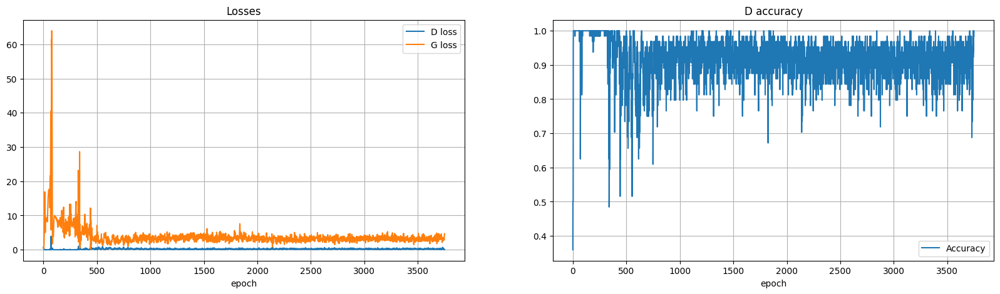

----EPOCH 2-----
0 [D loss: 0.3431,	 acc.: 81.25%]	[G loss: 4.5013]


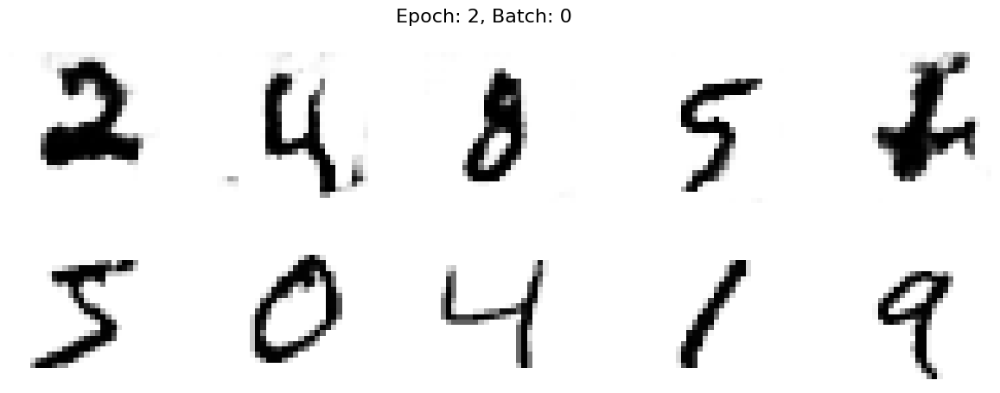

50 [D loss: 0.2993,	 acc.: 92.19%]	[G loss: 2.7271]
100 [D loss: 0.2399,	 acc.: 87.50%]	[G loss: 2.5640]
150 [D loss: 0.4133,	 acc.: 78.12%]	[G loss: 2.9810]
200 [D loss: 0.1397,	 acc.: 95.31%]	[G loss: 4.2802]
250 [D loss: 0.1551,	 acc.: 98.44%]	[G loss: 4.2095]
300 [D loss: 0.3315,	 acc.: 82.81%]	[G loss: 2.2240]
350 [D loss: 0.2426,	 acc.: 89.06%]	[G loss: 3.2552]
400 [D loss: 0.1913,	 acc.: 93.75%]	[G loss: 3.1552]
450 [D loss: 0.1918,	 acc.: 93.75%]	[G loss: 2.4535]
500 [D loss: 0.3340,	 acc.: 85.94%]	[G loss: 2.3012]


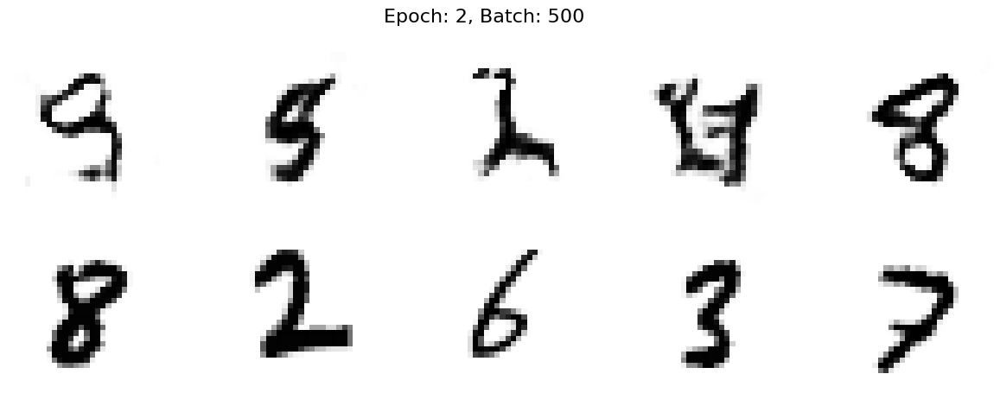

550 [D loss: 0.2056,	 acc.: 93.75%]	[G loss: 3.3361]
600 [D loss: 0.2122,	 acc.: 93.75%]	[G loss: 3.1860]
650 [D loss: 0.1543,	 acc.: 96.88%]	[G loss: 2.9127]
700 [D loss: 0.1383,	 acc.: 93.75%]	[G loss: 3.8960]
750 [D loss: 0.2807,	 acc.: 90.62%]	[G loss: 3.4374]
800 [D loss: 0.4172,	 acc.: 84.38%]	[G loss: 2.6918]
850 [D loss: 0.2424,	 acc.: 92.19%]	[G loss: 2.9608]
900 [D loss: 0.0867,	 acc.: 96.88%]	[G loss: 3.6491]
950 [D loss: 0.3427,	 acc.: 82.81%]	[G loss: 2.7154]
1000 [D loss: 0.3133,	 acc.: 89.06%]	[G loss: 2.3606]


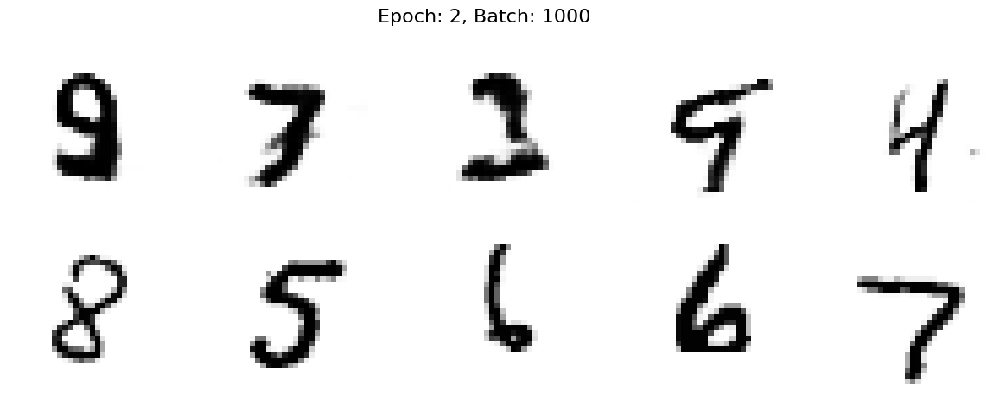

1050 [D loss: 0.1072,	 acc.: 98.44%]	[G loss: 3.0822]
1100 [D loss: 0.1892,	 acc.: 95.31%]	[G loss: 3.5336]
1150 [D loss: 0.2236,	 acc.: 89.06%]	[G loss: 2.9124]
1200 [D loss: 0.2122,	 acc.: 92.19%]	[G loss: 2.6347]
1250 [D loss: 0.3815,	 acc.: 84.38%]	[G loss: 2.9566]
1300 [D loss: 0.2093,	 acc.: 93.75%]	[G loss: 2.7018]
1350 [D loss: 0.0908,	 acc.: 98.44%]	[G loss: 3.4613]
1400 [D loss: 0.2890,	 acc.: 85.94%]	[G loss: 3.0396]
1450 [D loss: 0.2745,	 acc.: 89.06%]	[G loss: 3.6509]
1500 [D loss: 0.1873,	 acc.: 92.19%]	[G loss: 2.4299]


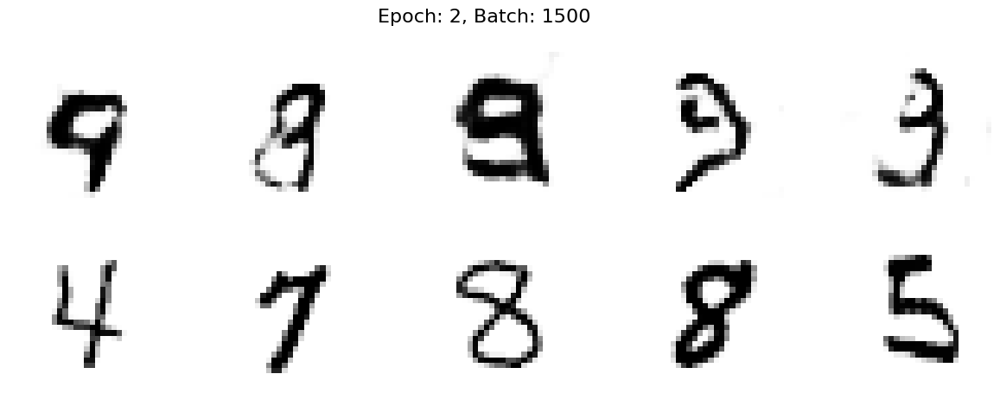

1550 [D loss: 0.2631,	 acc.: 87.50%]	[G loss: 3.0263]
1600 [D loss: 0.2503,	 acc.: 90.62%]	[G loss: 2.6326]
1650 [D loss: 0.2677,	 acc.: 87.50%]	[G loss: 3.0836]
1700 [D loss: 0.1878,	 acc.: 93.75%]	[G loss: 3.9143]
1750 [D loss: 0.1930,	 acc.: 92.19%]	[G loss: 3.6041]
1800 [D loss: 0.1049,	 acc.: 98.44%]	[G loss: 3.3025]
1850 [D loss: 0.2317,	 acc.: 87.50%]	[G loss: 3.1887]


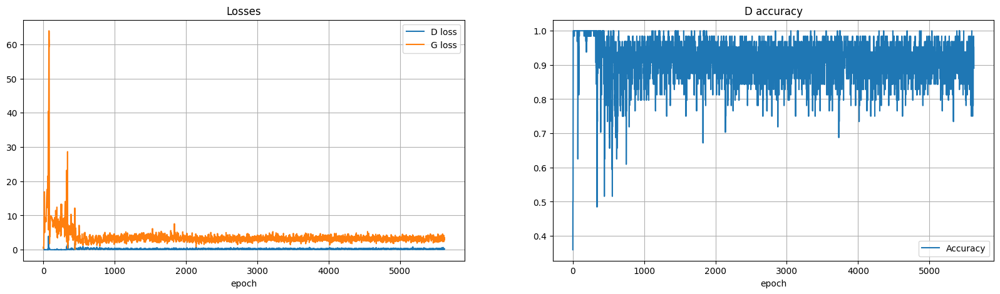

----EPOCH 3-----
0 [D loss: 0.3455,	 acc.: 81.25%]	[G loss: 3.7137]


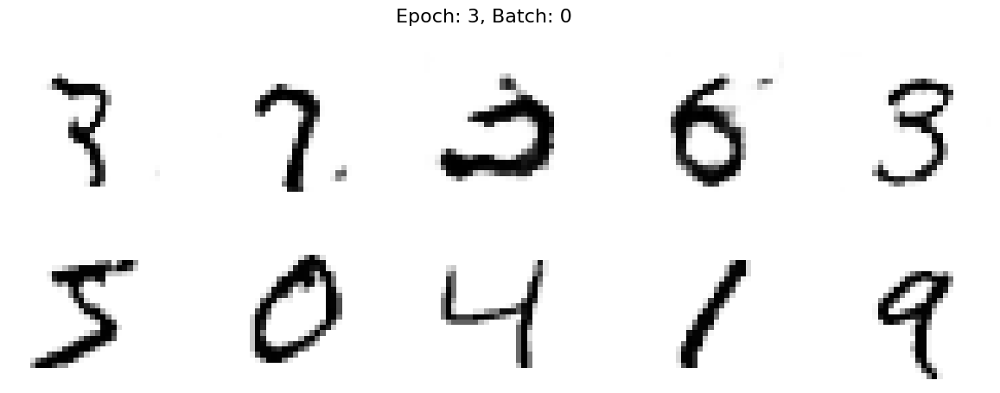

50 [D loss: 0.2637,	 acc.: 89.06%]	[G loss: 2.1299]
100 [D loss: 0.1807,	 acc.: 92.19%]	[G loss: 3.0180]
150 [D loss: 0.1768,	 acc.: 93.75%]	[G loss: 3.5616]
200 [D loss: 0.2096,	 acc.: 92.19%]	[G loss: 3.0872]
250 [D loss: 0.1744,	 acc.: 92.19%]	[G loss: 2.9458]
300 [D loss: 0.3475,	 acc.: 87.50%]	[G loss: 4.0295]
350 [D loss: 0.2071,	 acc.: 93.75%]	[G loss: 3.4740]
400 [D loss: 0.1541,	 acc.: 93.75%]	[G loss: 3.7026]
450 [D loss: 0.2077,	 acc.: 89.06%]	[G loss: 2.8768]
500 [D loss: 0.4294,	 acc.: 81.25%]	[G loss: 2.9766]


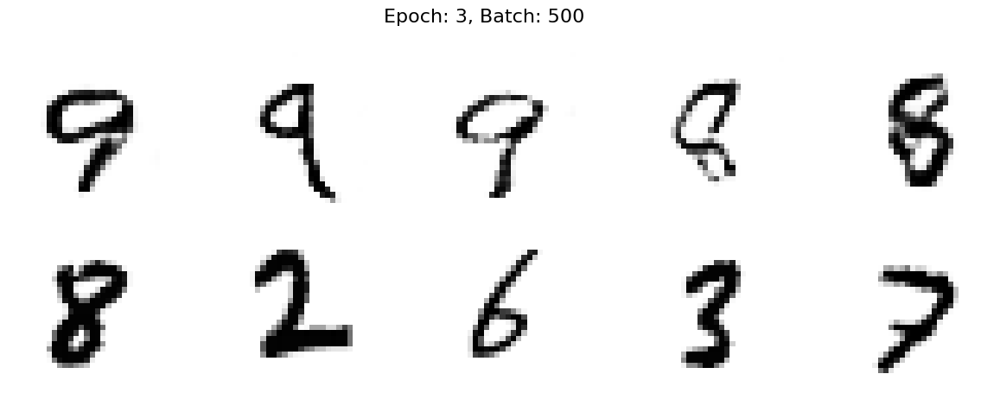

550 [D loss: 0.2360,	 acc.: 85.94%]	[G loss: 2.8653]
600 [D loss: 0.1698,	 acc.: 92.19%]	[G loss: 2.8198]
650 [D loss: 0.1806,	 acc.: 92.19%]	[G loss: 3.5112]
700 [D loss: 0.1026,	 acc.: 98.44%]	[G loss: 3.7726]
750 [D loss: 0.4190,	 acc.: 84.38%]	[G loss: 4.2681]
800 [D loss: 0.2224,	 acc.: 90.62%]	[G loss: 1.9754]
850 [D loss: 0.1681,	 acc.: 92.19%]	[G loss: 2.8014]
900 [D loss: 0.1602,	 acc.: 92.19%]	[G loss: 3.3215]
950 [D loss: 0.1828,	 acc.: 95.31%]	[G loss: 2.5811]
1000 [D loss: 0.3051,	 acc.: 82.81%]	[G loss: 2.9046]


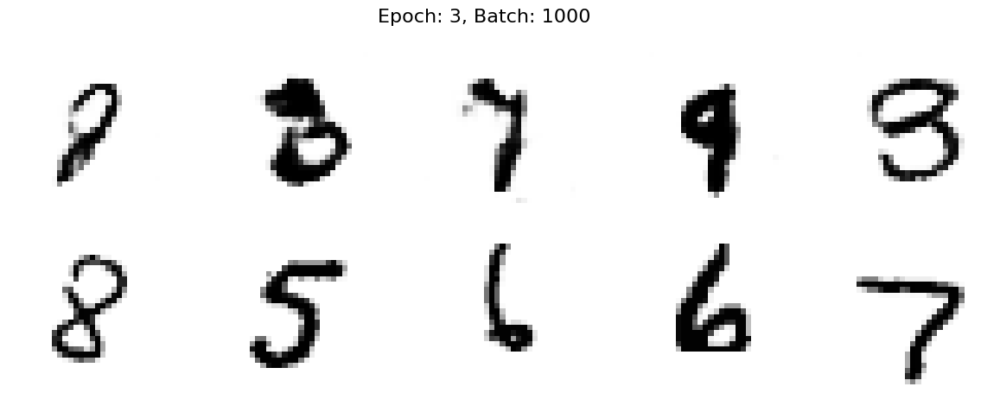

1050 [D loss: 0.2296,	 acc.: 89.06%]	[G loss: 2.9095]
1100 [D loss: 0.1780,	 acc.: 92.19%]	[G loss: 3.5595]
1150 [D loss: 0.2892,	 acc.: 85.94%]	[G loss: 3.0135]
1200 [D loss: 0.2202,	 acc.: 92.19%]	[G loss: 3.1127]
1250 [D loss: 0.2548,	 acc.: 89.06%]	[G loss: 2.7067]
1300 [D loss: 0.1993,	 acc.: 92.19%]	[G loss: 3.9206]
1350 [D loss: 0.1534,	 acc.: 93.75%]	[G loss: 3.7397]
1400 [D loss: 0.2873,	 acc.: 84.38%]	[G loss: 3.2911]
1450 [D loss: 0.2030,	 acc.: 92.19%]	[G loss: 3.5648]
1500 [D loss: 0.0997,	 acc.: 98.44%]	[G loss: 3.2633]


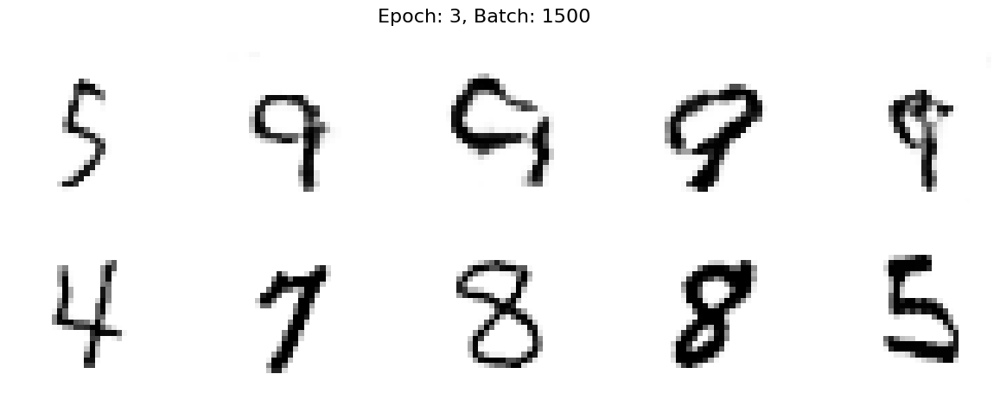

1550 [D loss: 0.2747,	 acc.: 87.50%]	[G loss: 3.3122]
1600 [D loss: 0.2432,	 acc.: 90.62%]	[G loss: 2.4268]
1650 [D loss: 0.3178,	 acc.: 85.94%]	[G loss: 2.6789]
1700 [D loss: 0.2504,	 acc.: 87.50%]	[G loss: 3.5135]
1750 [D loss: 0.1571,	 acc.: 95.31%]	[G loss: 2.9523]
1800 [D loss: 0.1697,	 acc.: 92.19%]	[G loss: 3.3653]
1850 [D loss: 0.2710,	 acc.: 87.50%]	[G loss: 3.3398]


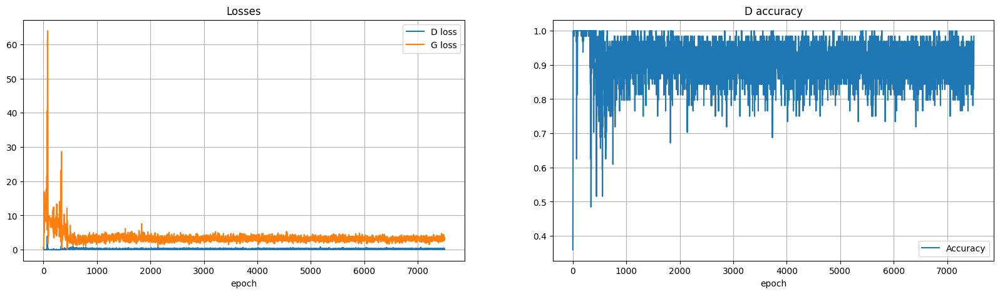

----EPOCH 4-----
0 [D loss: 0.2677,	 acc.: 87.50%]	[G loss: 3.5148]


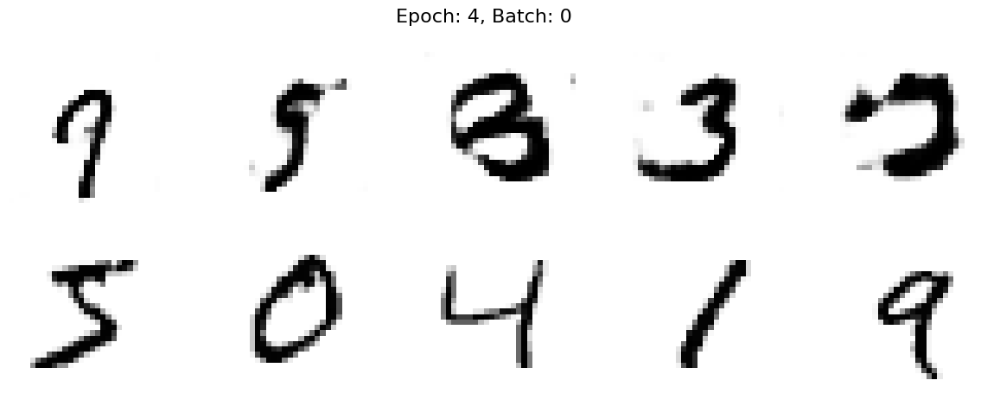

50 [D loss: 0.1323,	 acc.: 92.19%]	[G loss: 2.9084]
100 [D loss: 0.1405,	 acc.: 92.19%]	[G loss: 4.3512]
150 [D loss: 0.2492,	 acc.: 90.62%]	[G loss: 3.2242]
200 [D loss: 0.2839,	 acc.: 84.38%]	[G loss: 2.8601]
250 [D loss: 0.1664,	 acc.: 92.19%]	[G loss: 2.6918]
300 [D loss: 0.3187,	 acc.: 87.50%]	[G loss: 2.6865]
350 [D loss: 0.1985,	 acc.: 92.19%]	[G loss: 2.9096]
400 [D loss: 0.1661,	 acc.: 95.31%]	[G loss: 2.2625]
450 [D loss: 0.1642,	 acc.: 90.62%]	[G loss: 2.6204]
500 [D loss: 0.2598,	 acc.: 87.50%]	[G loss: 2.3665]


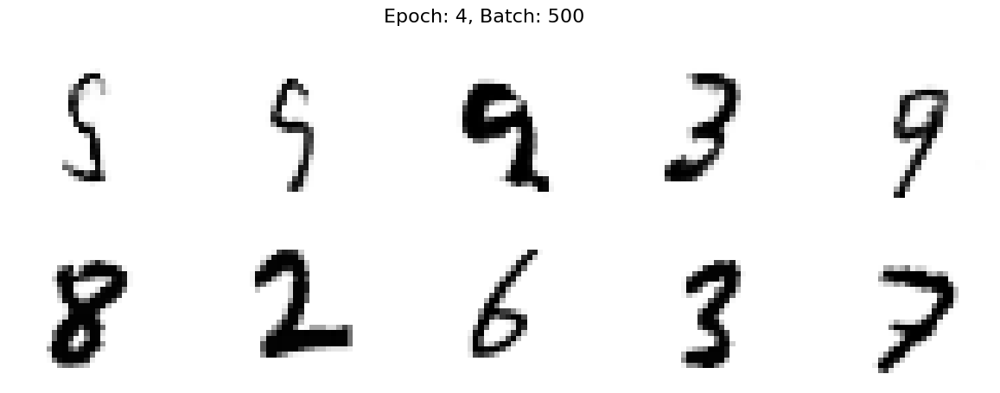

550 [D loss: 0.2053,	 acc.: 90.62%]	[G loss: 3.8256]
600 [D loss: 0.2310,	 acc.: 90.62%]	[G loss: 3.1824]
650 [D loss: 0.1549,	 acc.: 93.75%]	[G loss: 3.2647]
700 [D loss: 0.1173,	 acc.: 95.31%]	[G loss: 4.0218]
750 [D loss: 0.2672,	 acc.: 89.06%]	[G loss: 3.3133]
800 [D loss: 0.2853,	 acc.: 85.94%]	[G loss: 2.8734]
850 [D loss: 0.2794,	 acc.: 89.06%]	[G loss: 3.1437]
900 [D loss: 0.1701,	 acc.: 93.75%]	[G loss: 3.2039]
950 [D loss: 0.1235,	 acc.: 98.44%]	[G loss: 3.0318]
1000 [D loss: 0.1790,	 acc.: 90.62%]	[G loss: 3.1257]


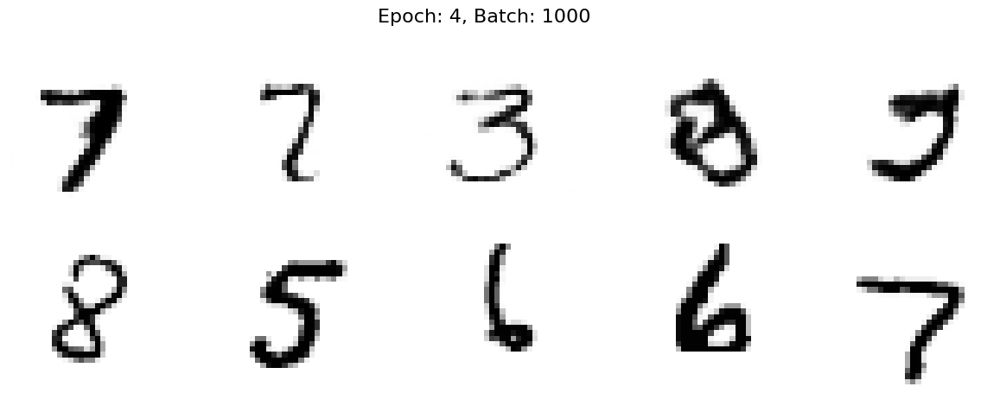

1050 [D loss: 0.2836,	 acc.: 87.50%]	[G loss: 2.3714]
1100 [D loss: 0.1266,	 acc.: 95.31%]	[G loss: 3.3687]
1150 [D loss: 0.2523,	 acc.: 89.06%]	[G loss: 2.4270]
1200 [D loss: 0.1117,	 acc.: 95.31%]	[G loss: 3.5787]
1250 [D loss: 0.3010,	 acc.: 84.38%]	[G loss: 2.1282]
1300 [D loss: 0.1246,	 acc.: 95.31%]	[G loss: 3.1971]
1350 [D loss: 0.0835,	 acc.: 98.44%]	[G loss: 4.4466]
1400 [D loss: 0.3050,	 acc.: 93.75%]	[G loss: 3.8253]
1450 [D loss: 0.1609,	 acc.: 95.31%]	[G loss: 3.1316]
1500 [D loss: 0.1625,	 acc.: 92.19%]	[G loss: 3.6940]


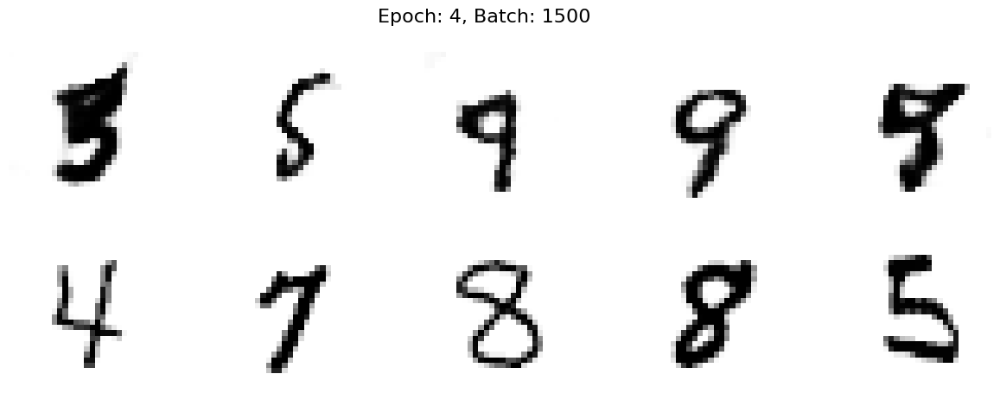

1550 [D loss: 0.1550,	 acc.: 92.19%]	[G loss: 3.3890]
1600 [D loss: 0.1565,	 acc.: 95.31%]	[G loss: 3.5346]
1650 [D loss: 0.1772,	 acc.: 92.19%]	[G loss: 2.2485]
1700 [D loss: 0.1834,	 acc.: 90.62%]	[G loss: 3.3923]
1750 [D loss: 0.1697,	 acc.: 95.31%]	[G loss: 3.2345]
1800 [D loss: 0.1460,	 acc.: 96.88%]	[G loss: 3.0744]
1850 [D loss: 0.2531,	 acc.: 92.19%]	[G loss: 4.1703]


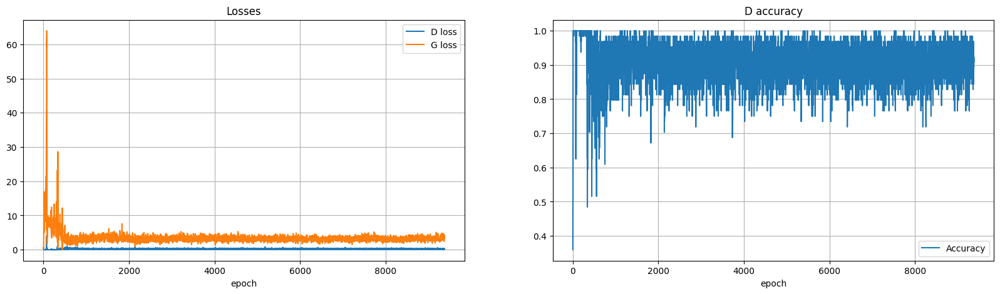

----EPOCH 5-----
0 [D loss: 0.2603,	 acc.: 89.06%]	[G loss: 3.8407]


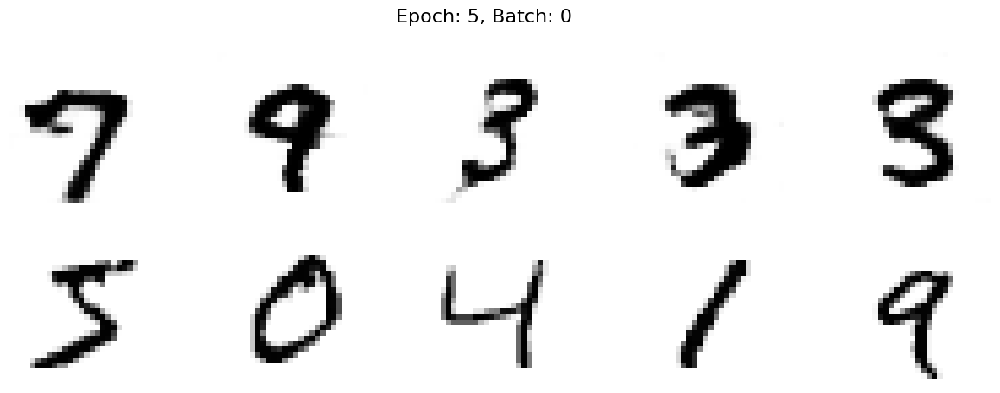

50 [D loss: 0.2399,	 acc.: 90.62%]	[G loss: 3.2442]
100 [D loss: 0.1427,	 acc.: 93.75%]	[G loss: 3.5125]
150 [D loss: 0.2000,	 acc.: 89.06%]	[G loss: 4.5107]
200 [D loss: 0.2026,	 acc.: 87.50%]	[G loss: 2.9878]
250 [D loss: 0.1193,	 acc.: 93.75%]	[G loss: 3.8415]
300 [D loss: 0.3235,	 acc.: 84.38%]	[G loss: 3.7262]
350 [D loss: 0.1156,	 acc.: 95.31%]	[G loss: 3.5929]
400 [D loss: 0.2997,	 acc.: 89.06%]	[G loss: 3.3390]
450 [D loss: 0.1772,	 acc.: 92.19%]	[G loss: 3.2065]
500 [D loss: 0.2591,	 acc.: 85.94%]	[G loss: 3.5765]


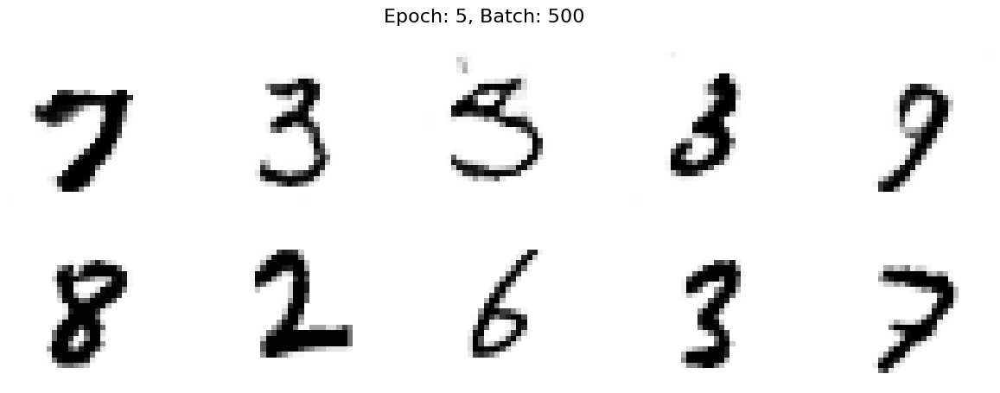

550 [D loss: 0.1124,	 acc.: 98.44%]	[G loss: 3.4924]
600 [D loss: 0.2361,	 acc.: 92.19%]	[G loss: 3.5452]
650 [D loss: 0.1351,	 acc.: 92.19%]	[G loss: 3.8735]
700 [D loss: 0.1489,	 acc.: 93.75%]	[G loss: 3.6193]
750 [D loss: 0.1873,	 acc.: 95.31%]	[G loss: 4.2635]
800 [D loss: 0.3398,	 acc.: 85.94%]	[G loss: 3.1624]
850 [D loss: 0.1843,	 acc.: 93.75%]	[G loss: 3.1155]
900 [D loss: 0.1595,	 acc.: 93.75%]	[G loss: 3.1093]
950 [D loss: 0.2148,	 acc.: 87.50%]	[G loss: 4.3511]
1000 [D loss: 0.2592,	 acc.: 87.50%]	[G loss: 2.7433]


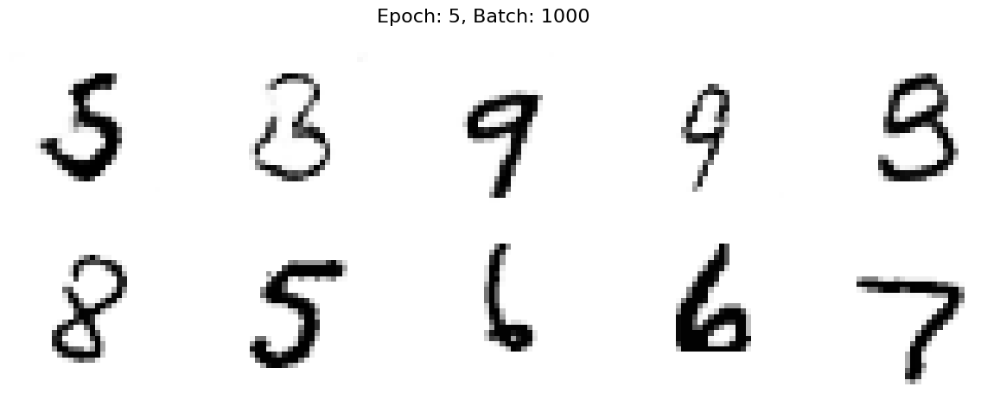

1050 [D loss: 0.4655,	 acc.: 79.69%]	[G loss: 2.8985]
1100 [D loss: 0.0698,	 acc.: 96.88%]	[G loss: 3.5014]
1150 [D loss: 0.1828,	 acc.: 92.19%]	[G loss: 3.5301]
1200 [D loss: 0.1461,	 acc.: 92.19%]	[G loss: 3.9359]
1250 [D loss: 0.2495,	 acc.: 89.06%]	[G loss: 2.7911]
1300 [D loss: 0.1657,	 acc.: 92.19%]	[G loss: 3.2596]
1350 [D loss: 0.1553,	 acc.: 92.19%]	[G loss: 3.5728]
1400 [D loss: 0.1807,	 acc.: 90.62%]	[G loss: 3.9835]
1450 [D loss: 0.1789,	 acc.: 95.31%]	[G loss: 3.4638]
1500 [D loss: 0.0541,	 acc.: 100.00%]	[G loss: 4.2564]


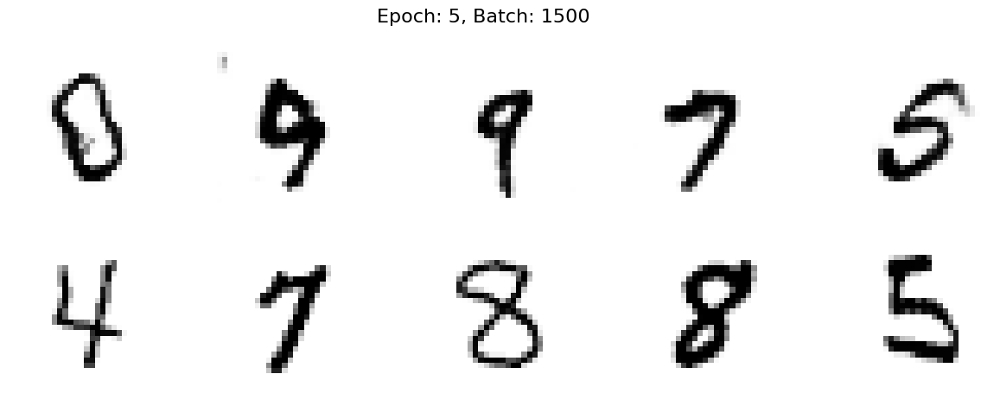

1550 [D loss: 0.1276,	 acc.: 93.75%]	[G loss: 3.7999]
1600 [D loss: 0.1991,	 acc.: 92.19%]	[G loss: 3.8698]
1650 [D loss: 0.1764,	 acc.: 93.75%]	[G loss: 2.5926]
1700 [D loss: 0.1901,	 acc.: 89.06%]	[G loss: 3.6468]
1750 [D loss: 0.1910,	 acc.: 90.62%]	[G loss: 3.6591]
1800 [D loss: 0.1497,	 acc.: 93.75%]	[G loss: 3.9423]
1850 [D loss: 0.1732,	 acc.: 95.31%]	[G loss: 3.4794]


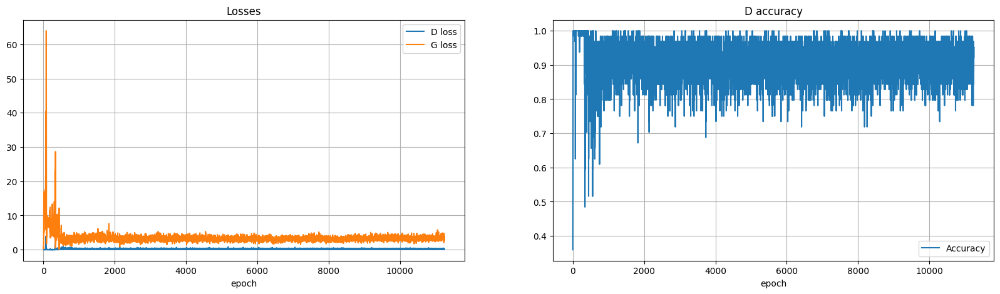

----EPOCH 6-----
0 [D loss: 0.3052,	 acc.: 87.50%]	[G loss: 3.9130]


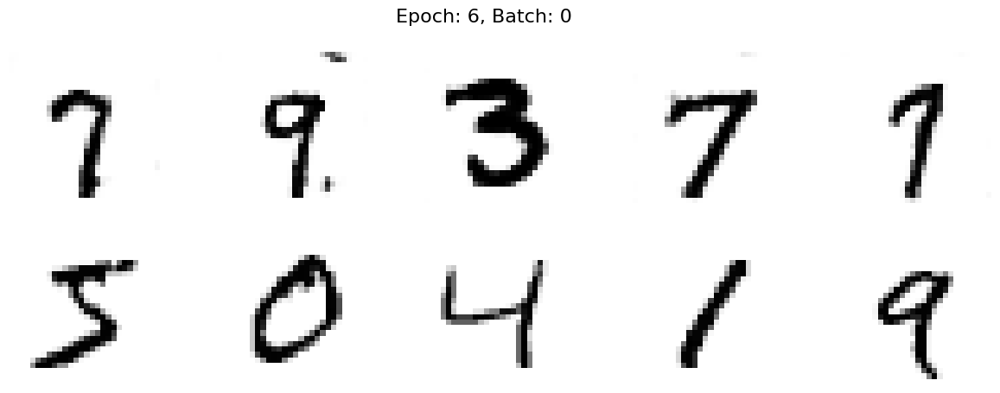

50 [D loss: 0.1836,	 acc.: 90.62%]	[G loss: 2.8026]
100 [D loss: 0.1512,	 acc.: 93.75%]	[G loss: 3.1436]
150 [D loss: 0.1624,	 acc.: 93.75%]	[G loss: 4.2412]
200 [D loss: 0.2256,	 acc.: 89.06%]	[G loss: 3.6805]
250 [D loss: 0.2254,	 acc.: 90.62%]	[G loss: 3.3943]
300 [D loss: 0.1821,	 acc.: 90.62%]	[G loss: 3.6729]
350 [D loss: 0.1311,	 acc.: 95.31%]	[G loss: 3.9920]
400 [D loss: 0.1279,	 acc.: 96.88%]	[G loss: 3.3929]
450 [D loss: 0.1446,	 acc.: 95.31%]	[G loss: 2.9643]
500 [D loss: 0.2389,	 acc.: 89.06%]	[G loss: 3.8538]


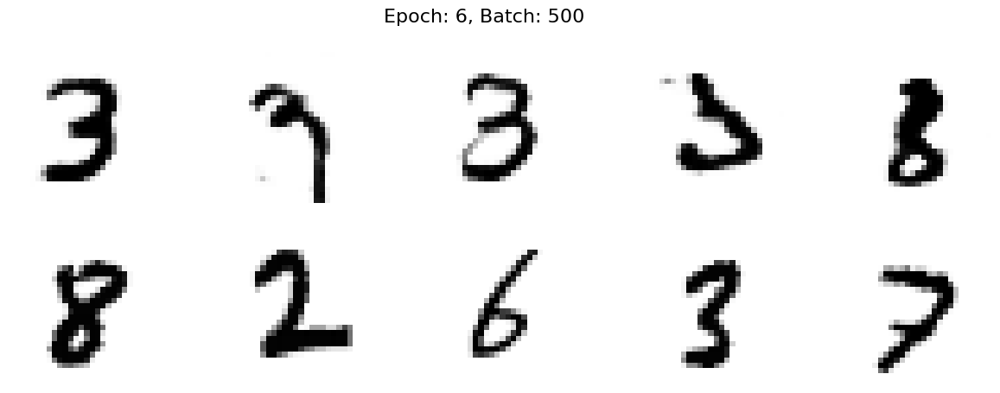

550 [D loss: 0.1709,	 acc.: 89.06%]	[G loss: 4.0911]
600 [D loss: 0.2956,	 acc.: 85.94%]	[G loss: 3.4993]
650 [D loss: 0.2494,	 acc.: 90.62%]	[G loss: 4.1815]
700 [D loss: 0.1293,	 acc.: 95.31%]	[G loss: 3.7840]
750 [D loss: 0.2739,	 acc.: 92.19%]	[G loss: 3.6473]
800 [D loss: 0.3716,	 acc.: 82.81%]	[G loss: 3.0012]
850 [D loss: 0.1396,	 acc.: 93.75%]	[G loss: 3.8339]
900 [D loss: 0.1868,	 acc.: 92.19%]	[G loss: 3.5817]
950 [D loss: 0.0996,	 acc.: 96.88%]	[G loss: 4.1985]
1000 [D loss: 0.2637,	 acc.: 89.06%]	[G loss: 2.6050]


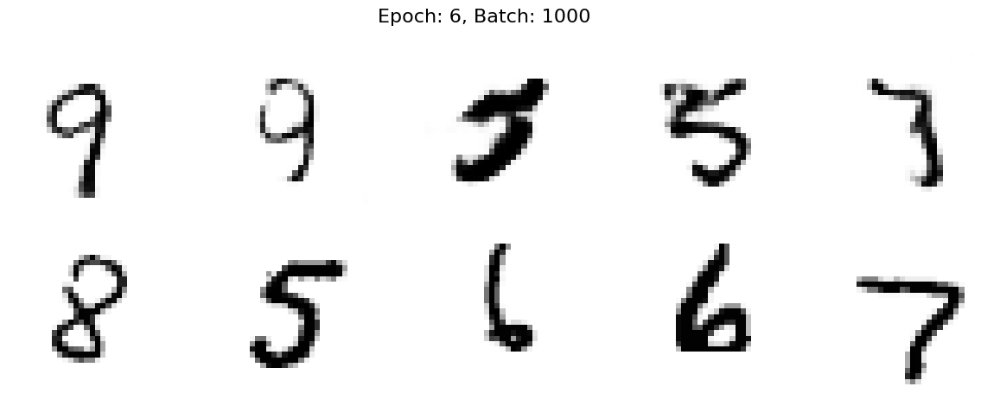

1050 [D loss: 0.1982,	 acc.: 87.50%]	[G loss: 3.9348]
1100 [D loss: 0.0825,	 acc.: 96.88%]	[G loss: 4.0978]
1150 [D loss: 0.1179,	 acc.: 92.19%]	[G loss: 3.7164]
1200 [D loss: 0.1227,	 acc.: 95.31%]	[G loss: 3.6723]
1250 [D loss: 0.2478,	 acc.: 85.94%]	[G loss: 3.5715]
1300 [D loss: 0.2469,	 acc.: 92.19%]	[G loss: 3.4328]
1350 [D loss: 0.1254,	 acc.: 93.75%]	[G loss: 3.6851]
1400 [D loss: 0.1728,	 acc.: 93.75%]	[G loss: 4.4609]
1450 [D loss: 0.1925,	 acc.: 92.19%]	[G loss: 4.2414]
1500 [D loss: 0.1221,	 acc.: 96.88%]	[G loss: 3.6331]


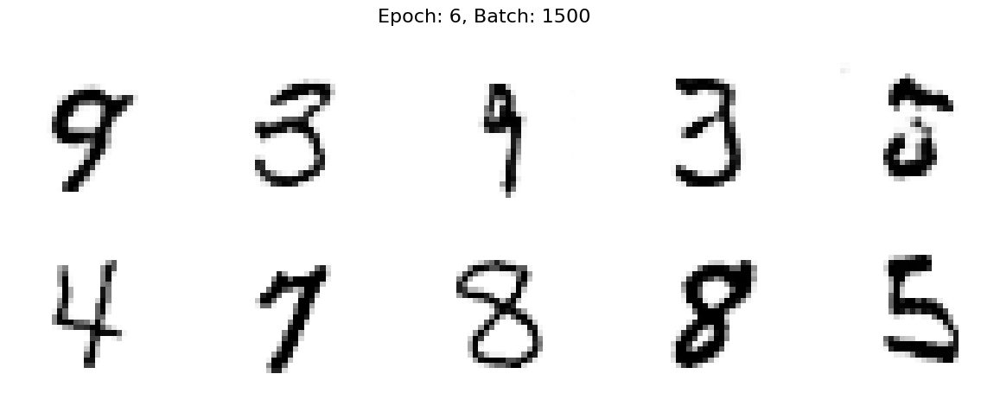

1550 [D loss: 0.2080,	 acc.: 93.75%]	[G loss: 3.9630]
1600 [D loss: 0.2455,	 acc.: 92.19%]	[G loss: 3.7829]
1650 [D loss: 0.3176,	 acc.: 90.62%]	[G loss: 4.1577]
1700 [D loss: 0.2506,	 acc.: 85.94%]	[G loss: 4.1030]
1750 [D loss: 0.2860,	 acc.: 89.06%]	[G loss: 5.1636]
1800 [D loss: 0.1107,	 acc.: 96.88%]	[G loss: 4.2443]
1850 [D loss: 0.3176,	 acc.: 85.94%]	[G loss: 5.0895]


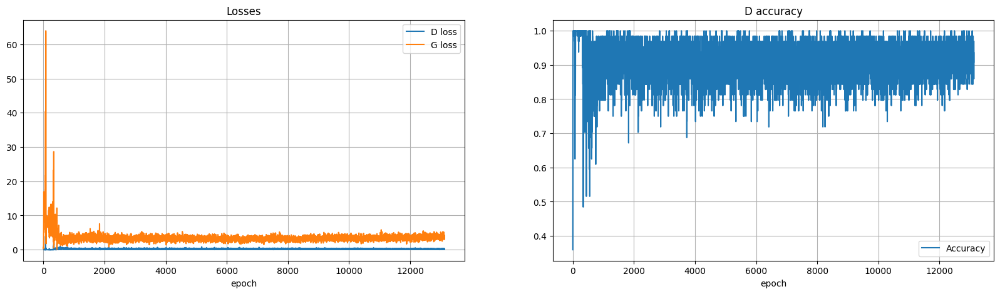

----EPOCH 7-----
0 [D loss: 0.1514,	 acc.: 93.75%]	[G loss: 3.9472]


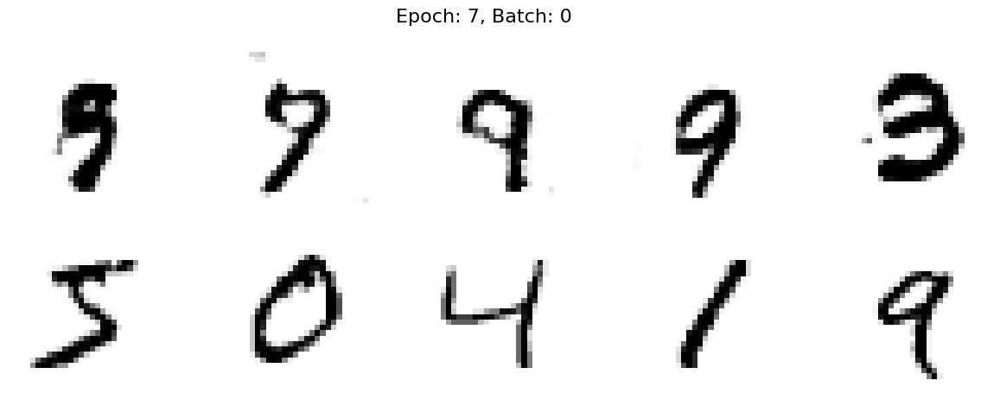

50 [D loss: 0.2375,	 acc.: 89.06%]	[G loss: 4.1157]
100 [D loss: 0.1547,	 acc.: 90.62%]	[G loss: 4.1280]
150 [D loss: 0.1570,	 acc.: 93.75%]	[G loss: 4.1263]
200 [D loss: 0.1753,	 acc.: 96.88%]	[G loss: 4.2202]
250 [D loss: 0.1988,	 acc.: 90.62%]	[G loss: 4.8175]
300 [D loss: 0.1198,	 acc.: 95.31%]	[G loss: 3.8493]
350 [D loss: 0.2069,	 acc.: 89.06%]	[G loss: 4.0840]
400 [D loss: 0.1888,	 acc.: 92.19%]	[G loss: 3.3654]
450 [D loss: 0.1399,	 acc.: 92.19%]	[G loss: 3.2613]
500 [D loss: 0.1724,	 acc.: 92.19%]	[G loss: 3.3475]


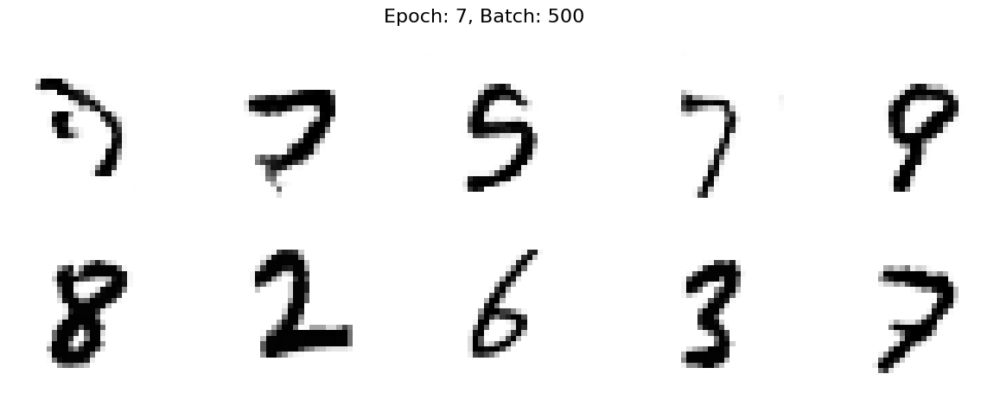

550 [D loss: 0.1337,	 acc.: 93.75%]	[G loss: 4.0645]
600 [D loss: 0.1706,	 acc.: 93.75%]	[G loss: 3.4575]
650 [D loss: 0.1742,	 acc.: 93.75%]	[G loss: 4.5432]
700 [D loss: 0.1386,	 acc.: 92.19%]	[G loss: 3.8413]
750 [D loss: 0.2870,	 acc.: 87.50%]	[G loss: 3.5139]
800 [D loss: 0.2566,	 acc.: 87.50%]	[G loss: 4.0723]
850 [D loss: 0.0886,	 acc.: 96.88%]	[G loss: 4.1949]
900 [D loss: 0.1053,	 acc.: 93.75%]	[G loss: 3.1854]
950 [D loss: 0.1308,	 acc.: 95.31%]	[G loss: 3.6592]
1000 [D loss: 0.2505,	 acc.: 92.19%]	[G loss: 3.7525]


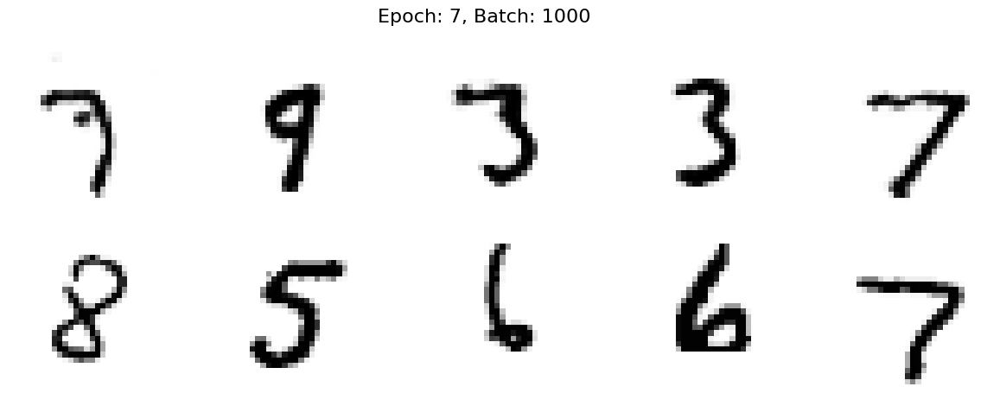

1050 [D loss: 0.1140,	 acc.: 96.88%]	[G loss: 4.0489]
1100 [D loss: 0.1002,	 acc.: 95.31%]	[G loss: 4.7094]
1150 [D loss: 0.1174,	 acc.: 95.31%]	[G loss: 4.2204]
1200 [D loss: 0.1222,	 acc.: 96.88%]	[G loss: 5.0714]
1250 [D loss: 0.1161,	 acc.: 95.31%]	[G loss: 4.2354]
1300 [D loss: 0.1883,	 acc.: 92.19%]	[G loss: 4.3672]
1350 [D loss: 0.1314,	 acc.: 96.88%]	[G loss: 3.8055]
1400 [D loss: 0.2203,	 acc.: 92.19%]	[G loss: 4.2167]
1450 [D loss: 0.0930,	 acc.: 96.88%]	[G loss: 3.7276]
1500 [D loss: 0.1065,	 acc.: 95.31%]	[G loss: 3.7851]


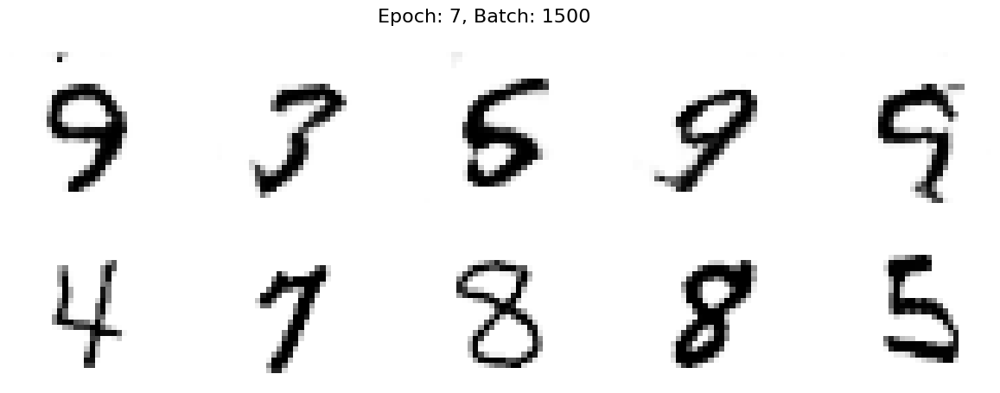

1550 [D loss: 0.1159,	 acc.: 95.31%]	[G loss: 4.2683]
1600 [D loss: 0.2330,	 acc.: 87.50%]	[G loss: 3.1965]
1650 [D loss: 0.1877,	 acc.: 92.19%]	[G loss: 3.0888]
1700 [D loss: 0.2926,	 acc.: 89.06%]	[G loss: 3.3195]
1750 [D loss: 0.2971,	 acc.: 89.06%]	[G loss: 5.2373]
1800 [D loss: 0.1302,	 acc.: 93.75%]	[G loss: 5.1531]
1850 [D loss: 0.1967,	 acc.: 90.62%]	[G loss: 5.0947]


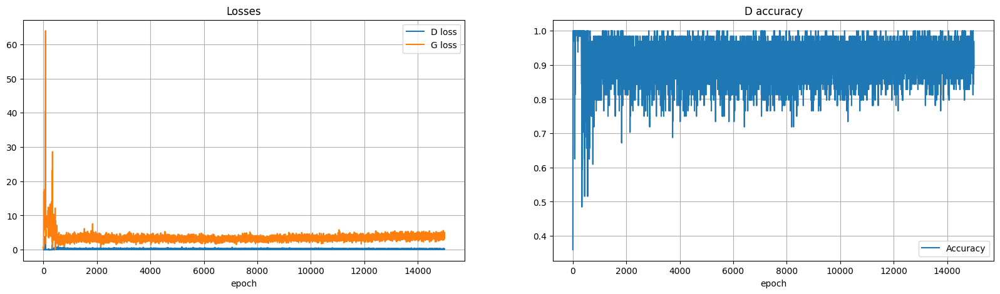

----EPOCH 8-----
0 [D loss: 0.1740,	 acc.: 92.19%]	[G loss: 3.8205]


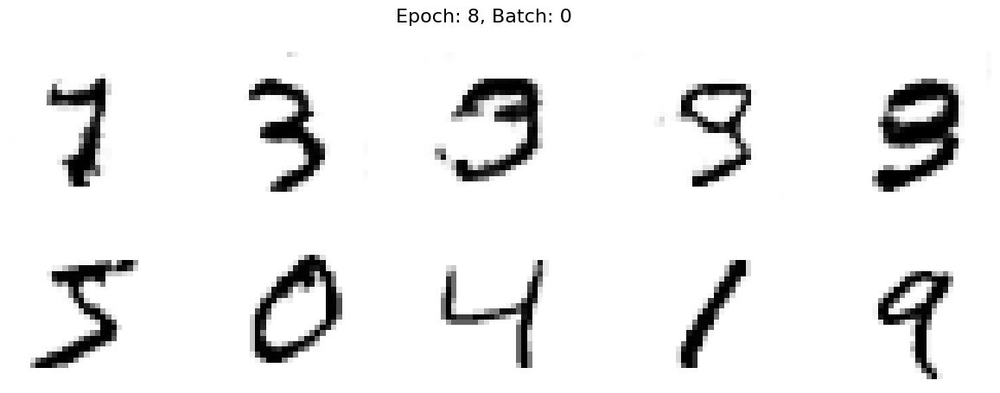

50 [D loss: 0.1752,	 acc.: 90.62%]	[G loss: 3.8964]
100 [D loss: 0.0659,	 acc.: 96.88%]	[G loss: 5.0151]
150 [D loss: 0.1276,	 acc.: 93.75%]	[G loss: 4.6237]
200 [D loss: 0.1590,	 acc.: 93.75%]	[G loss: 4.3034]
250 [D loss: 0.1721,	 acc.: 96.88%]	[G loss: 3.5608]
300 [D loss: 0.1740,	 acc.: 92.19%]	[G loss: 3.8405]
350 [D loss: 0.2534,	 acc.: 92.19%]	[G loss: 4.5152]
400 [D loss: 0.2559,	 acc.: 85.94%]	[G loss: 3.6974]
450 [D loss: 0.1325,	 acc.: 95.31%]	[G loss: 3.9937]
500 [D loss: 0.1674,	 acc.: 93.75%]	[G loss: 2.5368]


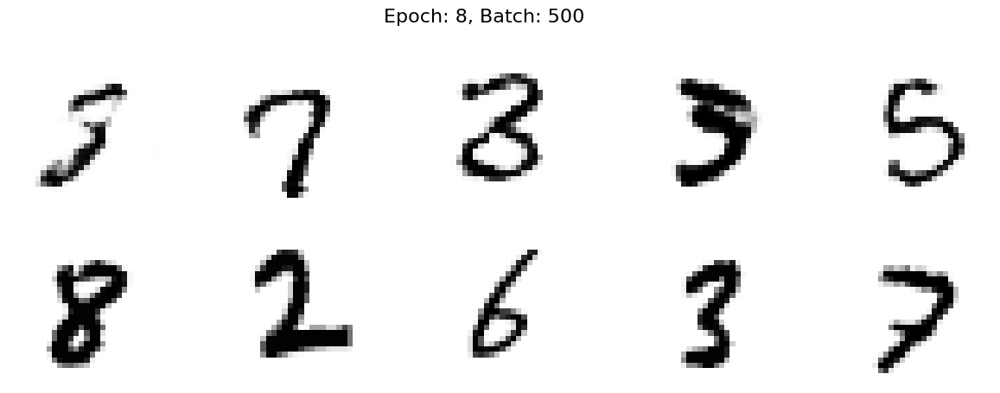

550 [D loss: 0.2069,	 acc.: 92.19%]	[G loss: 4.4618]
600 [D loss: 0.1469,	 acc.: 95.31%]	[G loss: 3.7321]
650 [D loss: 0.0926,	 acc.: 98.44%]	[G loss: 4.9492]
700 [D loss: 0.2092,	 acc.: 93.75%]	[G loss: 3.6328]
750 [D loss: 0.3585,	 acc.: 85.94%]	[G loss: 4.4119]
800 [D loss: 0.2542,	 acc.: 87.50%]	[G loss: 4.2316]
850 [D loss: 0.1078,	 acc.: 95.31%]	[G loss: 4.0433]
900 [D loss: 0.1319,	 acc.: 95.31%]	[G loss: 4.4511]
950 [D loss: 0.1489,	 acc.: 95.31%]	[G loss: 4.4395]
1000 [D loss: 0.2257,	 acc.: 92.19%]	[G loss: 3.9357]


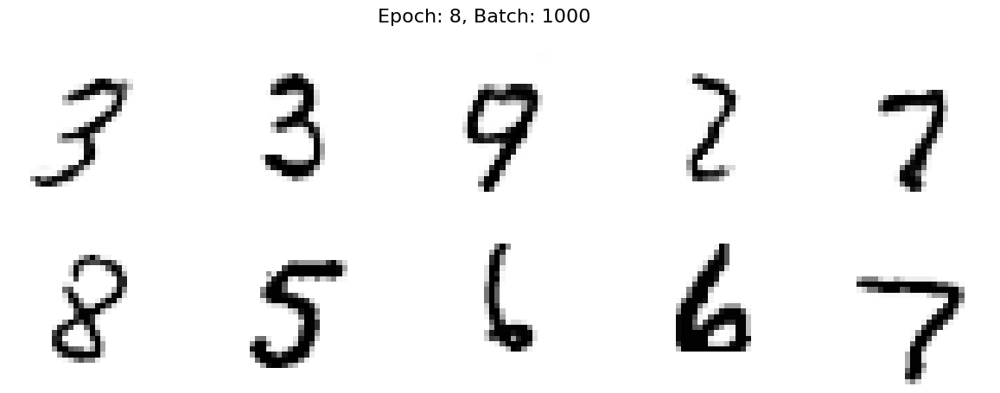

1050 [D loss: 0.1561,	 acc.: 92.19%]	[G loss: 3.7912]
1100 [D loss: 0.1722,	 acc.: 92.19%]	[G loss: 5.1055]
1150 [D loss: 0.1258,	 acc.: 95.31%]	[G loss: 5.0544]
1200 [D loss: 0.1149,	 acc.: 96.88%]	[G loss: 4.9744]
1250 [D loss: 0.2610,	 acc.: 84.38%]	[G loss: 3.8728]
1300 [D loss: 0.1529,	 acc.: 90.62%]	[G loss: 3.7640]
1350 [D loss: 0.0510,	 acc.: 100.00%]	[G loss: 3.1515]
1400 [D loss: 0.1153,	 acc.: 95.31%]	[G loss: 4.7791]
1450 [D loss: 0.0968,	 acc.: 95.31%]	[G loss: 4.9618]
1500 [D loss: 0.1258,	 acc.: 96.88%]	[G loss: 5.1161]


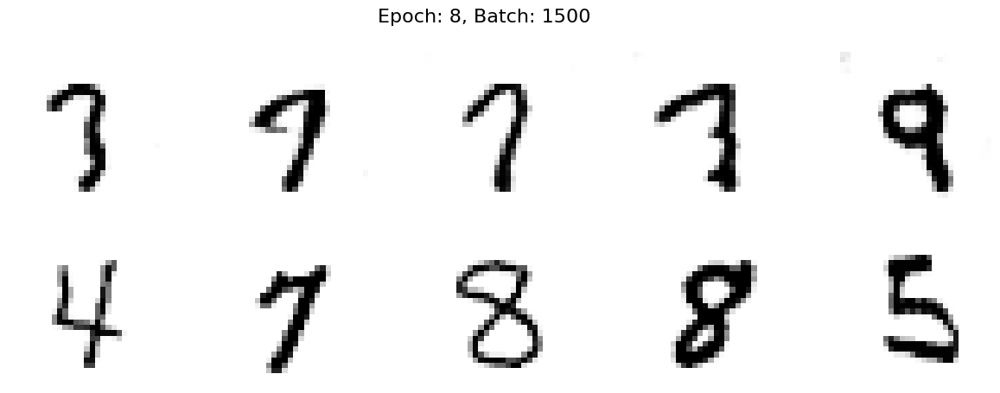

1550 [D loss: 0.1247,	 acc.: 93.75%]	[G loss: 4.8359]
1600 [D loss: 0.1137,	 acc.: 95.31%]	[G loss: 3.0139]
1650 [D loss: 0.2045,	 acc.: 90.62%]	[G loss: 3.7792]
1700 [D loss: 0.2107,	 acc.: 90.62%]	[G loss: 3.8780]
1750 [D loss: 0.2165,	 acc.: 93.75%]	[G loss: 5.2700]
1800 [D loss: 0.0576,	 acc.: 98.44%]	[G loss: 4.1367]
1850 [D loss: 0.2115,	 acc.: 89.06%]	[G loss: 4.2155]


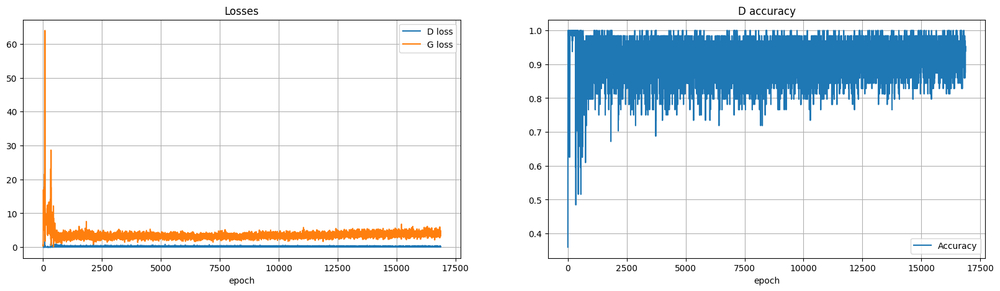

----EPOCH 9-----
0 [D loss: 0.2168,	 acc.: 87.50%]	[G loss: 3.7779]


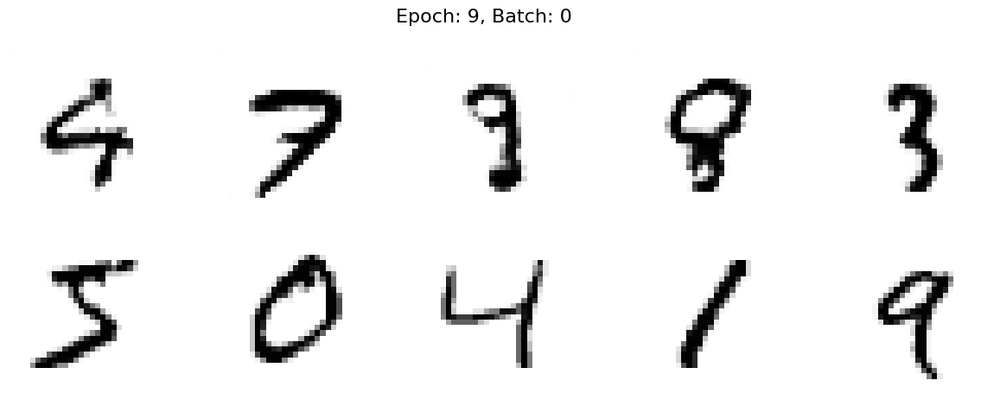

50 [D loss: 0.0606,	 acc.: 98.44%]	[G loss: 4.0382]
100 [D loss: 0.1601,	 acc.: 93.75%]	[G loss: 5.5313]
150 [D loss: 0.0659,	 acc.: 98.44%]	[G loss: 4.7393]
200 [D loss: 0.0771,	 acc.: 96.88%]	[G loss: 4.1536]
250 [D loss: 0.1980,	 acc.: 95.31%]	[G loss: 4.5643]
300 [D loss: 0.1460,	 acc.: 92.19%]	[G loss: 4.7030]
350 [D loss: 0.2121,	 acc.: 89.06%]	[G loss: 3.5542]
400 [D loss: 0.3147,	 acc.: 87.50%]	[G loss: 4.4561]
450 [D loss: 0.0891,	 acc.: 96.88%]	[G loss: 4.0557]
500 [D loss: 0.2488,	 acc.: 87.50%]	[G loss: 3.5938]


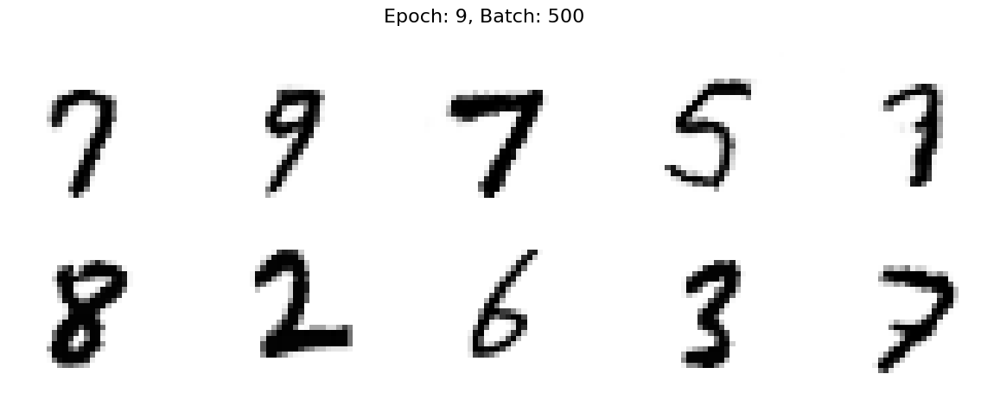

550 [D loss: 0.0582,	 acc.: 98.44%]	[G loss: 4.7383]
600 [D loss: 0.1624,	 acc.: 93.75%]	[G loss: 4.7442]
650 [D loss: 0.1196,	 acc.: 96.88%]	[G loss: 4.6443]
700 [D loss: 0.1724,	 acc.: 92.19%]	[G loss: 4.1206]
750 [D loss: 0.2022,	 acc.: 93.75%]	[G loss: 5.3293]
800 [D loss: 0.1761,	 acc.: 95.31%]	[G loss: 4.2355]
850 [D loss: 0.1375,	 acc.: 92.19%]	[G loss: 3.6794]
900 [D loss: 0.0740,	 acc.: 98.44%]	[G loss: 3.3687]
950 [D loss: 0.0994,	 acc.: 95.31%]	[G loss: 4.4137]
1000 [D loss: 0.1547,	 acc.: 90.62%]	[G loss: 3.7235]


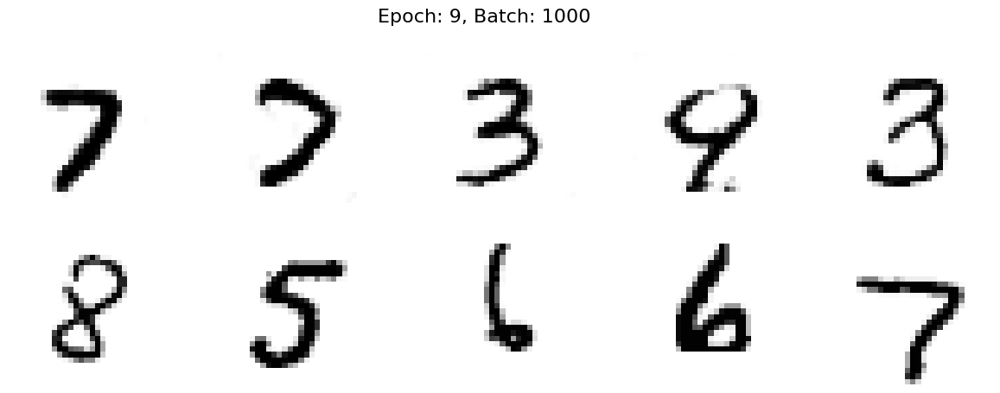

1050 [D loss: 0.1151,	 acc.: 96.88%]	[G loss: 4.6858]
1100 [D loss: 0.1330,	 acc.: 95.31%]	[G loss: 4.4730]
1150 [D loss: 0.2022,	 acc.: 92.19%]	[G loss: 4.2010]
1200 [D loss: 0.1593,	 acc.: 92.19%]	[G loss: 4.7638]
1250 [D loss: 0.2365,	 acc.: 90.62%]	[G loss: 3.6280]
1300 [D loss: 0.0803,	 acc.: 96.88%]	[G loss: 4.4753]
1350 [D loss: 0.0944,	 acc.: 98.44%]	[G loss: 3.0559]
1400 [D loss: 0.1168,	 acc.: 95.31%]	[G loss: 4.8675]
1450 [D loss: 0.1651,	 acc.: 93.75%]	[G loss: 5.3210]
1500 [D loss: 0.1533,	 acc.: 95.31%]	[G loss: 4.4290]


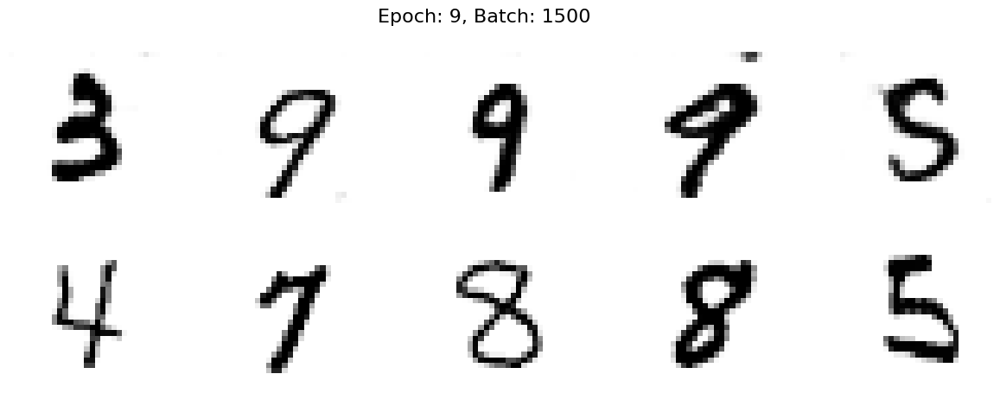

1550 [D loss: 0.1699,	 acc.: 93.75%]	[G loss: 4.6725]
1600 [D loss: 0.0902,	 acc.: 95.31%]	[G loss: 3.9083]
1650 [D loss: 0.1797,	 acc.: 89.06%]	[G loss: 3.9243]
1700 [D loss: 0.2290,	 acc.: 95.31%]	[G loss: 5.2585]
1750 [D loss: 0.1633,	 acc.: 92.19%]	[G loss: 5.3004]
1800 [D loss: 0.0830,	 acc.: 96.88%]	[G loss: 4.6449]
1850 [D loss: 0.2696,	 acc.: 89.06%]	[G loss: 5.4860]


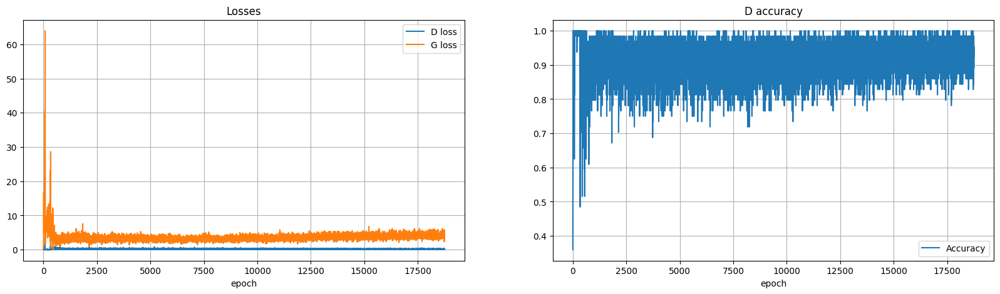

In [ ]:
train(X_train, generator, discriminator, combined, epochs=10, batch_size=32, sample_interval=100)

> Sinceramente estoy sorprendido con los resultados, ya que la DCGAN es capaz de generar número de buena calidad. Sin embargo, hay una clara tendencia hacia 9, 5, 3 y 7, es posible que me haya topado con un colapso modal ya que el generador ha visto que puede engañar al discriminador con esos número y centra la generación en ellos.

> De manera complementaria a este análisis/ejecución volví a ejecutar el fit pero modificando el plot para ver más muestras y asegurarme de que estaba en lo cierto y me encontraba ante un caso de colapso modal, ese el resultado:

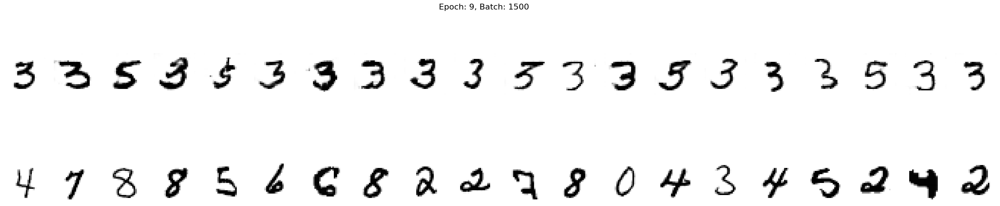

> Intenaré mitigarlo desarrollando una arquitectura más compleja. Además, el accuracy parece estar bastante alto, añadiré alguna capa de regulacion como las dropouts o L2 para intentar reducirlo.


# Propuestas de mejora:


1.   Usar el mismo número de capas convulucionales en generador y discriminador (arquitectura "simétrica").
2.   Usar regularización.
3.   Aumentar el número de capas.
4.   Combinar 2 y 3.


# Primera oportunidad de mejora


> Al fin y al cabo, el generador tiene que competir con el discriminador y viceversa, entonces considero que puede ser interesante igualar las fuerzas de ambos. Voy a tratar de buscar un equilibrio estableciendo una arquitectura "simetrica".





## Generator definition

> Voy a mantener la configuración del baseline dado que tiene buenos resultados.

In [ ]:
def create_generator():

    input = Input(shape=(100))

    x = Dense(7 * 7 * 128)(input)
    x = Reshape((7, 7, 128))(x)

    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2DTranspose(32, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    output = Conv2DTranspose(1, kernel_size=3, strides=1, padding="same", activation="tanh")(x)

    generator = Model(input, output)

    return generator

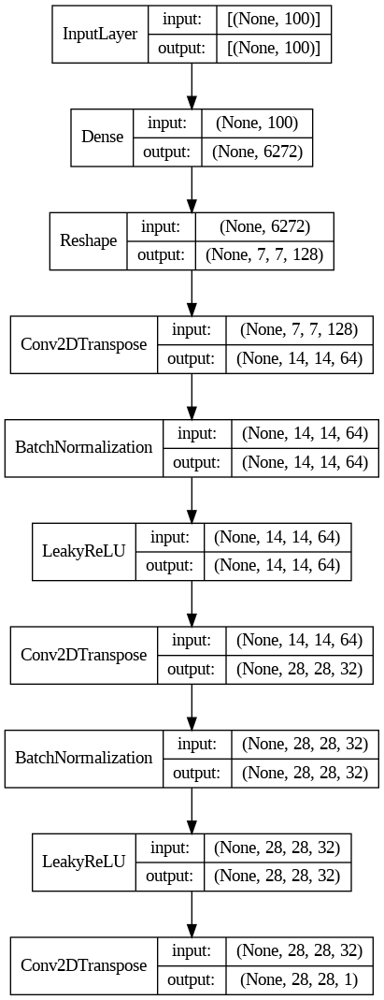

In [ ]:
generator = create_generator()
plot_model(generator, show_shapes=True, show_layer_names=False)

## Discriminator definition

> He hecho alguna modificación, he añadido la normalización entre capas, y he cambiado el número de filtros para analizar los resultados de la DCGAN simétrica

In [ ]:
def create_discriminator():
    input = Input(shape=(28, 28, 1))

    # Rellene con la red neuronal convolucional deseada

    x = Conv2D(32, kernel_size=3, strides=2, padding="same")(input)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2D(64, kernel_size=3, strides=2, padding="same")(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)


    x = Flatten()(x)

    output =  Dense(1, activation="sigmoid")(x)

    discriminator = Model(input, output)

    return discriminator

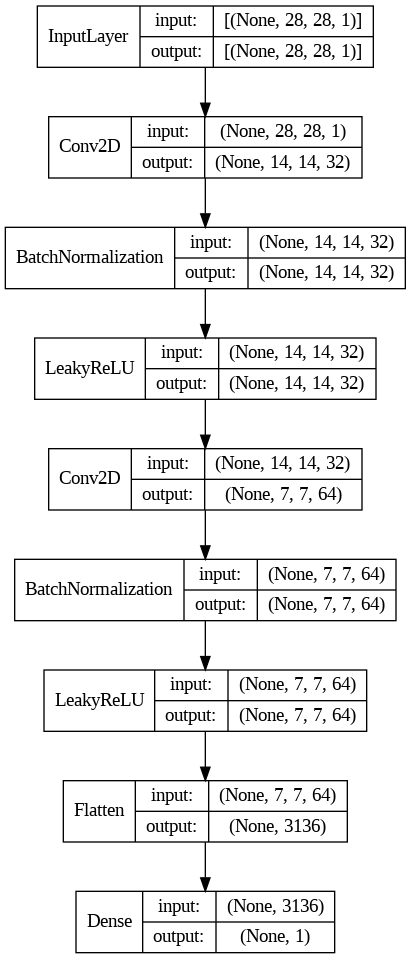

In [ ]:
discriminator = create_discriminator()
plot_model(discriminator, show_shapes=True, show_layer_names=False)

## GAN model definition

In [ ]:
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
discriminator.trainable = False

z = Input(shape=(100,))
img = generator(z)
validity = discriminator(img)

combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam())

## Análisis de resultados

----EPOCH 0-----
0 [D loss: 1.2149,	 acc.: 21.88%]	[G loss: 0.6559]


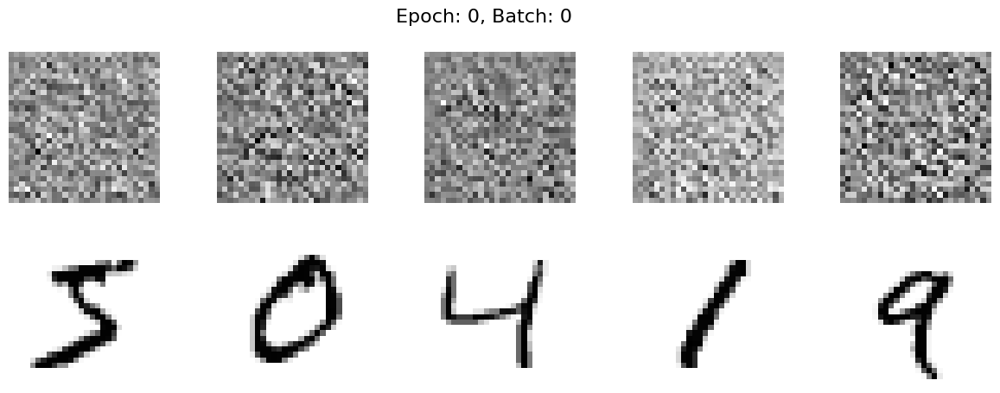

50 [D loss: 0.0491,	 acc.: 98.44%]	[G loss: 0.5788]
100 [D loss: 0.0018,	 acc.: 100.00%]	[G loss: 0.0522]
150 [D loss: 0.0013,	 acc.: 100.00%]	[G loss: 0.0284]
200 [D loss: 0.0008,	 acc.: 100.00%]	[G loss: 0.0589]
250 [D loss: 0.0004,	 acc.: 100.00%]	[G loss: 0.0169]
300 [D loss: 0.0002,	 acc.: 100.00%]	[G loss: 0.0336]
350 [D loss: 0.0001,	 acc.: 100.00%]	[G loss: 0.0298]
400 [D loss: 0.0003,	 acc.: 100.00%]	[G loss: 0.0680]
450 [D loss: 0.0001,	 acc.: 100.00%]	[G loss: 0.0396]
500 [D loss: 0.0001,	 acc.: 100.00%]	[G loss: 0.0769]


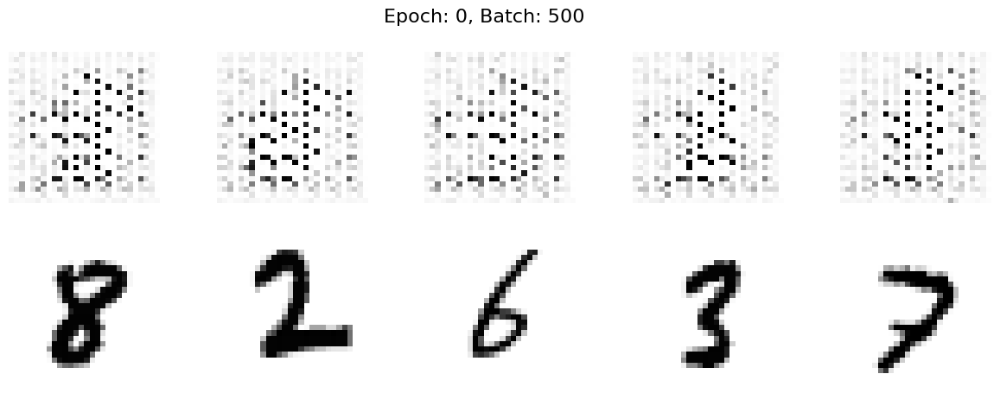

550 [D loss: 0.0006,	 acc.: 100.00%]	[G loss: 0.2902]
600 [D loss: 0.0003,	 acc.: 100.00%]	[G loss: 0.4232]
650 [D loss: 0.0001,	 acc.: 100.00%]	[G loss: 1.4392]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.2784]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.1663]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.1364]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0917]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0742]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0976]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0997]


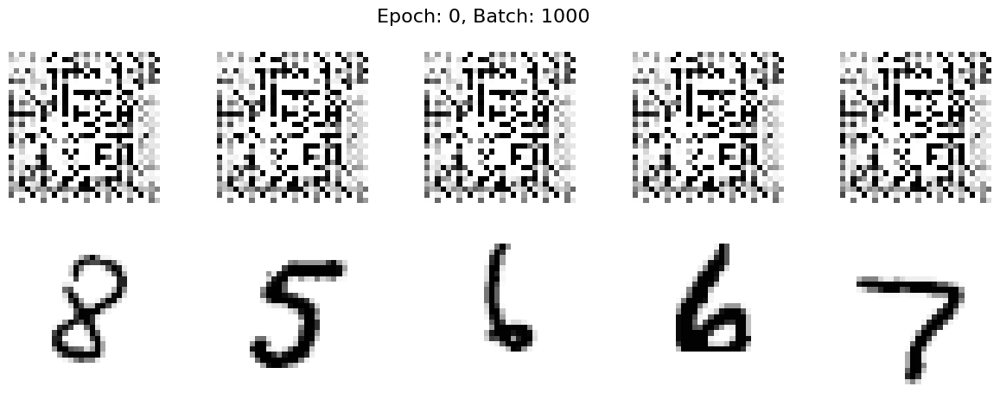

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.1853]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.2125]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.2099]
1200 [D loss: 0.0002,	 acc.: 100.00%]	[G loss: 0.1156]
1250 [D loss: 0.0001,	 acc.: 100.00%]	[G loss: 0.0342]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0175]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0121]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0075]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0062]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0058]


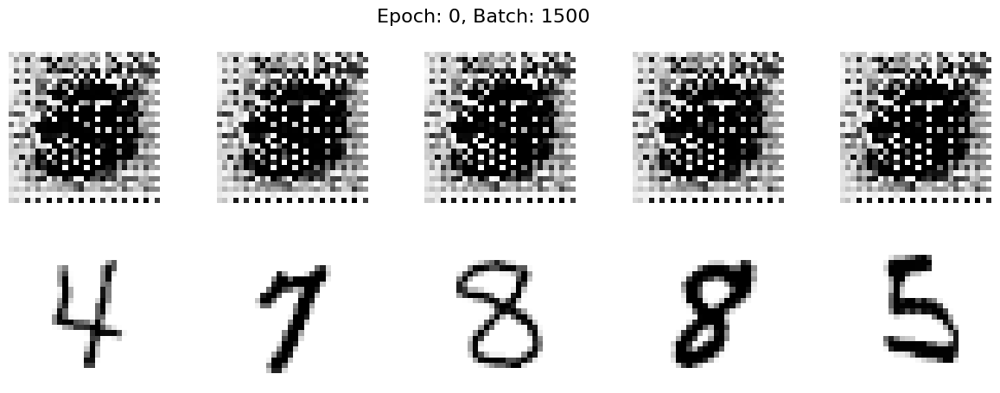

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0026]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0031]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0019]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0019]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0016]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0012]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0010]


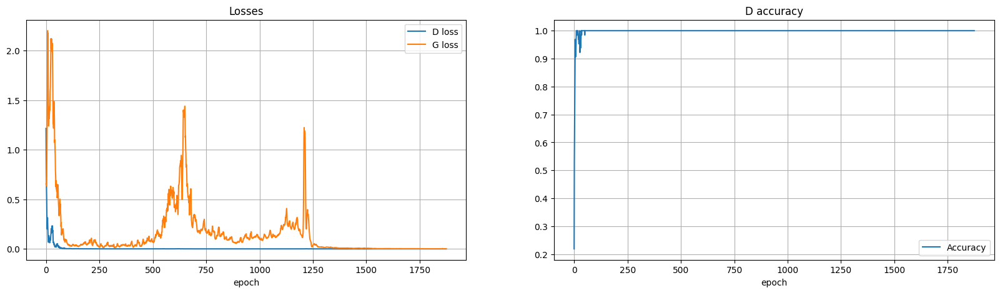

----EPOCH 1-----
0 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0008]


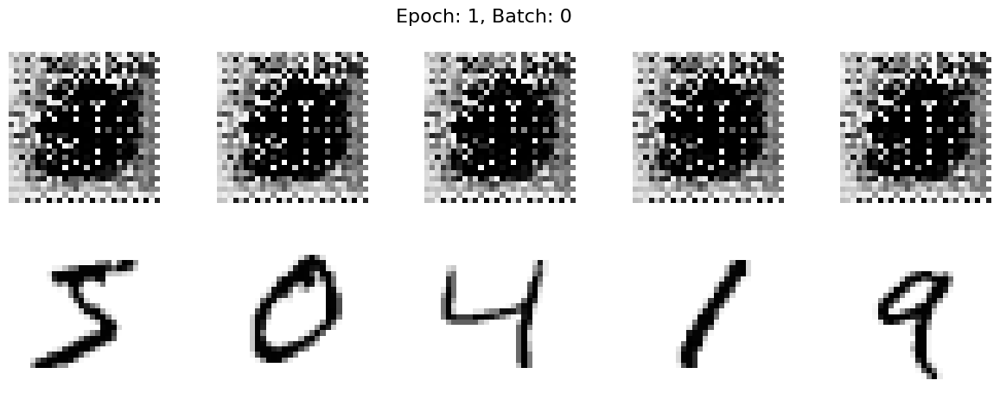

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0009]
100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0007]
150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0010]
200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0009]
250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0009]
300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0006]
350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0007]
400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0006]
450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0006]
500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]


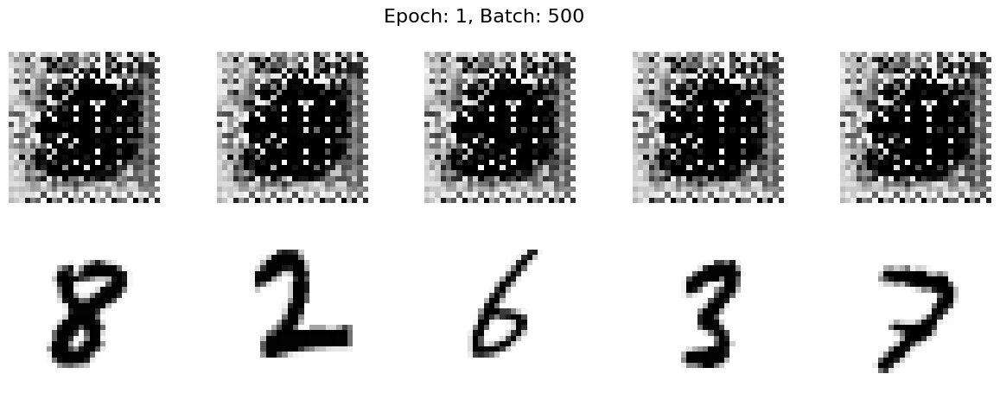

550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0005]
650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0006]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0005]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]


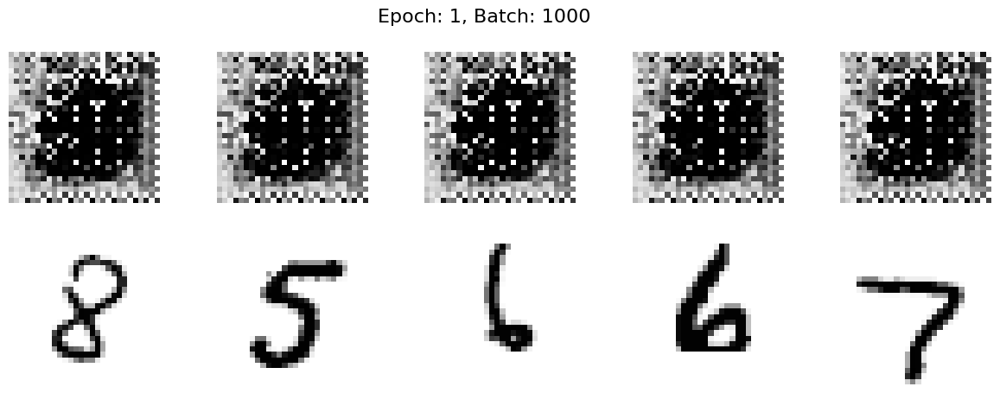

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0005]
1200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]


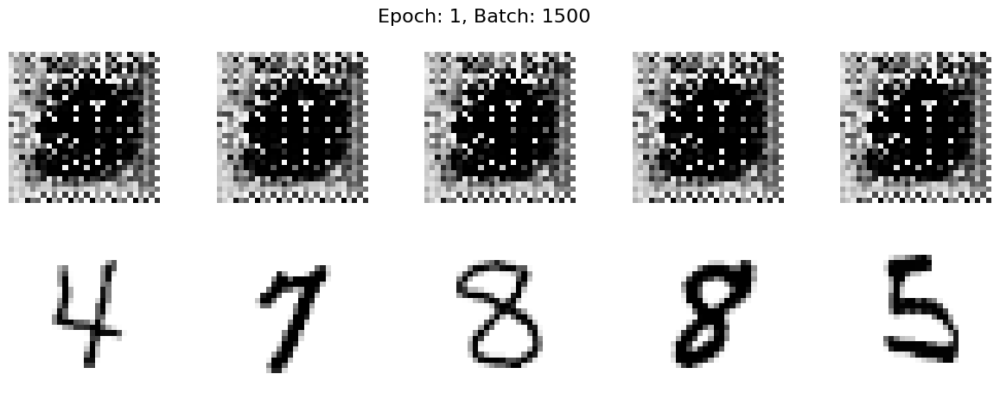

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]


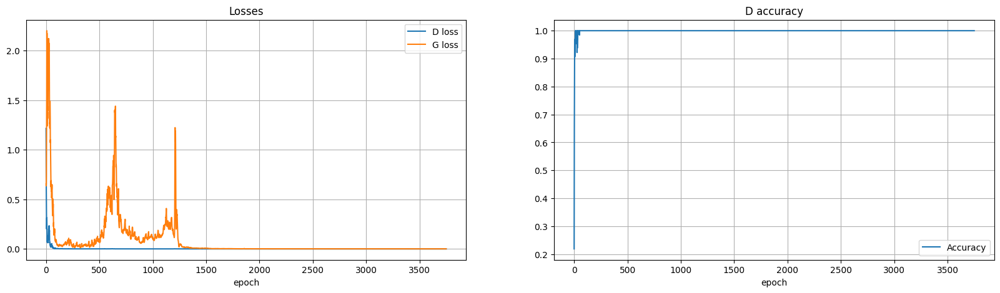

----EPOCH 2-----
0 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]


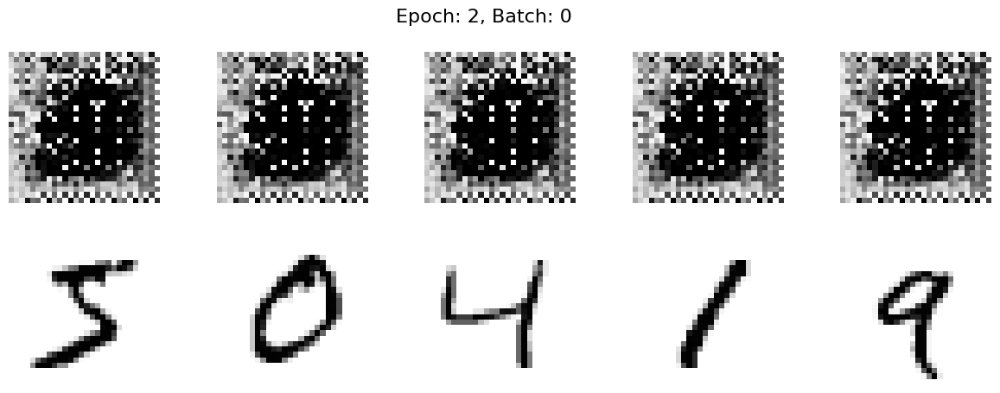

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]


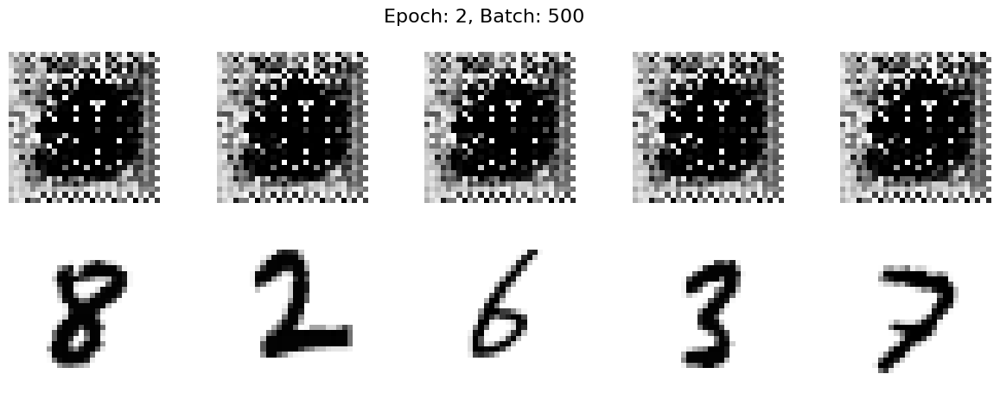

550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]


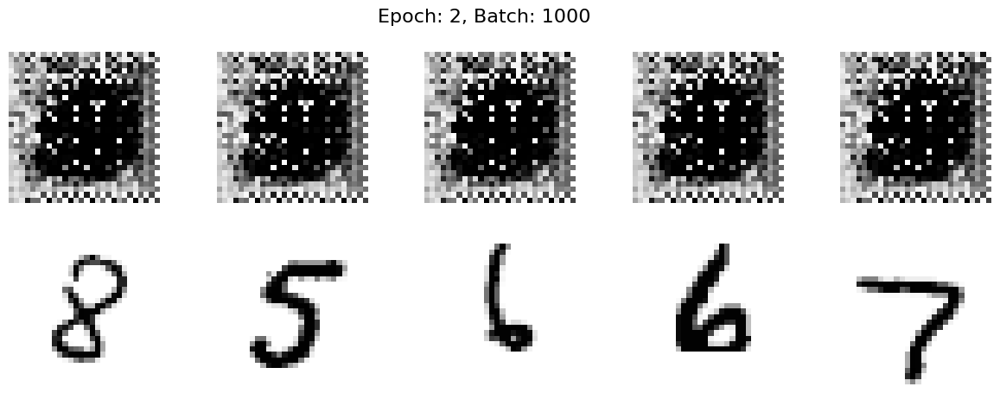

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]


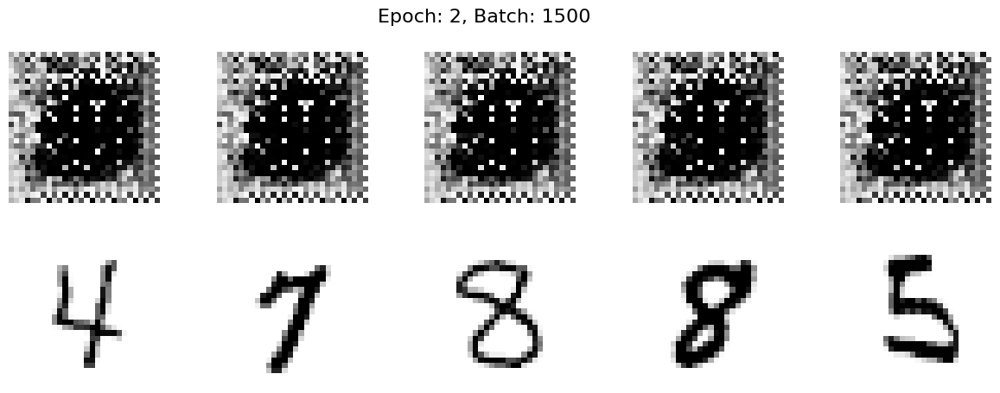

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


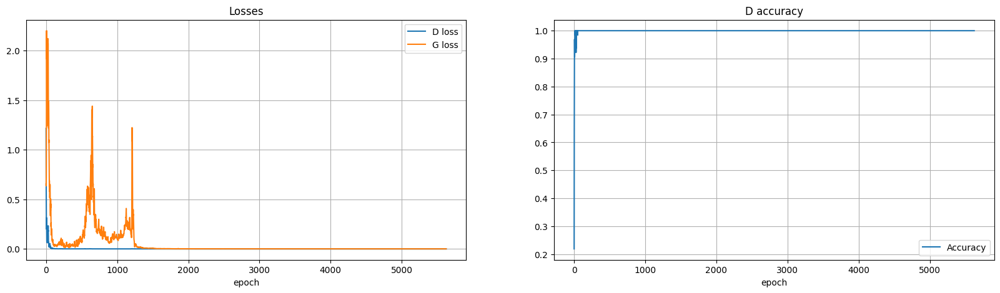

----EPOCH 3-----
0 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


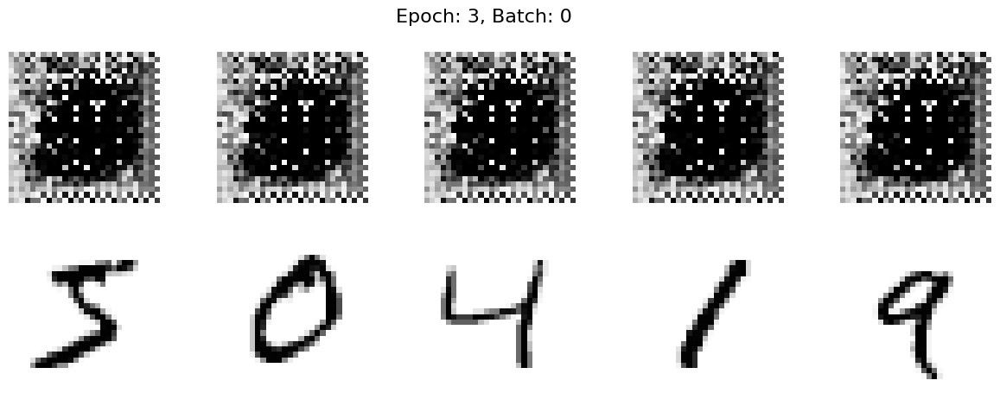

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


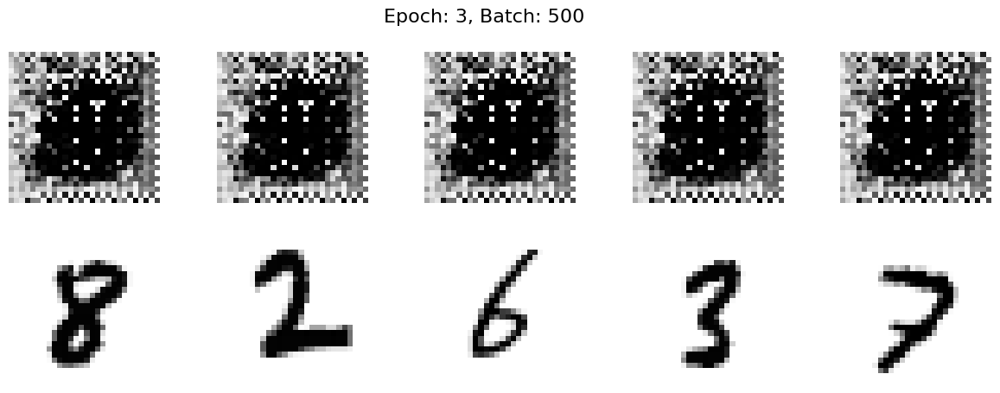

550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


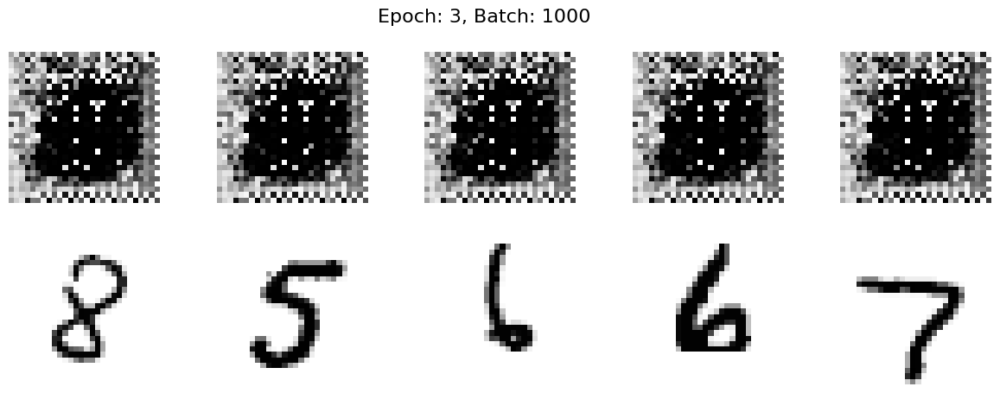

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


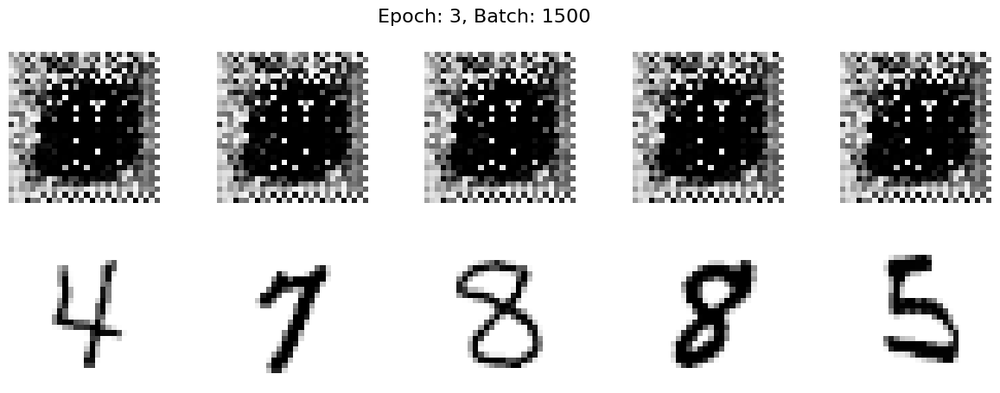

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


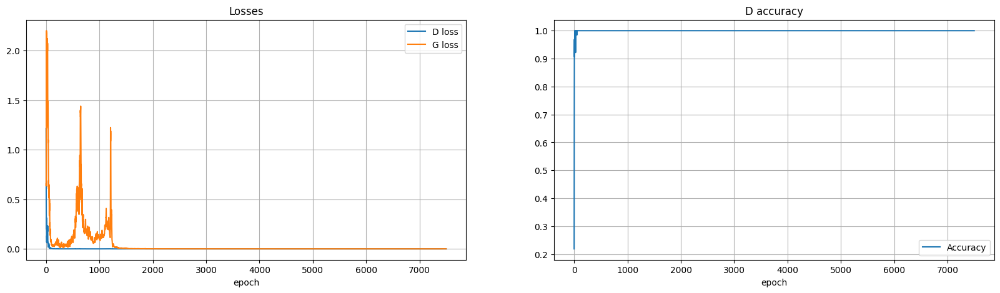

----EPOCH 4-----
0 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


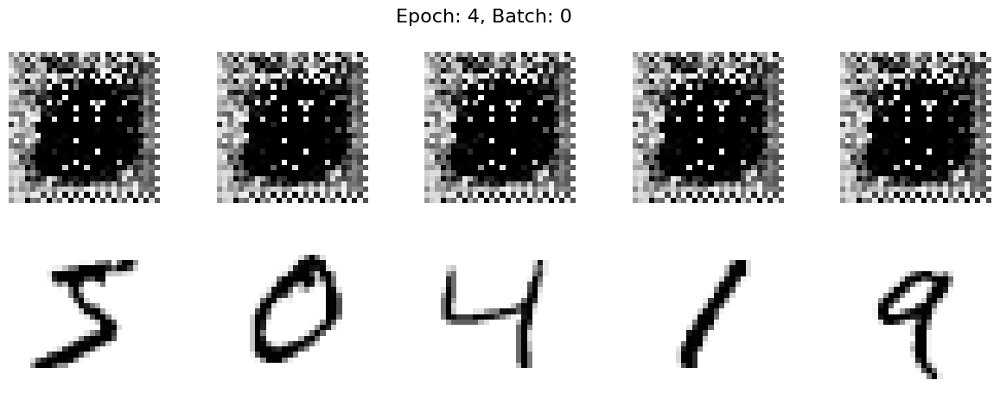

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


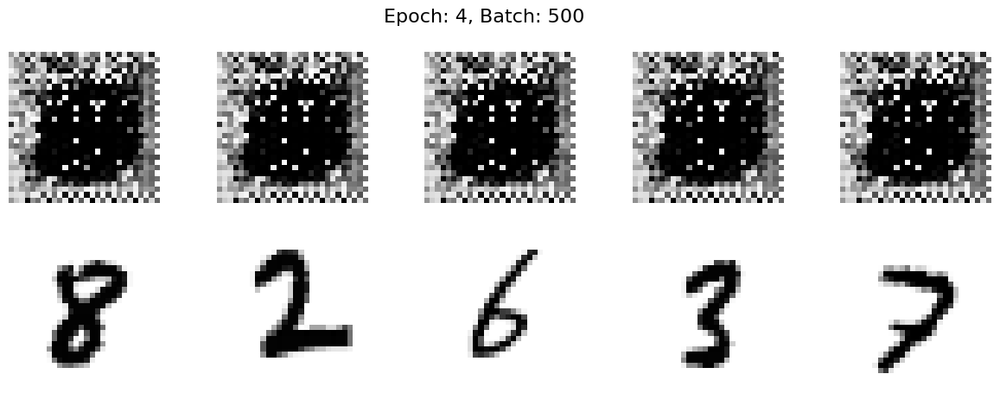

550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


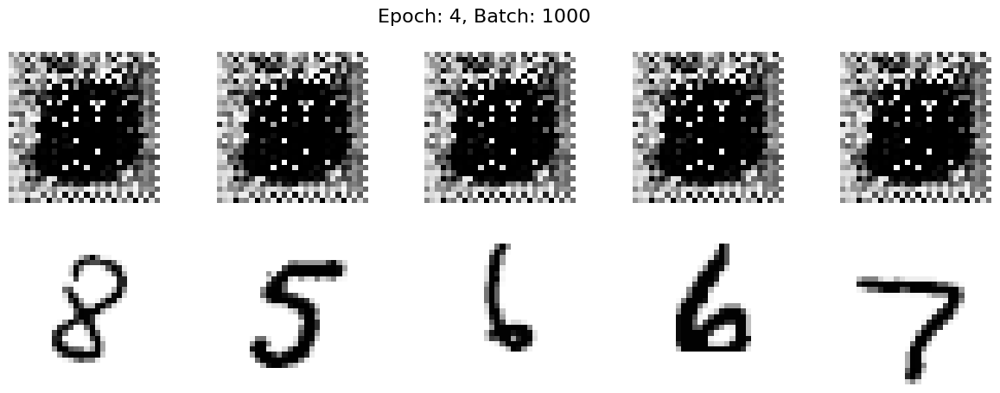

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


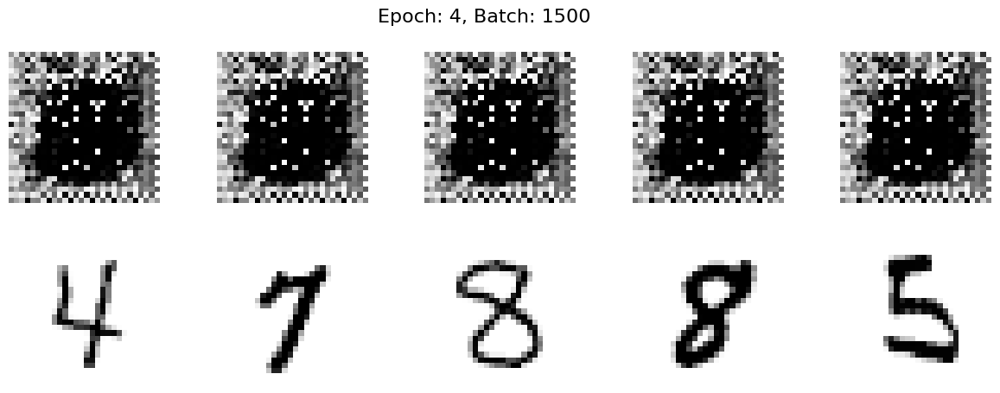

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


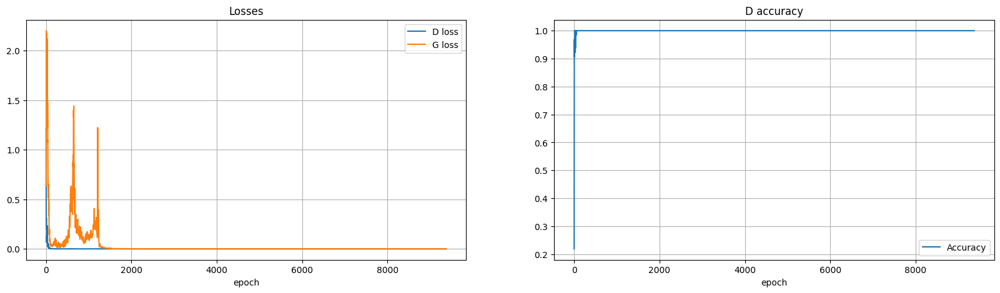

----EPOCH 5-----
0 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


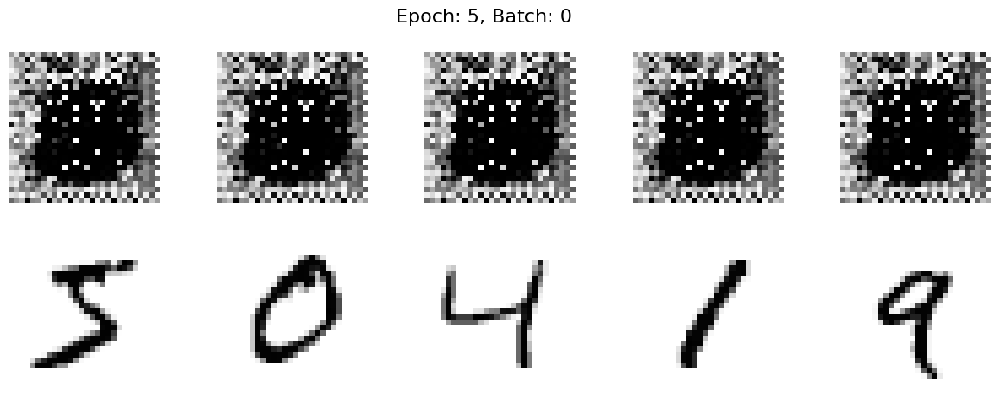

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


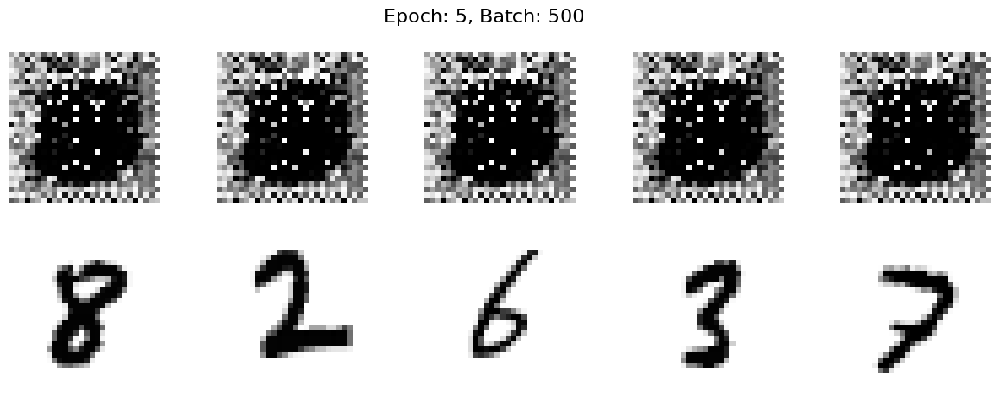

550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


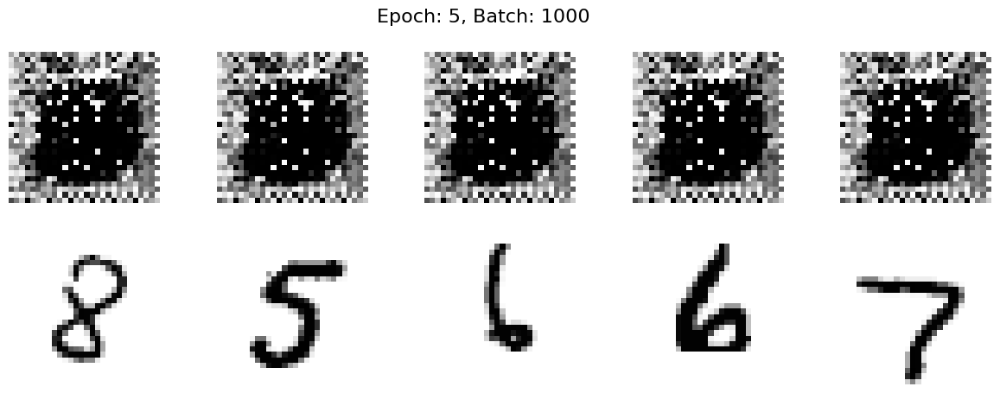

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


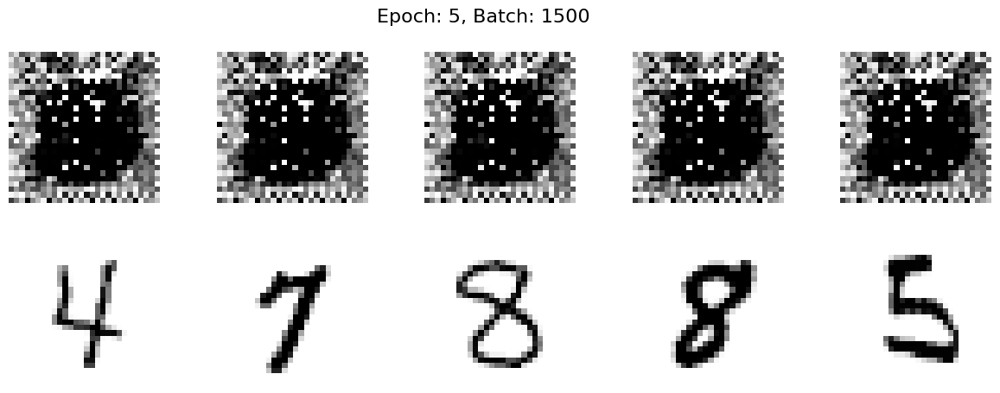

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


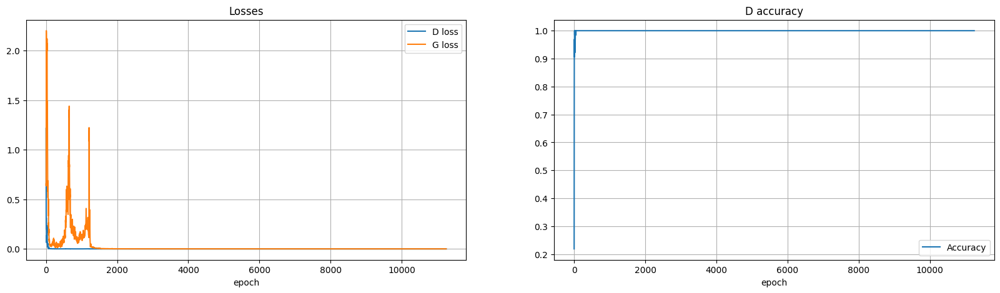

----EPOCH 6-----
0 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


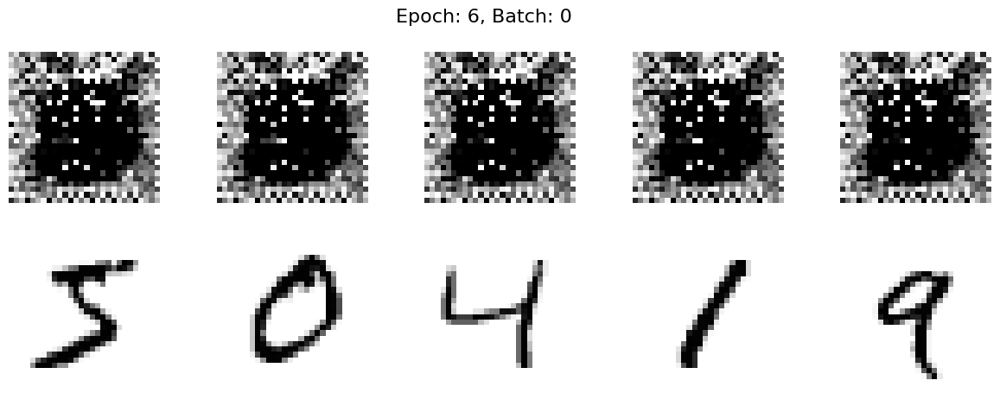

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


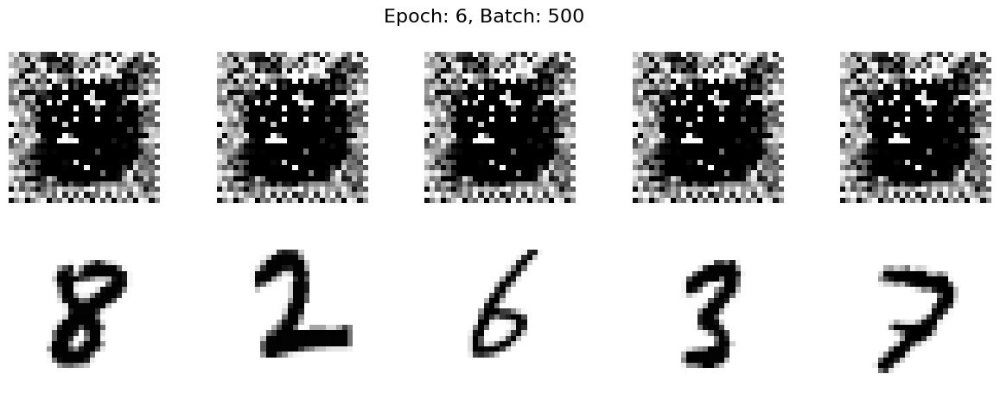

550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]


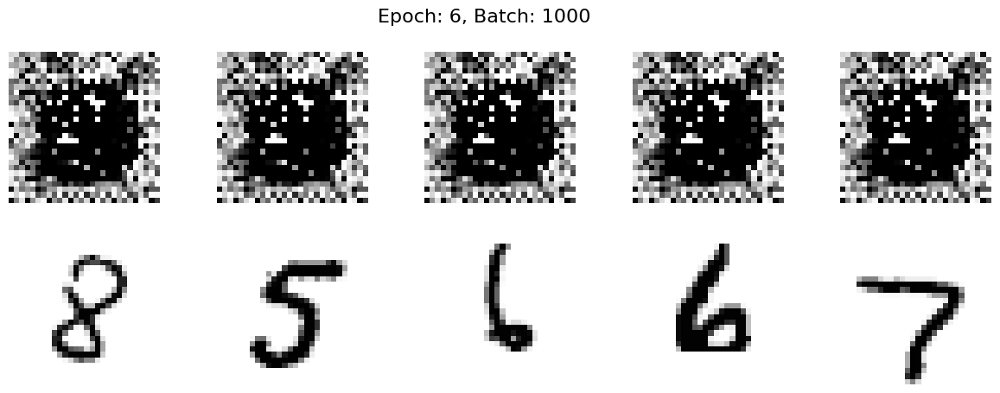

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0006]
1200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0005]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0007]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0006]


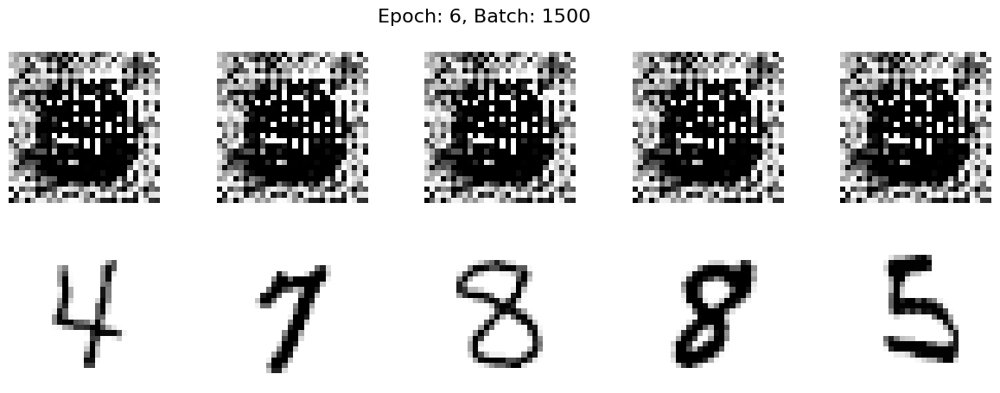

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0006]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0012]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0009]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0010]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0007]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0007]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0007]


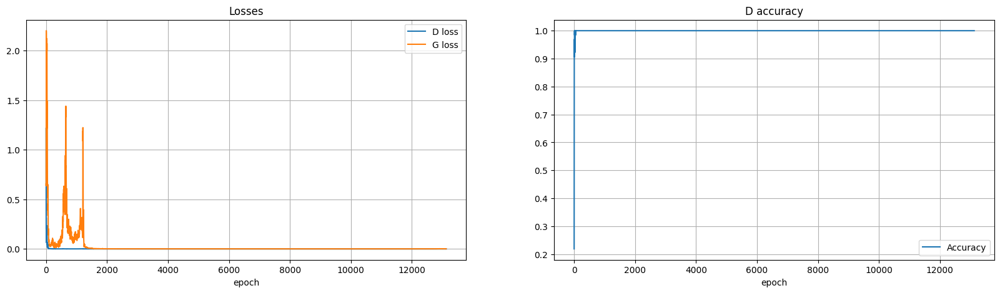

----EPOCH 7-----
0 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0006]


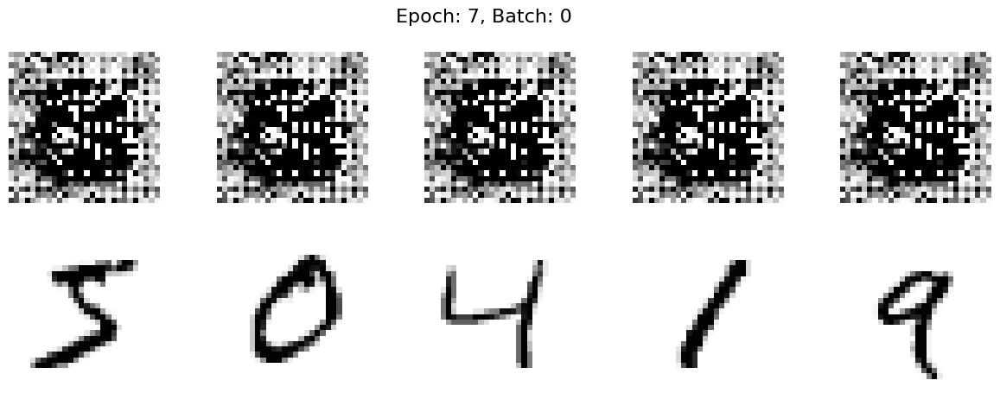

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0005]
100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0005]
250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0010]
300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0008]
350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0009]
400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0006]
450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0005]
500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]


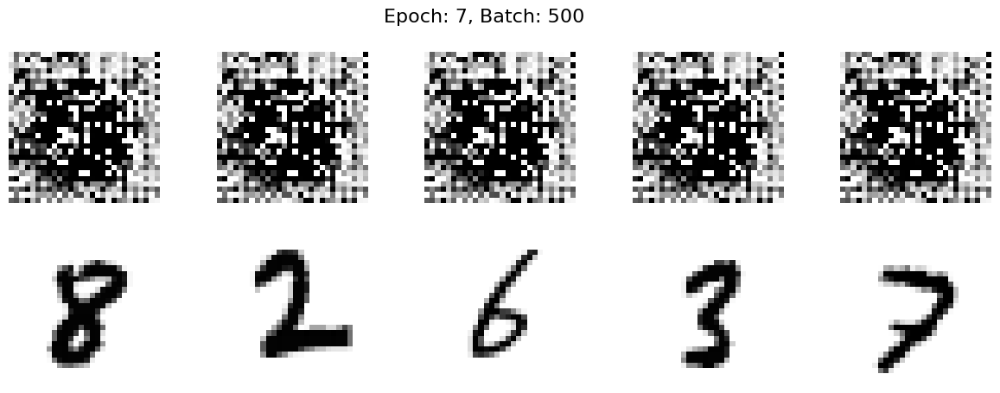

550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0004]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]


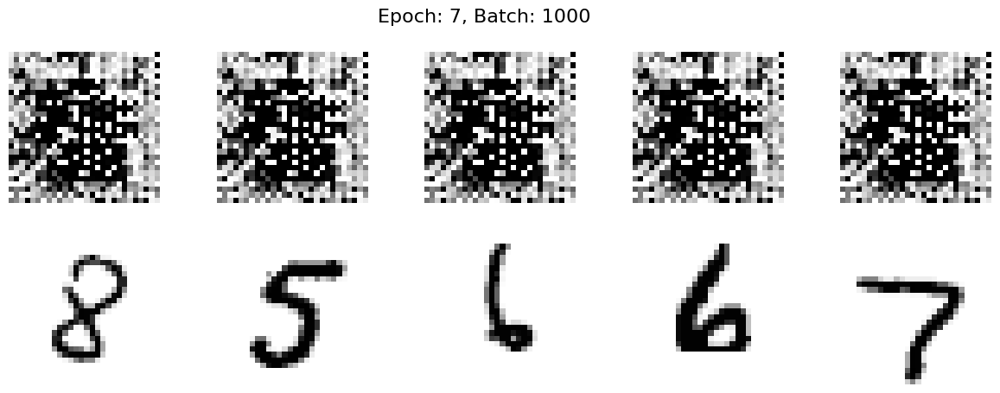

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0005]
1200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]


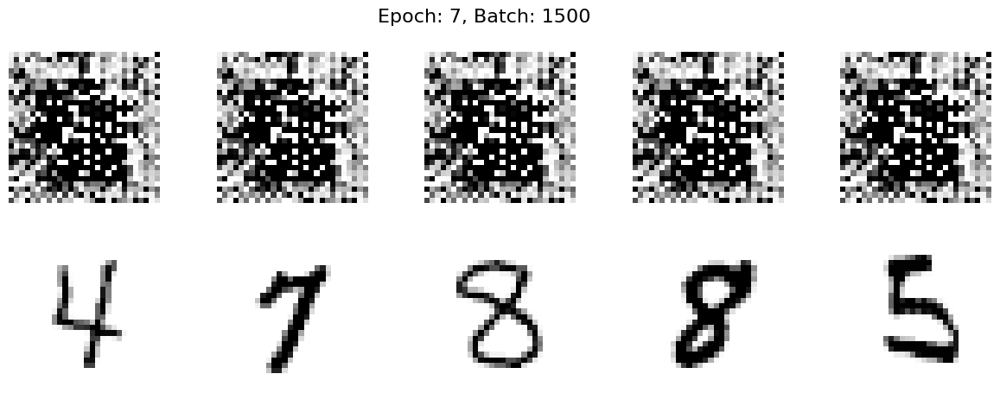

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0003]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0002]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


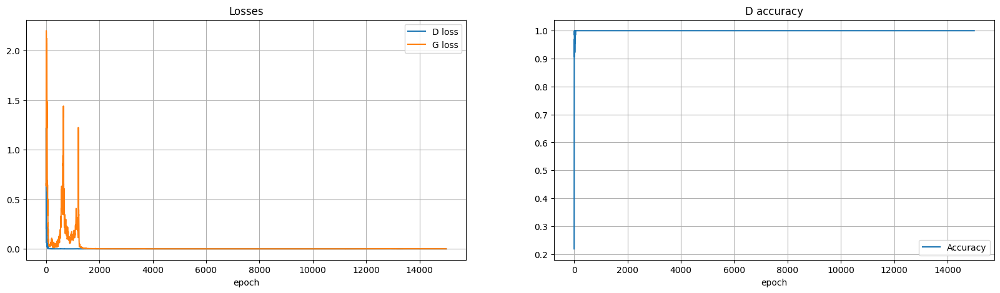

----EPOCH 8-----
0 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


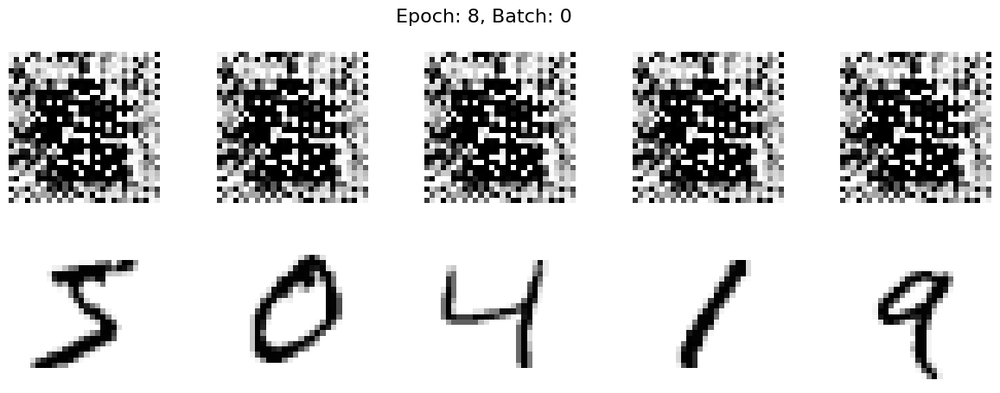

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]


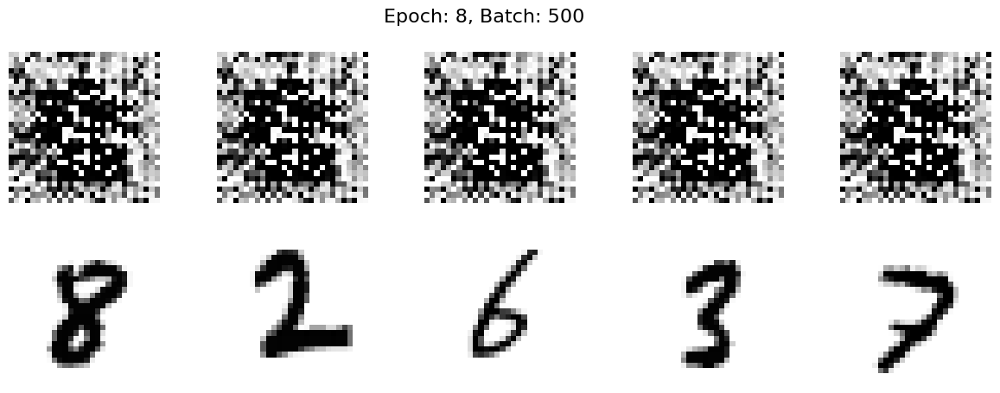

550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


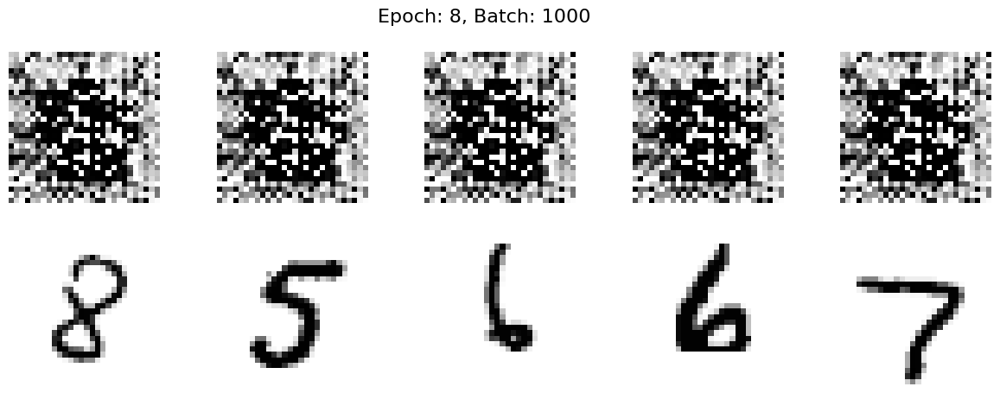

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]


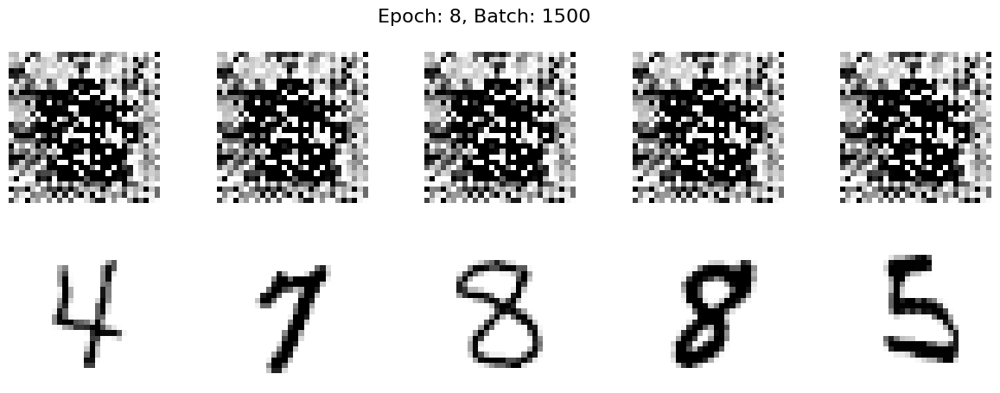

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]


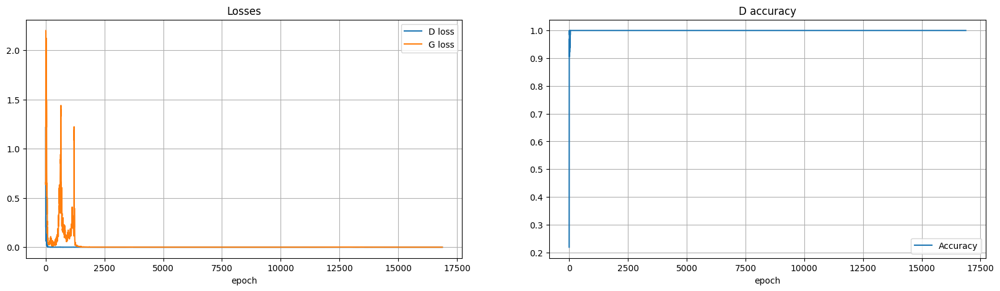

----EPOCH 9-----
0 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]


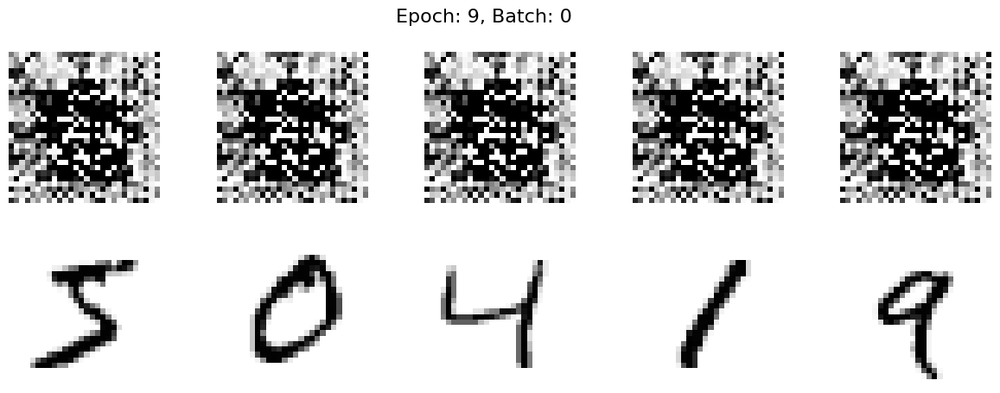

50 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]


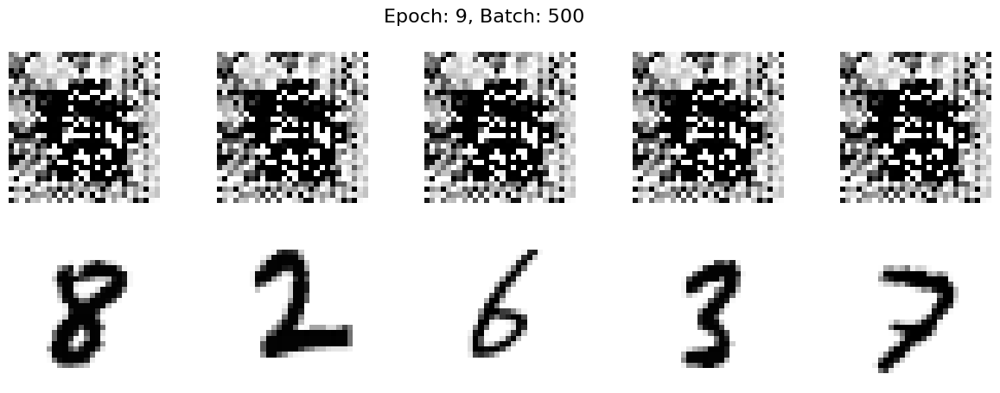

550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
900 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
950 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1000 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]


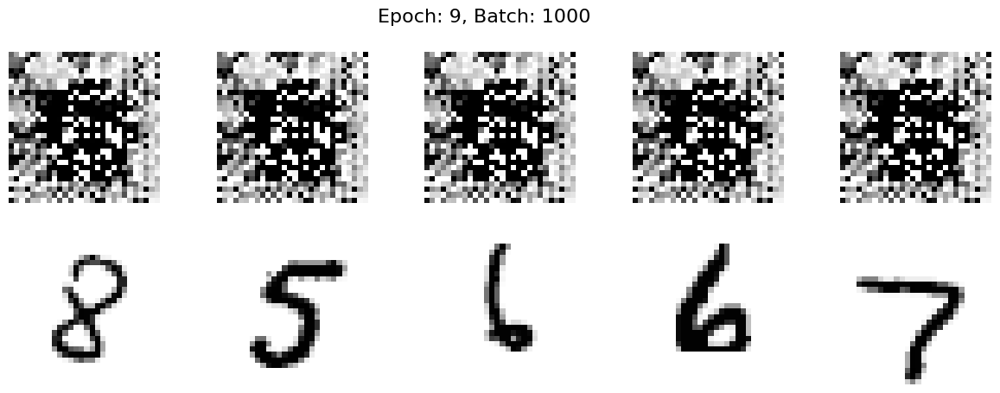

1050 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1100 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1150 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0001]
1200 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1250 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1300 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1350 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1400 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1450 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1500 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]


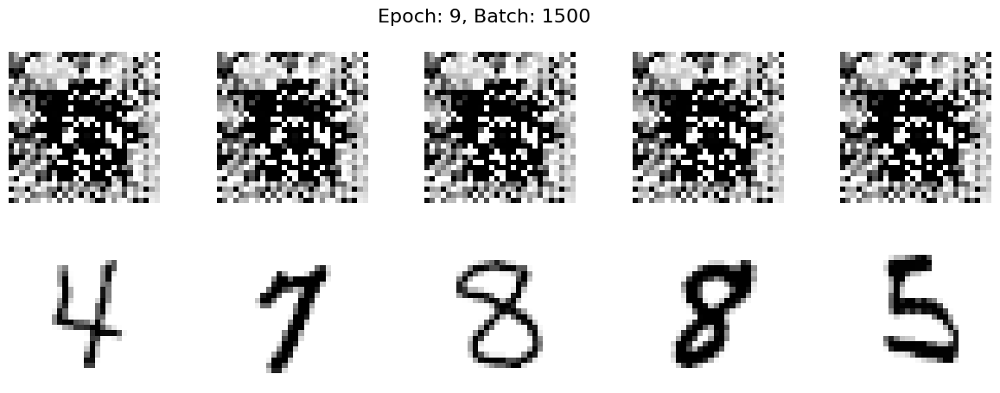

1550 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1600 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1650 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1700 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1750 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1800 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]
1850 [D loss: 0.0000,	 acc.: 100.00%]	[G loss: 0.0000]


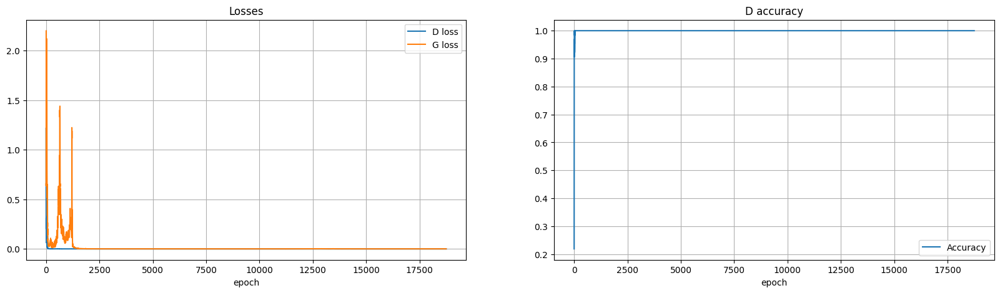

In [ ]:
train(X_train, generator, discriminator, combined, epochs=10, batch_size=32, sample_interval=100)

> Los resultados han sido bastante decepcionantes, ya que la DCGAN ha disminuido su rendimiendo considerablemente. La DCGAN llego a un punto donde no pudo seguir aprendiendo, el accuracy no vario de 100 y el loss siempre fue muy bajo o incluso 0 en la mayoría de los casos, me he topado ante un gradient vanishing.

> Voy a volver a la configuración inicial y a tratar de mejorarla con regularización.

# Segunda oportunidad de mejora

> Usar regularización

## Generador definition

> En este caso he metido 2 capas de dropout con un rate de 0.2, este hiperparámetro fluctua entre 0 y 1, y de manera arbitraria voy a probar con este valor. La capa dropout combate contra el overfitting desactivando neuronas durante el forwardpropagation y el backwardpropagation, reduciendo la dependencia entre neuronas cercanas.

> A parte de esto, voy a mantener la configuración del baseline que actualmente es mi mejor entrenamiento.

In [ ]:
def create_generator():

    input = Input(shape=(100))

    x = Dense(7 * 7 * 128)(input)
    x = Reshape((7, 7, 128))(x)

    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Dropout(0.2)(x)

    x = Conv2DTranspose(32, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Dropout(0.2)(x)

    output = Conv2DTranspose(1, kernel_size=3, strides=1, padding="same", activation="tanh")(x)

    generator = Model(input, output)

    return generator

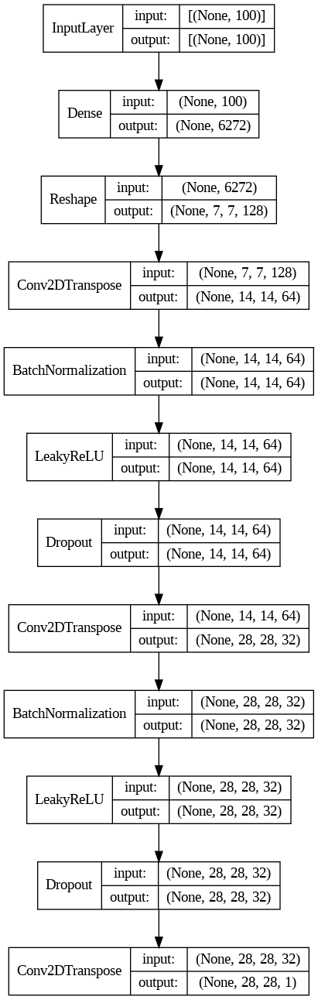

In [ ]:
generator = create_generator()
plot_model(generator, show_shapes=True, show_layer_names=False)

## Discriminador definition

> Al igual que en el generador, voy a mantener la configuración del baseline añadiendo diferentes capas de dropout para estudiar los resultados.

In [ ]:
def create_discriminator():
    input = Input(shape=(28, 28, 1))

    # Rellene con la red neuronal convolucional deseada

    x = Conv2D(64, kernel_size=3,strides=2, padding="same")(input)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2D(128, kernel_size=3,strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Dropout(0.2)(x)

    x = Conv2D(256, kernel_size=3,strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Flatten()(x)

    x = Dropout(0.2)(x)

    output =  Dense(1, activation="sigmoid")(x)

    discriminator = Model(input, output)

    return discriminator

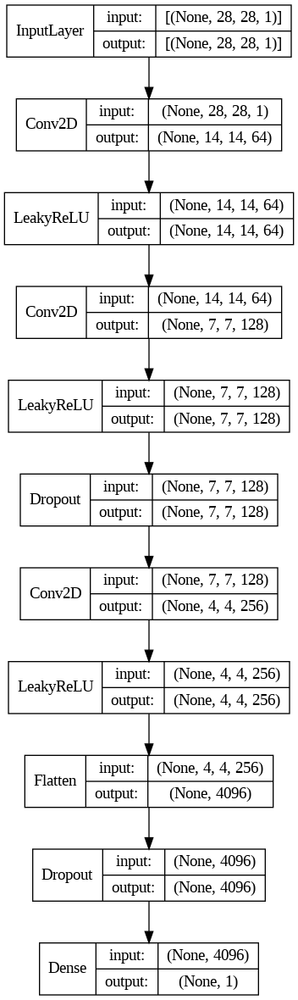

In [ ]:
discriminator = create_discriminator()
plot_model(discriminator, show_shapes=True, show_layer_names=False)

## GAN model definition

In [ ]:
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
discriminator.trainable = False

z = Input(shape=(100,))
img = generator(z)
validity = discriminator(img)

combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam())

## Análisis de resultados

----EPOCH 0-----
0 [D loss: 0.7005,	 acc.: 35.94%]	[G loss: 0.3913]


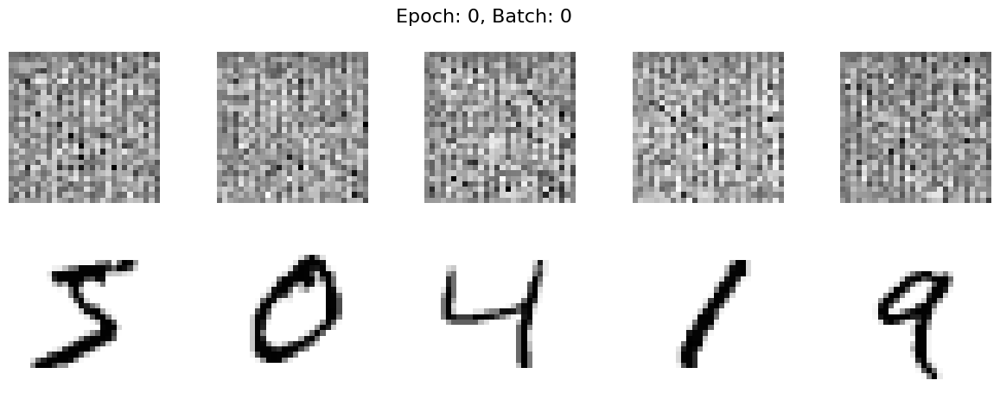

50 [D loss: 0.0248,	 acc.: 100.00%]	[G loss: 5.2055]
100 [D loss: 0.1071,	 acc.: 98.44%]	[G loss: 14.9172]
150 [D loss: 0.0063,	 acc.: 100.00%]	[G loss: 5.6735]
200 [D loss: 0.0159,	 acc.: 100.00%]	[G loss: 3.7486]
250 [D loss: 0.0244,	 acc.: 100.00%]	[G loss: 5.6497]
300 [D loss: 0.1164,	 acc.: 98.44%]	[G loss: 4.1419]
350 [D loss: 0.2243,	 acc.: 93.75%]	[G loss: 2.5787]
400 [D loss: 0.4322,	 acc.: 79.69%]	[G loss: 1.6199]
450 [D loss: 0.1671,	 acc.: 95.31%]	[G loss: 3.3823]
500 [D loss: 0.2463,	 acc.: 92.19%]	[G loss: 1.8658]


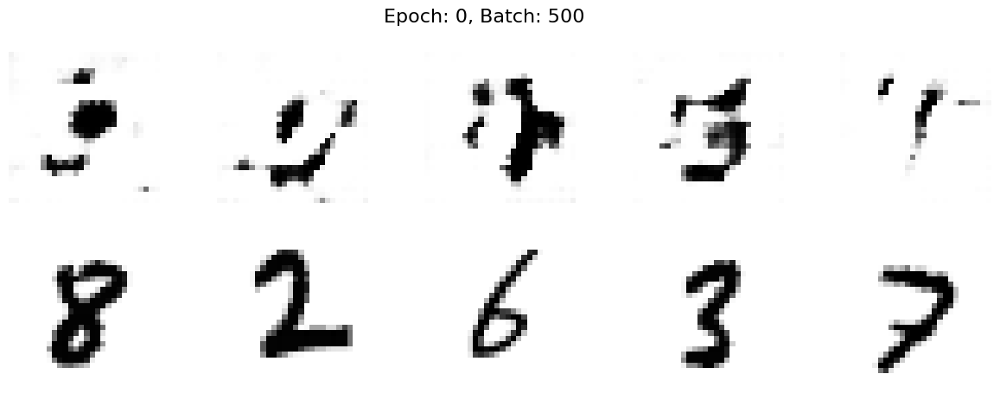

550 [D loss: 0.1949,	 acc.: 92.19%]	[G loss: 4.4083]
600 [D loss: 0.4950,	 acc.: 76.56%]	[G loss: 2.2957]
650 [D loss: 0.1365,	 acc.: 93.75%]	[G loss: 3.7246]
700 [D loss: 0.0978,	 acc.: 96.88%]	[G loss: 4.4776]
750 [D loss: 0.4437,	 acc.: 75.00%]	[G loss: 1.8058]
800 [D loss: 0.2274,	 acc.: 90.62%]	[G loss: 3.2516]
850 [D loss: 0.2573,	 acc.: 89.06%]	[G loss: 4.8868]
900 [D loss: 0.0954,	 acc.: 95.31%]	[G loss: 3.7743]
950 [D loss: 0.1615,	 acc.: 93.75%]	[G loss: 2.9106]
1000 [D loss: 0.4909,	 acc.: 78.12%]	[G loss: 2.3477]


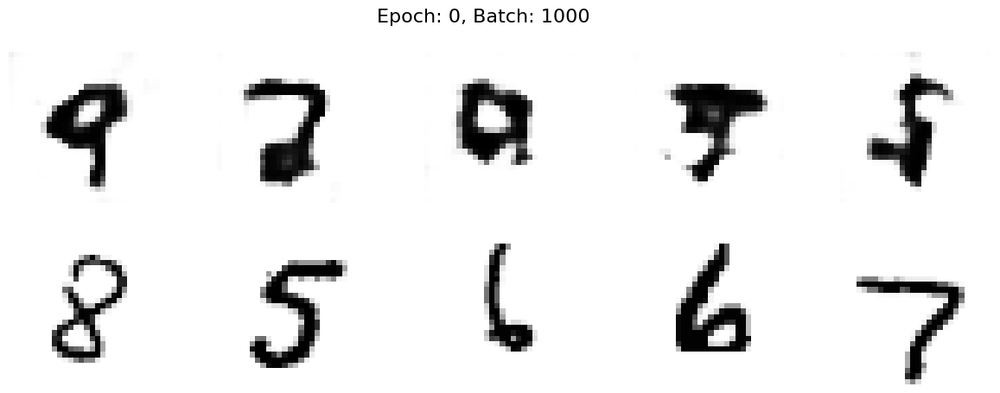

1050 [D loss: 0.2033,	 acc.: 89.06%]	[G loss: 3.7825]
1100 [D loss: 0.1743,	 acc.: 90.62%]	[G loss: 3.3231]
1150 [D loss: 0.4164,	 acc.: 84.38%]	[G loss: 2.5630]
1200 [D loss: 0.2421,	 acc.: 89.06%]	[G loss: 3.0164]
1250 [D loss: 0.3377,	 acc.: 82.81%]	[G loss: 3.5863]
1300 [D loss: 0.2721,	 acc.: 84.38%]	[G loss: 2.8743]
1350 [D loss: 0.1285,	 acc.: 95.31%]	[G loss: 2.7145]
1400 [D loss: 0.2674,	 acc.: 92.19%]	[G loss: 2.5630]
1450 [D loss: 0.2219,	 acc.: 90.62%]	[G loss: 2.5813]
1500 [D loss: 0.2652,	 acc.: 92.19%]	[G loss: 2.9431]


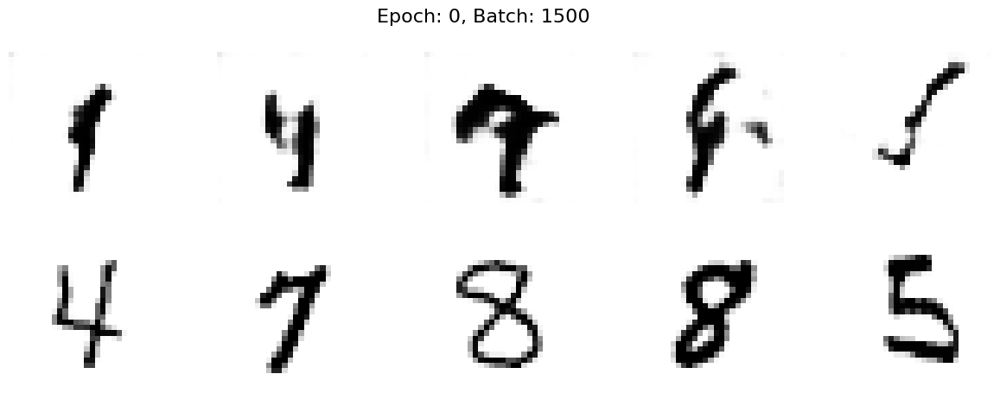

1550 [D loss: 0.2216,	 acc.: 96.88%]	[G loss: 3.1575]
1600 [D loss: 0.3812,	 acc.: 84.38%]	[G loss: 2.8712]
1650 [D loss: 0.2886,	 acc.: 84.38%]	[G loss: 2.7225]
1700 [D loss: 0.4353,	 acc.: 84.38%]	[G loss: 2.4456]
1750 [D loss: 0.3184,	 acc.: 89.06%]	[G loss: 2.0557]
1800 [D loss: 0.1966,	 acc.: 89.06%]	[G loss: 4.1801]
1850 [D loss: 0.2277,	 acc.: 93.75%]	[G loss: 3.6070]


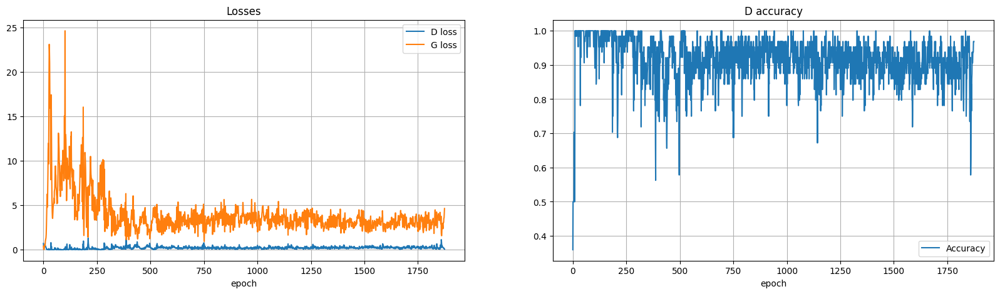

----EPOCH 1-----
0 [D loss: 0.3509,	 acc.: 84.38%]	[G loss: 4.6471]


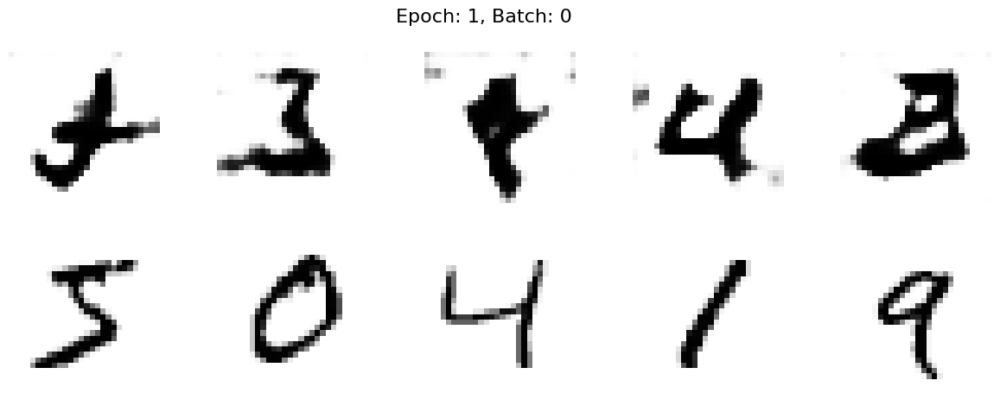

50 [D loss: 0.4069,	 acc.: 84.38%]	[G loss: 2.0936]
100 [D loss: 0.2751,	 acc.: 90.62%]	[G loss: 2.7444]
150 [D loss: 0.3317,	 acc.: 92.19%]	[G loss: 2.1923]
200 [D loss: 0.4176,	 acc.: 82.81%]	[G loss: 2.8472]
250 [D loss: 0.2241,	 acc.: 92.19%]	[G loss: 2.8027]
300 [D loss: 0.5143,	 acc.: 81.25%]	[G loss: 2.2328]
350 [D loss: 0.1784,	 acc.: 90.62%]	[G loss: 3.8045]
400 [D loss: 0.2648,	 acc.: 89.06%]	[G loss: 2.7180]
450 [D loss: 0.2482,	 acc.: 89.06%]	[G loss: 2.1313]
500 [D loss: 0.3085,	 acc.: 90.62%]	[G loss: 2.6061]


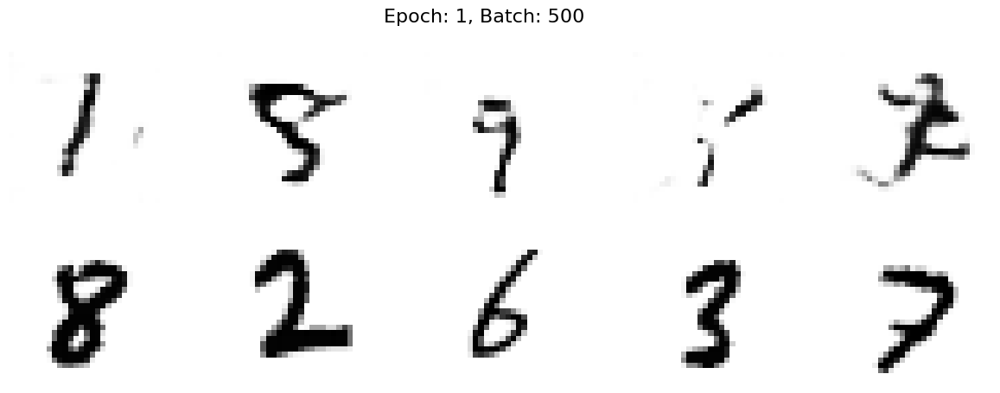

550 [D loss: 0.3548,	 acc.: 81.25%]	[G loss: 2.3261]
600 [D loss: 0.2760,	 acc.: 87.50%]	[G loss: 3.1794]
650 [D loss: 0.1374,	 acc.: 95.31%]	[G loss: 4.3956]
700 [D loss: 0.1381,	 acc.: 93.75%]	[G loss: 3.8249]
750 [D loss: 0.3156,	 acc.: 87.50%]	[G loss: 2.3986]
800 [D loss: 0.2004,	 acc.: 92.19%]	[G loss: 3.1679]
850 [D loss: 0.2130,	 acc.: 92.19%]	[G loss: 2.8196]
900 [D loss: 0.1960,	 acc.: 96.88%]	[G loss: 3.7343]
950 [D loss: 0.2092,	 acc.: 92.19%]	[G loss: 3.1439]
1000 [D loss: 0.3380,	 acc.: 84.38%]	[G loss: 3.3088]


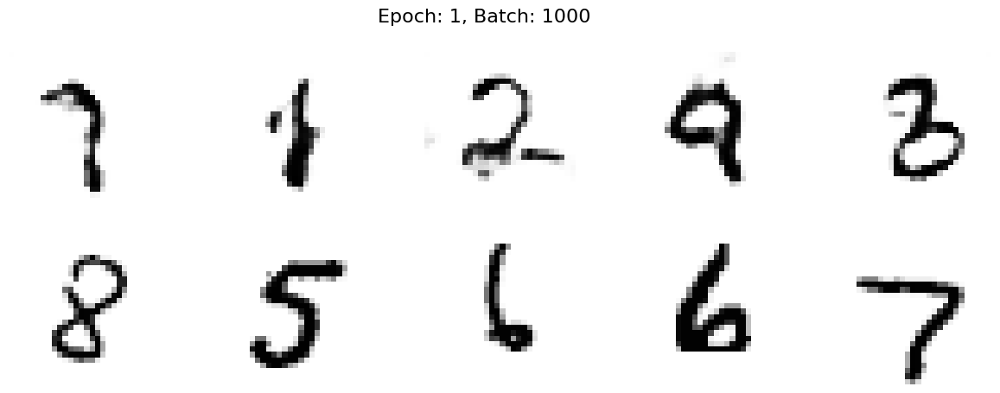

1050 [D loss: 0.2692,	 acc.: 85.94%]	[G loss: 3.5262]
1100 [D loss: 0.1282,	 acc.: 95.31%]	[G loss: 3.7593]
1150 [D loss: 0.2129,	 acc.: 92.19%]	[G loss: 3.0392]
1200 [D loss: 0.1847,	 acc.: 92.19%]	[G loss: 3.0328]
1250 [D loss: 0.2197,	 acc.: 93.75%]	[G loss: 2.6835]
1300 [D loss: 0.3139,	 acc.: 89.06%]	[G loss: 3.6081]
1350 [D loss: 0.0586,	 acc.: 100.00%]	[G loss: 3.1323]
1400 [D loss: 0.1942,	 acc.: 95.31%]	[G loss: 3.7495]
1450 [D loss: 0.1892,	 acc.: 89.06%]	[G loss: 3.5925]
1500 [D loss: 0.2014,	 acc.: 93.75%]	[G loss: 3.0078]


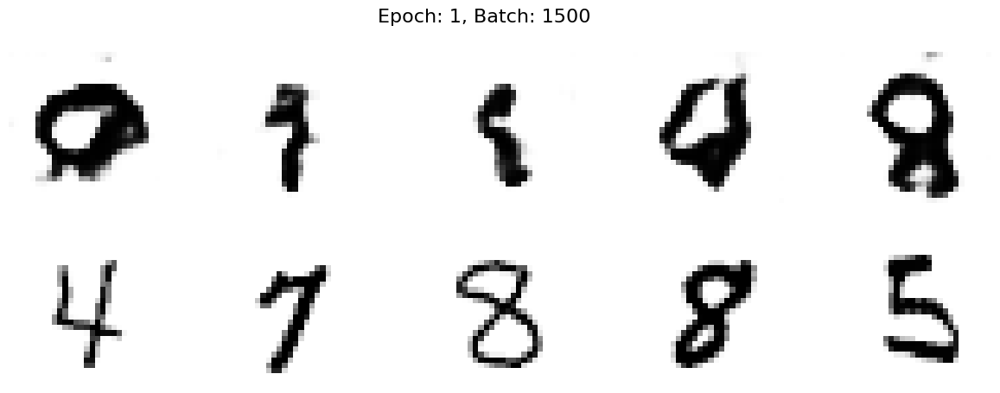

1550 [D loss: 0.3434,	 acc.: 81.25%]	[G loss: 2.8738]
1600 [D loss: 0.2355,	 acc.: 93.75%]	[G loss: 2.7223]
1650 [D loss: 0.2733,	 acc.: 89.06%]	[G loss: 3.1079]
1700 [D loss: 0.2587,	 acc.: 87.50%]	[G loss: 3.0651]
1750 [D loss: 0.2099,	 acc.: 93.75%]	[G loss: 3.3340]
1800 [D loss: 0.1738,	 acc.: 90.62%]	[G loss: 3.8174]
1850 [D loss: 0.2966,	 acc.: 89.06%]	[G loss: 3.1580]


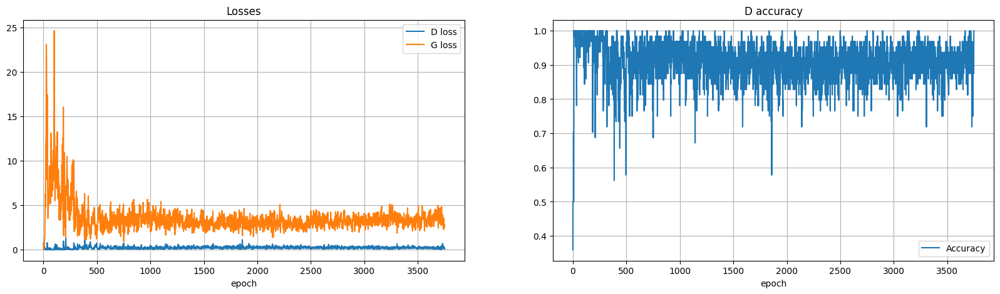

----EPOCH 2-----
0 [D loss: 0.2264,	 acc.: 89.06%]	[G loss: 3.1585]


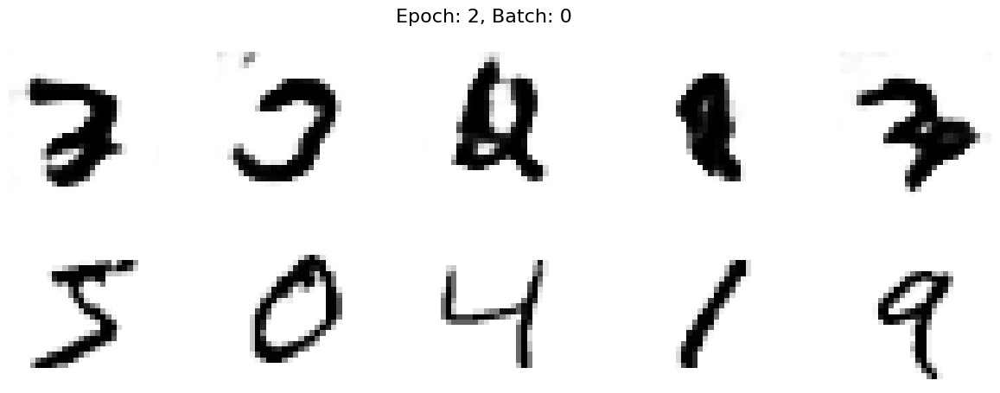

50 [D loss: 0.3104,	 acc.: 85.94%]	[G loss: 3.0400]
100 [D loss: 0.1351,	 acc.: 92.19%]	[G loss: 3.3073]
150 [D loss: 0.1957,	 acc.: 90.62%]	[G loss: 3.3647]
200 [D loss: 0.3064,	 acc.: 87.50%]	[G loss: 3.3406]
250 [D loss: 0.3951,	 acc.: 85.94%]	[G loss: 2.1003]
300 [D loss: 0.3996,	 acc.: 82.81%]	[G loss: 3.3230]
350 [D loss: 0.2562,	 acc.: 90.62%]	[G loss: 2.9423]
400 [D loss: 0.1835,	 acc.: 93.75%]	[G loss: 3.6141]
450 [D loss: 0.2384,	 acc.: 92.19%]	[G loss: 2.6672]
500 [D loss: 0.3213,	 acc.: 87.50%]	[G loss: 3.4876]


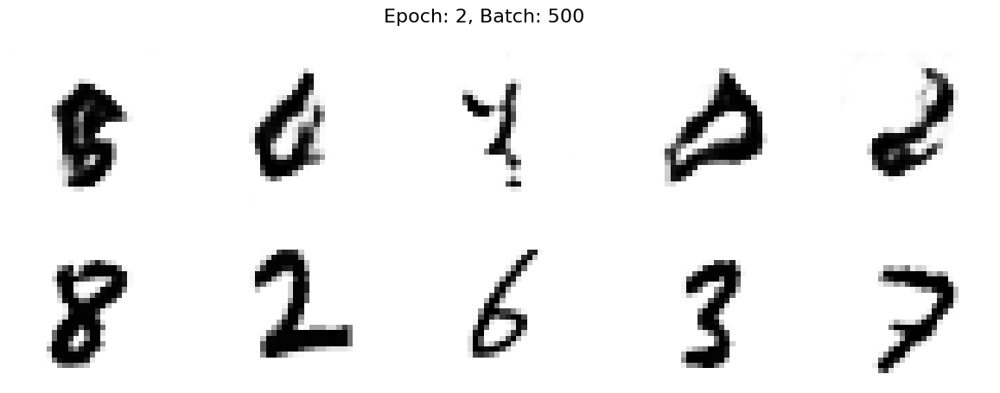

550 [D loss: 0.1734,	 acc.: 90.62%]	[G loss: 3.0501]
600 [D loss: 0.1754,	 acc.: 89.06%]	[G loss: 2.9887]
650 [D loss: 0.1632,	 acc.: 93.75%]	[G loss: 3.2608]
700 [D loss: 0.0960,	 acc.: 98.44%]	[G loss: 3.6282]
750 [D loss: 0.3857,	 acc.: 85.94%]	[G loss: 3.5798]
800 [D loss: 0.2854,	 acc.: 90.62%]	[G loss: 2.8926]
850 [D loss: 0.1895,	 acc.: 92.19%]	[G loss: 2.9560]
900 [D loss: 0.1170,	 acc.: 93.75%]	[G loss: 3.6057]
950 [D loss: 0.2438,	 acc.: 87.50%]	[G loss: 3.2159]
1000 [D loss: 0.4348,	 acc.: 78.12%]	[G loss: 2.5969]


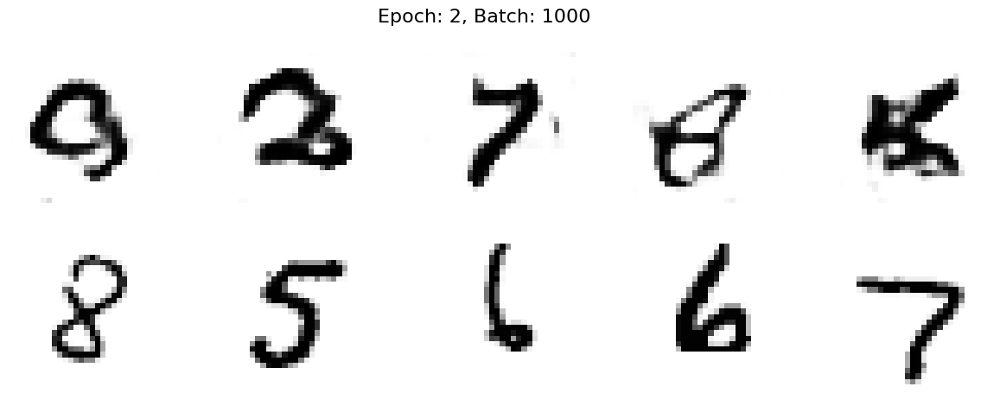

1050 [D loss: 0.2164,	 acc.: 90.62%]	[G loss: 2.9986]
1100 [D loss: 0.1156,	 acc.: 93.75%]	[G loss: 4.0740]
1150 [D loss: 0.2326,	 acc.: 87.50%]	[G loss: 3.3679]
1200 [D loss: 0.2183,	 acc.: 89.06%]	[G loss: 2.8432]
1250 [D loss: 0.1775,	 acc.: 93.75%]	[G loss: 3.4267]
1300 [D loss: 0.3042,	 acc.: 84.38%]	[G loss: 4.0554]
1350 [D loss: 0.2767,	 acc.: 90.62%]	[G loss: 3.2807]
1400 [D loss: 0.2190,	 acc.: 90.62%]	[G loss: 2.5898]
1450 [D loss: 0.2550,	 acc.: 87.50%]	[G loss: 4.9306]
1500 [D loss: 0.2524,	 acc.: 87.50%]	[G loss: 2.6787]


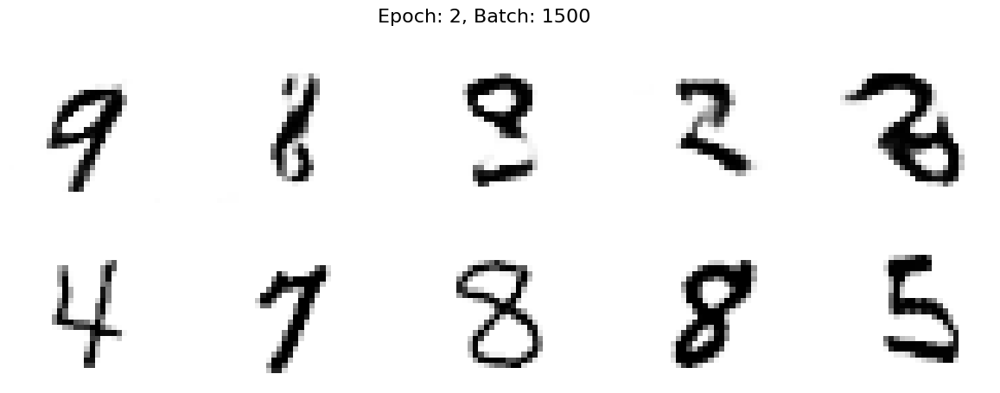

1550 [D loss: 0.1696,	 acc.: 93.75%]	[G loss: 2.8326]
1600 [D loss: 0.2164,	 acc.: 93.75%]	[G loss: 2.8079]
1650 [D loss: 0.2428,	 acc.: 89.06%]	[G loss: 2.9951]
1700 [D loss: 0.2426,	 acc.: 87.50%]	[G loss: 3.1010]
1750 [D loss: 0.1682,	 acc.: 92.19%]	[G loss: 3.7816]
1800 [D loss: 0.1664,	 acc.: 92.19%]	[G loss: 3.3071]
1850 [D loss: 0.2092,	 acc.: 90.62%]	[G loss: 3.9206]


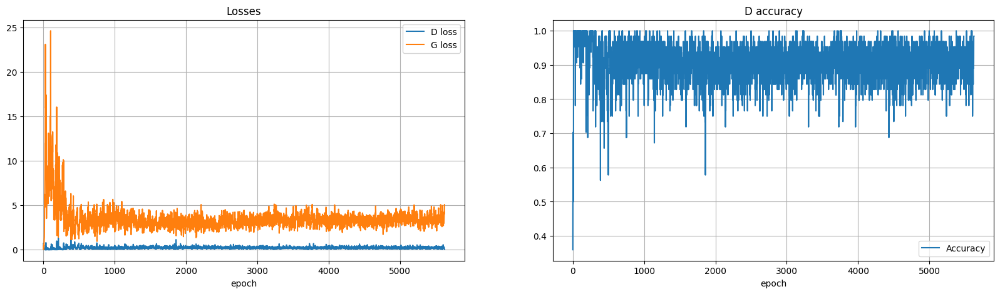

----EPOCH 3-----
0 [D loss: 0.1867,	 acc.: 90.62%]	[G loss: 5.0056]


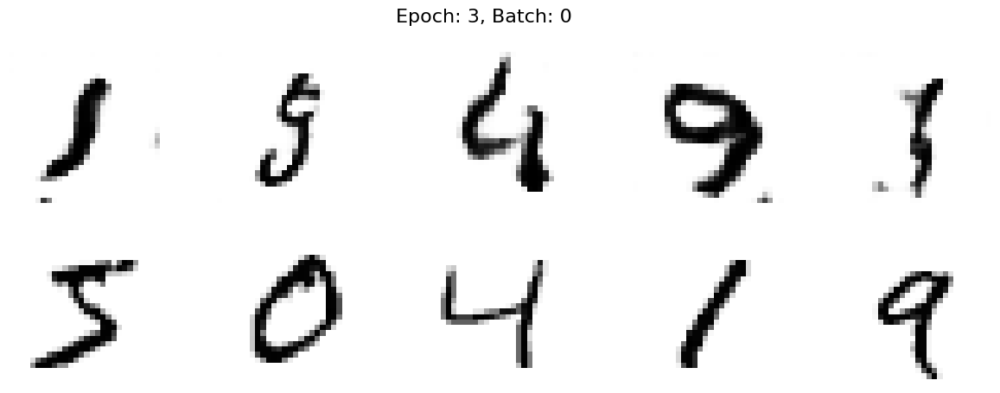

50 [D loss: 0.1550,	 acc.: 96.88%]	[G loss: 2.9778]
100 [D loss: 0.2380,	 acc.: 89.06%]	[G loss: 4.0289]
150 [D loss: 0.2545,	 acc.: 85.94%]	[G loss: 3.3373]
200 [D loss: 0.1809,	 acc.: 92.19%]	[G loss: 3.6929]
250 [D loss: 0.2192,	 acc.: 92.19%]	[G loss: 3.3189]
300 [D loss: 0.2442,	 acc.: 92.19%]	[G loss: 2.6998]
350 [D loss: 0.1574,	 acc.: 95.31%]	[G loss: 2.7084]
400 [D loss: 0.3495,	 acc.: 87.50%]	[G loss: 3.0570]
450 [D loss: 0.1549,	 acc.: 92.19%]	[G loss: 3.4794]
500 [D loss: 0.4766,	 acc.: 84.38%]	[G loss: 3.1137]


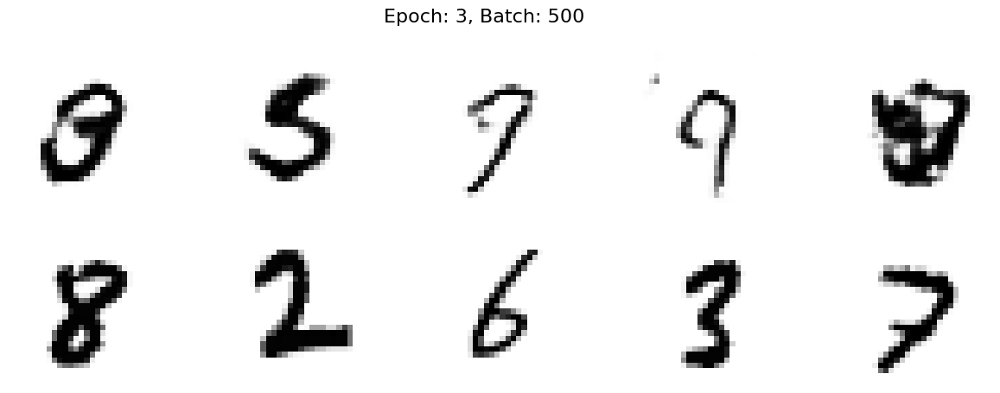

550 [D loss: 0.2131,	 acc.: 93.75%]	[G loss: 3.2535]
600 [D loss: 0.4104,	 acc.: 81.25%]	[G loss: 3.3142]
650 [D loss: 0.1943,	 acc.: 93.75%]	[G loss: 3.7996]
700 [D loss: 0.2121,	 acc.: 95.31%]	[G loss: 3.7058]
750 [D loss: 0.5344,	 acc.: 79.69%]	[G loss: 3.4149]
800 [D loss: 0.2961,	 acc.: 87.50%]	[G loss: 3.3112]
850 [D loss: 0.3529,	 acc.: 82.81%]	[G loss: 2.0905]
900 [D loss: 0.1520,	 acc.: 95.31%]	[G loss: 2.5521]
950 [D loss: 0.2388,	 acc.: 87.50%]	[G loss: 3.5877]
1000 [D loss: 0.3400,	 acc.: 84.38%]	[G loss: 2.7998]


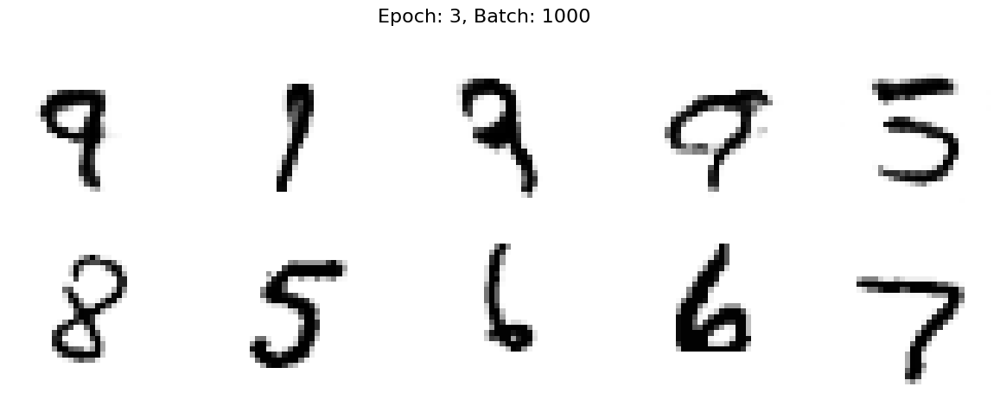

1050 [D loss: 0.1858,	 acc.: 89.06%]	[G loss: 3.2175]
1100 [D loss: 0.2601,	 acc.: 89.06%]	[G loss: 3.8636]
1150 [D loss: 0.2378,	 acc.: 89.06%]	[G loss: 3.4296]
1200 [D loss: 0.2361,	 acc.: 89.06%]	[G loss: 2.7680]
1250 [D loss: 0.2569,	 acc.: 87.50%]	[G loss: 2.8053]
1300 [D loss: 0.2370,	 acc.: 89.06%]	[G loss: 3.3247]
1350 [D loss: 0.0881,	 acc.: 96.88%]	[G loss: 4.4297]
1400 [D loss: 0.1725,	 acc.: 95.31%]	[G loss: 3.9367]
1450 [D loss: 0.2439,	 acc.: 89.06%]	[G loss: 4.2625]
1500 [D loss: 0.3535,	 acc.: 84.38%]	[G loss: 2.5946]


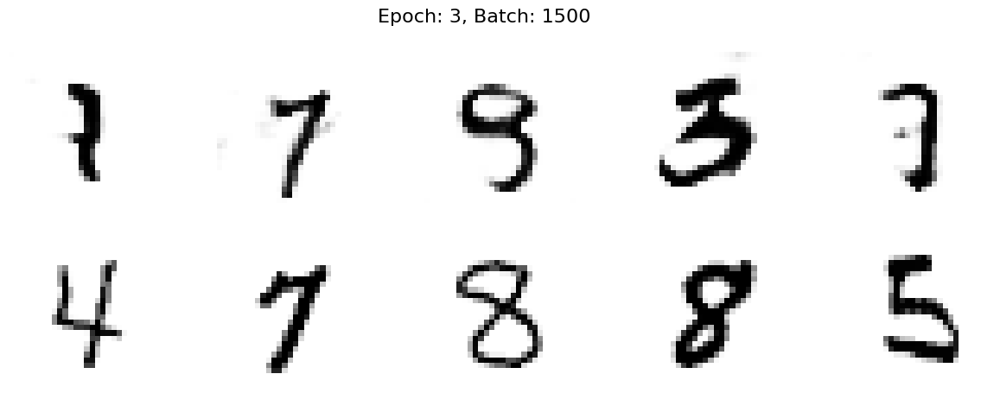

1550 [D loss: 0.0848,	 acc.: 96.88%]	[G loss: 3.6726]
1600 [D loss: 0.3241,	 acc.: 85.94%]	[G loss: 3.0056]
1650 [D loss: 0.5253,	 acc.: 76.56%]	[G loss: 3.4882]
1700 [D loss: 0.1778,	 acc.: 92.19%]	[G loss: 2.8841]
1750 [D loss: 0.2503,	 acc.: 90.62%]	[G loss: 4.0035]
1800 [D loss: 0.1069,	 acc.: 95.31%]	[G loss: 4.1077]
1850 [D loss: 0.1670,	 acc.: 92.19%]	[G loss: 3.5166]


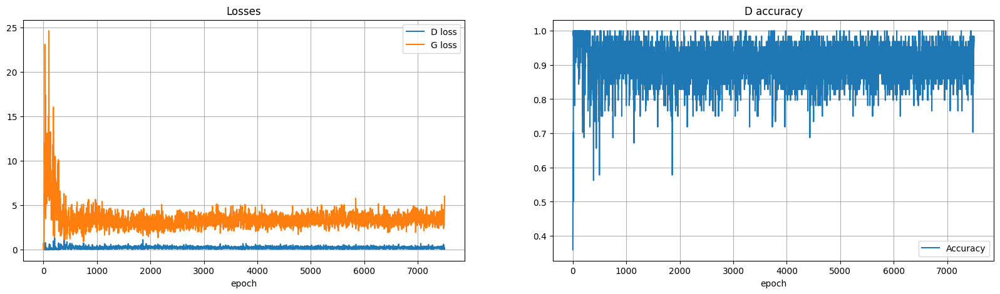

----EPOCH 4-----
0 [D loss: 0.2337,	 acc.: 87.50%]	[G loss: 5.3568]


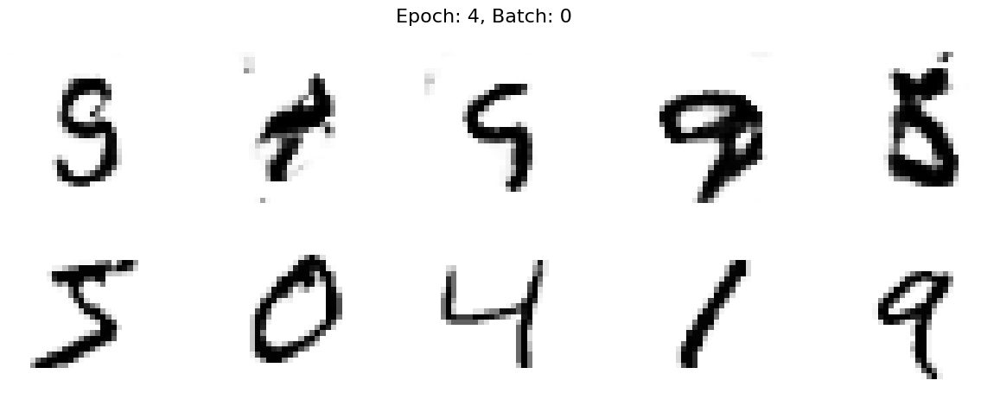

50 [D loss: 0.2011,	 acc.: 93.75%]	[G loss: 3.0037]
100 [D loss: 0.3074,	 acc.: 84.38%]	[G loss: 3.4430]
150 [D loss: 0.1843,	 acc.: 93.75%]	[G loss: 3.4002]
200 [D loss: 0.2303,	 acc.: 89.06%]	[G loss: 3.1662]
250 [D loss: 0.3959,	 acc.: 87.50%]	[G loss: 2.7320]
300 [D loss: 0.2426,	 acc.: 87.50%]	[G loss: 3.6627]
350 [D loss: 0.1765,	 acc.: 92.19%]	[G loss: 3.5464]
400 [D loss: 0.4501,	 acc.: 84.38%]	[G loss: 3.6513]
450 [D loss: 0.1607,	 acc.: 92.19%]	[G loss: 3.4487]
500 [D loss: 0.2796,	 acc.: 87.50%]	[G loss: 3.3422]


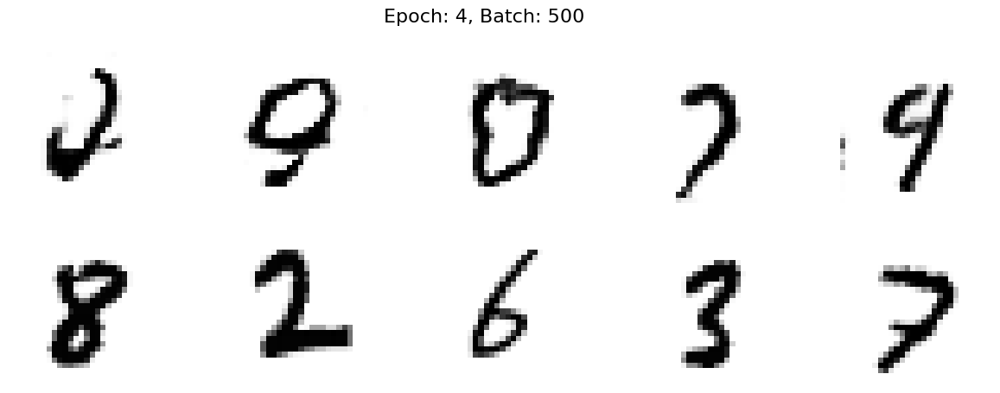

550 [D loss: 0.3065,	 acc.: 89.06%]	[G loss: 2.6830]
600 [D loss: 0.1561,	 acc.: 96.88%]	[G loss: 3.7303]
650 [D loss: 0.2046,	 acc.: 92.19%]	[G loss: 3.4203]
700 [D loss: 0.1281,	 acc.: 95.31%]	[G loss: 3.8977]
750 [D loss: 0.2811,	 acc.: 87.50%]	[G loss: 3.4618]
800 [D loss: 0.2539,	 acc.: 92.19%]	[G loss: 3.5348]
850 [D loss: 0.2462,	 acc.: 92.19%]	[G loss: 2.4648]
900 [D loss: 0.2487,	 acc.: 90.62%]	[G loss: 2.7218]
950 [D loss: 0.2090,	 acc.: 89.06%]	[G loss: 3.0301]
1000 [D loss: 0.3529,	 acc.: 85.94%]	[G loss: 3.5037]


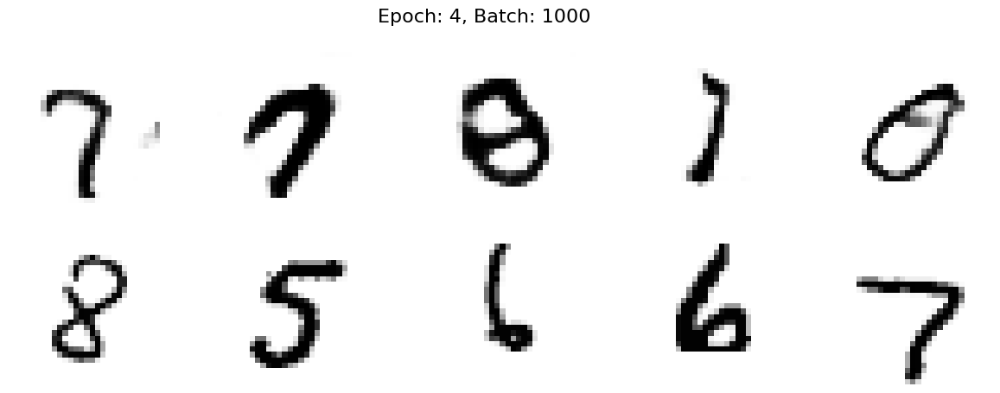

1050 [D loss: 0.2175,	 acc.: 89.06%]	[G loss: 3.7164]
1100 [D loss: 0.1251,	 acc.: 93.75%]	[G loss: 3.3526]
1150 [D loss: 0.2716,	 acc.: 82.81%]	[G loss: 2.7334]
1200 [D loss: 0.1775,	 acc.: 93.75%]	[G loss: 4.0894]
1250 [D loss: 0.2397,	 acc.: 92.19%]	[G loss: 3.8456]
1300 [D loss: 0.1811,	 acc.: 95.31%]	[G loss: 3.5605]
1350 [D loss: 0.1670,	 acc.: 92.19%]	[G loss: 3.4541]
1400 [D loss: 0.2519,	 acc.: 90.62%]	[G loss: 4.3549]
1450 [D loss: 0.2444,	 acc.: 89.06%]	[G loss: 3.5196]
1500 [D loss: 0.2220,	 acc.: 90.62%]	[G loss: 3.5817]


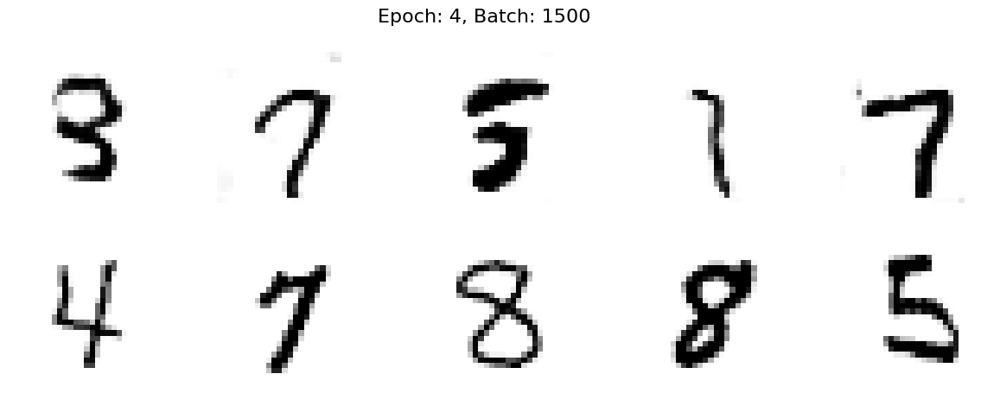

1550 [D loss: 0.1912,	 acc.: 90.62%]	[G loss: 3.7313]
1600 [D loss: 0.2331,	 acc.: 90.62%]	[G loss: 2.9651]
1650 [D loss: 0.1746,	 acc.: 93.75%]	[G loss: 3.4470]
1700 [D loss: 0.4018,	 acc.: 85.94%]	[G loss: 3.9158]
1750 [D loss: 0.1850,	 acc.: 90.62%]	[G loss: 3.2552]
1800 [D loss: 0.1916,	 acc.: 93.75%]	[G loss: 3.6786]
1850 [D loss: 0.2421,	 acc.: 89.06%]	[G loss: 3.9823]


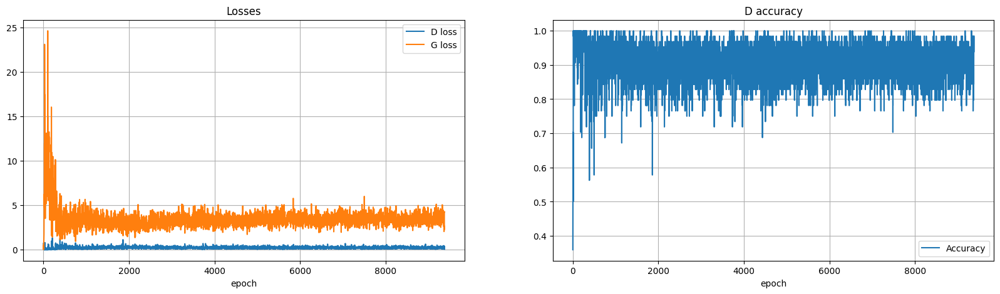

----EPOCH 5-----
0 [D loss: 0.2491,	 acc.: 87.50%]	[G loss: 4.1274]


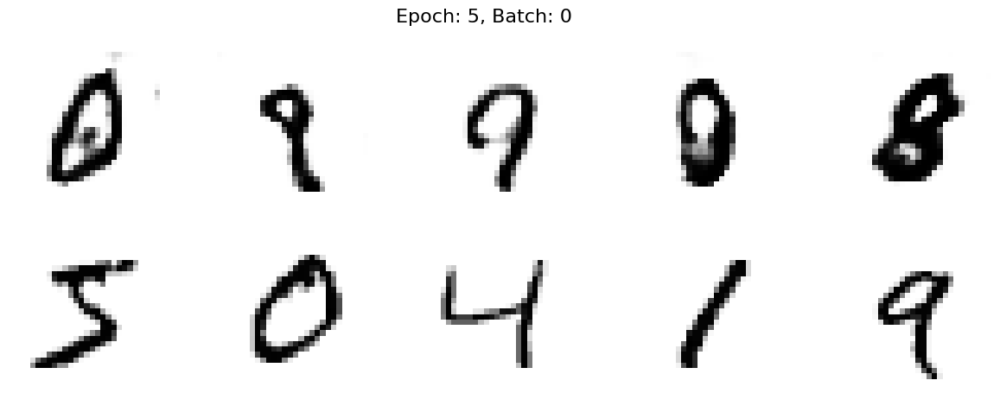

50 [D loss: 0.2321,	 acc.: 92.19%]	[G loss: 3.0365]
100 [D loss: 0.2373,	 acc.: 85.94%]	[G loss: 3.3047]
150 [D loss: 0.1837,	 acc.: 93.75%]	[G loss: 4.3834]
200 [D loss: 0.2006,	 acc.: 93.75%]	[G loss: 3.7779]
250 [D loss: 0.3336,	 acc.: 90.62%]	[G loss: 3.8723]
300 [D loss: 0.2382,	 acc.: 89.06%]	[G loss: 3.3343]
350 [D loss: 0.3161,	 acc.: 89.06%]	[G loss: 2.7951]
400 [D loss: 0.2839,	 acc.: 84.38%]	[G loss: 2.8353]
450 [D loss: 0.1440,	 acc.: 96.88%]	[G loss: 3.3215]
500 [D loss: 0.3142,	 acc.: 84.38%]	[G loss: 3.1757]


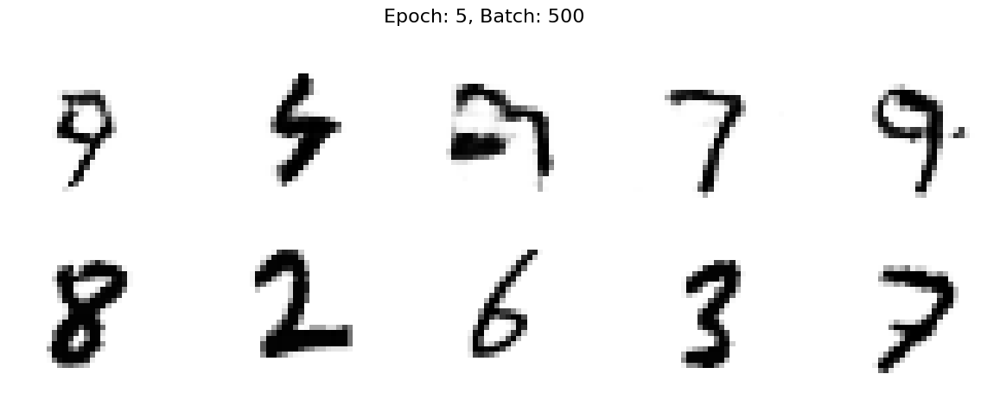

550 [D loss: 0.1236,	 acc.: 95.31%]	[G loss: 4.1971]
600 [D loss: 0.2108,	 acc.: 93.75%]	[G loss: 4.1370]
650 [D loss: 0.1924,	 acc.: 93.75%]	[G loss: 4.2986]
700 [D loss: 0.1169,	 acc.: 93.75%]	[G loss: 3.9858]
750 [D loss: 0.2110,	 acc.: 92.19%]	[G loss: 3.9131]
800 [D loss: 0.1721,	 acc.: 92.19%]	[G loss: 3.5143]
850 [D loss: 0.2391,	 acc.: 90.62%]	[G loss: 2.9375]
900 [D loss: 0.1607,	 acc.: 90.62%]	[G loss: 4.0628]
950 [D loss: 0.2308,	 acc.: 87.50%]	[G loss: 2.9829]
1000 [D loss: 0.4444,	 acc.: 84.38%]	[G loss: 3.6326]


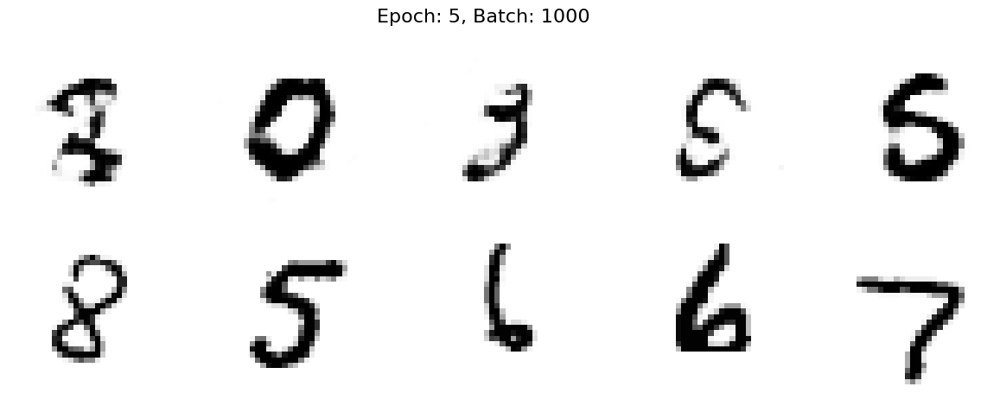

1050 [D loss: 0.2552,	 acc.: 90.62%]	[G loss: 4.0819]
1100 [D loss: 0.1138,	 acc.: 95.31%]	[G loss: 3.4162]
1150 [D loss: 0.2649,	 acc.: 87.50%]	[G loss: 3.2941]
1200 [D loss: 0.3306,	 acc.: 92.19%]	[G loss: 3.6803]
1250 [D loss: 0.1801,	 acc.: 93.75%]	[G loss: 3.7347]
1300 [D loss: 0.3052,	 acc.: 84.38%]	[G loss: 4.5122]
1350 [D loss: 0.1457,	 acc.: 93.75%]	[G loss: 4.2274]
1400 [D loss: 0.2663,	 acc.: 90.62%]	[G loss: 4.3226]
1450 [D loss: 0.2927,	 acc.: 89.06%]	[G loss: 3.8116]
1500 [D loss: 0.1802,	 acc.: 95.31%]	[G loss: 3.0741]


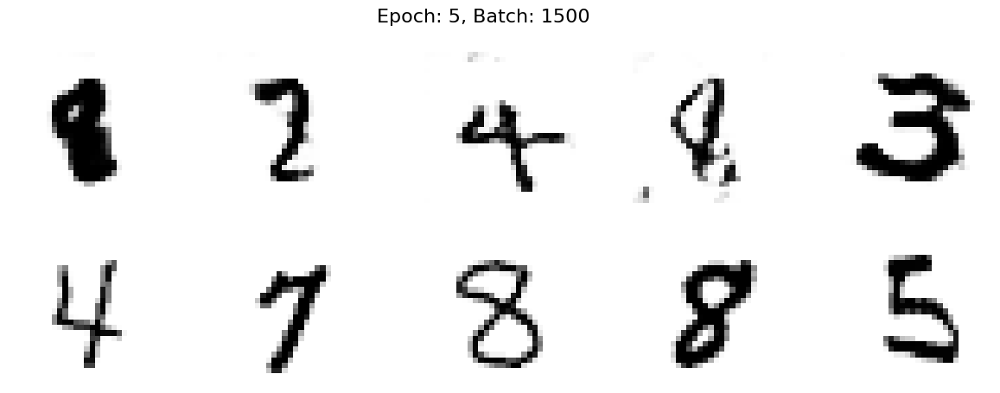

1550 [D loss: 0.0739,	 acc.: 96.88%]	[G loss: 3.8504]
1600 [D loss: 0.3110,	 acc.: 81.25%]	[G loss: 2.8166]
1650 [D loss: 0.2669,	 acc.: 89.06%]	[G loss: 3.6524]
1700 [D loss: 0.2555,	 acc.: 89.06%]	[G loss: 2.5307]
1750 [D loss: 0.2128,	 acc.: 90.62%]	[G loss: 3.8944]
1800 [D loss: 0.0790,	 acc.: 96.88%]	[G loss: 3.8571]
1850 [D loss: 0.1925,	 acc.: 90.62%]	[G loss: 3.9473]


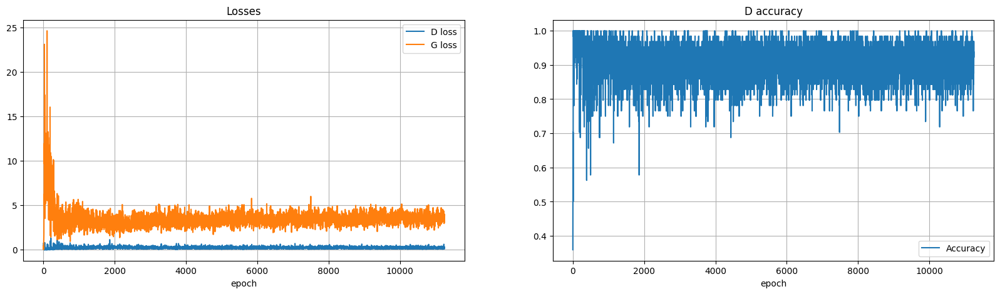

----EPOCH 6-----
0 [D loss: 0.1545,	 acc.: 93.75%]	[G loss: 4.3828]


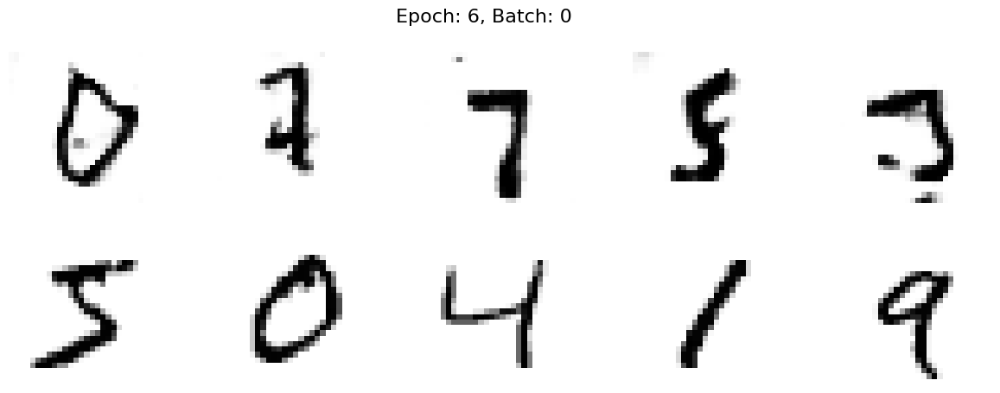

50 [D loss: 0.1615,	 acc.: 95.31%]	[G loss: 3.0174]
100 [D loss: 0.1593,	 acc.: 96.88%]	[G loss: 3.2173]
150 [D loss: 0.2670,	 acc.: 90.62%]	[G loss: 3.9866]
200 [D loss: 0.3154,	 acc.: 84.38%]	[G loss: 3.4021]
250 [D loss: 0.2249,	 acc.: 90.62%]	[G loss: 3.3494]
300 [D loss: 0.1928,	 acc.: 90.62%]	[G loss: 2.7644]
350 [D loss: 0.2258,	 acc.: 89.06%]	[G loss: 3.6567]
400 [D loss: 0.4296,	 acc.: 82.81%]	[G loss: 3.1834]
450 [D loss: 0.1573,	 acc.: 92.19%]	[G loss: 3.0965]
500 [D loss: 0.3464,	 acc.: 87.50%]	[G loss: 3.8767]


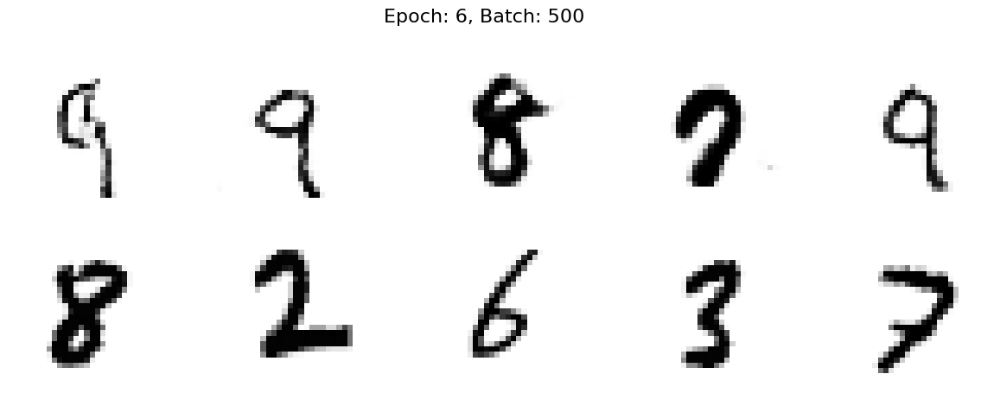

550 [D loss: 0.2002,	 acc.: 89.06%]	[G loss: 3.8772]
600 [D loss: 0.3391,	 acc.: 82.81%]	[G loss: 3.7008]
650 [D loss: 0.2588,	 acc.: 90.62%]	[G loss: 4.3804]
700 [D loss: 0.0806,	 acc.: 98.44%]	[G loss: 3.8043]
750 [D loss: 0.2893,	 acc.: 90.62%]	[G loss: 3.9583]
800 [D loss: 0.2102,	 acc.: 90.62%]	[G loss: 3.1721]
850 [D loss: 0.1397,	 acc.: 95.31%]	[G loss: 3.3457]
900 [D loss: 0.1360,	 acc.: 95.31%]	[G loss: 3.1446]
950 [D loss: 0.1320,	 acc.: 95.31%]	[G loss: 3.7565]
1000 [D loss: 0.2507,	 acc.: 89.06%]	[G loss: 3.6609]


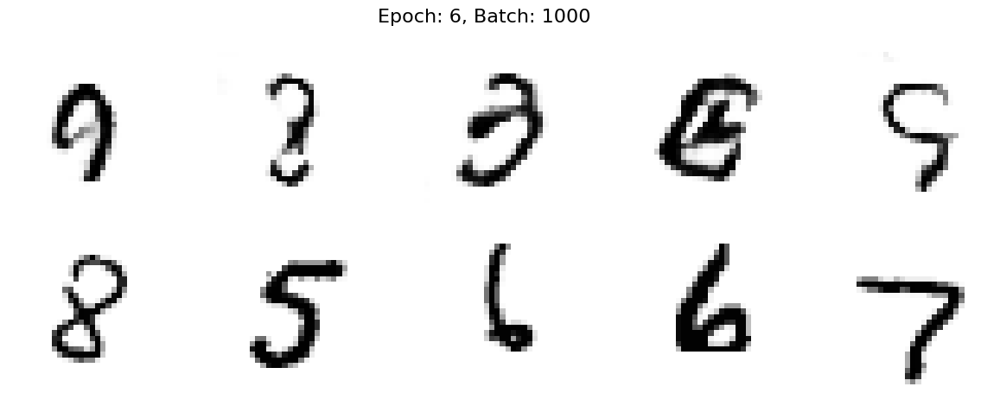

1050 [D loss: 0.1384,	 acc.: 96.88%]	[G loss: 3.5593]
1100 [D loss: 0.0561,	 acc.: 98.44%]	[G loss: 5.0465]
1150 [D loss: 0.2438,	 acc.: 92.19%]	[G loss: 4.2591]
1200 [D loss: 0.2069,	 acc.: 90.62%]	[G loss: 3.9110]
1250 [D loss: 0.1850,	 acc.: 93.75%]	[G loss: 3.7903]
1300 [D loss: 0.3116,	 acc.: 84.38%]	[G loss: 3.9219]
1350 [D loss: 0.1252,	 acc.: 93.75%]	[G loss: 3.3520]
1400 [D loss: 0.3162,	 acc.: 85.94%]	[G loss: 3.9483]
1450 [D loss: 0.1802,	 acc.: 92.19%]	[G loss: 3.7434]
1500 [D loss: 0.2853,	 acc.: 85.94%]	[G loss: 3.6143]


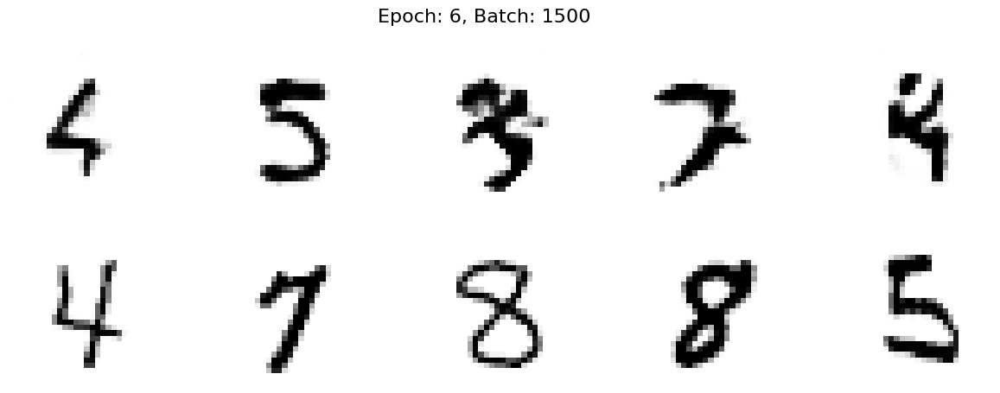

1550 [D loss: 0.1383,	 acc.: 95.31%]	[G loss: 4.6545]
1600 [D loss: 0.2963,	 acc.: 92.19%]	[G loss: 3.1124]
1650 [D loss: 0.3003,	 acc.: 87.50%]	[G loss: 4.0429]
1700 [D loss: 0.2868,	 acc.: 85.94%]	[G loss: 3.2699]
1750 [D loss: 0.2018,	 acc.: 90.62%]	[G loss: 4.0286]
1800 [D loss: 0.1446,	 acc.: 92.19%]	[G loss: 3.8777]
1850 [D loss: 0.2291,	 acc.: 85.94%]	[G loss: 3.6202]


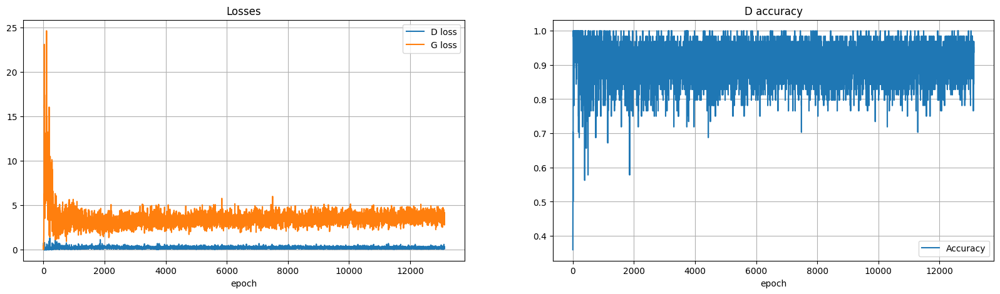

----EPOCH 7-----
0 [D loss: 0.1787,	 acc.: 93.75%]	[G loss: 3.8544]


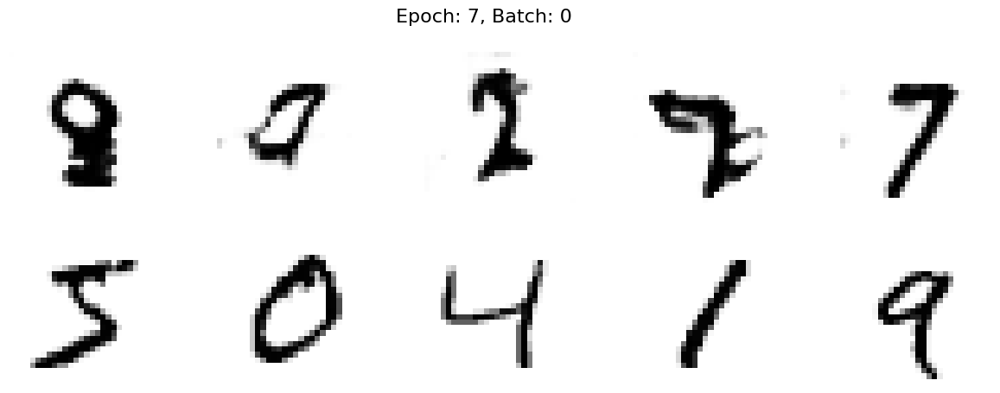

50 [D loss: 0.2403,	 acc.: 89.06%]	[G loss: 3.0956]
100 [D loss: 0.2450,	 acc.: 89.06%]	[G loss: 3.7107]
150 [D loss: 0.1297,	 acc.: 96.88%]	[G loss: 4.3861]
200 [D loss: 0.0979,	 acc.: 98.44%]	[G loss: 3.9622]
250 [D loss: 0.1256,	 acc.: 93.75%]	[G loss: 3.9496]
300 [D loss: 0.1624,	 acc.: 92.19%]	[G loss: 2.8741]
350 [D loss: 0.1676,	 acc.: 92.19%]	[G loss: 3.9185]
400 [D loss: 0.4906,	 acc.: 81.25%]	[G loss: 3.5886]
450 [D loss: 0.0907,	 acc.: 95.31%]	[G loss: 3.6840]
500 [D loss: 0.3810,	 acc.: 84.38%]	[G loss: 2.7194]


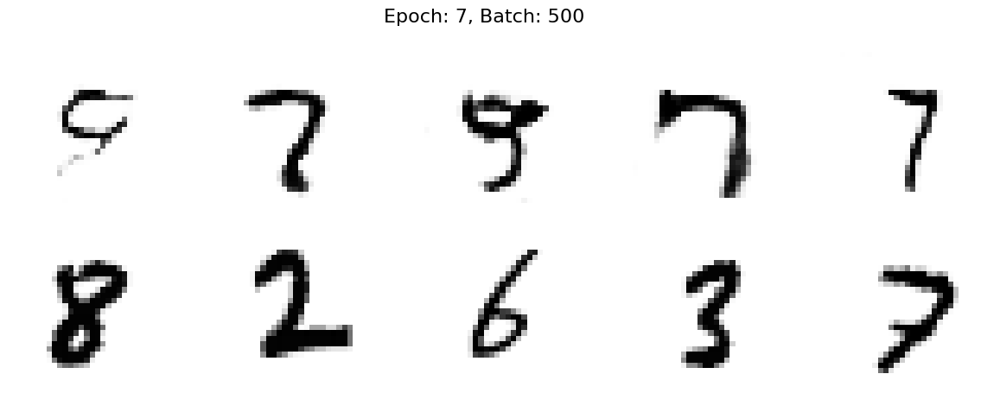

550 [D loss: 0.1797,	 acc.: 95.31%]	[G loss: 4.2976]
600 [D loss: 0.2836,	 acc.: 87.50%]	[G loss: 3.8545]
650 [D loss: 0.2112,	 acc.: 95.31%]	[G loss: 4.0568]
700 [D loss: 0.1020,	 acc.: 95.31%]	[G loss: 4.1718]
750 [D loss: 0.2204,	 acc.: 92.19%]	[G loss: 3.5853]
800 [D loss: 0.1757,	 acc.: 92.19%]	[G loss: 3.3906]
850 [D loss: 0.0825,	 acc.: 98.44%]	[G loss: 4.1139]
900 [D loss: 0.1289,	 acc.: 95.31%]	[G loss: 3.5635]
950 [D loss: 0.2142,	 acc.: 87.50%]	[G loss: 2.9514]
1000 [D loss: 0.2170,	 acc.: 90.62%]	[G loss: 3.7198]


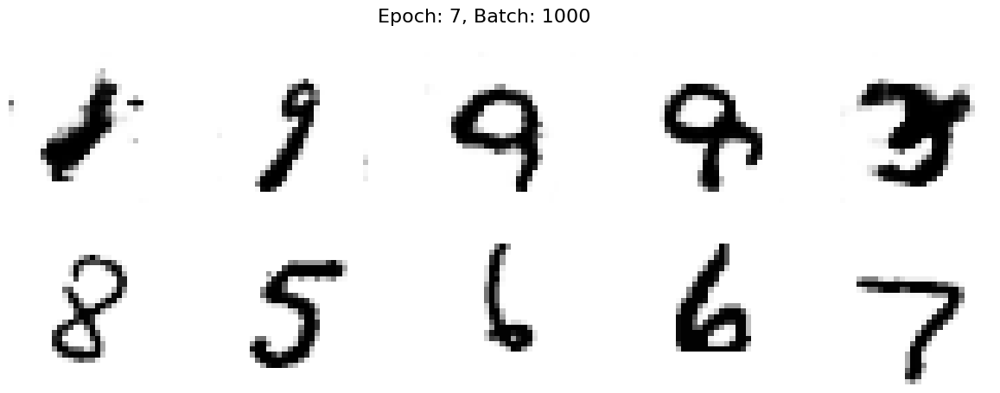

1050 [D loss: 0.2494,	 acc.: 93.75%]	[G loss: 3.3509]
1100 [D loss: 0.1383,	 acc.: 96.88%]	[G loss: 3.5815]
1150 [D loss: 0.2397,	 acc.: 90.62%]	[G loss: 4.0216]
1200 [D loss: 0.1178,	 acc.: 96.88%]	[G loss: 4.1652]
1250 [D loss: 0.2030,	 acc.: 92.19%]	[G loss: 3.2603]
1300 [D loss: 0.2170,	 acc.: 90.62%]	[G loss: 4.2651]
1350 [D loss: 0.2029,	 acc.: 92.19%]	[G loss: 3.8527]
1400 [D loss: 0.1922,	 acc.: 90.62%]	[G loss: 4.7374]
1450 [D loss: 0.1482,	 acc.: 93.75%]	[G loss: 3.3347]
1500 [D loss: 0.1613,	 acc.: 92.19%]	[G loss: 3.0400]


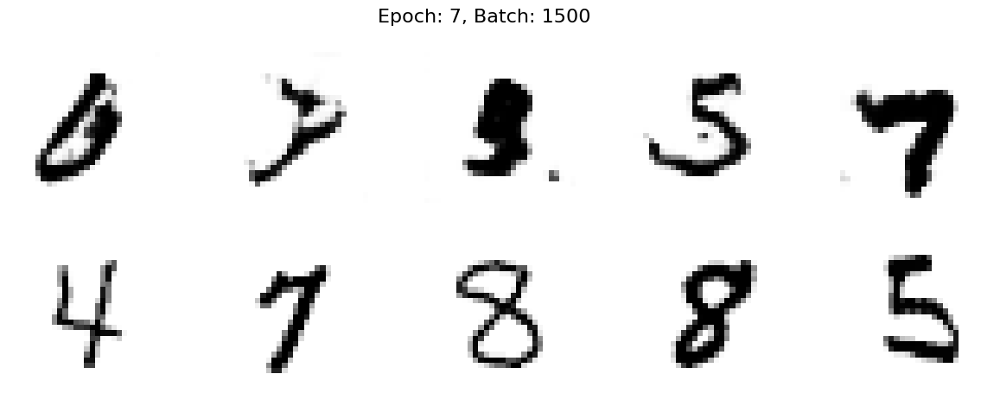

1550 [D loss: 0.0848,	 acc.: 98.44%]	[G loss: 4.2832]
1600 [D loss: 0.1976,	 acc.: 89.06%]	[G loss: 3.2033]
1650 [D loss: 0.3171,	 acc.: 85.94%]	[G loss: 4.2135]
1700 [D loss: 0.3013,	 acc.: 87.50%]	[G loss: 3.1774]
1750 [D loss: 0.1611,	 acc.: 95.31%]	[G loss: 3.4923]
1800 [D loss: 0.1072,	 acc.: 95.31%]	[G loss: 3.6842]
1850 [D loss: 0.2259,	 acc.: 89.06%]	[G loss: 3.2748]


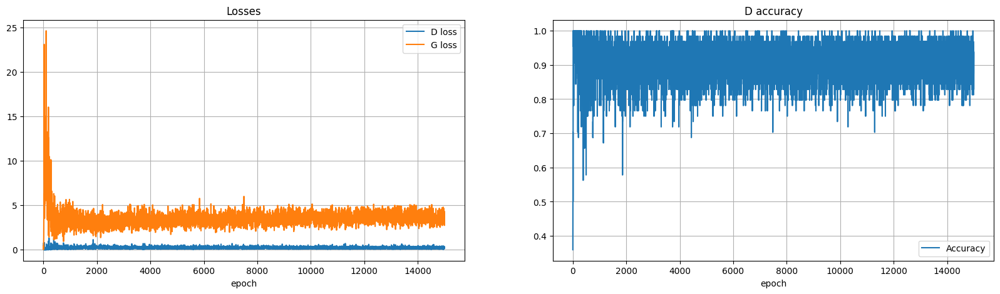

----EPOCH 8-----
0 [D loss: 0.1925,	 acc.: 90.62%]	[G loss: 4.6764]


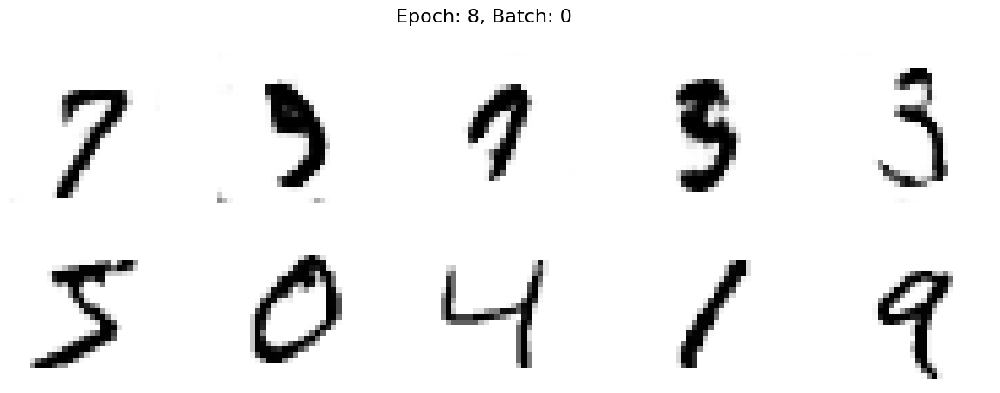

50 [D loss: 0.2031,	 acc.: 90.62%]	[G loss: 3.5537]
100 [D loss: 0.2966,	 acc.: 89.06%]	[G loss: 3.3459]
150 [D loss: 0.1759,	 acc.: 92.19%]	[G loss: 3.9383]
200 [D loss: 0.0874,	 acc.: 100.00%]	[G loss: 3.5156]
250 [D loss: 0.1609,	 acc.: 95.31%]	[G loss: 3.7210]
300 [D loss: 0.2562,	 acc.: 87.50%]	[G loss: 3.1188]
350 [D loss: 0.3623,	 acc.: 82.81%]	[G loss: 2.6114]
400 [D loss: 0.1401,	 acc.: 92.19%]	[G loss: 3.5183]
450 [D loss: 0.0967,	 acc.: 96.88%]	[G loss: 3.3825]
500 [D loss: 0.2076,	 acc.: 92.19%]	[G loss: 3.5308]


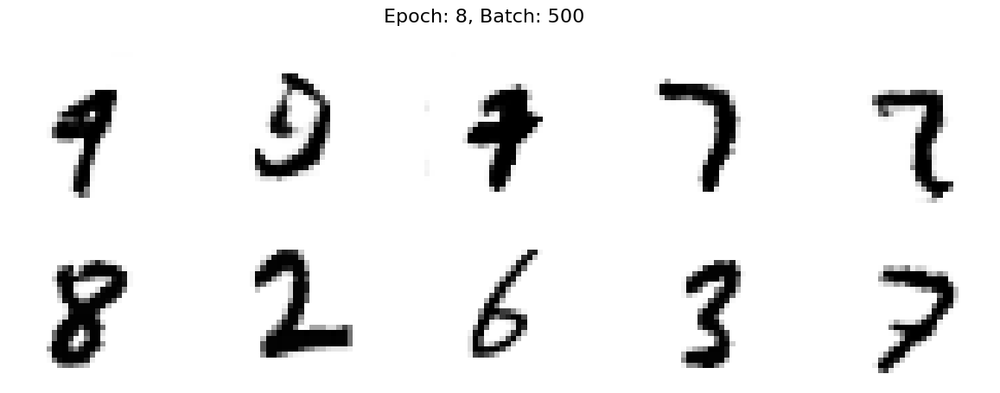

550 [D loss: 0.1775,	 acc.: 89.06%]	[G loss: 4.7423]
600 [D loss: 0.1112,	 acc.: 98.44%]	[G loss: 3.3805]
650 [D loss: 0.0817,	 acc.: 98.44%]	[G loss: 4.4274]
700 [D loss: 0.1576,	 acc.: 93.75%]	[G loss: 2.9860]
750 [D loss: 0.3758,	 acc.: 85.94%]	[G loss: 3.8115]
800 [D loss: 0.1222,	 acc.: 95.31%]	[G loss: 3.6005]
850 [D loss: 0.2023,	 acc.: 90.62%]	[G loss: 4.0983]
900 [D loss: 0.1057,	 acc.: 93.75%]	[G loss: 3.3380]
950 [D loss: 0.1391,	 acc.: 95.31%]	[G loss: 4.4646]
1000 [D loss: 0.2502,	 acc.: 89.06%]	[G loss: 4.8856]


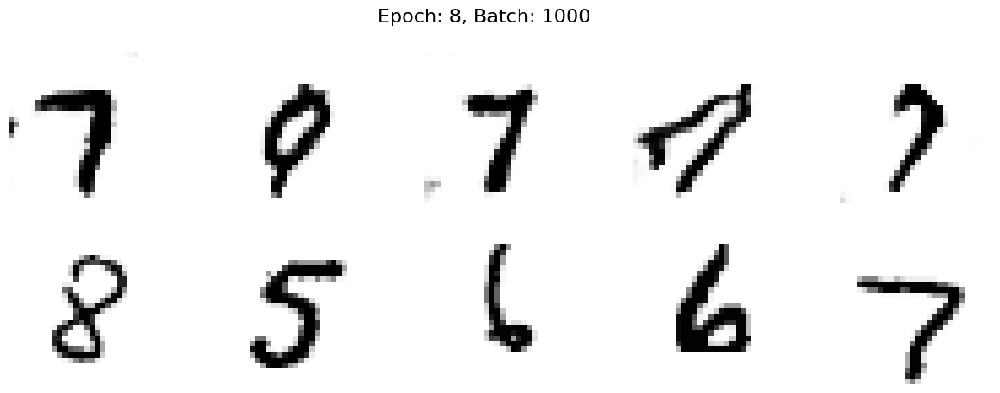

1050 [D loss: 0.1870,	 acc.: 92.19%]	[G loss: 3.9266]
1100 [D loss: 0.1270,	 acc.: 93.75%]	[G loss: 3.2977]
1150 [D loss: 0.1604,	 acc.: 95.31%]	[G loss: 3.6354]
1200 [D loss: 0.3052,	 acc.: 93.75%]	[G loss: 4.8905]
1250 [D loss: 0.1823,	 acc.: 93.75%]	[G loss: 4.3233]
1300 [D loss: 0.1352,	 acc.: 95.31%]	[G loss: 4.0771]
1350 [D loss: 0.1780,	 acc.: 93.75%]	[G loss: 3.4676]
1400 [D loss: 0.1485,	 acc.: 90.62%]	[G loss: 4.7779]
1450 [D loss: 0.1532,	 acc.: 92.19%]	[G loss: 4.7353]
1500 [D loss: 0.1761,	 acc.: 92.19%]	[G loss: 3.4096]


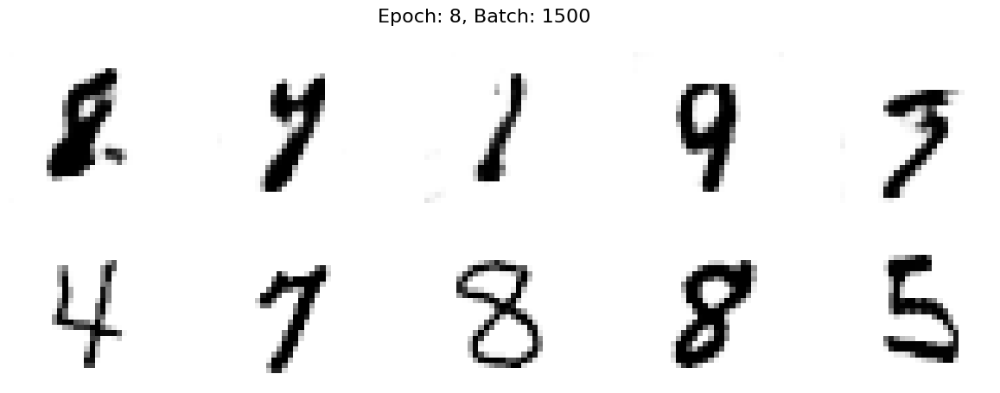

1550 [D loss: 0.1582,	 acc.: 92.19%]	[G loss: 3.4285]
1600 [D loss: 0.1920,	 acc.: 93.75%]	[G loss: 3.2828]
1650 [D loss: 0.2761,	 acc.: 90.62%]	[G loss: 3.7637]
1700 [D loss: 0.2809,	 acc.: 89.06%]	[G loss: 3.5926]
1750 [D loss: 0.1215,	 acc.: 95.31%]	[G loss: 3.3608]
1800 [D loss: 0.1841,	 acc.: 93.75%]	[G loss: 3.9313]
1850 [D loss: 0.2581,	 acc.: 89.06%]	[G loss: 3.4238]


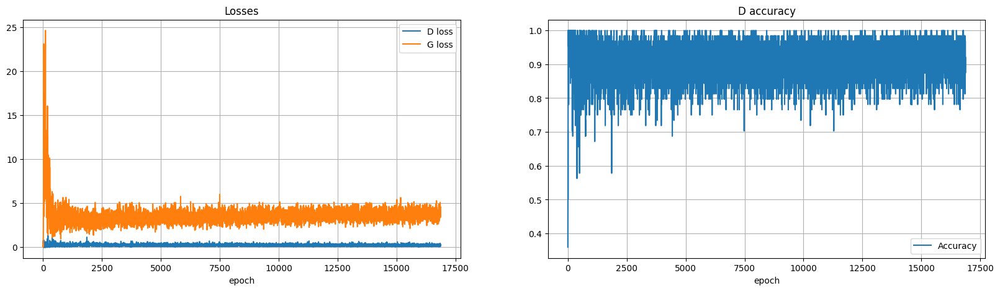

----EPOCH 9-----
0 [D loss: 0.2674,	 acc.: 87.50%]	[G loss: 4.9937]


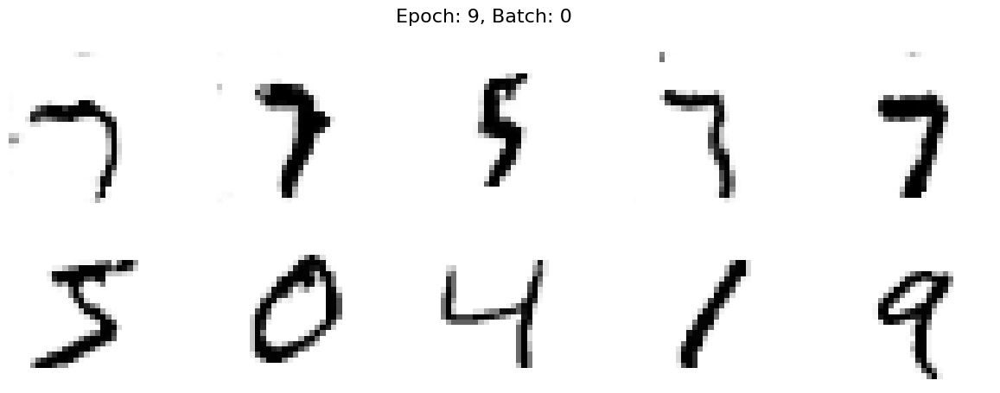

50 [D loss: 0.2803,	 acc.: 90.62%]	[G loss: 3.3165]
100 [D loss: 0.1185,	 acc.: 93.75%]	[G loss: 4.0470]
150 [D loss: 0.2662,	 acc.: 87.50%]	[G loss: 3.5004]
200 [D loss: 0.1385,	 acc.: 90.62%]	[G loss: 3.4410]
250 [D loss: 0.1121,	 acc.: 96.88%]	[G loss: 3.8258]
300 [D loss: 0.1356,	 acc.: 95.31%]	[G loss: 3.2833]
350 [D loss: 0.2934,	 acc.: 89.06%]	[G loss: 3.9791]
400 [D loss: 0.1768,	 acc.: 90.62%]	[G loss: 3.3067]
450 [D loss: 0.2738,	 acc.: 89.06%]	[G loss: 3.9461]
500 [D loss: 0.2994,	 acc.: 85.94%]	[G loss: 3.3817]


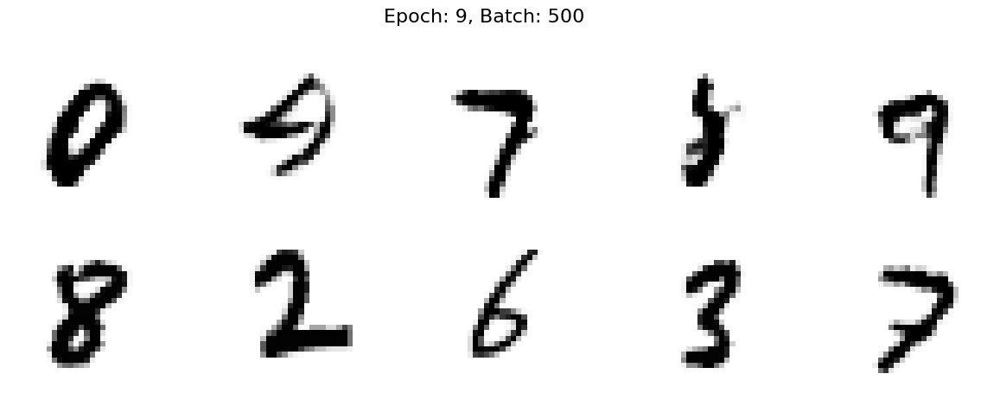

550 [D loss: 0.1208,	 acc.: 95.31%]	[G loss: 3.8609]
600 [D loss: 0.2206,	 acc.: 87.50%]	[G loss: 3.7068]
650 [D loss: 0.1302,	 acc.: 93.75%]	[G loss: 3.9865]
700 [D loss: 0.1167,	 acc.: 96.88%]	[G loss: 3.0698]
750 [D loss: 0.1910,	 acc.: 95.31%]	[G loss: 3.7733]
800 [D loss: 0.1698,	 acc.: 95.31%]	[G loss: 3.6924]
850 [D loss: 0.1725,	 acc.: 93.75%]	[G loss: 3.2942]
900 [D loss: 0.1271,	 acc.: 93.75%]	[G loss: 3.1894]
950 [D loss: 0.1834,	 acc.: 90.62%]	[G loss: 3.5766]
1000 [D loss: 0.2858,	 acc.: 90.62%]	[G loss: 3.5382]


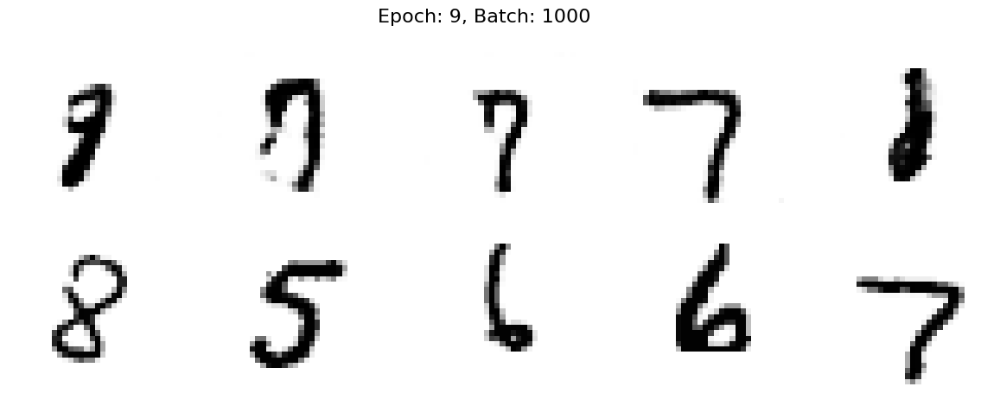

1050 [D loss: 0.1018,	 acc.: 96.88%]	[G loss: 3.9097]
1100 [D loss: 0.1906,	 acc.: 93.75%]	[G loss: 4.2870]
1150 [D loss: 0.1776,	 acc.: 93.75%]	[G loss: 3.7895]
1200 [D loss: 0.1177,	 acc.: 93.75%]	[G loss: 3.8762]
1250 [D loss: 0.1471,	 acc.: 92.19%]	[G loss: 4.4265]
1300 [D loss: 0.2306,	 acc.: 89.06%]	[G loss: 3.6961]
1350 [D loss: 0.1226,	 acc.: 92.19%]	[G loss: 3.5452]
1400 [D loss: 0.1070,	 acc.: 95.31%]	[G loss: 4.2141]
1450 [D loss: 0.2044,	 acc.: 93.75%]	[G loss: 4.0731]
1500 [D loss: 0.0921,	 acc.: 96.88%]	[G loss: 2.9819]


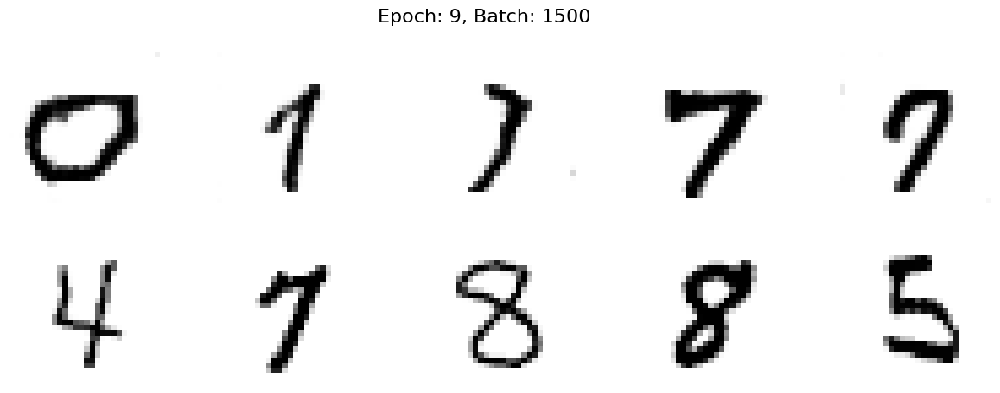

1550 [D loss: 0.1575,	 acc.: 95.31%]	[G loss: 4.1572]
1600 [D loss: 0.2310,	 acc.: 89.06%]	[G loss: 2.7344]
1650 [D loss: 0.3276,	 acc.: 85.94%]	[G loss: 3.6182]
1700 [D loss: 0.1862,	 acc.: 93.75%]	[G loss: 4.7677]
1750 [D loss: 0.2065,	 acc.: 93.75%]	[G loss: 4.1531]
1800 [D loss: 0.0696,	 acc.: 96.88%]	[G loss: 4.4377]
1850 [D loss: 0.2035,	 acc.: 92.19%]	[G loss: 3.4551]


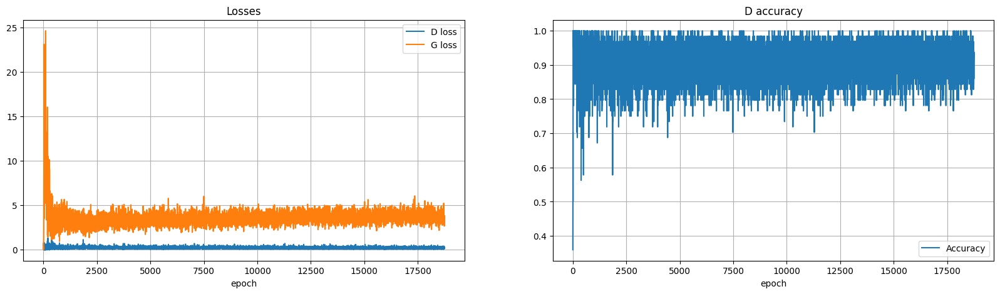

In [ ]:
train(X_train, generator, discriminator, combined, epochs=10, batch_size=32, sample_interval=100)

> Los resultado son ligeramente más variados que en el baseline, ya no esta tan pronunciado ese colapso modal inicial. Sin embargo, la calidad se ha visto un reducida. Considero que es útil usar dropouts y para desarrollar una solución mejor a la inical necesito mantenerlos, además me ayuda a reducir un poco el overfitting.

> Como conclusión a esta parte quiero destacar que el uso de dropout no fue mi única estrategía de mejora, también probé L2 pero los resultados fueron peores, no he añadido el código para no cargar demasiado el cuaderno.

# Tercera oportunidad de mejora

> Aumentar el número de capas

## Generador definition

> He tenido que modificar varias lineas de código para cuadrar las dimensiones. Entre ellas el Reshape y la capa densa inicial dado que era necesario para mantener el (28,28,1). Por otro lado, he decidido eliminar los dropouts en el generador. Las capas han pasado de (64, 32) a (128, 64 y 32). El stride de la capa con filtro 32 esta a 1 para cuadrar el tamaño de la imagen.

> Los filtros los estoy poniendo subjetivamente, he visto que existe una tendencia general a usar potencias de 2 y simplemente es lo que estoy haciendo para definir la arquitectura.

In [ ]:
def create_generator():

    input = Input(shape=(100))

    x = Dense(7 * 7 * 256)(input)
    x = Reshape((7, 7, 256))(x)

    x = Conv2DTranspose(128, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2DTranspose(32, kernel_size=3, strides=1, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    output = Conv2DTranspose(1, kernel_size=3, strides=1, padding="same", activation="tanh")(x)

    generator = Model(input, output)

    return generator

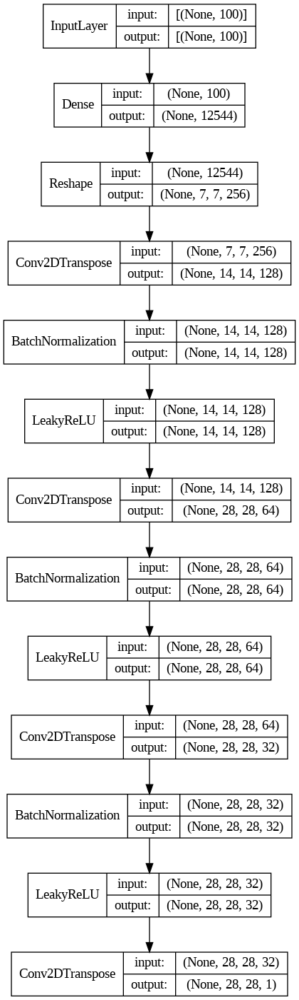

In [ ]:
generator = create_generator()
plot_model(generator, show_shapes=True, show_layer_names=False)

## Discriminador definition

Voy a modificar el tamaño del kernel a 5 para intenar recoger más características durante la discriminación, para ello cambio el hiperparámetro a 5, y por otro lado mantengo una capa de dropout.

In [ ]:
def create_discriminator():
    input = Input(shape=(28, 28, 1))

    # Rellene con la red neuronal convolucional deseada

    x = Conv2D(32, kernel_size=5, strides=2, padding="same")(input)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2D(64, kernel_size=5, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2D(128, kernel_size=5, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Flatten()(x)

    x = Dropout(0.2)(x)

    output =  Dense(1, activation="sigmoid")(x)

    discriminator = Model(input, output)

    return discriminator

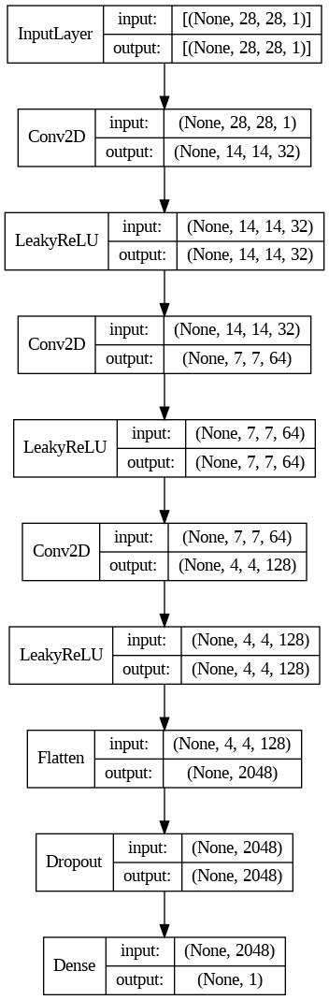

In [ ]:
discriminator = create_discriminator()
plot_model(discriminator, show_shapes=True, show_layer_names=False)

## GAN model definition

In [ ]:
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
discriminator.trainable = False

z = Input(shape=(100,))
img = generator(z)
validity = discriminator(img)

combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam())

## Análisis de resultado

----EPOCH 0-----
0 [D loss: 0.7219,	 acc.: 0.00%]	[G loss: 0.5593]


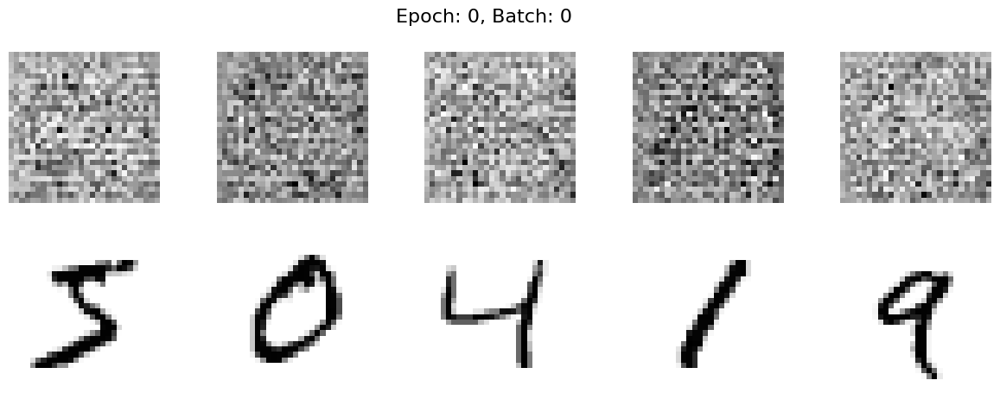

50 [D loss: 0.0106,	 acc.: 100.00%]	[G loss: 7.5741]
100 [D loss: 0.0108,	 acc.: 100.00%]	[G loss: 5.7988]
150 [D loss: 0.0259,	 acc.: 100.00%]	[G loss: 4.5742]
200 [D loss: 0.3288,	 acc.: 87.50%]	[G loss: 1.8876]
250 [D loss: 1.5693,	 acc.: 50.00%]	[G loss: 2.0393]
300 [D loss: 0.4095,	 acc.: 79.69%]	[G loss: 1.5718]
350 [D loss: 0.2005,	 acc.: 93.75%]	[G loss: 2.6739]
400 [D loss: 0.3304,	 acc.: 85.94%]	[G loss: 2.0187]
450 [D loss: 0.4988,	 acc.: 76.56%]	[G loss: 1.6861]
500 [D loss: 0.2033,	 acc.: 96.88%]	[G loss: 2.9946]


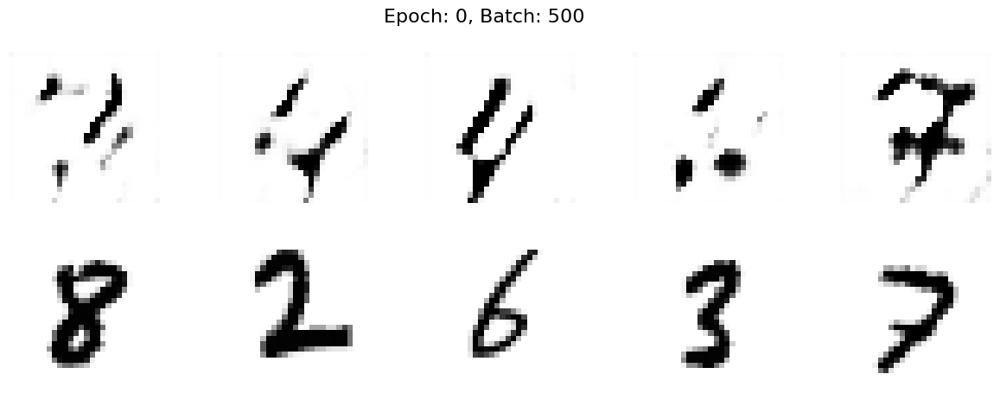

550 [D loss: 0.4808,	 acc.: 84.38%]	[G loss: 2.3295]
600 [D loss: 0.7980,	 acc.: 67.19%]	[G loss: 1.4495]
650 [D loss: 0.3596,	 acc.: 79.69%]	[G loss: 2.0732]
700 [D loss: 0.3127,	 acc.: 87.50%]	[G loss: 2.5859]
750 [D loss: 0.3280,	 acc.: 89.06%]	[G loss: 2.1685]
800 [D loss: 0.4035,	 acc.: 84.38%]	[G loss: 1.3130]
850 [D loss: 0.2248,	 acc.: 95.31%]	[G loss: 2.3429]
900 [D loss: 0.2261,	 acc.: 90.62%]	[G loss: 2.1445]
950 [D loss: 0.3761,	 acc.: 82.81%]	[G loss: 1.9045]
1000 [D loss: 0.5131,	 acc.: 73.44%]	[G loss: 1.1816]


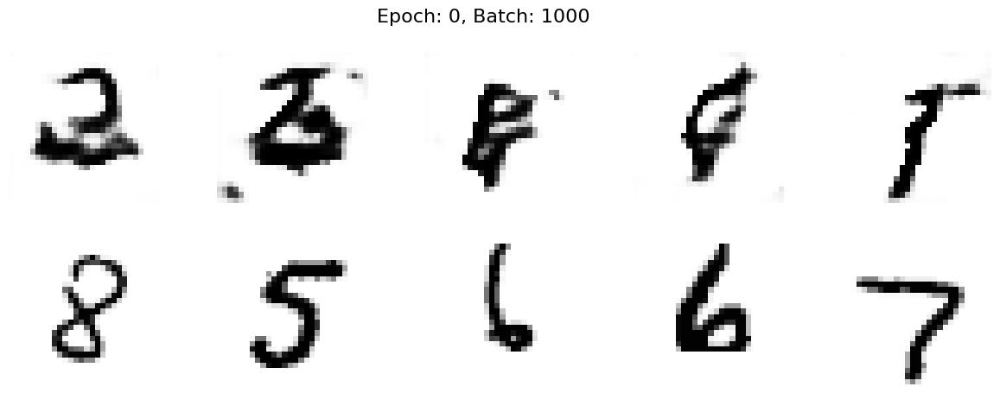

1050 [D loss: 0.2908,	 acc.: 92.19%]	[G loss: 1.9765]
1100 [D loss: 0.4545,	 acc.: 82.81%]	[G loss: 1.9095]
1150 [D loss: 0.2336,	 acc.: 89.06%]	[G loss: 2.6197]
1200 [D loss: 0.3047,	 acc.: 87.50%]	[G loss: 1.9387]
1250 [D loss: 0.3802,	 acc.: 82.81%]	[G loss: 1.8487]
1300 [D loss: 0.2387,	 acc.: 95.31%]	[G loss: 1.9657]
1350 [D loss: 0.3176,	 acc.: 85.94%]	[G loss: 2.8881]
1400 [D loss: 0.3458,	 acc.: 82.81%]	[G loss: 1.8609]
1450 [D loss: 0.3458,	 acc.: 82.81%]	[G loss: 1.5686]
1500 [D loss: 0.4611,	 acc.: 78.12%]	[G loss: 2.0615]


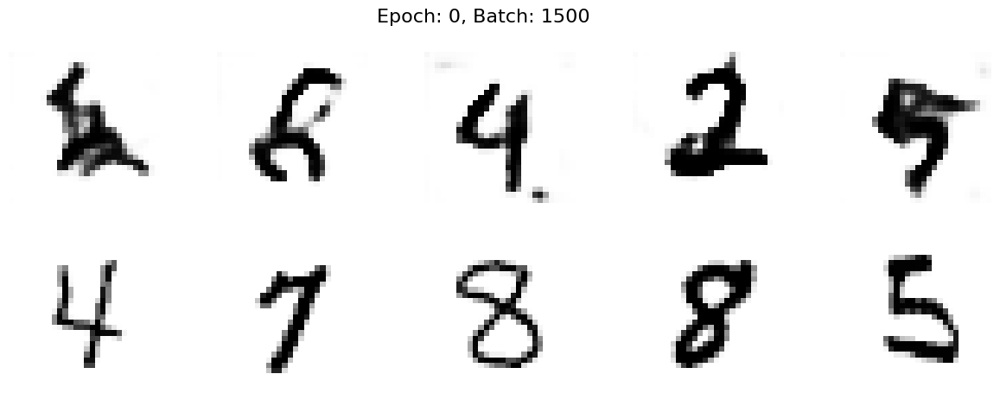

1550 [D loss: 0.2402,	 acc.: 92.19%]	[G loss: 2.3150]
1600 [D loss: 0.4900,	 acc.: 81.25%]	[G loss: 1.8895]
1650 [D loss: 0.4846,	 acc.: 78.12%]	[G loss: 1.5088]
1700 [D loss: 0.2952,	 acc.: 87.50%]	[G loss: 1.9594]
1750 [D loss: 0.5315,	 acc.: 76.56%]	[G loss: 2.3755]
1800 [D loss: 0.4300,	 acc.: 81.25%]	[G loss: 2.0443]
1850 [D loss: 0.3861,	 acc.: 82.81%]	[G loss: 2.0378]


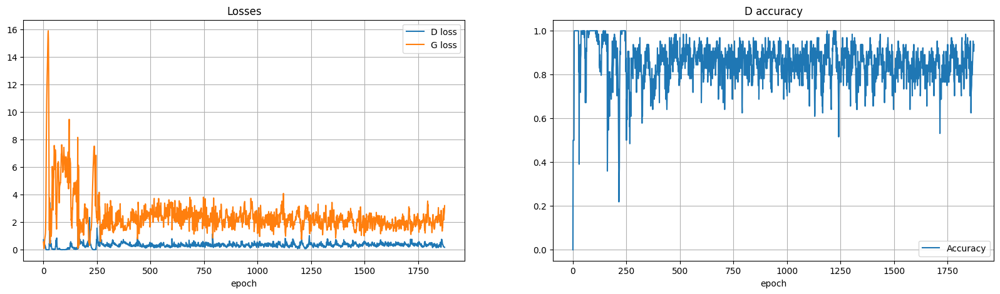

----EPOCH 1-----
0 [D loss: 0.3014,	 acc.: 89.06%]	[G loss: 3.4042]


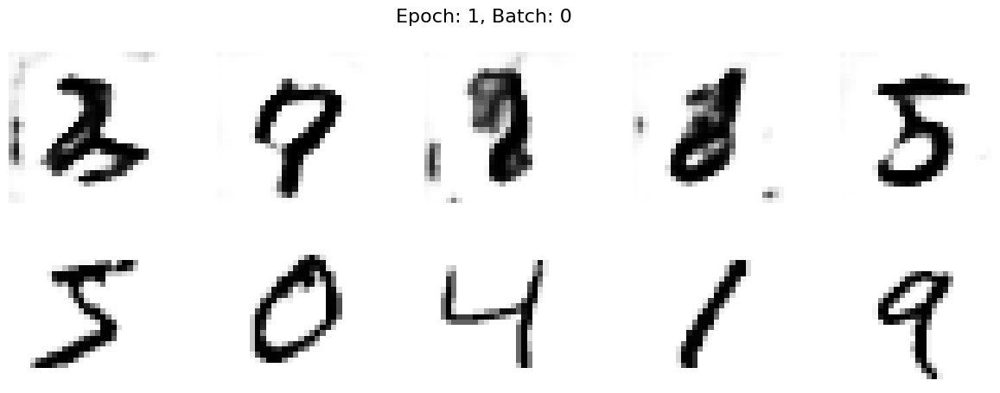

50 [D loss: 0.4110,	 acc.: 84.38%]	[G loss: 2.1566]
100 [D loss: 0.3367,	 acc.: 84.38%]	[G loss: 1.6571]
150 [D loss: 0.3894,	 acc.: 84.38%]	[G loss: 2.1903]
200 [D loss: 0.4203,	 acc.: 78.12%]	[G loss: 2.9225]
250 [D loss: 0.2037,	 acc.: 93.75%]	[G loss: 2.3452]
300 [D loss: 0.4610,	 acc.: 75.00%]	[G loss: 3.0527]
350 [D loss: 0.4740,	 acc.: 76.56%]	[G loss: 1.7847]
400 [D loss: 0.3879,	 acc.: 76.56%]	[G loss: 1.6509]
450 [D loss: 0.4077,	 acc.: 79.69%]	[G loss: 1.4077]
500 [D loss: 0.4502,	 acc.: 78.12%]	[G loss: 1.7179]


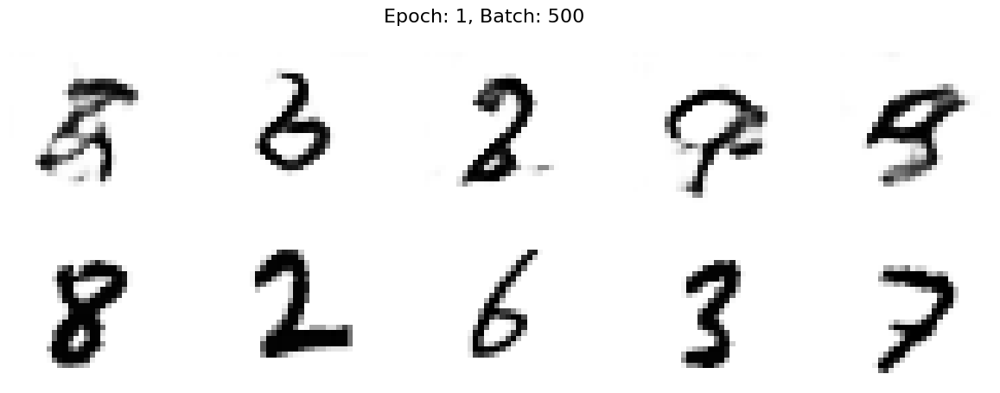

550 [D loss: 0.2889,	 acc.: 89.06%]	[G loss: 2.2965]
600 [D loss: 0.5264,	 acc.: 79.69%]	[G loss: 2.2490]
650 [D loss: 0.2626,	 acc.: 89.06%]	[G loss: 2.2704]
700 [D loss: 0.2978,	 acc.: 87.50%]	[G loss: 1.6693]
750 [D loss: 0.3330,	 acc.: 84.38%]	[G loss: 2.8256]
800 [D loss: 0.3584,	 acc.: 78.12%]	[G loss: 1.9626]
850 [D loss: 0.3370,	 acc.: 85.94%]	[G loss: 1.7218]
900 [D loss: 0.2807,	 acc.: 84.38%]	[G loss: 2.2369]
950 [D loss: 0.3284,	 acc.: 87.50%]	[G loss: 1.9215]
1000 [D loss: 0.4139,	 acc.: 85.94%]	[G loss: 2.2809]


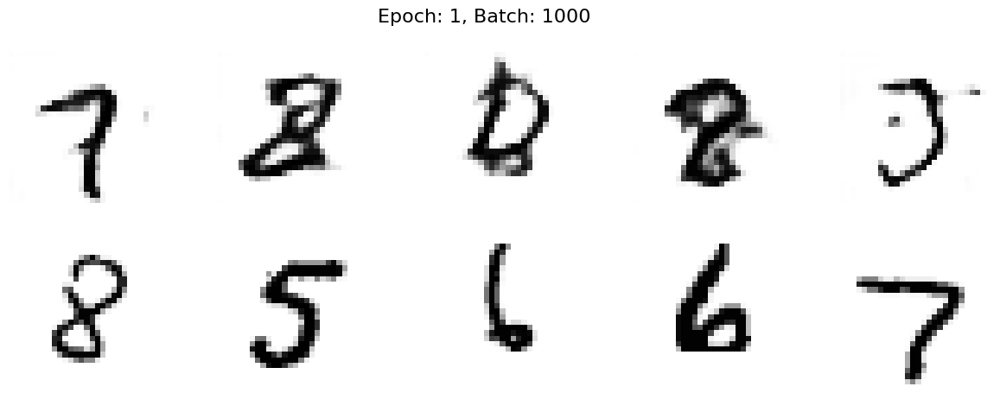

1050 [D loss: 0.4464,	 acc.: 81.25%]	[G loss: 1.9454]
1100 [D loss: 0.3940,	 acc.: 82.81%]	[G loss: 2.7529]
1150 [D loss: 0.4462,	 acc.: 76.56%]	[G loss: 2.1821]
1200 [D loss: 0.3353,	 acc.: 85.94%]	[G loss: 2.0093]
1250 [D loss: 0.4691,	 acc.: 79.69%]	[G loss: 1.7066]
1300 [D loss: 0.3390,	 acc.: 82.81%]	[G loss: 2.3529]
1350 [D loss: 0.5610,	 acc.: 70.31%]	[G loss: 2.1553]
1400 [D loss: 0.3345,	 acc.: 84.38%]	[G loss: 2.9030]
1450 [D loss: 0.3698,	 acc.: 81.25%]	[G loss: 1.8823]
1500 [D loss: 0.3401,	 acc.: 81.25%]	[G loss: 1.9188]


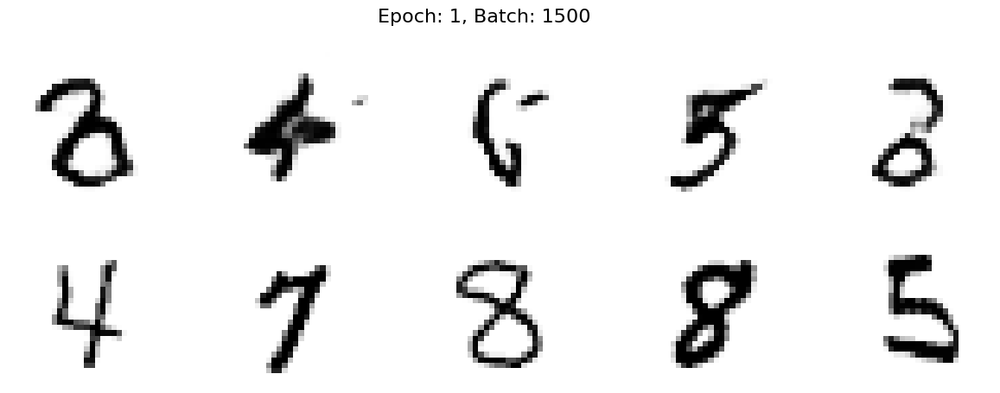

1550 [D loss: 0.3248,	 acc.: 85.94%]	[G loss: 1.8940]
1600 [D loss: 0.5385,	 acc.: 79.69%]	[G loss: 2.0440]
1650 [D loss: 0.4636,	 acc.: 76.56%]	[G loss: 1.9511]
1700 [D loss: 0.1946,	 acc.: 95.31%]	[G loss: 1.9091]
1750 [D loss: 0.4018,	 acc.: 79.69%]	[G loss: 2.5083]
1800 [D loss: 0.3280,	 acc.: 84.38%]	[G loss: 2.5530]
1850 [D loss: 0.2801,	 acc.: 90.62%]	[G loss: 2.7769]


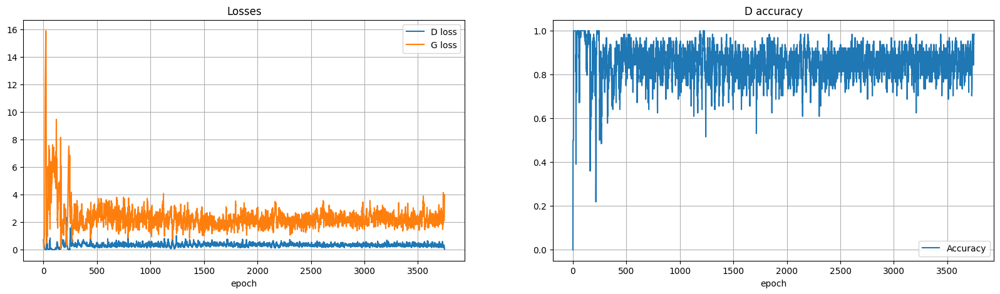

----EPOCH 2-----
0 [D loss: 0.3673,	 acc.: 82.81%]	[G loss: 4.5531]


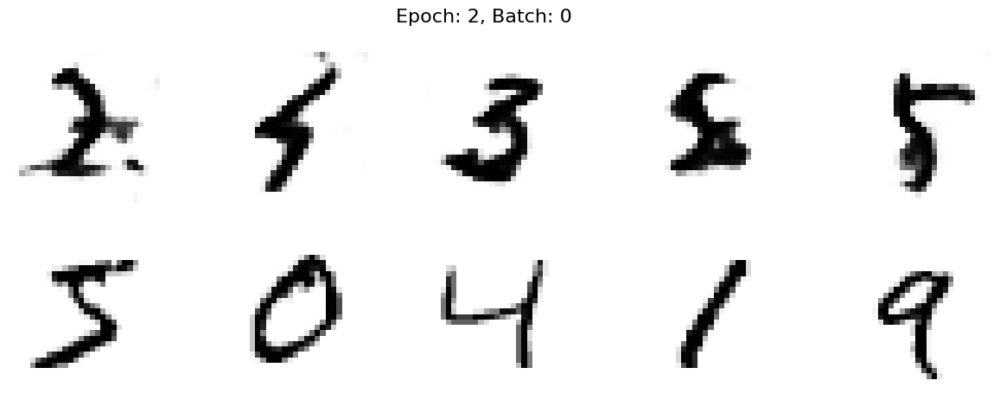

50 [D loss: 0.2993,	 acc.: 85.94%]	[G loss: 1.9678]
100 [D loss: 0.2838,	 acc.: 90.62%]	[G loss: 2.2985]
150 [D loss: 0.2400,	 acc.: 90.62%]	[G loss: 2.5545]
200 [D loss: 0.2452,	 acc.: 90.62%]	[G loss: 2.2609]
250 [D loss: 0.3051,	 acc.: 90.62%]	[G loss: 2.2674]
300 [D loss: 0.4203,	 acc.: 84.38%]	[G loss: 2.2924]
350 [D loss: 0.2989,	 acc.: 84.38%]	[G loss: 3.1054]
400 [D loss: 0.3873,	 acc.: 81.25%]	[G loss: 1.7045]
450 [D loss: 0.3125,	 acc.: 84.38%]	[G loss: 2.2293]
500 [D loss: 0.4129,	 acc.: 82.81%]	[G loss: 1.6678]


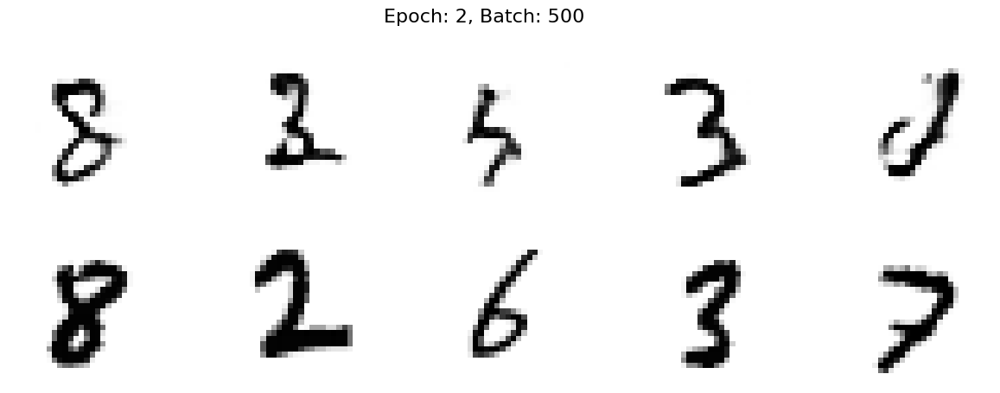

550 [D loss: 0.3646,	 acc.: 82.81%]	[G loss: 2.3483]
600 [D loss: 0.4459,	 acc.: 85.94%]	[G loss: 2.2211]
650 [D loss: 0.3375,	 acc.: 82.81%]	[G loss: 2.3026]
700 [D loss: 0.3092,	 acc.: 89.06%]	[G loss: 2.4070]
750 [D loss: 0.2267,	 acc.: 89.06%]	[G loss: 1.8100]
800 [D loss: 0.4251,	 acc.: 79.69%]	[G loss: 2.3143]
850 [D loss: 0.4166,	 acc.: 85.94%]	[G loss: 1.8550]
900 [D loss: 0.3769,	 acc.: 85.94%]	[G loss: 2.1579]
950 [D loss: 0.3774,	 acc.: 87.50%]	[G loss: 2.0171]
1000 [D loss: 0.5639,	 acc.: 76.56%]	[G loss: 2.4455]


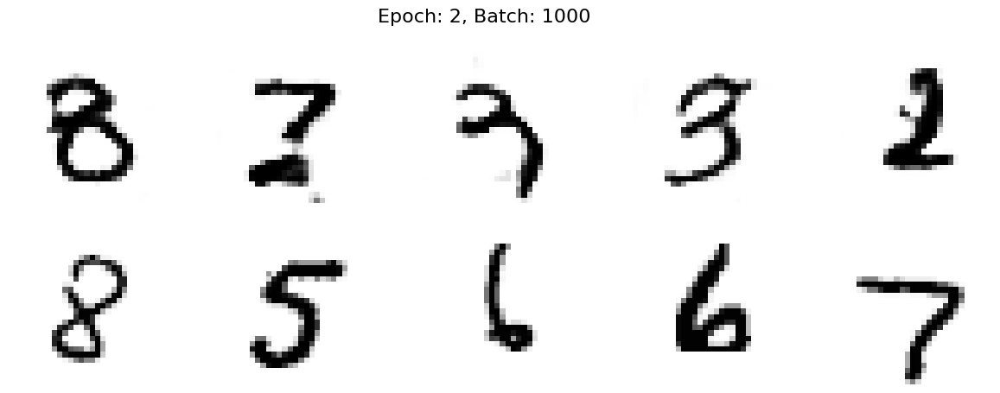

1050 [D loss: 0.2762,	 acc.: 84.38%]	[G loss: 1.8769]
1100 [D loss: 0.3476,	 acc.: 82.81%]	[G loss: 1.7956]
1150 [D loss: 0.3672,	 acc.: 84.38%]	[G loss: 1.9079]
1200 [D loss: 0.3007,	 acc.: 82.81%]	[G loss: 2.1226]
1250 [D loss: 0.2138,	 acc.: 89.06%]	[G loss: 2.3621]
1300 [D loss: 0.3865,	 acc.: 81.25%]	[G loss: 2.3490]
1350 [D loss: 0.2709,	 acc.: 92.19%]	[G loss: 1.6567]
1400 [D loss: 0.3258,	 acc.: 84.38%]	[G loss: 2.6674]
1450 [D loss: 0.4597,	 acc.: 81.25%]	[G loss: 2.1391]
1500 [D loss: 0.3792,	 acc.: 84.38%]	[G loss: 1.9174]


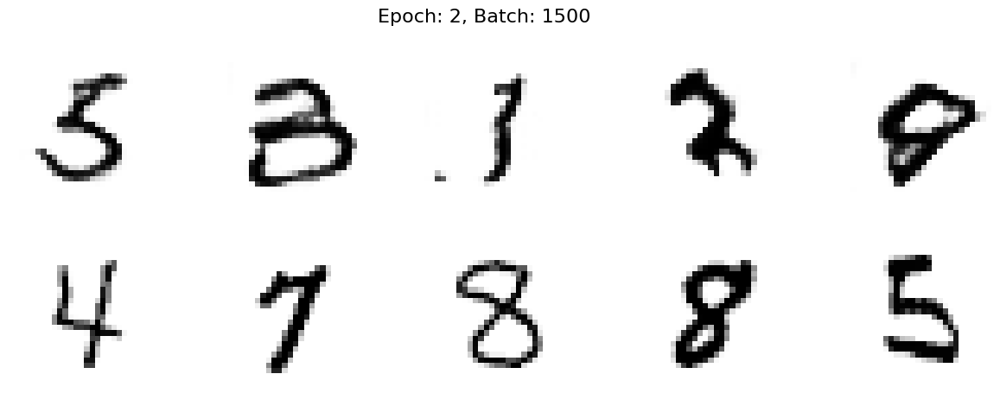

1550 [D loss: 0.3741,	 acc.: 84.38%]	[G loss: 1.9876]
1600 [D loss: 0.3482,	 acc.: 85.94%]	[G loss: 2.3689]
1650 [D loss: 0.3742,	 acc.: 81.25%]	[G loss: 2.3172]
1700 [D loss: 0.3585,	 acc.: 85.94%]	[G loss: 2.1352]
1750 [D loss: 0.3121,	 acc.: 84.38%]	[G loss: 2.5643]
1800 [D loss: 0.4301,	 acc.: 76.56%]	[G loss: 2.2173]
1850 [D loss: 0.3196,	 acc.: 87.50%]	[G loss: 3.0957]


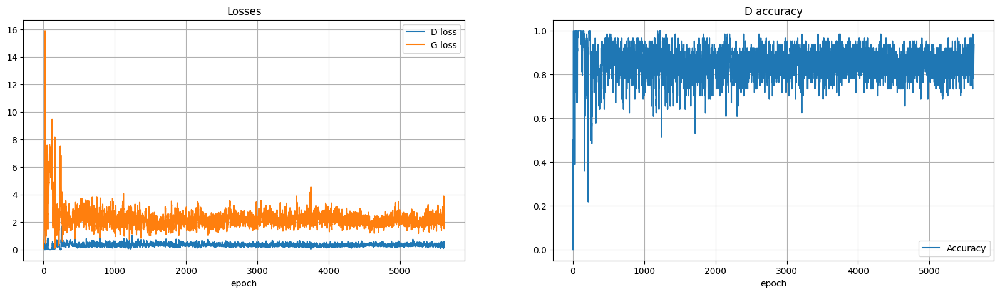

----EPOCH 3-----
0 [D loss: 0.4032,	 acc.: 79.69%]	[G loss: 2.8234]


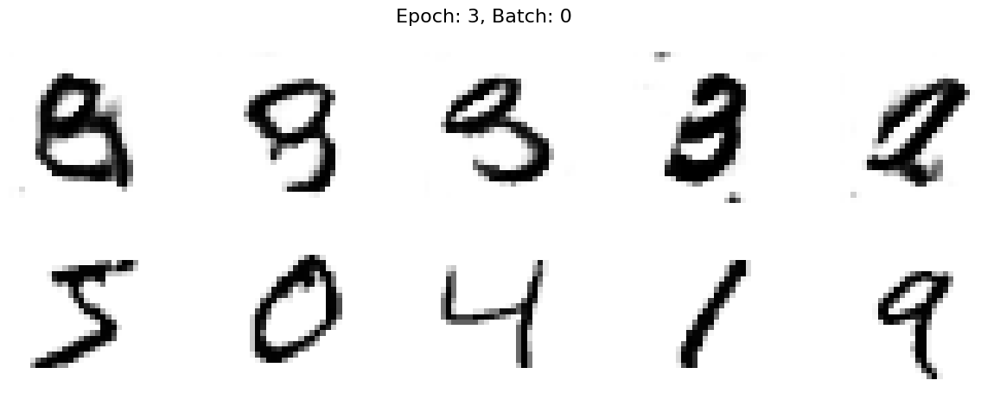

50 [D loss: 0.2525,	 acc.: 89.06%]	[G loss: 1.9988]
100 [D loss: 0.4650,	 acc.: 81.25%]	[G loss: 2.2643]
150 [D loss: 0.3904,	 acc.: 82.81%]	[G loss: 2.1940]
200 [D loss: 0.3291,	 acc.: 89.06%]	[G loss: 2.0918]
250 [D loss: 0.3484,	 acc.: 81.25%]	[G loss: 2.4085]
300 [D loss: 0.3401,	 acc.: 84.38%]	[G loss: 2.2645]
350 [D loss: 0.4960,	 acc.: 73.44%]	[G loss: 1.6702]
400 [D loss: 0.4388,	 acc.: 75.00%]	[G loss: 2.0513]
450 [D loss: 0.2964,	 acc.: 89.06%]	[G loss: 2.4243]
500 [D loss: 0.4841,	 acc.: 73.44%]	[G loss: 1.5882]


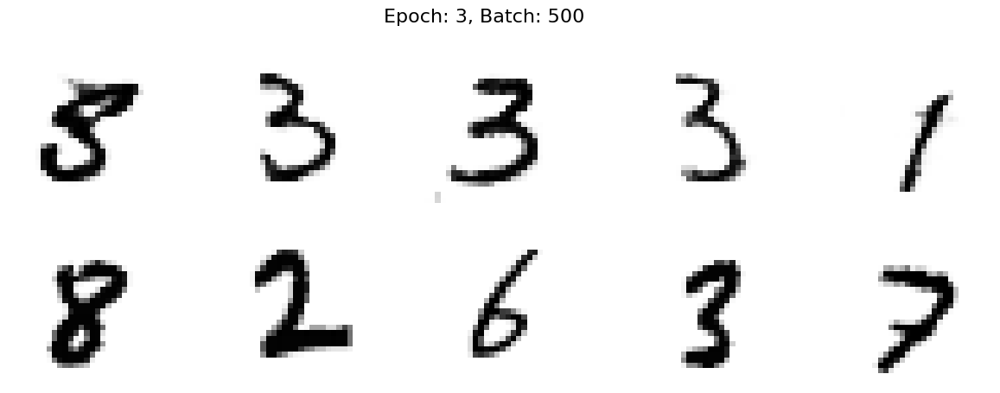

550 [D loss: 0.3396,	 acc.: 84.38%]	[G loss: 1.8063]
600 [D loss: 0.3575,	 acc.: 81.25%]	[G loss: 2.0325]
650 [D loss: 0.3721,	 acc.: 84.38%]	[G loss: 1.8217]
700 [D loss: 0.3301,	 acc.: 84.38%]	[G loss: 1.7760]
750 [D loss: 0.2991,	 acc.: 89.06%]	[G loss: 2.0635]
800 [D loss: 0.4469,	 acc.: 79.69%]	[G loss: 1.9509]
850 [D loss: 0.2964,	 acc.: 87.50%]	[G loss: 1.5550]
900 [D loss: 0.2022,	 acc.: 92.19%]	[G loss: 1.7919]
950 [D loss: 0.3357,	 acc.: 87.50%]	[G loss: 1.5833]
1000 [D loss: 0.6288,	 acc.: 71.88%]	[G loss: 1.5832]


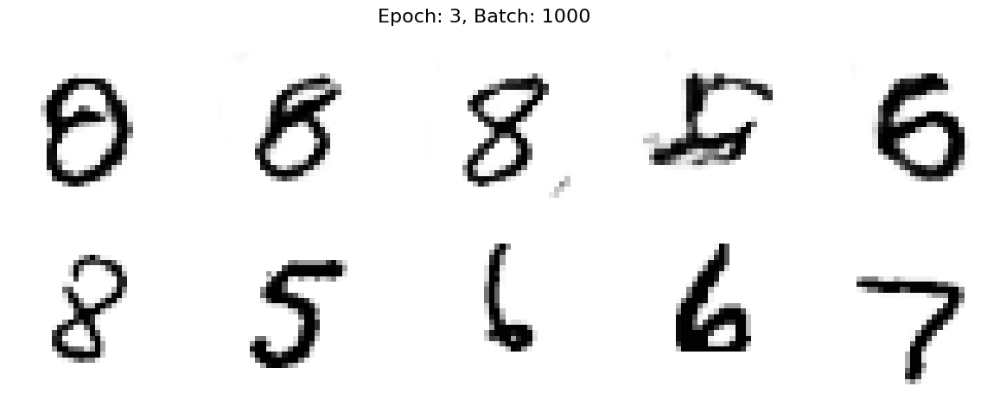

1050 [D loss: 0.3904,	 acc.: 82.81%]	[G loss: 1.6795]
1100 [D loss: 0.2950,	 acc.: 85.94%]	[G loss: 2.0213]
1150 [D loss: 0.4779,	 acc.: 75.00%]	[G loss: 1.8748]
1200 [D loss: 0.2656,	 acc.: 89.06%]	[G loss: 2.0325]
1250 [D loss: 0.2862,	 acc.: 89.06%]	[G loss: 2.0785]
1300 [D loss: 0.4449,	 acc.: 76.56%]	[G loss: 2.4174]
1350 [D loss: 0.3677,	 acc.: 79.69%]	[G loss: 1.8696]
1400 [D loss: 0.2851,	 acc.: 85.94%]	[G loss: 1.9779]
1450 [D loss: 0.2843,	 acc.: 89.06%]	[G loss: 2.0179]
1500 [D loss: 0.2666,	 acc.: 87.50%]	[G loss: 1.7787]


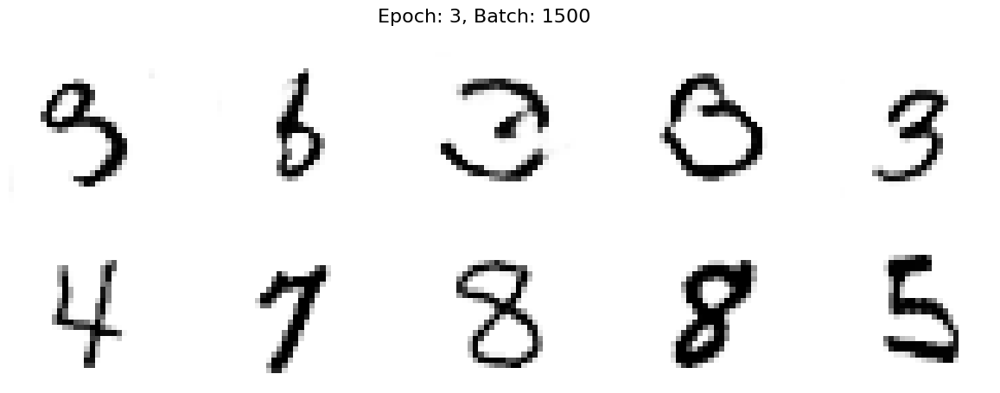

1550 [D loss: 0.3006,	 acc.: 82.81%]	[G loss: 2.0479]
1600 [D loss: 0.4200,	 acc.: 79.69%]	[G loss: 1.9314]
1650 [D loss: 0.3902,	 acc.: 82.81%]	[G loss: 1.6741]
1700 [D loss: 0.4629,	 acc.: 75.00%]	[G loss: 1.9753]
1750 [D loss: 0.4351,	 acc.: 76.56%]	[G loss: 2.1527]
1800 [D loss: 0.3046,	 acc.: 85.94%]	[G loss: 2.2950]
1850 [D loss: 0.3300,	 acc.: 87.50%]	[G loss: 2.1488]


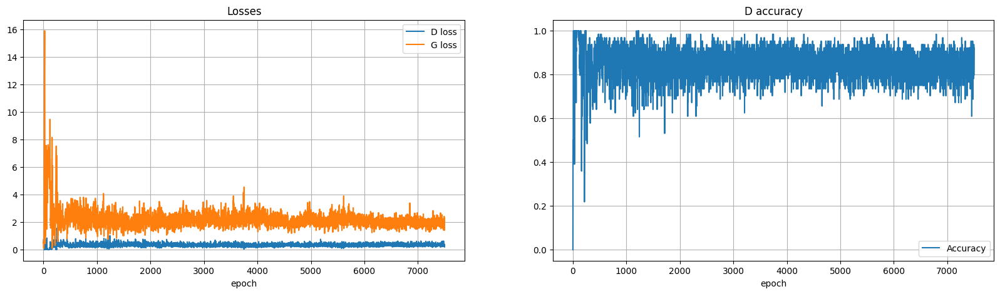

----EPOCH 4-----
0 [D loss: 0.3706,	 acc.: 82.81%]	[G loss: 2.2160]


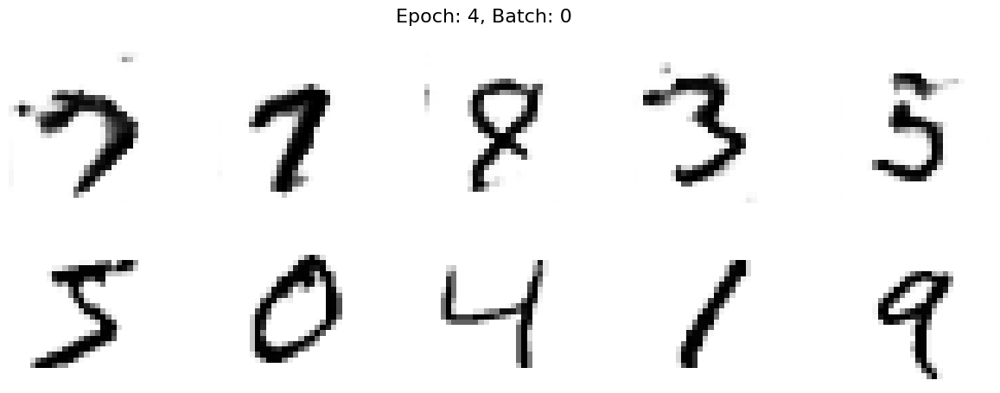

50 [D loss: 0.3021,	 acc.: 87.50%]	[G loss: 2.2442]
100 [D loss: 0.3162,	 acc.: 85.94%]	[G loss: 2.4320]
150 [D loss: 0.4561,	 acc.: 82.81%]	[G loss: 1.9582]
200 [D loss: 0.3094,	 acc.: 89.06%]	[G loss: 1.8264]
250 [D loss: 0.3551,	 acc.: 79.69%]	[G loss: 2.0418]
300 [D loss: 0.4049,	 acc.: 81.25%]	[G loss: 1.9728]
350 [D loss: 0.5532,	 acc.: 73.44%]	[G loss: 2.0531]
400 [D loss: 0.3965,	 acc.: 84.38%]	[G loss: 1.8461]
450 [D loss: 0.3497,	 acc.: 85.94%]	[G loss: 1.9462]
500 [D loss: 0.4697,	 acc.: 78.12%]	[G loss: 1.7459]


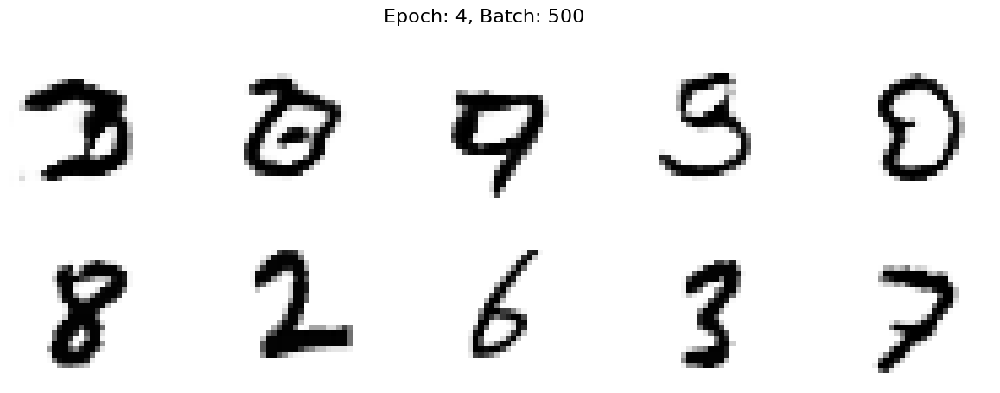

550 [D loss: 0.3244,	 acc.: 85.94%]	[G loss: 2.2188]
600 [D loss: 0.3483,	 acc.: 82.81%]	[G loss: 1.3259]
650 [D loss: 0.3318,	 acc.: 89.06%]	[G loss: 1.8336]
700 [D loss: 0.3737,	 acc.: 84.38%]	[G loss: 2.0307]
750 [D loss: 0.4510,	 acc.: 82.81%]	[G loss: 1.6816]
800 [D loss: 0.3730,	 acc.: 78.12%]	[G loss: 1.7832]
850 [D loss: 0.3739,	 acc.: 82.81%]	[G loss: 1.7416]
900 [D loss: 0.3422,	 acc.: 84.38%]	[G loss: 1.9656]
950 [D loss: 0.2981,	 acc.: 87.50%]	[G loss: 1.6962]
1000 [D loss: 0.4239,	 acc.: 76.56%]	[G loss: 1.7721]


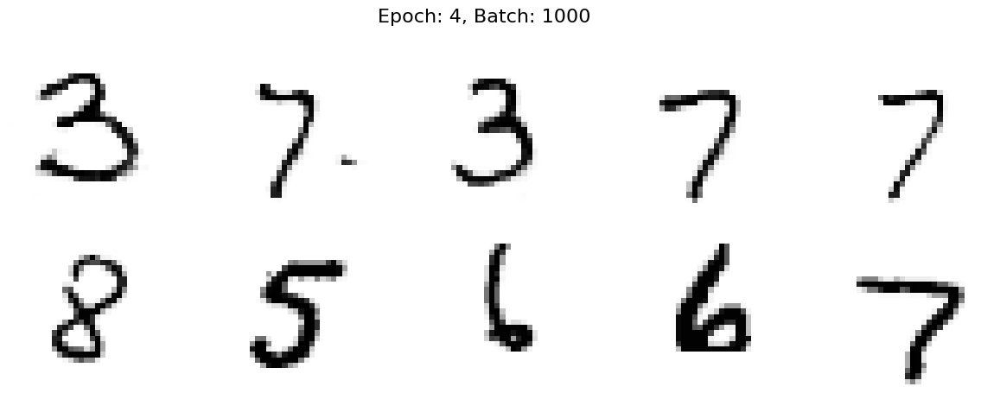

1050 [D loss: 0.3515,	 acc.: 82.81%]	[G loss: 1.8559]
1100 [D loss: 0.3806,	 acc.: 81.25%]	[G loss: 1.8362]
1150 [D loss: 0.3521,	 acc.: 82.81%]	[G loss: 2.1001]
1200 [D loss: 0.2557,	 acc.: 89.06%]	[G loss: 2.0175]
1250 [D loss: 0.3036,	 acc.: 87.50%]	[G loss: 2.2956]
1300 [D loss: 0.4839,	 acc.: 73.44%]	[G loss: 1.9967]
1350 [D loss: 0.4197,	 acc.: 85.94%]	[G loss: 1.8223]
1400 [D loss: 0.4643,	 acc.: 78.12%]	[G loss: 2.2365]
1450 [D loss: 0.4078,	 acc.: 82.81%]	[G loss: 1.6055]
1500 [D loss: 0.3461,	 acc.: 81.25%]	[G loss: 1.9429]


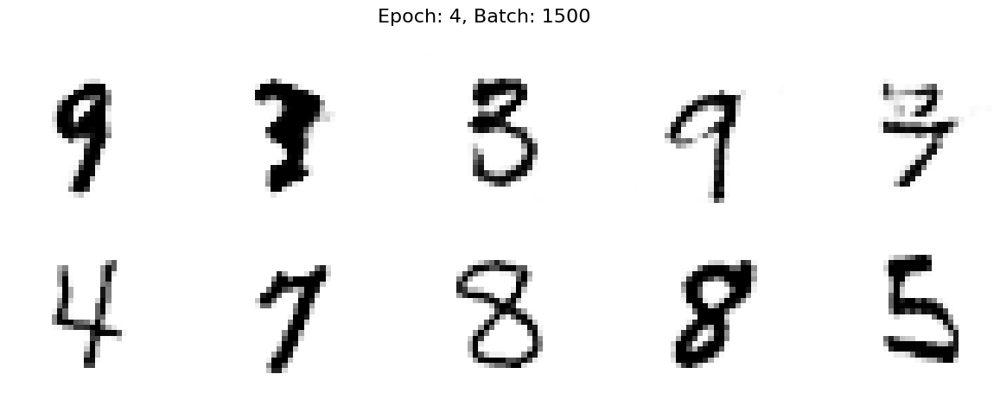

1550 [D loss: 0.3466,	 acc.: 85.94%]	[G loss: 1.7417]
1600 [D loss: 0.5335,	 acc.: 73.44%]	[G loss: 1.6670]
1650 [D loss: 0.4595,	 acc.: 73.44%]	[G loss: 1.7932]
1700 [D loss: 0.3898,	 acc.: 82.81%]	[G loss: 1.4494]
1750 [D loss: 0.5332,	 acc.: 75.00%]	[G loss: 1.6041]
1800 [D loss: 0.3495,	 acc.: 85.94%]	[G loss: 2.2441]
1850 [D loss: 0.3819,	 acc.: 79.69%]	[G loss: 2.1283]


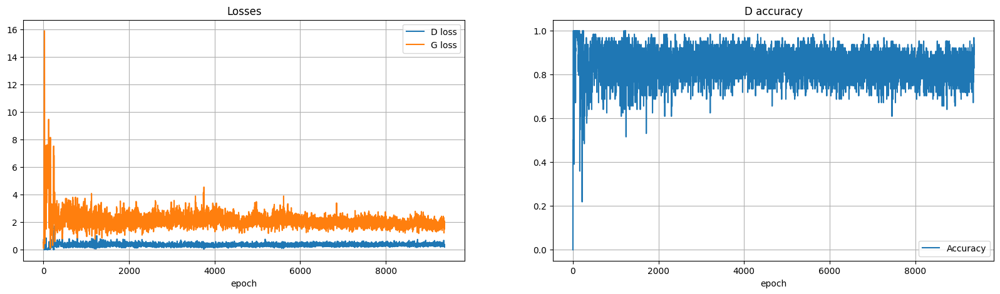

----EPOCH 5-----
0 [D loss: 0.4070,	 acc.: 76.56%]	[G loss: 1.9522]


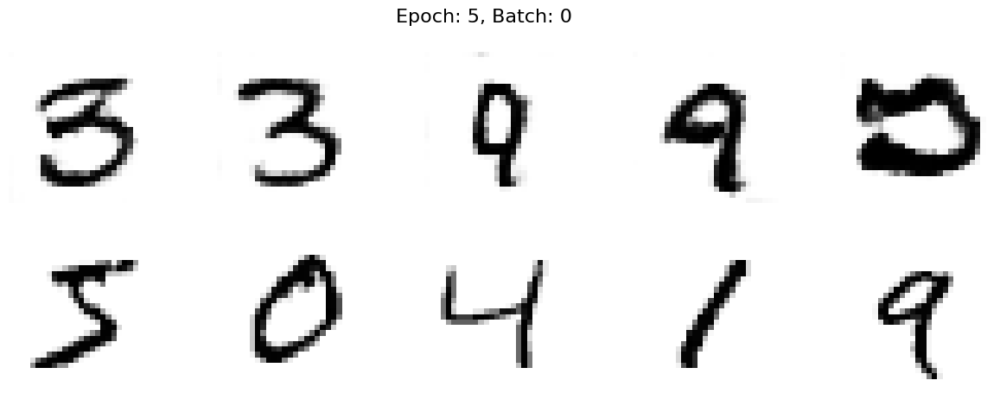

50 [D loss: 0.3349,	 acc.: 89.06%]	[G loss: 2.0260]
100 [D loss: 0.4108,	 acc.: 82.81%]	[G loss: 2.5809]
150 [D loss: 0.3896,	 acc.: 84.38%]	[G loss: 2.1060]
200 [D loss: 0.3521,	 acc.: 82.81%]	[G loss: 2.2617]
250 [D loss: 0.3203,	 acc.: 84.38%]	[G loss: 1.8244]
300 [D loss: 0.4138,	 acc.: 82.81%]	[G loss: 1.8455]
350 [D loss: 0.4820,	 acc.: 76.56%]	[G loss: 1.4880]
400 [D loss: 0.4392,	 acc.: 85.94%]	[G loss: 1.5735]
450 [D loss: 0.3375,	 acc.: 85.94%]	[G loss: 1.7236]
500 [D loss: 0.6248,	 acc.: 70.31%]	[G loss: 1.7942]


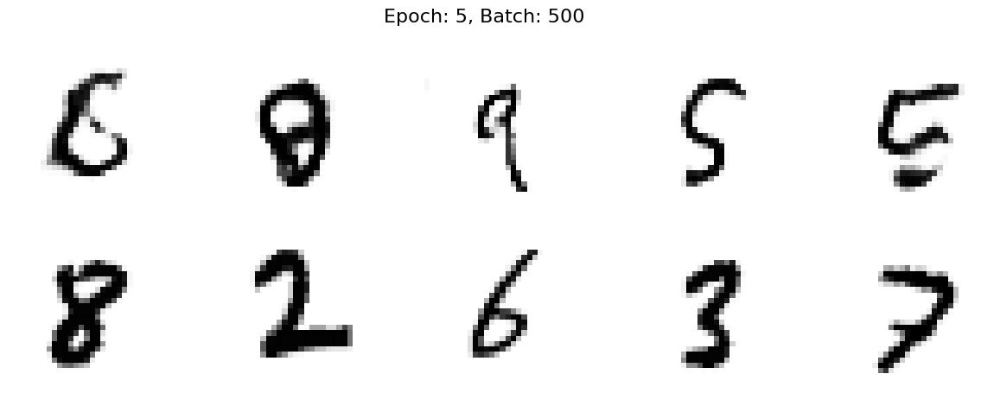

550 [D loss: 0.3246,	 acc.: 82.81%]	[G loss: 2.1191]
600 [D loss: 0.4991,	 acc.: 75.00%]	[G loss: 1.8993]
650 [D loss: 0.2966,	 acc.: 87.50%]	[G loss: 2.0888]
700 [D loss: 0.3883,	 acc.: 79.69%]	[G loss: 1.7141]
750 [D loss: 0.4796,	 acc.: 76.56%]	[G loss: 1.7863]
800 [D loss: 0.3662,	 acc.: 84.38%]	[G loss: 1.9057]
850 [D loss: 0.2984,	 acc.: 85.94%]	[G loss: 1.8858]
900 [D loss: 0.2749,	 acc.: 90.62%]	[G loss: 1.5255]
950 [D loss: 0.3554,	 acc.: 84.38%]	[G loss: 1.7037]
1000 [D loss: 0.4658,	 acc.: 82.81%]	[G loss: 1.6565]


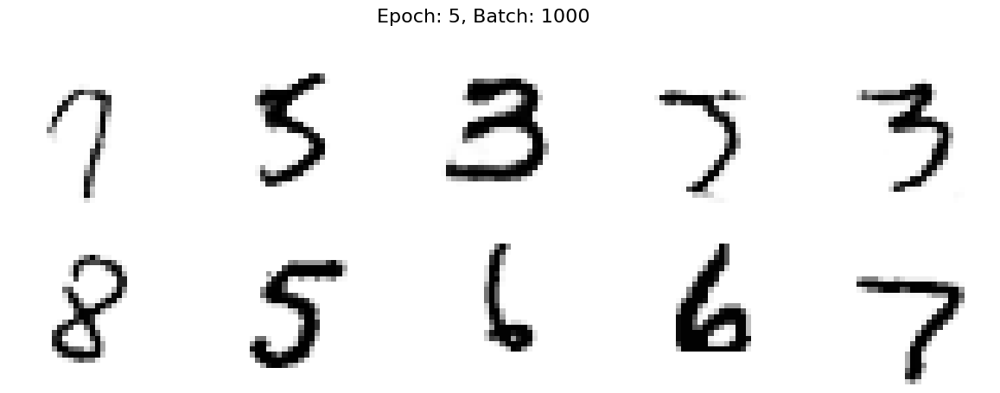

1050 [D loss: 0.3538,	 acc.: 81.25%]	[G loss: 1.6496]
1100 [D loss: 0.3023,	 acc.: 85.94%]	[G loss: 1.7524]
1150 [D loss: 0.4284,	 acc.: 79.69%]	[G loss: 1.8270]
1200 [D loss: 0.3674,	 acc.: 87.50%]	[G loss: 2.0517]
1250 [D loss: 0.3013,	 acc.: 85.94%]	[G loss: 1.9006]
1300 [D loss: 0.4866,	 acc.: 82.81%]	[G loss: 1.9119]
1350 [D loss: 0.3904,	 acc.: 81.25%]	[G loss: 1.6694]
1400 [D loss: 0.3761,	 acc.: 81.25%]	[G loss: 1.8707]
1450 [D loss: 0.3547,	 acc.: 79.69%]	[G loss: 1.4534]
1500 [D loss: 0.2739,	 acc.: 89.06%]	[G loss: 1.6724]


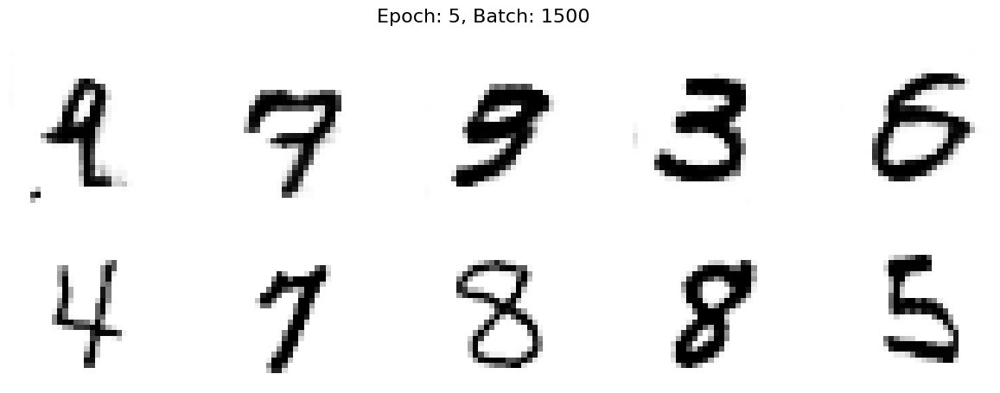

1550 [D loss: 0.2759,	 acc.: 84.38%]	[G loss: 2.3933]
1600 [D loss: 0.4999,	 acc.: 75.00%]	[G loss: 1.7690]
1650 [D loss: 0.4963,	 acc.: 73.44%]	[G loss: 1.6524]
1700 [D loss: 0.5178,	 acc.: 75.00%]	[G loss: 1.8702]
1750 [D loss: 0.4799,	 acc.: 79.69%]	[G loss: 1.9507]
1800 [D loss: 0.3276,	 acc.: 87.50%]	[G loss: 1.9046]
1850 [D loss: 0.3265,	 acc.: 84.38%]	[G loss: 2.0383]


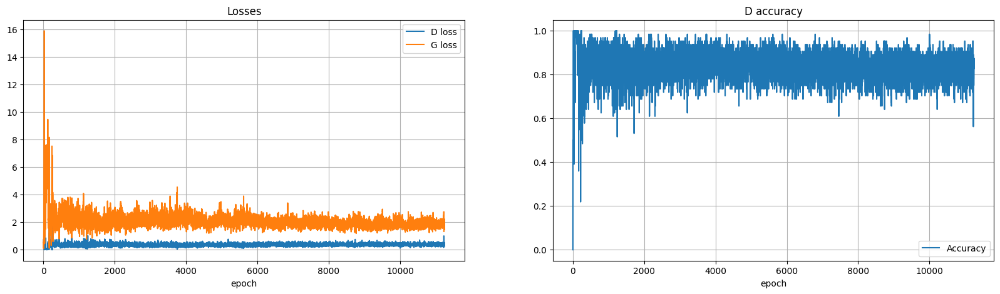

----EPOCH 6-----
0 [D loss: 0.2153,	 acc.: 90.62%]	[G loss: 1.7924]


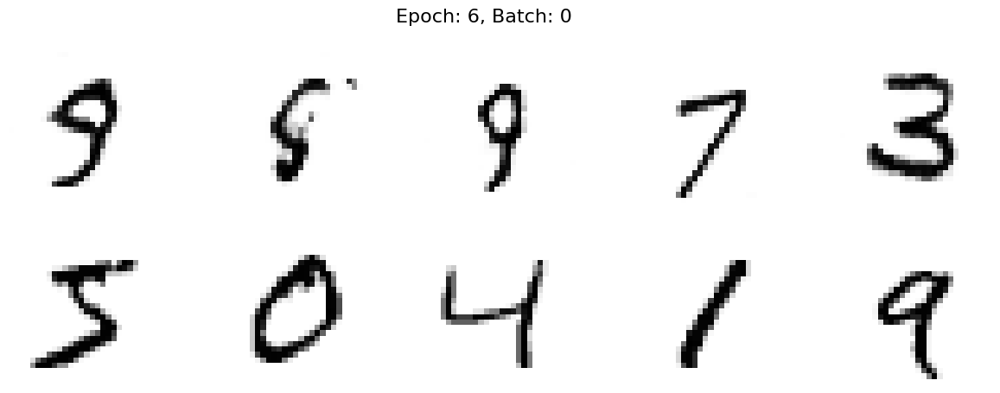

50 [D loss: 0.4045,	 acc.: 82.81%]	[G loss: 1.9235]
100 [D loss: 0.4288,	 acc.: 76.56%]	[G loss: 1.8733]
150 [D loss: 0.3278,	 acc.: 84.38%]	[G loss: 2.0814]
200 [D loss: 0.3695,	 acc.: 84.38%]	[G loss: 1.9159]
250 [D loss: 0.3162,	 acc.: 87.50%]	[G loss: 2.1806]
300 [D loss: 0.3007,	 acc.: 84.38%]	[G loss: 2.1778]
350 [D loss: 0.4855,	 acc.: 82.81%]	[G loss: 1.7181]
400 [D loss: 0.4061,	 acc.: 79.69%]	[G loss: 1.9253]
450 [D loss: 0.3653,	 acc.: 79.69%]	[G loss: 1.9993]
500 [D loss: 0.4600,	 acc.: 76.56%]	[G loss: 1.7565]


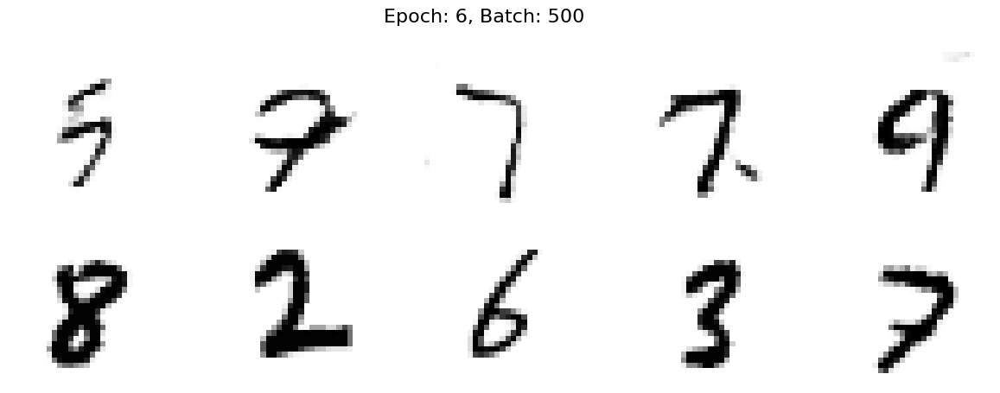

550 [D loss: 0.4007,	 acc.: 75.00%]	[G loss: 1.5937]
600 [D loss: 0.4824,	 acc.: 82.81%]	[G loss: 2.2258]
650 [D loss: 0.3806,	 acc.: 82.81%]	[G loss: 1.7709]
700 [D loss: 0.3360,	 acc.: 82.81%]	[G loss: 1.6867]
750 [D loss: 0.3731,	 acc.: 82.81%]	[G loss: 1.8173]
800 [D loss: 0.4279,	 acc.: 76.56%]	[G loss: 1.7157]
850 [D loss: 0.2169,	 acc.: 92.19%]	[G loss: 1.6977]
900 [D loss: 0.2769,	 acc.: 89.06%]	[G loss: 2.3069]
950 [D loss: 0.4403,	 acc.: 87.50%]	[G loss: 2.1748]
1000 [D loss: 0.5238,	 acc.: 76.56%]	[G loss: 2.0526]


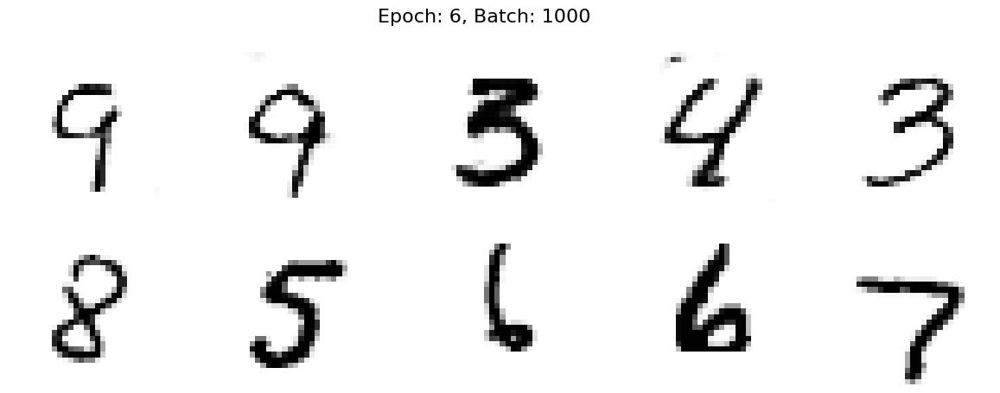

1050 [D loss: 0.3153,	 acc.: 89.06%]	[G loss: 1.8623]
1100 [D loss: 0.3058,	 acc.: 85.94%]	[G loss: 1.5893]
1150 [D loss: 0.3508,	 acc.: 85.94%]	[G loss: 1.9919]
1200 [D loss: 0.2969,	 acc.: 87.50%]	[G loss: 1.9591]
1250 [D loss: 0.3932,	 acc.: 81.25%]	[G loss: 1.7089]
1300 [D loss: 0.4307,	 acc.: 79.69%]	[G loss: 2.0336]
1350 [D loss: 0.3193,	 acc.: 87.50%]	[G loss: 1.9012]
1400 [D loss: 0.3266,	 acc.: 85.94%]	[G loss: 2.5262]
1450 [D loss: 0.4038,	 acc.: 73.44%]	[G loss: 2.0085]
1500 [D loss: 0.4061,	 acc.: 81.25%]	[G loss: 2.0746]


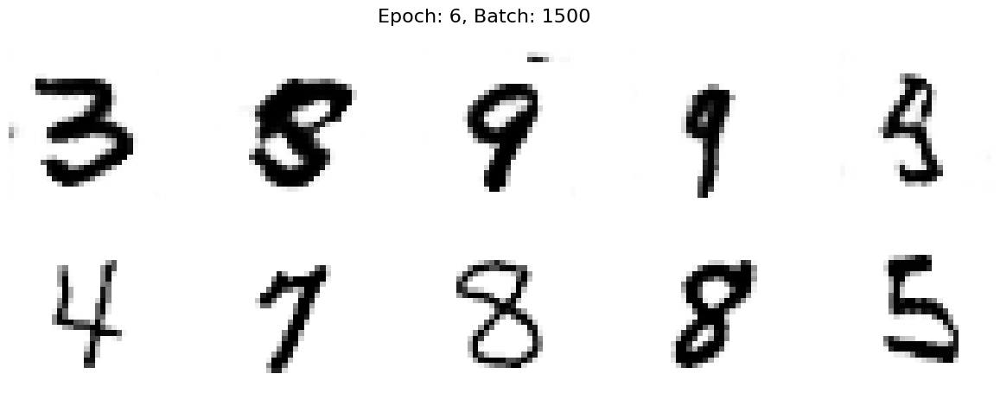

1550 [D loss: 0.3486,	 acc.: 85.94%]	[G loss: 1.9010]
1600 [D loss: 0.4469,	 acc.: 79.69%]	[G loss: 2.1568]
1650 [D loss: 0.4033,	 acc.: 79.69%]	[G loss: 1.9685]
1700 [D loss: 0.4967,	 acc.: 78.12%]	[G loss: 1.9006]
1750 [D loss: 0.3872,	 acc.: 79.69%]	[G loss: 1.9236]
1800 [D loss: 0.3377,	 acc.: 82.81%]	[G loss: 2.0120]
1850 [D loss: 0.3139,	 acc.: 85.94%]	[G loss: 2.2800]


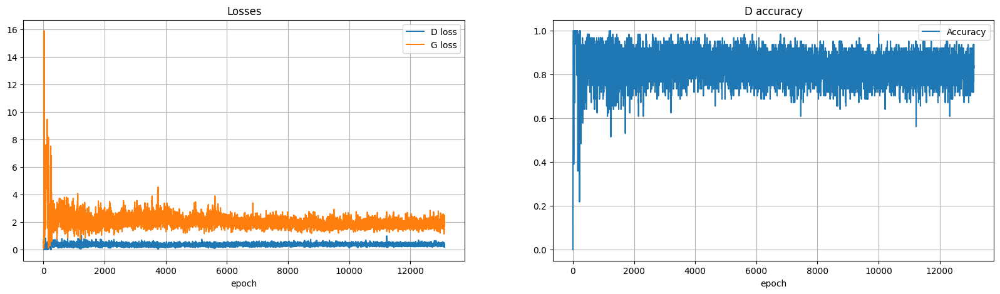

----EPOCH 7-----
0 [D loss: 0.3336,	 acc.: 81.25%]	[G loss: 2.1242]


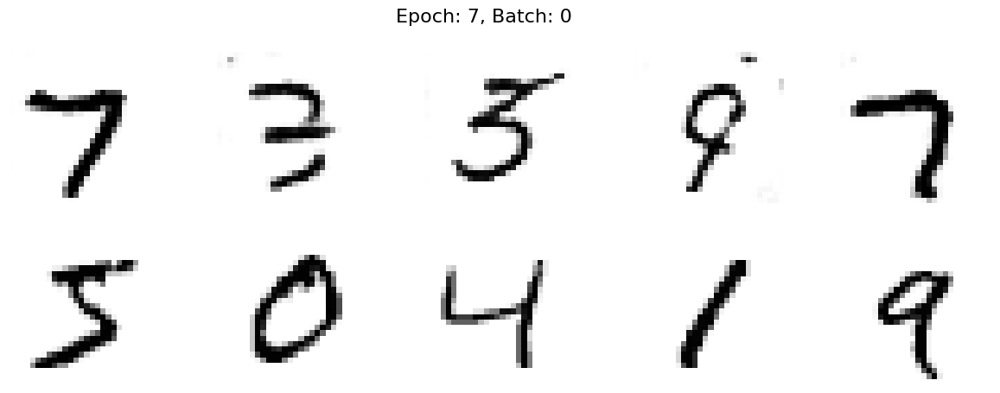

50 [D loss: 0.3041,	 acc.: 84.38%]	[G loss: 1.8744]
100 [D loss: 0.3644,	 acc.: 85.94%]	[G loss: 1.9274]
150 [D loss: 0.3618,	 acc.: 84.38%]	[G loss: 1.6828]
200 [D loss: 0.4193,	 acc.: 81.25%]	[G loss: 1.6407]
250 [D loss: 0.2972,	 acc.: 85.94%]	[G loss: 1.9284]
300 [D loss: 0.4890,	 acc.: 73.44%]	[G loss: 1.7960]
350 [D loss: 0.4528,	 acc.: 73.44%]	[G loss: 1.3118]
400 [D loss: 0.3493,	 acc.: 82.81%]	[G loss: 1.6373]
450 [D loss: 0.4359,	 acc.: 78.12%]	[G loss: 1.8744]
500 [D loss: 0.5225,	 acc.: 71.88%]	[G loss: 2.0253]


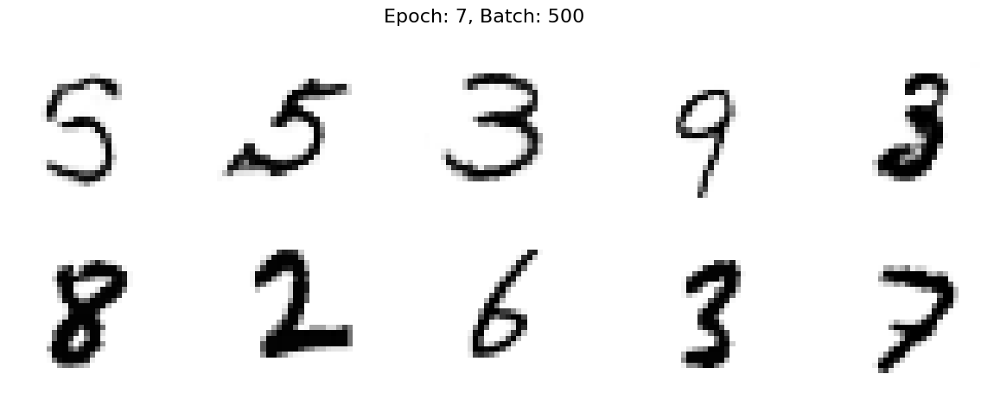

550 [D loss: 0.3250,	 acc.: 82.81%]	[G loss: 2.2004]
600 [D loss: 0.2989,	 acc.: 84.38%]	[G loss: 1.8073]
650 [D loss: 0.3269,	 acc.: 82.81%]	[G loss: 1.9776]
700 [D loss: 0.2826,	 acc.: 89.06%]	[G loss: 1.2872]
750 [D loss: 0.3897,	 acc.: 81.25%]	[G loss: 1.6356]
800 [D loss: 0.3872,	 acc.: 81.25%]	[G loss: 1.7800]
850 [D loss: 0.2501,	 acc.: 92.19%]	[G loss: 1.8524]
900 [D loss: 0.2143,	 acc.: 93.75%]	[G loss: 2.2749]
950 [D loss: 0.3401,	 acc.: 89.06%]	[G loss: 1.7125]
1000 [D loss: 0.5368,	 acc.: 71.88%]	[G loss: 1.8778]


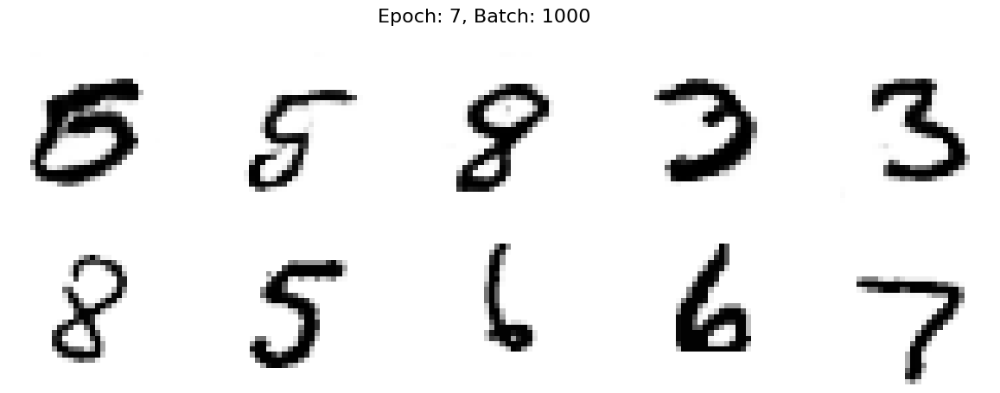

1050 [D loss: 0.4107,	 acc.: 78.12%]	[G loss: 2.1174]
1100 [D loss: 0.3486,	 acc.: 82.81%]	[G loss: 1.9075]
1150 [D loss: 0.3964,	 acc.: 79.69%]	[G loss: 1.7003]
1200 [D loss: 0.3011,	 acc.: 82.81%]	[G loss: 1.6734]
1250 [D loss: 0.3897,	 acc.: 81.25%]	[G loss: 1.6174]
1300 [D loss: 0.3964,	 acc.: 79.69%]	[G loss: 2.1073]
1350 [D loss: 0.3272,	 acc.: 85.94%]	[G loss: 1.5389]
1400 [D loss: 0.3862,	 acc.: 79.69%]	[G loss: 1.8943]
1450 [D loss: 0.3775,	 acc.: 78.12%]	[G loss: 2.0498]
1500 [D loss: 0.3898,	 acc.: 84.38%]	[G loss: 1.9743]


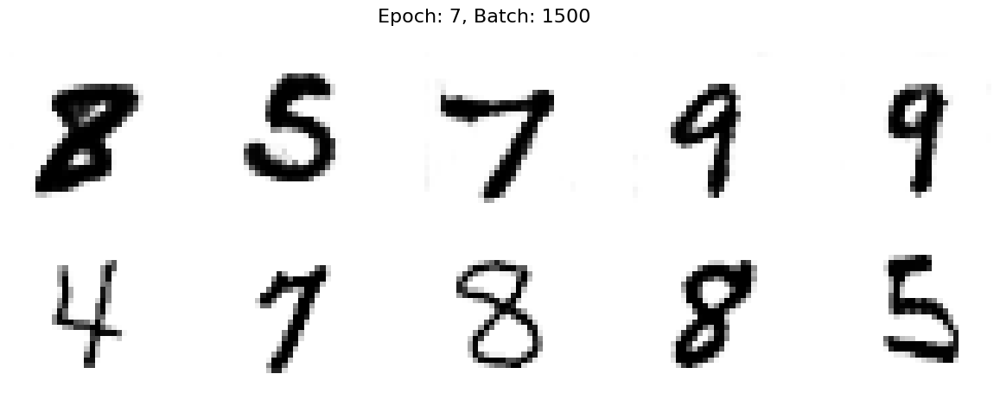

1550 [D loss: 0.2714,	 acc.: 87.50%]	[G loss: 1.7736]
1600 [D loss: 0.3637,	 acc.: 82.81%]	[G loss: 2.1078]
1650 [D loss: 0.4731,	 acc.: 79.69%]	[G loss: 2.3293]
1700 [D loss: 0.5578,	 acc.: 81.25%]	[G loss: 1.7315]
1750 [D loss: 0.4807,	 acc.: 76.56%]	[G loss: 1.7114]
1800 [D loss: 0.2621,	 acc.: 92.19%]	[G loss: 2.1268]
1850 [D loss: 0.2702,	 acc.: 87.50%]	[G loss: 2.3541]


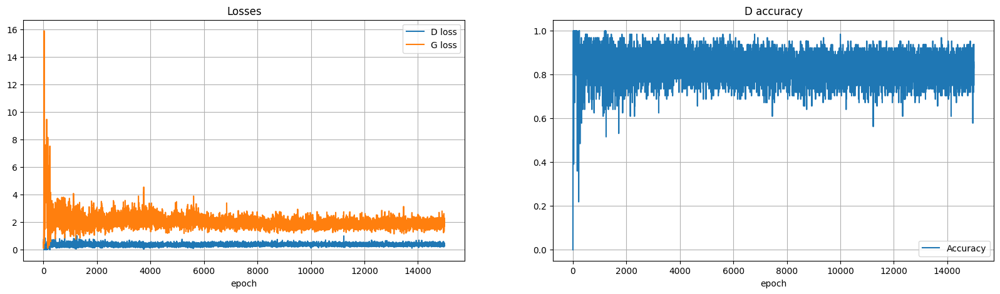

----EPOCH 8-----
0 [D loss: 0.2693,	 acc.: 85.94%]	[G loss: 2.1508]


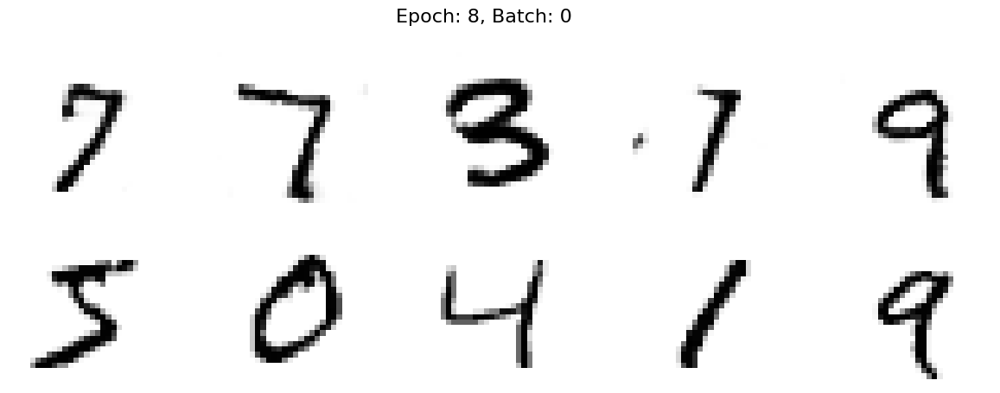

50 [D loss: 0.3776,	 acc.: 81.25%]	[G loss: 2.0703]
100 [D loss: 0.3785,	 acc.: 82.81%]	[G loss: 2.0494]
150 [D loss: 0.3586,	 acc.: 84.38%]	[G loss: 1.9910]
200 [D loss: 0.3146,	 acc.: 87.50%]	[G loss: 1.8857]
250 [D loss: 0.3079,	 acc.: 85.94%]	[G loss: 1.9856]
300 [D loss: 0.3113,	 acc.: 85.94%]	[G loss: 2.4143]
350 [D loss: 0.3607,	 acc.: 85.94%]	[G loss: 1.3668]
400 [D loss: 0.3756,	 acc.: 81.25%]	[G loss: 2.0120]
450 [D loss: 0.4567,	 acc.: 82.81%]	[G loss: 1.8687]
500 [D loss: 0.4945,	 acc.: 76.56%]	[G loss: 1.5824]


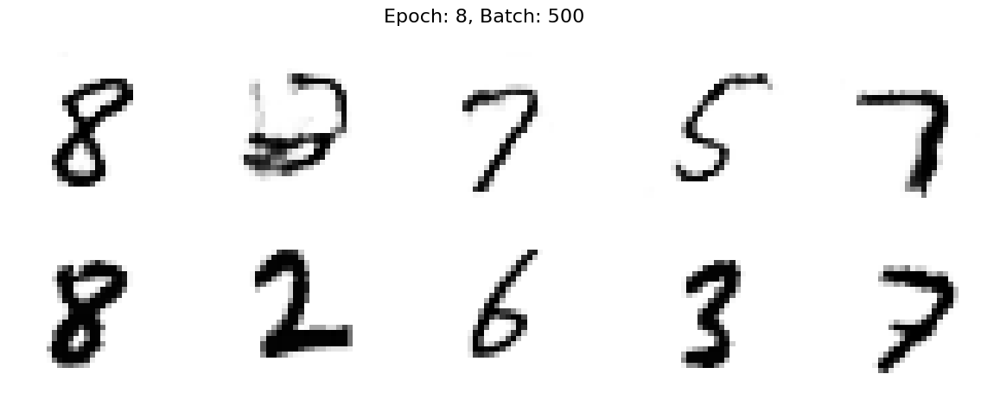

550 [D loss: 0.4100,	 acc.: 81.25%]	[G loss: 1.8722]
600 [D loss: 0.3584,	 acc.: 84.38%]	[G loss: 1.9887]
650 [D loss: 0.2941,	 acc.: 90.62%]	[G loss: 1.7882]
700 [D loss: 0.3321,	 acc.: 84.38%]	[G loss: 1.5855]
750 [D loss: 0.4124,	 acc.: 81.25%]	[G loss: 1.8455]
800 [D loss: 0.3127,	 acc.: 84.38%]	[G loss: 1.5051]
850 [D loss: 0.4245,	 acc.: 73.44%]	[G loss: 1.9870]
900 [D loss: 0.3224,	 acc.: 82.81%]	[G loss: 2.0794]
950 [D loss: 0.3288,	 acc.: 82.81%]	[G loss: 1.8009]
1000 [D loss: 0.4910,	 acc.: 75.00%]	[G loss: 1.7897]


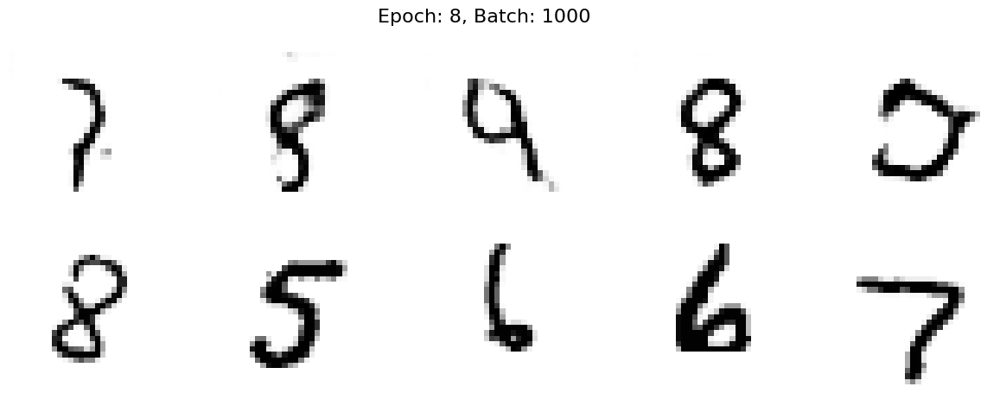

1050 [D loss: 0.4183,	 acc.: 78.12%]	[G loss: 1.5355]
1100 [D loss: 0.3646,	 acc.: 84.38%]	[G loss: 1.8882]
1150 [D loss: 0.2963,	 acc.: 85.94%]	[G loss: 1.7648]
1200 [D loss: 0.2247,	 acc.: 93.75%]	[G loss: 2.4621]
1250 [D loss: 0.3766,	 acc.: 78.12%]	[G loss: 2.0529]
1300 [D loss: 0.2837,	 acc.: 90.62%]	[G loss: 1.9923]
1350 [D loss: 0.4011,	 acc.: 81.25%]	[G loss: 1.9862]
1400 [D loss: 0.3854,	 acc.: 84.38%]	[G loss: 1.6543]
1450 [D loss: 0.3839,	 acc.: 87.50%]	[G loss: 2.0328]
1500 [D loss: 0.3400,	 acc.: 79.69%]	[G loss: 1.7815]


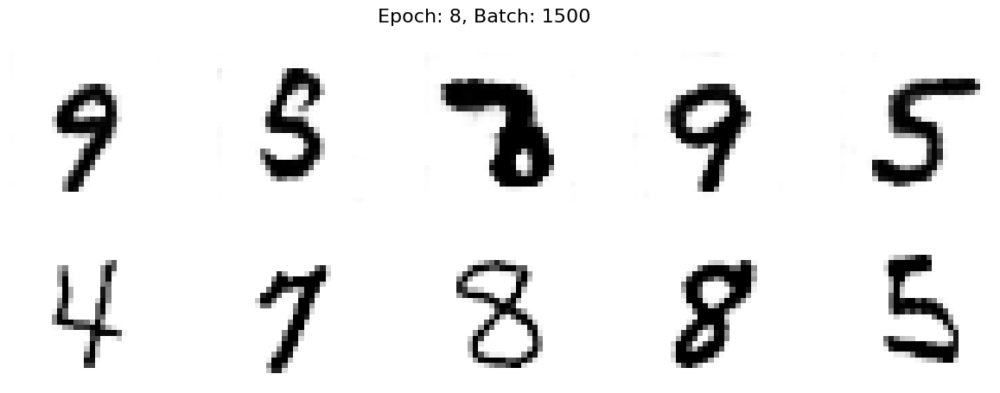

1550 [D loss: 0.3835,	 acc.: 78.12%]	[G loss: 2.1570]
1600 [D loss: 0.4651,	 acc.: 73.44%]	[G loss: 1.7197]
1650 [D loss: 0.5163,	 acc.: 73.44%]	[G loss: 1.8125]
1700 [D loss: 0.3981,	 acc.: 87.50%]	[G loss: 1.9538]
1750 [D loss: 0.3048,	 acc.: 87.50%]	[G loss: 2.3715]
1800 [D loss: 0.3650,	 acc.: 79.69%]	[G loss: 2.4262]
1850 [D loss: 0.3735,	 acc.: 82.81%]	[G loss: 2.6047]


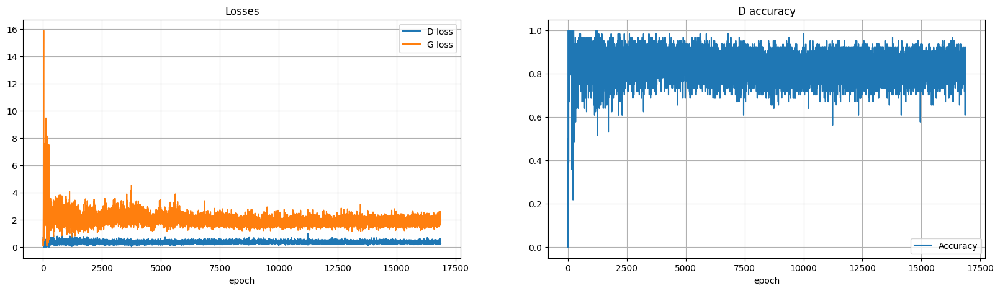

----EPOCH 9-----
0 [D loss: 0.3056,	 acc.: 81.25%]	[G loss: 2.6597]


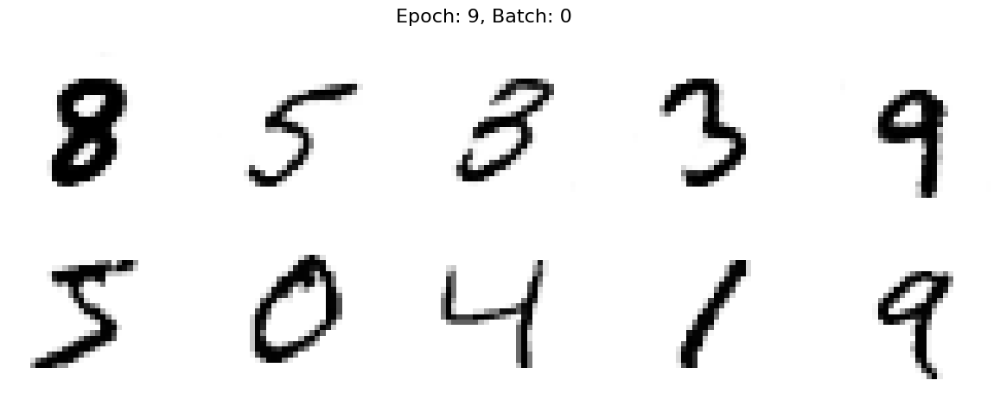

50 [D loss: 0.3065,	 acc.: 85.94%]	[G loss: 2.2450]
100 [D loss: 0.3313,	 acc.: 82.81%]	[G loss: 2.3396]
150 [D loss: 0.3995,	 acc.: 84.38%]	[G loss: 1.9617]
200 [D loss: 0.3347,	 acc.: 82.81%]	[G loss: 2.0580]
250 [D loss: 0.2757,	 acc.: 90.62%]	[G loss: 1.7806]
300 [D loss: 0.3103,	 acc.: 85.94%]	[G loss: 2.2134]
350 [D loss: 0.4108,	 acc.: 82.81%]	[G loss: 2.0058]
400 [D loss: 0.6157,	 acc.: 68.75%]	[G loss: 2.0465]
450 [D loss: 0.3234,	 acc.: 82.81%]	[G loss: 1.9008]
500 [D loss: 0.4270,	 acc.: 82.81%]	[G loss: 1.9369]


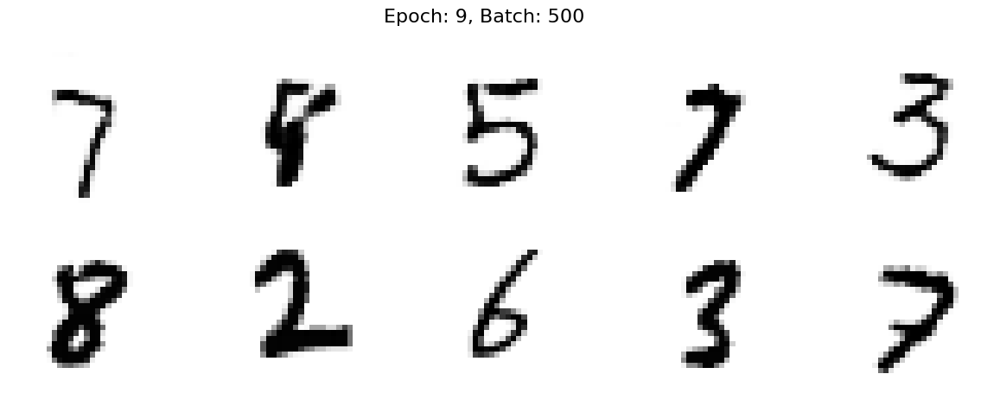

550 [D loss: 0.3453,	 acc.: 89.06%]	[G loss: 1.9650]
600 [D loss: 0.3533,	 acc.: 82.81%]	[G loss: 1.9531]
650 [D loss: 0.2765,	 acc.: 89.06%]	[G loss: 1.7363]
700 [D loss: 0.3640,	 acc.: 85.94%]	[G loss: 1.7989]
750 [D loss: 0.5865,	 acc.: 71.88%]	[G loss: 2.0085]
800 [D loss: 0.4816,	 acc.: 76.56%]	[G loss: 1.9030]
850 [D loss: 0.3435,	 acc.: 82.81%]	[G loss: 1.4549]
900 [D loss: 0.3956,	 acc.: 85.94%]	[G loss: 1.6649]
950 [D loss: 0.4344,	 acc.: 76.56%]	[G loss: 1.8000]
1000 [D loss: 0.5901,	 acc.: 70.31%]	[G loss: 1.9005]


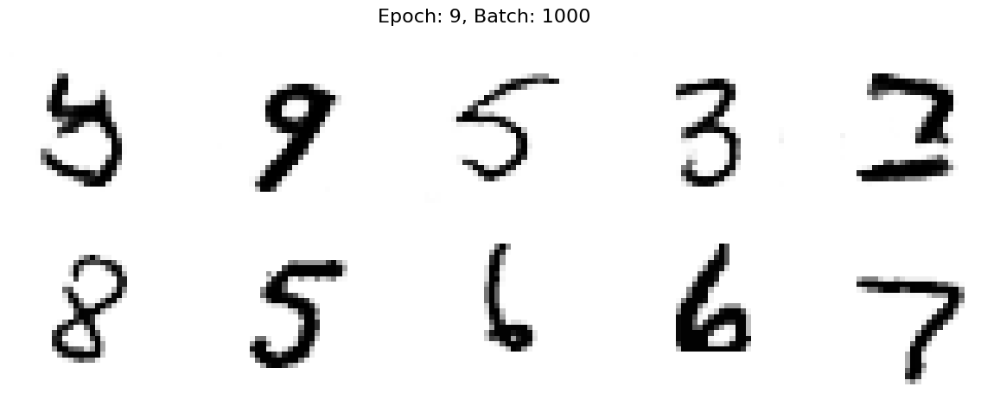

1050 [D loss: 0.3652,	 acc.: 76.56%]	[G loss: 2.2194]
1100 [D loss: 0.3938,	 acc.: 78.12%]	[G loss: 1.7919]
1150 [D loss: 0.3043,	 acc.: 82.81%]	[G loss: 2.1950]
1200 [D loss: 0.2418,	 acc.: 90.62%]	[G loss: 2.2466]
1250 [D loss: 0.4655,	 acc.: 75.00%]	[G loss: 1.8090]
1300 [D loss: 0.4521,	 acc.: 76.56%]	[G loss: 2.4711]
1350 [D loss: 0.3813,	 acc.: 85.94%]	[G loss: 1.7430]
1400 [D loss: 0.3592,	 acc.: 82.81%]	[G loss: 2.3979]
1450 [D loss: 0.3162,	 acc.: 84.38%]	[G loss: 1.7860]
1500 [D loss: 0.3050,	 acc.: 90.62%]	[G loss: 1.9986]


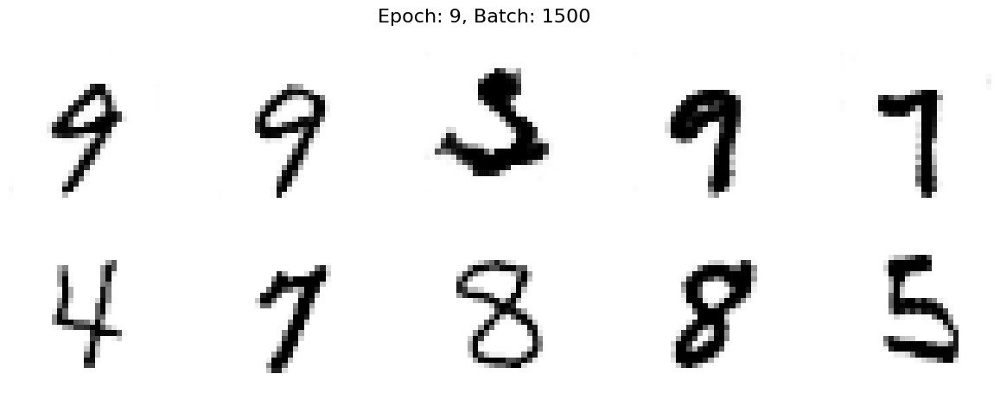

1550 [D loss: 0.2239,	 acc.: 90.62%]	[G loss: 1.9154]
1600 [D loss: 0.3747,	 acc.: 82.81%]	[G loss: 1.9144]
1650 [D loss: 0.3457,	 acc.: 85.94%]	[G loss: 1.9754]
1700 [D loss: 0.3332,	 acc.: 85.94%]	[G loss: 1.9739]
1750 [D loss: 0.3735,	 acc.: 82.81%]	[G loss: 2.0696]
1800 [D loss: 0.3517,	 acc.: 84.38%]	[G loss: 2.3335]
1850 [D loss: 0.2450,	 acc.: 90.62%]	[G loss: 2.0088]


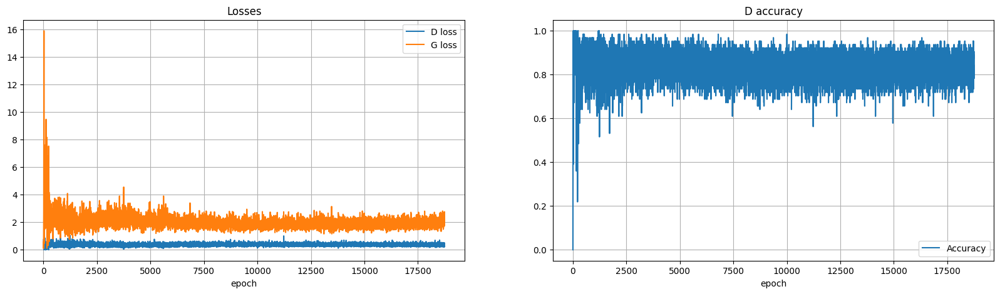

In [ ]:
train(X_train, generator, discriminator, combined, epochs=10, batch_size=32, sample_interval=100)

> La calidad de la imagen ha mejorado, y el acurracy ha variado más que nunca, creo que esta propuesta a superado a la baseline, tanto en calidad como el variedad. Si añado más capas de regulación es posible que obtengamos mejores resultados.

> A destacar en esta sección, he de decir que he intentado añadir más capas pero esta es la versión que mejor me ha funcionado.

# Cuarta oportunidad de mejora

> Combinar la regularización y la nueva capa.

## Generador definition

> Mantengo la configuración de la fase 3.

In [ ]:
def create_generator():

    input = Input(shape=(100))

    x = Dense(7 * 7 * 256)(input)
    x = Reshape((7, 7, 256))(x)

    x = Conv2DTranspose(128, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2DTranspose(64, kernel_size=3, strides=2, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Conv2DTranspose(32, kernel_size=3, strides=1, padding='same')(x)
    x = BatchNormalization(momentum=0.8)(x)
    x = LeakyReLU(alpha=0.01)(x)

    output = Conv2DTranspose(1, kernel_size=3, strides=1, padding="same", activation="tanh")(x)

    generator = Model(input, output)

    return generator

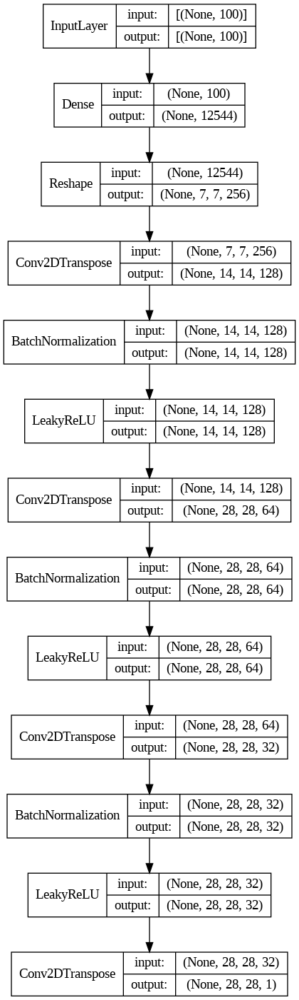

In [ ]:
generator = create_generator()
plot_model(generator, show_shapes=True, show_layer_names=False)

## Discriminador definition

> Añado más capas de dropout que creo que vendrá bien al modelo de cara a reducir el accuracy. Y mantengo la configuración anterior.

In [ ]:
def create_discriminator():
    input = Input(shape=(28, 28, 1))

    # Rellene con la red neuronal convolucional deseada

    x = Conv2D(32, kernel_size=5, strides=2, padding="same")(input)
    x = LeakyReLU(alpha=0.01)(x)

    x = Dropout(0.2)(x)

    x = Conv2D(64, kernel_size=5, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Dropout(0.2)(x)

    x = Conv2D(128, kernel_size=5, strides=2, padding="same")(x)
    x = LeakyReLU(alpha=0.01)(x)

    x = Dropout(0.2)(x)

    x = Flatten()(x)

    x = Dropout(0.2)(x)

    output =  Dense(1, activation="sigmoid")(x)

    discriminator = Model(input, output)

    return discriminator

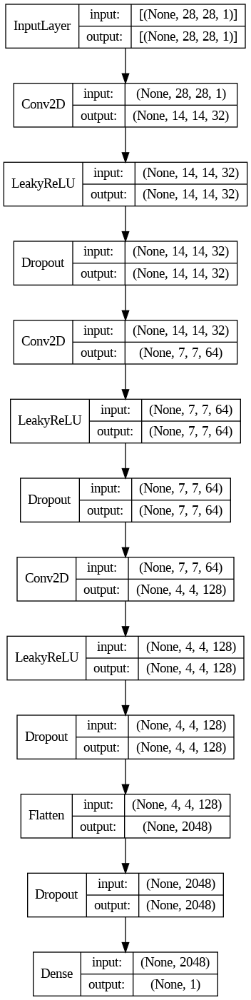

In [ ]:
discriminator = create_discriminator()
plot_model(discriminator, show_shapes=True, show_layer_names=False)

## GAN model definition

In [ ]:
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(), metrics=['accuracy'])
discriminator.trainable = False

z = Input(shape=(100,))
img = generator(z)
validity = discriminator(img)

combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam())

## Plotting functions

> En este caso voy a modificar un poco el plot para poder ver más muestras durante el fit.

In [ ]:
def sample_images(epoch, batch, gen_imgs, imgs):
    plt.rcParams['figure.figsize'] = [35, 7]
    fig, axs = plt.subplots(2, 20)
    fig.suptitle('Epoch: ' + str(epoch) + ', Batch: ' + str(batch), fontsize=16)
    for i in range(20):
        axs[0,i].imshow(gen_imgs[i,:,:,0], cmap='Greys')
        axs[0,i].axis('off')

    for i in range(20):
        axs[1,i].imshow(imgs[i,:,:,0], cmap='Greys')
        axs[1,i].axis('off')
    plt.show()
    plt.close()

In [ ]:
def plot_losses(history):
    plt.rcParams['figure.figsize'] = [20, 5]
    f, (ax1, ax2) = plt.subplots(1, 2, sharex=True)

    ax1.set_title('Losses')
    ax1.set_xlabel('epoch')
    ax1.legend(loc="upper right")
    ax1.grid()

    ax1.plot(history['d_loss'], label='D loss')
    ax1.plot(history['g_loss'], label='G loss')
    ax1.legend()

    ax2.set_title('D accuracy')
    ax2.set_xlabel('epoch')
    ax2.legend(loc="upper right")
    ax2.grid()

    ax2.plot(history['d_acc'], label='Accuracy')
    ax2.legend()

    plt.show()

## Análisis de resultado

También voy a aumentar el número de epoch a 15.

----EPOCH 0-----
0 [D loss: 0.6934,	 acc.: 29.69%]	[G loss: 0.5254]


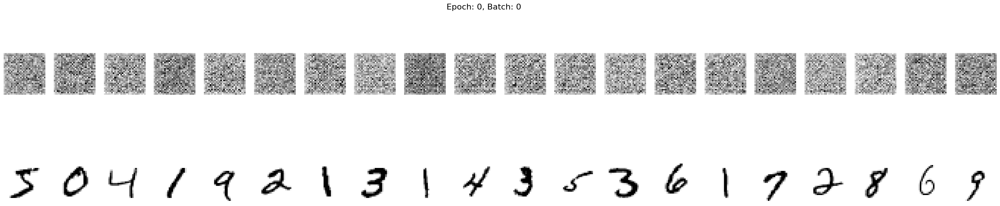

50 [D loss: 0.0259,	 acc.: 100.00%]	[G loss: 5.1211]
100 [D loss: 0.0876,	 acc.: 100.00%]	[G loss: 1.3589]
150 [D loss: 0.1929,	 acc.: 90.62%]	[G loss: 7.7008]
200 [D loss: 0.0588,	 acc.: 98.44%]	[G loss: 6.0791]
250 [D loss: 0.0018,	 acc.: 100.00%]	[G loss: 8.0165]
300 [D loss: 0.0113,	 acc.: 100.00%]	[G loss: 6.5975]
350 [D loss: 0.0420,	 acc.: 100.00%]	[G loss: 6.5795]
400 [D loss: 0.2826,	 acc.: 84.38%]	[G loss: 3.0135]
450 [D loss: 0.1281,	 acc.: 98.44%]	[G loss: 2.3741]
500 [D loss: 0.1649,	 acc.: 95.31%]	[G loss: 4.7934]


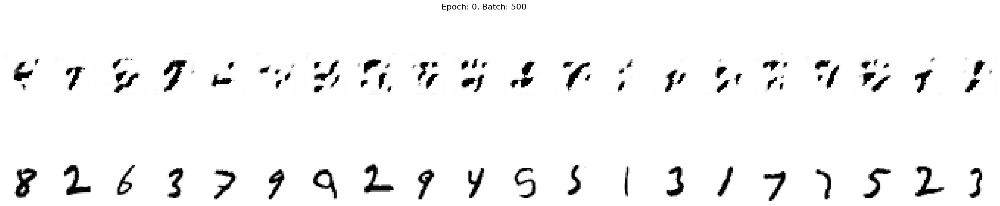

550 [D loss: 0.2958,	 acc.: 85.94%]	[G loss: 3.4329]
600 [D loss: 0.0861,	 acc.: 100.00%]	[G loss: 3.4653]
650 [D loss: 0.2306,	 acc.: 92.19%]	[G loss: 2.0016]
700 [D loss: 0.1530,	 acc.: 90.62%]	[G loss: 4.2928]
750 [D loss: 0.2788,	 acc.: 87.50%]	[G loss: 2.6168]
800 [D loss: 0.1978,	 acc.: 92.19%]	[G loss: 3.5515]
850 [D loss: 0.3082,	 acc.: 84.38%]	[G loss: 2.7787]
900 [D loss: 0.1617,	 acc.: 92.19%]	[G loss: 2.7757]
950 [D loss: 0.3682,	 acc.: 85.94%]	[G loss: 2.0986]
1000 [D loss: 0.2764,	 acc.: 89.06%]	[G loss: 2.2873]


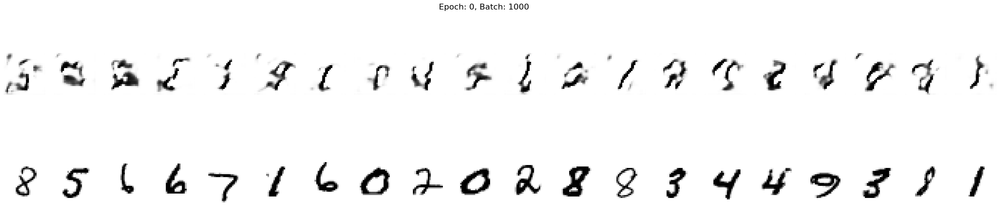

1050 [D loss: 0.3097,	 acc.: 87.50%]	[G loss: 3.1492]
1100 [D loss: 0.2200,	 acc.: 93.75%]	[G loss: 2.6767]
1150 [D loss: 0.4682,	 acc.: 81.25%]	[G loss: 3.2533]
1200 [D loss: 0.2845,	 acc.: 85.94%]	[G loss: 2.2348]
1250 [D loss: 0.3983,	 acc.: 81.25%]	[G loss: 2.0305]
1300 [D loss: 0.1610,	 acc.: 96.88%]	[G loss: 2.6202]
1350 [D loss: 0.2701,	 acc.: 87.50%]	[G loss: 2.4184]
1400 [D loss: 0.3541,	 acc.: 84.38%]	[G loss: 2.5980]
1450 [D loss: 0.1588,	 acc.: 95.31%]	[G loss: 3.2700]
1500 [D loss: 0.3507,	 acc.: 84.38%]	[G loss: 1.8140]


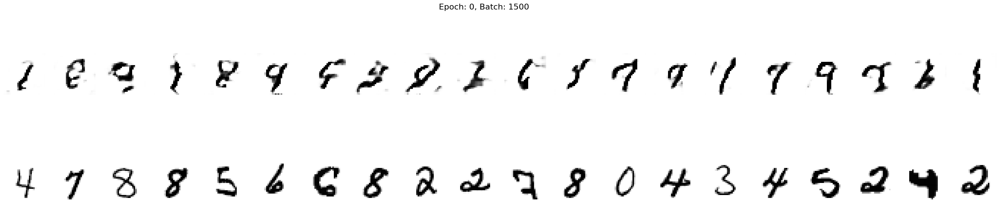

1550 [D loss: 0.2799,	 acc.: 87.50%]	[G loss: 3.2765]
1600 [D loss: 0.3974,	 acc.: 84.38%]	[G loss: 1.8254]
1650 [D loss: 0.1872,	 acc.: 93.75%]	[G loss: 2.6157]
1700 [D loss: 0.5608,	 acc.: 79.69%]	[G loss: 2.1544]
1750 [D loss: 0.3849,	 acc.: 85.94%]	[G loss: 2.3862]
1800 [D loss: 0.3381,	 acc.: 81.25%]	[G loss: 2.3997]
1850 [D loss: 0.2828,	 acc.: 85.94%]	[G loss: 1.8562]


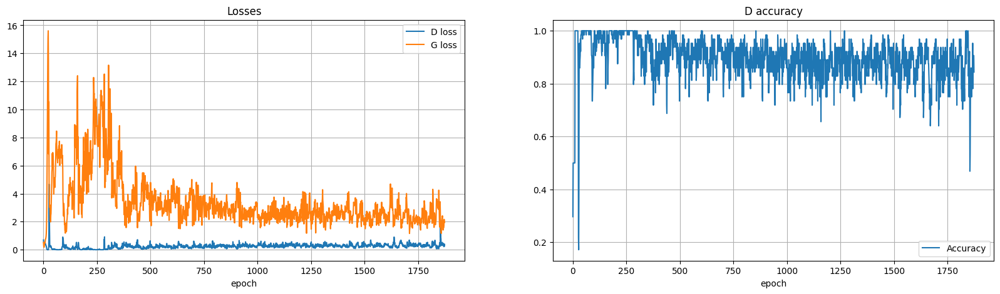

----EPOCH 1-----
0 [D loss: 0.2991,	 acc.: 90.62%]	[G loss: 2.1047]


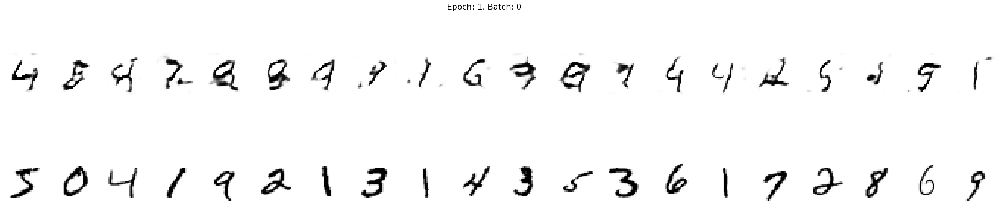

50 [D loss: 0.2272,	 acc.: 89.06%]	[G loss: 2.4697]
100 [D loss: 0.3012,	 acc.: 82.81%]	[G loss: 2.1273]
150 [D loss: 0.4758,	 acc.: 84.38%]	[G loss: 2.7125]
200 [D loss: 0.3994,	 acc.: 89.06%]	[G loss: 1.9433]
250 [D loss: 0.2089,	 acc.: 90.62%]	[G loss: 3.1233]
300 [D loss: 0.1509,	 acc.: 93.75%]	[G loss: 2.5977]
350 [D loss: 0.3288,	 acc.: 84.38%]	[G loss: 2.1608]
400 [D loss: 0.4741,	 acc.: 75.00%]	[G loss: 1.8744]
450 [D loss: 0.3159,	 acc.: 87.50%]	[G loss: 2.4843]
500 [D loss: 0.2503,	 acc.: 89.06%]	[G loss: 2.1185]


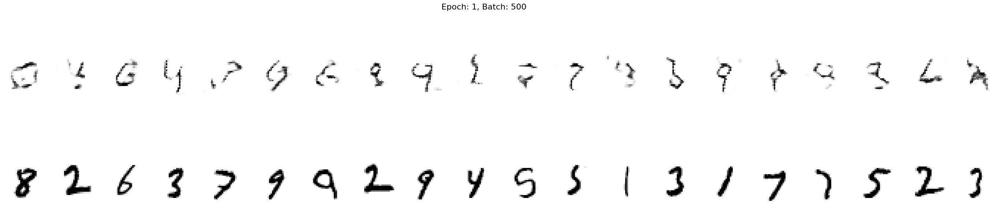

550 [D loss: 0.3184,	 acc.: 87.50%]	[G loss: 2.6654]
600 [D loss: 0.2403,	 acc.: 89.06%]	[G loss: 2.8123]
650 [D loss: 0.1741,	 acc.: 92.19%]	[G loss: 2.3424]
700 [D loss: 0.2975,	 acc.: 85.94%]	[G loss: 1.9813]
750 [D loss: 0.7632,	 acc.: 68.75%]	[G loss: 1.8890]
800 [D loss: 0.2837,	 acc.: 85.94%]	[G loss: 2.3103]
850 [D loss: 0.3464,	 acc.: 87.50%]	[G loss: 2.5367]
900 [D loss: 0.3193,	 acc.: 85.94%]	[G loss: 2.6000]
950 [D loss: 0.3962,	 acc.: 79.69%]	[G loss: 1.7526]
1000 [D loss: 0.5089,	 acc.: 79.69%]	[G loss: 1.9712]


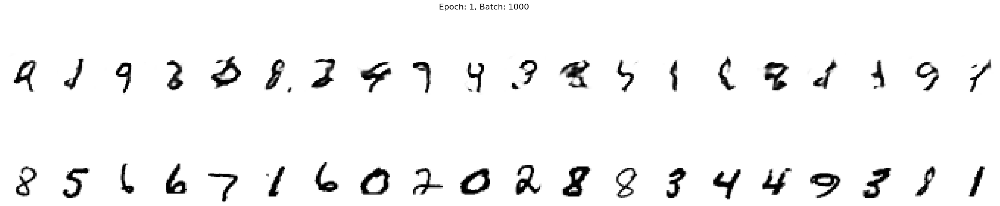

1050 [D loss: 0.3313,	 acc.: 84.38%]	[G loss: 2.1928]
1100 [D loss: 0.2219,	 acc.: 93.75%]	[G loss: 2.0702]
1150 [D loss: 0.3456,	 acc.: 84.38%]	[G loss: 2.8295]
1200 [D loss: 0.3894,	 acc.: 84.38%]	[G loss: 1.6354]
1250 [D loss: 0.3105,	 acc.: 85.94%]	[G loss: 2.0051]
1300 [D loss: 0.3514,	 acc.: 85.94%]	[G loss: 2.0962]
1350 [D loss: 0.2820,	 acc.: 84.38%]	[G loss: 2.3292]
1400 [D loss: 0.5148,	 acc.: 75.00%]	[G loss: 1.8404]
1450 [D loss: 0.4362,	 acc.: 82.81%]	[G loss: 1.8340]
1500 [D loss: 0.3561,	 acc.: 90.62%]	[G loss: 2.3819]


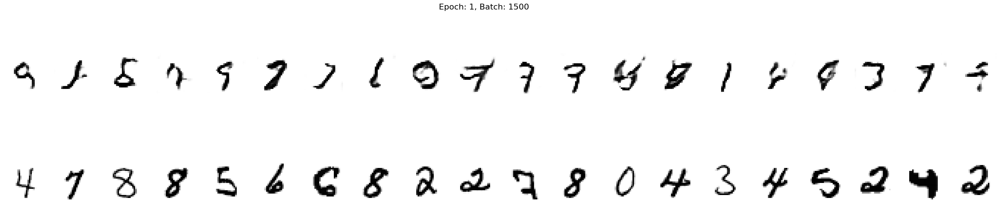

1550 [D loss: 0.2845,	 acc.: 90.62%]	[G loss: 2.4661]
1600 [D loss: 0.2534,	 acc.: 92.19%]	[G loss: 2.3073]
1650 [D loss: 0.2953,	 acc.: 87.50%]	[G loss: 2.1741]
1700 [D loss: 0.4636,	 acc.: 76.56%]	[G loss: 3.1248]
1750 [D loss: 0.4003,	 acc.: 84.38%]	[G loss: 2.2266]
1800 [D loss: 0.3674,	 acc.: 84.38%]	[G loss: 2.3688]
1850 [D loss: 0.2319,	 acc.: 85.94%]	[G loss: 2.8047]


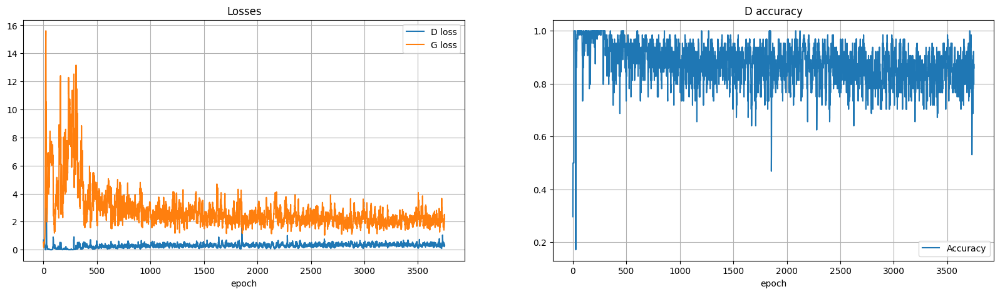

----EPOCH 2-----
0 [D loss: 0.3766,	 acc.: 82.81%]	[G loss: 2.5069]


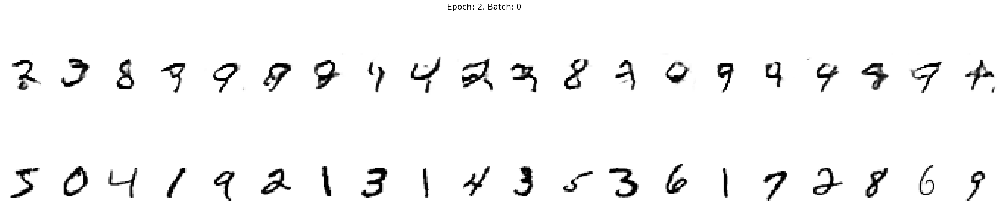

50 [D loss: 0.4238,	 acc.: 82.81%]	[G loss: 2.4265]
100 [D loss: 0.3817,	 acc.: 81.25%]	[G loss: 1.7483]
150 [D loss: 0.3427,	 acc.: 90.62%]	[G loss: 2.2509]
200 [D loss: 0.2603,	 acc.: 90.62%]	[G loss: 2.4195]
250 [D loss: 0.3688,	 acc.: 87.50%]	[G loss: 2.0361]
300 [D loss: 0.2848,	 acc.: 89.06%]	[G loss: 2.7875]
350 [D loss: 0.4672,	 acc.: 76.56%]	[G loss: 1.5849]
400 [D loss: 0.4489,	 acc.: 76.56%]	[G loss: 1.9829]
450 [D loss: 0.3360,	 acc.: 84.38%]	[G loss: 2.0843]
500 [D loss: 0.4986,	 acc.: 76.56%]	[G loss: 1.8762]


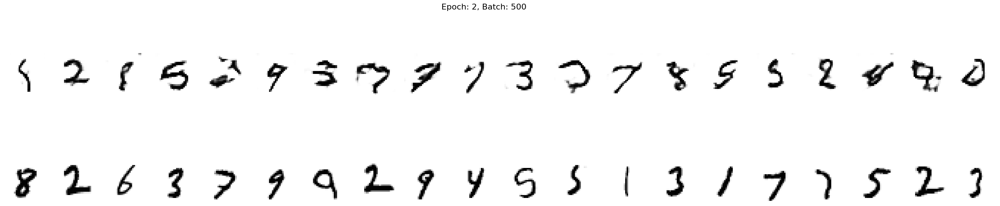

550 [D loss: 0.3697,	 acc.: 84.38%]	[G loss: 2.1367]
600 [D loss: 0.6482,	 acc.: 71.88%]	[G loss: 2.0031]
650 [D loss: 0.2971,	 acc.: 89.06%]	[G loss: 1.9571]
700 [D loss: 0.3956,	 acc.: 82.81%]	[G loss: 1.6762]
750 [D loss: 0.3375,	 acc.: 84.38%]	[G loss: 1.7837]
800 [D loss: 0.3751,	 acc.: 81.25%]	[G loss: 1.9189]
850 [D loss: 0.3326,	 acc.: 87.50%]	[G loss: 1.5808]
900 [D loss: 0.2994,	 acc.: 90.62%]	[G loss: 1.4740]
950 [D loss: 0.4702,	 acc.: 81.25%]	[G loss: 1.6905]
1000 [D loss: 0.5129,	 acc.: 78.12%]	[G loss: 1.7733]


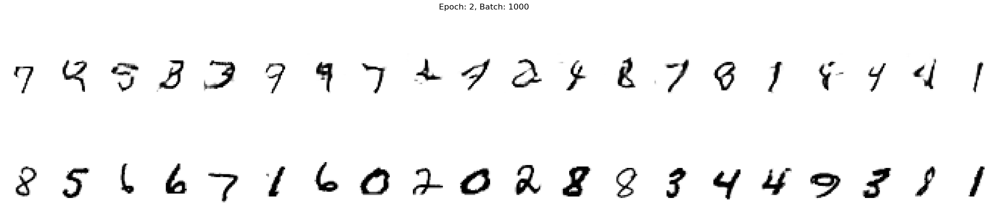

1050 [D loss: 0.3131,	 acc.: 84.38%]	[G loss: 1.8646]
1100 [D loss: 0.2267,	 acc.: 95.31%]	[G loss: 2.1945]
1150 [D loss: 0.6800,	 acc.: 73.44%]	[G loss: 2.1884]
1200 [D loss: 0.5303,	 acc.: 70.31%]	[G loss: 1.7056]
1250 [D loss: 0.4503,	 acc.: 73.44%]	[G loss: 2.2130]
1300 [D loss: 0.5400,	 acc.: 71.88%]	[G loss: 1.8441]
1350 [D loss: 0.3653,	 acc.: 84.38%]	[G loss: 2.7116]
1400 [D loss: 0.5500,	 acc.: 71.88%]	[G loss: 1.9084]
1450 [D loss: 0.2727,	 acc.: 92.19%]	[G loss: 1.9617]
1500 [D loss: 0.5366,	 acc.: 78.12%]	[G loss: 1.6959]


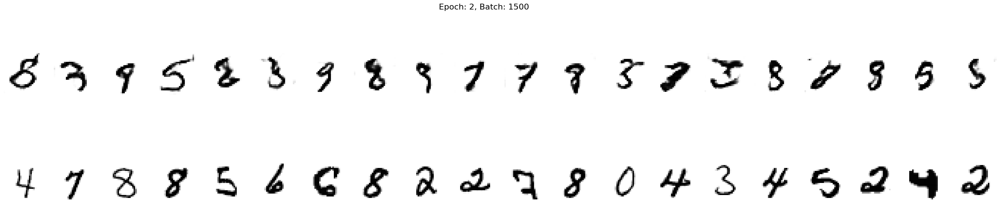

1550 [D loss: 0.3335,	 acc.: 85.94%]	[G loss: 1.5684]
1600 [D loss: 0.3587,	 acc.: 89.06%]	[G loss: 2.1053]
1650 [D loss: 0.4651,	 acc.: 75.00%]	[G loss: 1.5123]
1700 [D loss: 0.6260,	 acc.: 65.62%]	[G loss: 1.8310]
1750 [D loss: 0.4074,	 acc.: 79.69%]	[G loss: 2.2335]
1800 [D loss: 0.4648,	 acc.: 78.12%]	[G loss: 2.3205]
1850 [D loss: 0.3663,	 acc.: 81.25%]	[G loss: 1.9090]


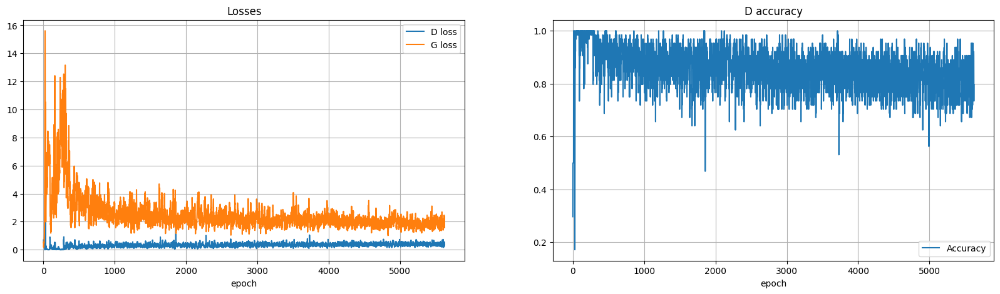

----EPOCH 3-----
0 [D loss: 0.3545,	 acc.: 89.06%]	[G loss: 1.9256]


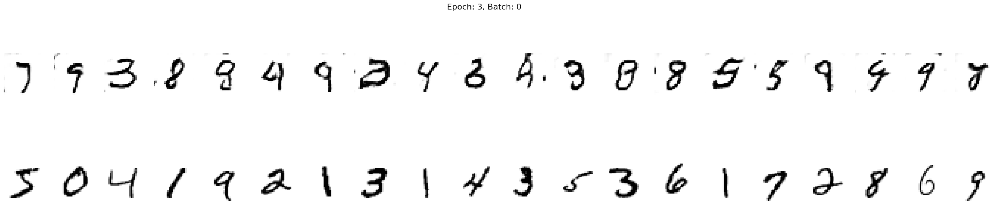

50 [D loss: 0.2917,	 acc.: 85.94%]	[G loss: 1.5359]
100 [D loss: 0.3219,	 acc.: 87.50%]	[G loss: 2.6627]
150 [D loss: 0.3532,	 acc.: 81.25%]	[G loss: 1.5487]
200 [D loss: 0.4571,	 acc.: 76.56%]	[G loss: 1.5689]
250 [D loss: 0.5554,	 acc.: 75.00%]	[G loss: 1.6909]
300 [D loss: 0.4582,	 acc.: 76.56%]	[G loss: 1.5956]
350 [D loss: 0.4871,	 acc.: 75.00%]	[G loss: 1.6657]
400 [D loss: 0.4829,	 acc.: 79.69%]	[G loss: 1.6608]
450 [D loss: 0.4138,	 acc.: 79.69%]	[G loss: 1.7110]
500 [D loss: 0.5820,	 acc.: 68.75%]	[G loss: 1.4784]


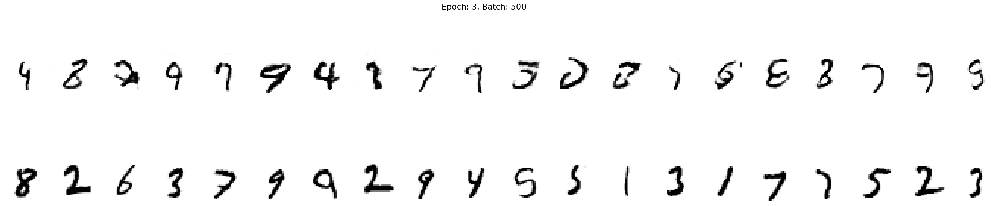

550 [D loss: 0.4938,	 acc.: 75.00%]	[G loss: 1.7308]
600 [D loss: 0.3793,	 acc.: 84.38%]	[G loss: 1.8060]
650 [D loss: 0.4390,	 acc.: 78.12%]	[G loss: 1.7582]
700 [D loss: 0.4313,	 acc.: 78.12%]	[G loss: 1.5929]
750 [D loss: 0.4008,	 acc.: 78.12%]	[G loss: 1.3632]
800 [D loss: 0.5091,	 acc.: 73.44%]	[G loss: 1.7014]
850 [D loss: 0.2817,	 acc.: 89.06%]	[G loss: 1.3087]
900 [D loss: 0.3655,	 acc.: 85.94%]	[G loss: 1.9202]
950 [D loss: 0.3315,	 acc.: 89.06%]	[G loss: 1.4837]
1000 [D loss: 0.5963,	 acc.: 71.88%]	[G loss: 1.5393]


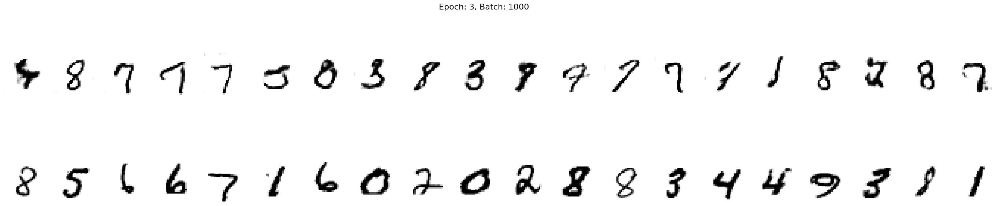

1050 [D loss: 0.4087,	 acc.: 81.25%]	[G loss: 1.7490]
1100 [D loss: 0.5311,	 acc.: 67.19%]	[G loss: 1.7894]
1150 [D loss: 0.3735,	 acc.: 81.25%]	[G loss: 1.9271]
1200 [D loss: 0.3943,	 acc.: 84.38%]	[G loss: 1.5589]
1250 [D loss: 0.3914,	 acc.: 81.25%]	[G loss: 1.8078]
1300 [D loss: 0.5376,	 acc.: 82.81%]	[G loss: 1.5199]
1350 [D loss: 0.4830,	 acc.: 81.25%]	[G loss: 1.7677]
1400 [D loss: 0.3543,	 acc.: 82.81%]	[G loss: 1.4435]
1450 [D loss: 0.4099,	 acc.: 75.00%]	[G loss: 1.4456]
1500 [D loss: 0.4171,	 acc.: 84.38%]	[G loss: 1.9002]


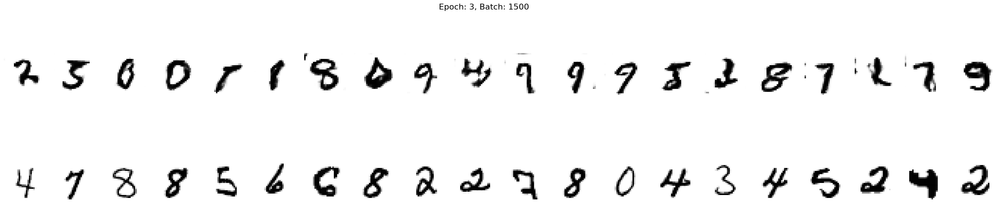

1550 [D loss: 0.3297,	 acc.: 87.50%]	[G loss: 1.5583]
1600 [D loss: 0.5824,	 acc.: 68.75%]	[G loss: 1.8521]
1650 [D loss: 0.5342,	 acc.: 76.56%]	[G loss: 1.2417]
1700 [D loss: 0.5162,	 acc.: 73.44%]	[G loss: 1.8860]
1750 [D loss: 0.6195,	 acc.: 75.00%]	[G loss: 2.0707]
1800 [D loss: 0.3228,	 acc.: 84.38%]	[G loss: 1.9472]
1850 [D loss: 0.4406,	 acc.: 73.44%]	[G loss: 2.4795]


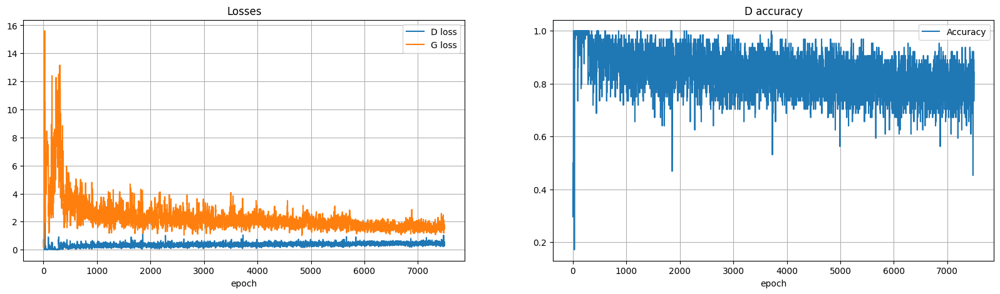

----EPOCH 4-----
0 [D loss: 0.4734,	 acc.: 78.12%]	[G loss: 1.5958]


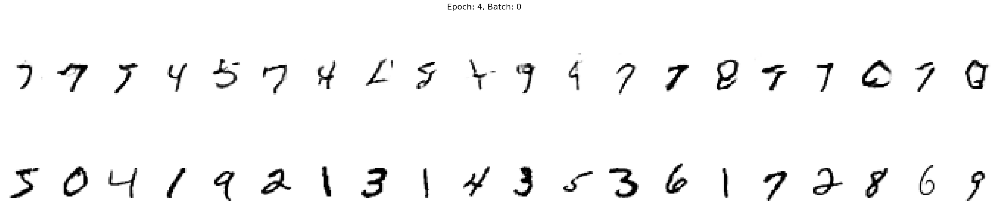

50 [D loss: 0.3557,	 acc.: 79.69%]	[G loss: 1.5494]
100 [D loss: 0.4012,	 acc.: 84.38%]	[G loss: 1.3952]
150 [D loss: 0.4646,	 acc.: 76.56%]	[G loss: 1.2777]
200 [D loss: 0.3484,	 acc.: 85.94%]	[G loss: 1.5021]
250 [D loss: 0.3780,	 acc.: 84.38%]	[G loss: 1.5829]
300 [D loss: 0.3803,	 acc.: 82.81%]	[G loss: 1.4288]
350 [D loss: 0.5035,	 acc.: 78.12%]	[G loss: 1.2837]
400 [D loss: 0.4154,	 acc.: 81.25%]	[G loss: 1.5591]
450 [D loss: 0.4917,	 acc.: 78.12%]	[G loss: 1.2126]
500 [D loss: 0.5668,	 acc.: 73.44%]	[G loss: 1.4279]


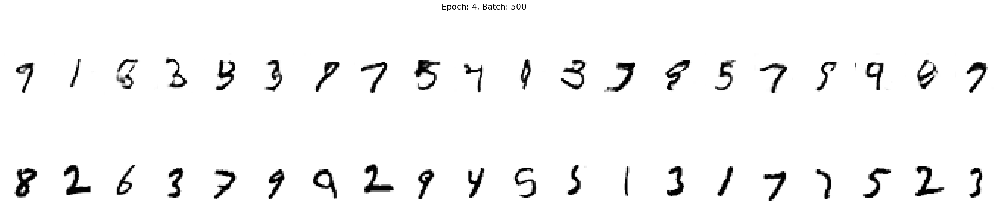

550 [D loss: 0.4242,	 acc.: 79.69%]	[G loss: 1.4130]
600 [D loss: 0.5001,	 acc.: 73.44%]	[G loss: 1.3395]
650 [D loss: 0.3780,	 acc.: 82.81%]	[G loss: 1.6622]
700 [D loss: 0.4362,	 acc.: 78.12%]	[G loss: 1.6289]
750 [D loss: 0.6432,	 acc.: 71.88%]	[G loss: 1.3707]
800 [D loss: 0.4131,	 acc.: 81.25%]	[G loss: 1.4069]
850 [D loss: 0.3379,	 acc.: 87.50%]	[G loss: 1.4749]
900 [D loss: 0.3253,	 acc.: 87.50%]	[G loss: 1.4018]
950 [D loss: 0.4637,	 acc.: 76.56%]	[G loss: 1.2245]
1000 [D loss: 0.5977,	 acc.: 65.62%]	[G loss: 1.7185]


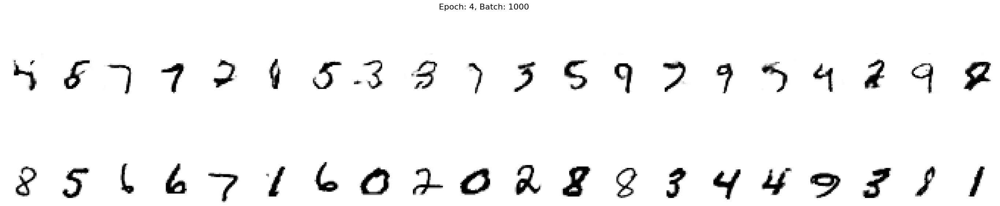

1050 [D loss: 0.4790,	 acc.: 73.44%]	[G loss: 1.7490]
1100 [D loss: 0.4400,	 acc.: 76.56%]	[G loss: 1.5243]
1150 [D loss: 0.5068,	 acc.: 76.56%]	[G loss: 1.4426]
1200 [D loss: 0.3851,	 acc.: 81.25%]	[G loss: 1.4591]
1250 [D loss: 0.4980,	 acc.: 73.44%]	[G loss: 1.5852]
1300 [D loss: 0.5171,	 acc.: 76.56%]	[G loss: 1.3869]
1350 [D loss: 0.4499,	 acc.: 75.00%]	[G loss: 1.3396]
1400 [D loss: 0.5416,	 acc.: 70.31%]	[G loss: 1.6645]
1450 [D loss: 0.5019,	 acc.: 76.56%]	[G loss: 1.4744]
1500 [D loss: 0.5527,	 acc.: 75.00%]	[G loss: 1.7541]


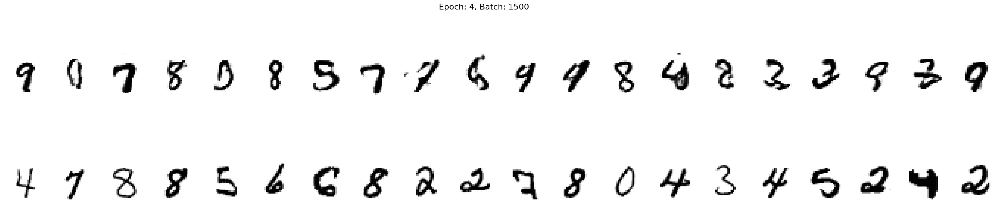

1550 [D loss: 0.4262,	 acc.: 75.00%]	[G loss: 1.4747]
1600 [D loss: 0.4929,	 acc.: 81.25%]	[G loss: 1.4749]
1650 [D loss: 0.4852,	 acc.: 76.56%]	[G loss: 1.5274]
1700 [D loss: 0.4525,	 acc.: 79.69%]	[G loss: 1.6116]
1750 [D loss: 0.6013,	 acc.: 71.88%]	[G loss: 1.6384]
1800 [D loss: 0.4625,	 acc.: 78.12%]	[G loss: 1.4361]
1850 [D loss: 0.3811,	 acc.: 81.25%]	[G loss: 2.2839]


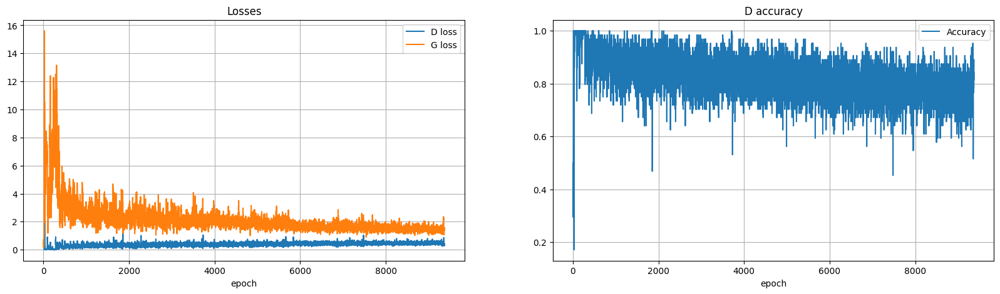

----EPOCH 5-----
0 [D loss: 0.4888,	 acc.: 71.88%]	[G loss: 1.7080]


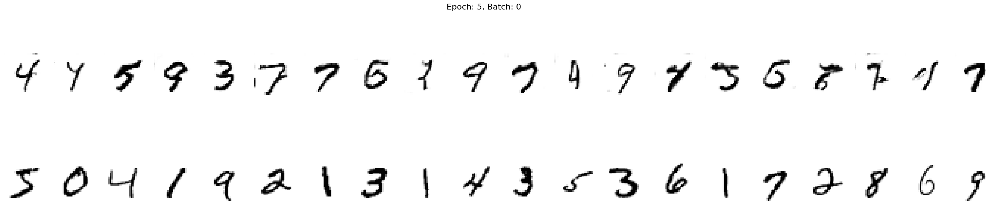

50 [D loss: 0.3134,	 acc.: 87.50%]	[G loss: 1.5095]
100 [D loss: 0.4708,	 acc.: 78.12%]	[G loss: 1.5821]
150 [D loss: 0.5321,	 acc.: 71.88%]	[G loss: 1.5634]
200 [D loss: 0.3993,	 acc.: 78.12%]	[G loss: 1.7301]
250 [D loss: 0.4174,	 acc.: 81.25%]	[G loss: 1.3584]
300 [D loss: 0.4346,	 acc.: 81.25%]	[G loss: 1.5293]
350 [D loss: 0.5184,	 acc.: 68.75%]	[G loss: 1.4726]
400 [D loss: 0.3986,	 acc.: 82.81%]	[G loss: 0.9915]
450 [D loss: 0.4457,	 acc.: 76.56%]	[G loss: 1.2636]
500 [D loss: 0.7771,	 acc.: 60.94%]	[G loss: 1.3958]


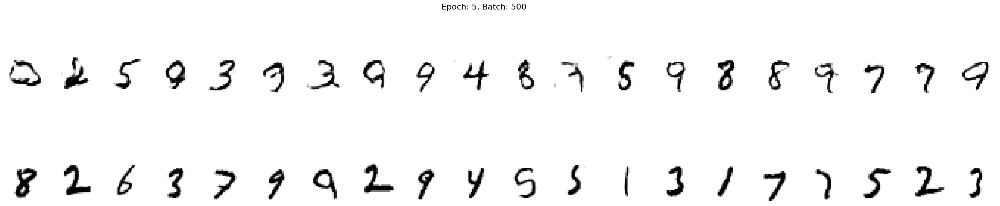

550 [D loss: 0.4026,	 acc.: 78.12%]	[G loss: 1.4184]
600 [D loss: 0.5361,	 acc.: 76.56%]	[G loss: 1.4527]
650 [D loss: 0.3773,	 acc.: 87.50%]	[G loss: 1.4725]
700 [D loss: 0.4626,	 acc.: 76.56%]	[G loss: 1.5167]
750 [D loss: 0.5778,	 acc.: 71.88%]	[G loss: 1.6762]
800 [D loss: 0.4667,	 acc.: 82.81%]	[G loss: 1.7806]
850 [D loss: 0.4265,	 acc.: 84.38%]	[G loss: 1.2540]
900 [D loss: 0.2649,	 acc.: 90.62%]	[G loss: 1.5485]
950 [D loss: 0.3906,	 acc.: 79.69%]	[G loss: 1.5460]
1000 [D loss: 0.5715,	 acc.: 64.06%]	[G loss: 1.4616]


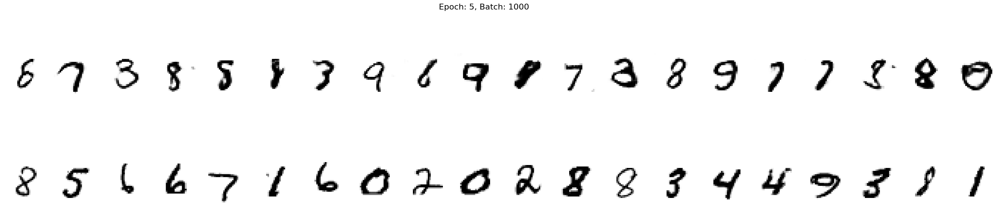

1050 [D loss: 0.5363,	 acc.: 67.19%]	[G loss: 1.4210]
1100 [D loss: 0.3269,	 acc.: 85.94%]	[G loss: 1.4176]
1150 [D loss: 0.4228,	 acc.: 81.25%]	[G loss: 1.1774]
1200 [D loss: 0.4833,	 acc.: 78.12%]	[G loss: 1.5990]
1250 [D loss: 0.5466,	 acc.: 71.88%]	[G loss: 1.3622]
1300 [D loss: 0.5567,	 acc.: 71.88%]	[G loss: 1.6119]
1350 [D loss: 0.4516,	 acc.: 78.12%]	[G loss: 1.1491]
1400 [D loss: 0.4017,	 acc.: 81.25%]	[G loss: 1.7369]
1450 [D loss: 0.3779,	 acc.: 81.25%]	[G loss: 1.3218]
1500 [D loss: 0.5196,	 acc.: 76.56%]	[G loss: 1.5135]


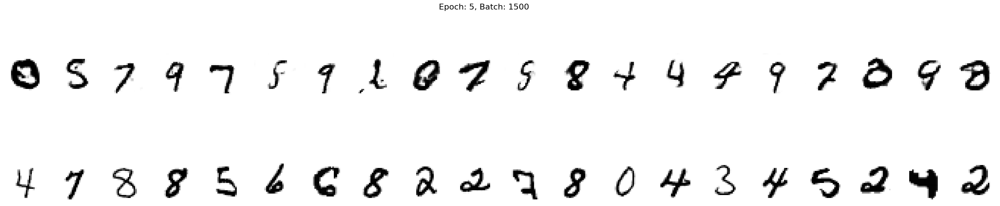

1550 [D loss: 0.3787,	 acc.: 81.25%]	[G loss: 1.5532]
1600 [D loss: 0.4725,	 acc.: 79.69%]	[G loss: 1.5717]
1650 [D loss: 0.4850,	 acc.: 78.12%]	[G loss: 1.6899]
1700 [D loss: 0.3765,	 acc.: 82.81%]	[G loss: 1.9894]
1750 [D loss: 0.4041,	 acc.: 84.38%]	[G loss: 1.6441]
1800 [D loss: 0.3748,	 acc.: 84.38%]	[G loss: 1.6820]
1850 [D loss: 0.4521,	 acc.: 84.38%]	[G loss: 2.0079]


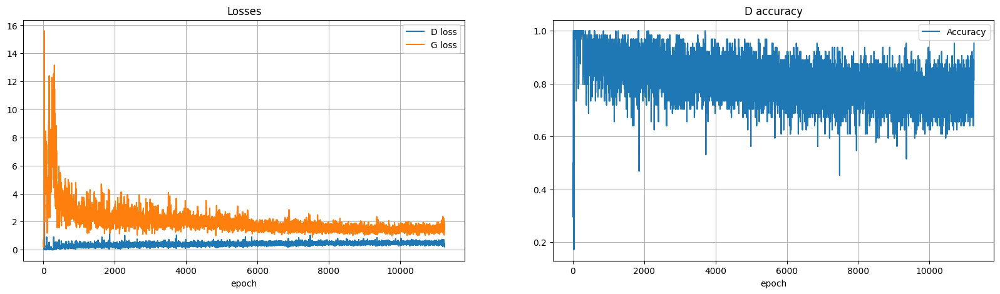

----EPOCH 6-----
0 [D loss: 0.3954,	 acc.: 76.56%]	[G loss: 1.9948]


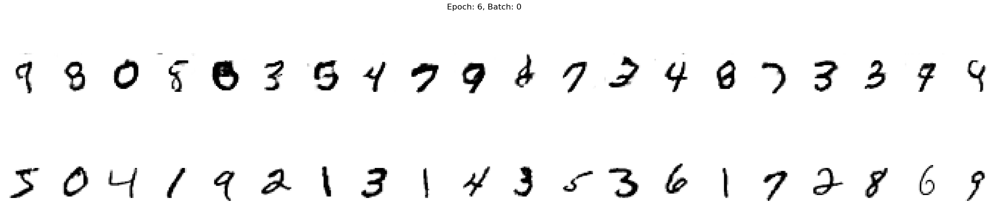

50 [D loss: 0.5337,	 acc.: 71.88%]	[G loss: 1.7017]
100 [D loss: 0.3578,	 acc.: 82.81%]	[G loss: 1.5915]
150 [D loss: 0.4960,	 acc.: 78.12%]	[G loss: 1.4916]
200 [D loss: 0.3810,	 acc.: 85.94%]	[G loss: 1.4981]
250 [D loss: 0.3955,	 acc.: 82.81%]	[G loss: 1.5364]
300 [D loss: 0.4298,	 acc.: 81.25%]	[G loss: 1.6250]
350 [D loss: 0.5290,	 acc.: 70.31%]	[G loss: 1.5470]
400 [D loss: 0.5181,	 acc.: 78.12%]	[G loss: 1.2823]
450 [D loss: 0.4256,	 acc.: 81.25%]	[G loss: 1.5919]
500 [D loss: 0.6524,	 acc.: 60.94%]	[G loss: 1.2859]


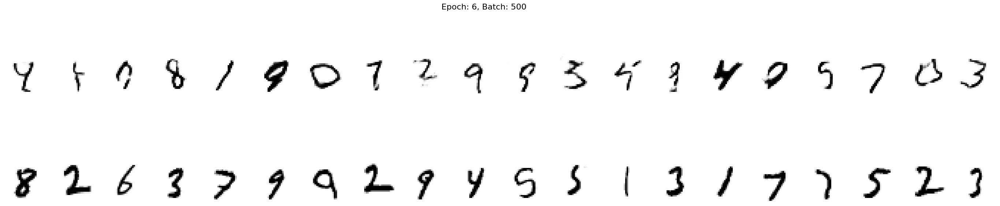

550 [D loss: 0.5720,	 acc.: 84.38%]	[G loss: 1.4250]
600 [D loss: 0.4564,	 acc.: 81.25%]	[G loss: 1.5632]
650 [D loss: 0.3810,	 acc.: 78.12%]	[G loss: 1.7066]
700 [D loss: 0.4385,	 acc.: 84.38%]	[G loss: 1.5223]
750 [D loss: 0.5736,	 acc.: 65.62%]	[G loss: 1.5005]
800 [D loss: 0.5338,	 acc.: 70.31%]	[G loss: 1.4223]
850 [D loss: 0.5950,	 acc.: 78.12%]	[G loss: 1.1415]
900 [D loss: 0.3873,	 acc.: 82.81%]	[G loss: 1.3877]
950 [D loss: 0.3839,	 acc.: 82.81%]	[G loss: 1.6216]
1000 [D loss: 0.4321,	 acc.: 76.56%]	[G loss: 1.2149]


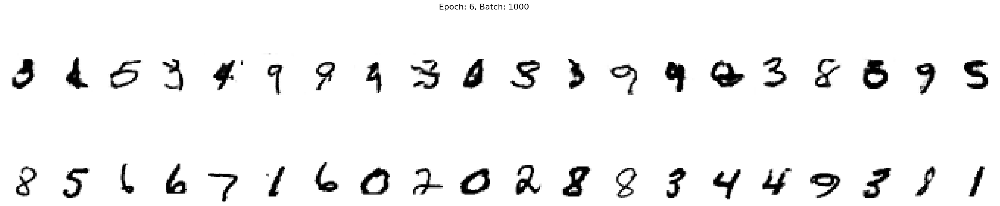

1050 [D loss: 0.4754,	 acc.: 81.25%]	[G loss: 1.3460]
1100 [D loss: 0.4439,	 acc.: 75.00%]	[G loss: 1.4671]
1150 [D loss: 0.4607,	 acc.: 78.12%]	[G loss: 1.2969]
1200 [D loss: 0.3620,	 acc.: 82.81%]	[G loss: 1.3261]
1250 [D loss: 0.4202,	 acc.: 84.38%]	[G loss: 1.3977]
1300 [D loss: 0.5122,	 acc.: 81.25%]	[G loss: 1.4396]
1350 [D loss: 0.4818,	 acc.: 79.69%]	[G loss: 1.4783]
1400 [D loss: 0.4281,	 acc.: 79.69%]	[G loss: 1.6171]
1450 [D loss: 0.4203,	 acc.: 81.25%]	[G loss: 1.5734]
1500 [D loss: 0.5077,	 acc.: 78.12%]	[G loss: 1.8237]


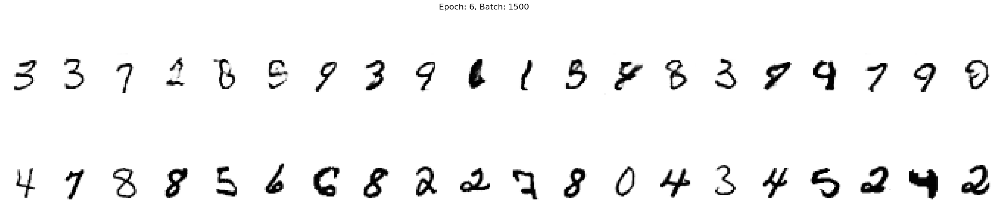

1550 [D loss: 0.3627,	 acc.: 81.25%]	[G loss: 1.2420]
1600 [D loss: 0.6027,	 acc.: 71.88%]	[G loss: 1.2004]
1650 [D loss: 0.5962,	 acc.: 68.75%]	[G loss: 1.3831]
1700 [D loss: 0.5707,	 acc.: 73.44%]	[G loss: 1.5621]
1750 [D loss: 0.4178,	 acc.: 78.12%]	[G loss: 1.5662]
1800 [D loss: 0.3911,	 acc.: 85.94%]	[G loss: 1.3395]
1850 [D loss: 0.4367,	 acc.: 81.25%]	[G loss: 1.5416]


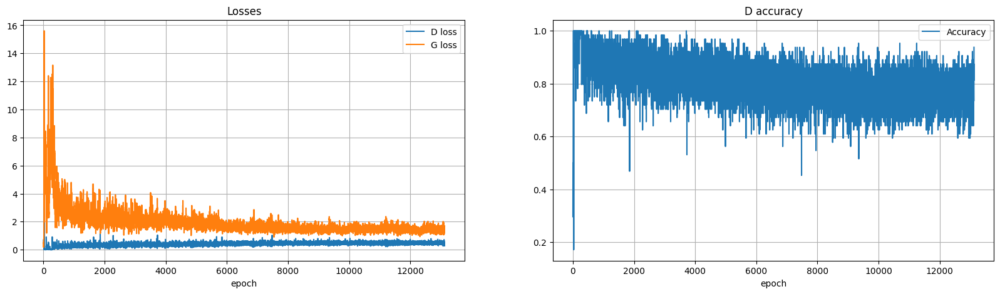

----EPOCH 7-----
0 [D loss: 0.5183,	 acc.: 78.12%]	[G loss: 1.5090]


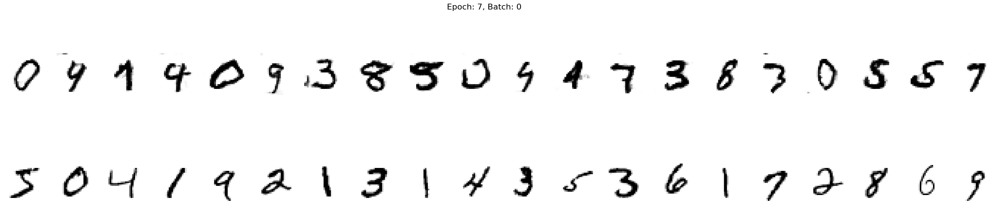

50 [D loss: 0.4654,	 acc.: 75.00%]	[G loss: 1.3373]
100 [D loss: 0.4227,	 acc.: 84.38%]	[G loss: 1.5860]
150 [D loss: 0.4492,	 acc.: 79.69%]	[G loss: 1.7518]
200 [D loss: 0.4491,	 acc.: 73.44%]	[G loss: 1.2699]
250 [D loss: 0.4127,	 acc.: 79.69%]	[G loss: 1.6039]
300 [D loss: 0.4600,	 acc.: 73.44%]	[G loss: 1.2809]
350 [D loss: 0.5183,	 acc.: 79.69%]	[G loss: 1.2645]
400 [D loss: 0.4993,	 acc.: 71.88%]	[G loss: 1.2465]
450 [D loss: 0.5306,	 acc.: 73.44%]	[G loss: 1.0996]
500 [D loss: 0.6036,	 acc.: 62.50%]	[G loss: 1.3585]


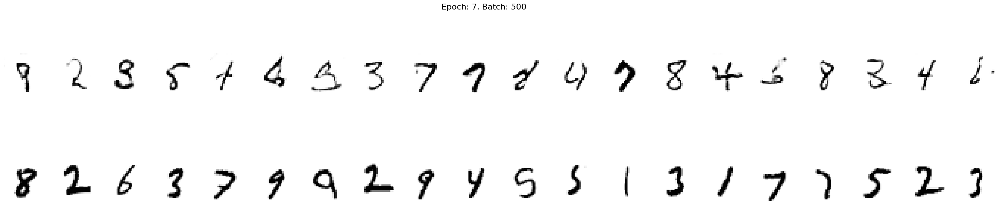

550 [D loss: 0.5258,	 acc.: 79.69%]	[G loss: 1.2880]
600 [D loss: 0.3608,	 acc.: 84.38%]	[G loss: 1.2971]
650 [D loss: 0.3680,	 acc.: 82.81%]	[G loss: 1.3412]
700 [D loss: 0.4739,	 acc.: 73.44%]	[G loss: 1.3136]
750 [D loss: 0.5343,	 acc.: 73.44%]	[G loss: 1.2396]
800 [D loss: 0.4875,	 acc.: 73.44%]	[G loss: 1.3766]
850 [D loss: 0.4010,	 acc.: 81.25%]	[G loss: 1.5131]
900 [D loss: 0.3381,	 acc.: 85.94%]	[G loss: 1.2551]
950 [D loss: 0.3768,	 acc.: 82.81%]	[G loss: 1.4279]
1000 [D loss: 0.4809,	 acc.: 79.69%]	[G loss: 1.4363]


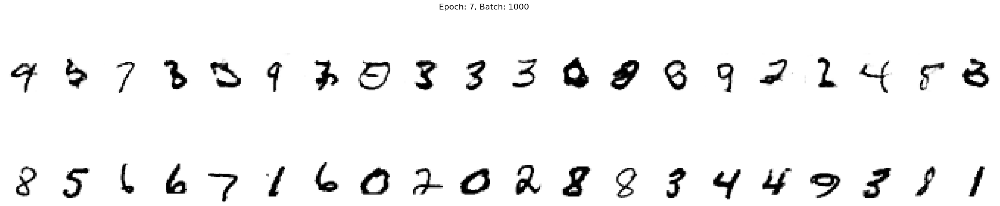

1050 [D loss: 0.3786,	 acc.: 81.25%]	[G loss: 1.6820]
1100 [D loss: 0.4229,	 acc.: 79.69%]	[G loss: 1.4361]
1150 [D loss: 0.5783,	 acc.: 70.31%]	[G loss: 1.4057]
1200 [D loss: 0.3812,	 acc.: 84.38%]	[G loss: 1.4482]
1250 [D loss: 0.4763,	 acc.: 81.25%]	[G loss: 1.5201]
1300 [D loss: 0.5584,	 acc.: 75.00%]	[G loss: 1.4556]
1350 [D loss: 0.5471,	 acc.: 75.00%]	[G loss: 1.2884]
1400 [D loss: 0.4618,	 acc.: 71.88%]	[G loss: 1.6181]
1450 [D loss: 0.5653,	 acc.: 68.75%]	[G loss: 1.4282]
1500 [D loss: 0.4203,	 acc.: 84.38%]	[G loss: 1.4352]


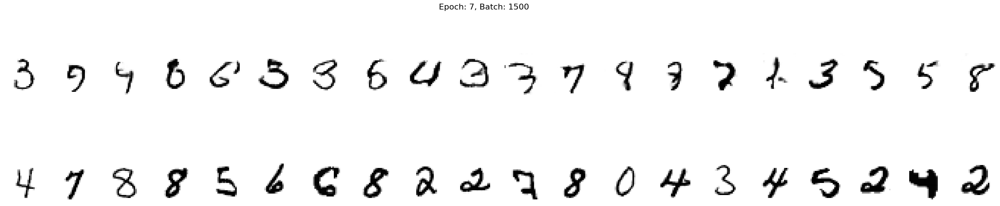

1550 [D loss: 0.4047,	 acc.: 84.38%]	[G loss: 1.4316]
1600 [D loss: 0.4571,	 acc.: 75.00%]	[G loss: 1.5954]
1650 [D loss: 0.5450,	 acc.: 68.75%]	[G loss: 1.4476]
1700 [D loss: 0.5643,	 acc.: 70.31%]	[G loss: 1.4010]
1750 [D loss: 0.4737,	 acc.: 79.69%]	[G loss: 1.5397]
1800 [D loss: 0.3902,	 acc.: 82.81%]	[G loss: 1.4237]
1850 [D loss: 0.3879,	 acc.: 79.69%]	[G loss: 1.8065]


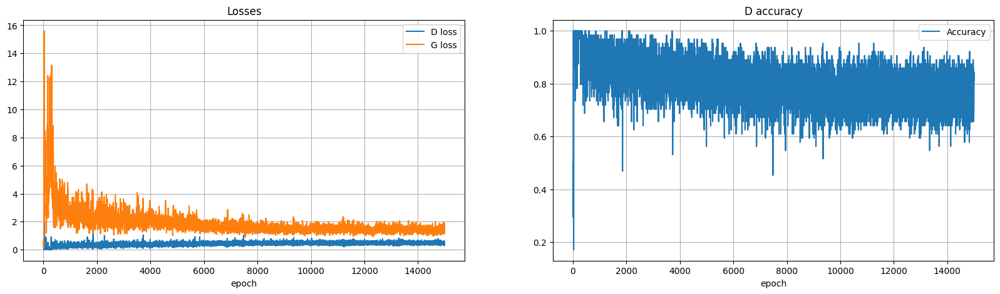

----EPOCH 8-----
0 [D loss: 0.3993,	 acc.: 79.69%]	[G loss: 1.7012]


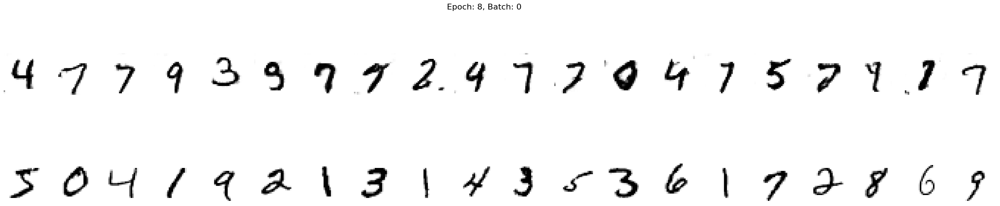

50 [D loss: 0.4694,	 acc.: 76.56%]	[G loss: 1.4064]
100 [D loss: 0.4783,	 acc.: 79.69%]	[G loss: 1.6524]
150 [D loss: 0.5601,	 acc.: 73.44%]	[G loss: 1.5930]
200 [D loss: 0.3341,	 acc.: 87.50%]	[G loss: 1.7570]
250 [D loss: 0.3619,	 acc.: 82.81%]	[G loss: 1.6023]
300 [D loss: 0.4143,	 acc.: 79.69%]	[G loss: 1.4569]
350 [D loss: 0.6267,	 acc.: 68.75%]	[G loss: 1.8525]
400 [D loss: 0.3885,	 acc.: 82.81%]	[G loss: 1.3399]
450 [D loss: 0.4713,	 acc.: 75.00%]	[G loss: 1.2256]
500 [D loss: 0.5896,	 acc.: 67.19%]	[G loss: 1.3366]


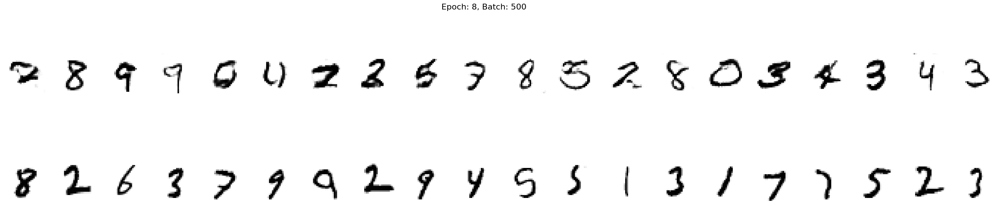

550 [D loss: 0.3859,	 acc.: 84.38%]	[G loss: 1.4124]
600 [D loss: 0.4880,	 acc.: 78.12%]	[G loss: 1.4039]
650 [D loss: 0.4559,	 acc.: 79.69%]	[G loss: 1.4693]
700 [D loss: 0.5231,	 acc.: 76.56%]	[G loss: 1.3798]
750 [D loss: 0.6415,	 acc.: 62.50%]	[G loss: 1.6830]
800 [D loss: 0.5053,	 acc.: 71.88%]	[G loss: 1.2692]
850 [D loss: 0.4023,	 acc.: 76.56%]	[G loss: 1.3135]
900 [D loss: 0.4164,	 acc.: 82.81%]	[G loss: 1.4227]
950 [D loss: 0.4003,	 acc.: 85.94%]	[G loss: 1.5560]
1000 [D loss: 0.4605,	 acc.: 71.88%]	[G loss: 1.1870]


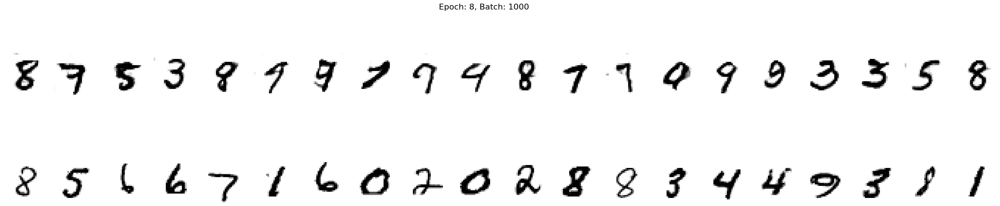

1050 [D loss: 0.5361,	 acc.: 75.00%]	[G loss: 1.4527]
1100 [D loss: 0.5121,	 acc.: 78.12%]	[G loss: 1.1730]
1150 [D loss: 0.4770,	 acc.: 78.12%]	[G loss: 1.6572]
1200 [D loss: 0.5454,	 acc.: 73.44%]	[G loss: 1.2771]
1250 [D loss: 0.4883,	 acc.: 73.44%]	[G loss: 1.2994]
1300 [D loss: 0.5912,	 acc.: 65.62%]	[G loss: 1.5040]
1350 [D loss: 0.4866,	 acc.: 71.88%]	[G loss: 1.5019]
1400 [D loss: 0.5265,	 acc.: 70.31%]	[G loss: 1.2937]
1450 [D loss: 0.4909,	 acc.: 75.00%]	[G loss: 1.3582]
1500 [D loss: 0.5341,	 acc.: 71.88%]	[G loss: 1.4476]


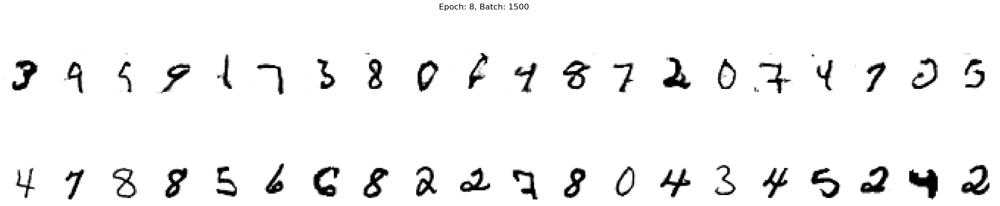

1550 [D loss: 0.3792,	 acc.: 81.25%]	[G loss: 1.3858]
1600 [D loss: 0.4842,	 acc.: 73.44%]	[G loss: 1.1826]
1650 [D loss: 0.5441,	 acc.: 70.31%]	[G loss: 1.5959]
1700 [D loss: 0.4856,	 acc.: 76.56%]	[G loss: 1.2846]
1750 [D loss: 0.6025,	 acc.: 70.31%]	[G loss: 1.2584]
1800 [D loss: 0.4006,	 acc.: 82.81%]	[G loss: 1.6291]
1850 [D loss: 0.3466,	 acc.: 85.94%]	[G loss: 1.7166]


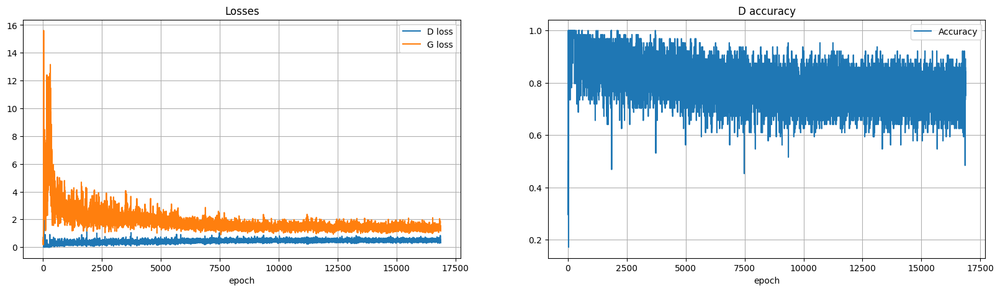

----EPOCH 9-----
0 [D loss: 0.4643,	 acc.: 76.56%]	[G loss: 1.5591]


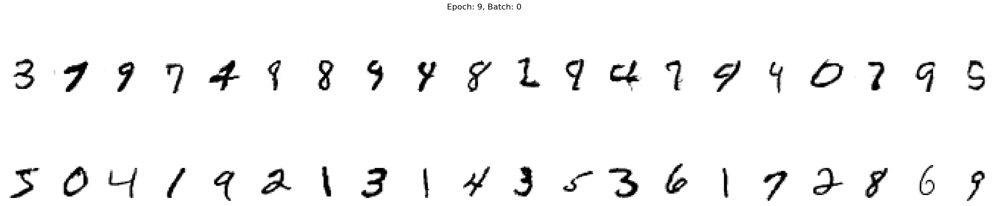

50 [D loss: 0.4364,	 acc.: 78.12%]	[G loss: 1.6165]
100 [D loss: 0.4124,	 acc.: 79.69%]	[G loss: 1.4160]
150 [D loss: 0.4001,	 acc.: 82.81%]	[G loss: 1.4144]
200 [D loss: 0.4500,	 acc.: 81.25%]	[G loss: 1.2737]
250 [D loss: 0.3929,	 acc.: 81.25%]	[G loss: 1.5514]
300 [D loss: 0.4190,	 acc.: 75.00%]	[G loss: 1.4182]
350 [D loss: 0.6205,	 acc.: 73.44%]	[G loss: 1.4696]
400 [D loss: 0.4540,	 acc.: 78.12%]	[G loss: 1.3586]
450 [D loss: 0.4599,	 acc.: 75.00%]	[G loss: 1.3278]
500 [D loss: 0.5550,	 acc.: 65.62%]	[G loss: 1.1880]


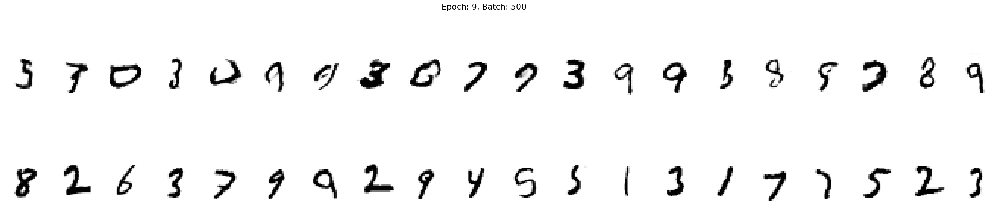

550 [D loss: 0.4749,	 acc.: 75.00%]	[G loss: 1.1155]
600 [D loss: 0.6091,	 acc.: 68.75%]	[G loss: 1.4582]
650 [D loss: 0.4058,	 acc.: 81.25%]	[G loss: 1.4404]
700 [D loss: 0.4494,	 acc.: 82.81%]	[G loss: 1.3053]
750 [D loss: 0.3640,	 acc.: 82.81%]	[G loss: 1.4415]
800 [D loss: 0.5175,	 acc.: 68.75%]	[G loss: 1.3744]
850 [D loss: 0.5069,	 acc.: 68.75%]	[G loss: 1.2977]
900 [D loss: 0.3768,	 acc.: 85.94%]	[G loss: 1.5283]
950 [D loss: 0.5443,	 acc.: 68.75%]	[G loss: 1.2008]
1000 [D loss: 0.5084,	 acc.: 75.00%]	[G loss: 1.4036]


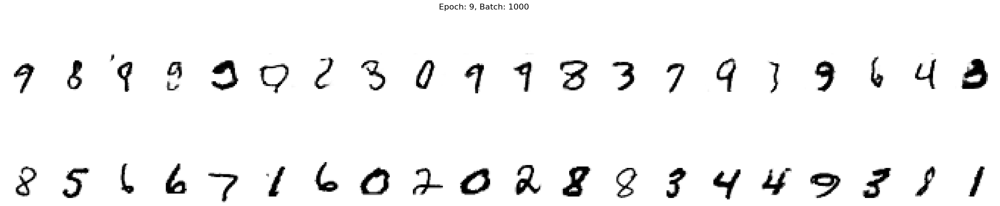

1050 [D loss: 0.4624,	 acc.: 79.69%]	[G loss: 1.3530]
1100 [D loss: 0.3682,	 acc.: 85.94%]	[G loss: 1.3458]
1150 [D loss: 0.4712,	 acc.: 71.88%]	[G loss: 1.4316]
1200 [D loss: 0.4717,	 acc.: 68.75%]	[G loss: 1.4881]
1250 [D loss: 0.5298,	 acc.: 71.88%]	[G loss: 1.8232]
1300 [D loss: 0.4900,	 acc.: 76.56%]	[G loss: 1.5594]
1350 [D loss: 0.6291,	 acc.: 68.75%]	[G loss: 1.3218]
1400 [D loss: 0.3961,	 acc.: 76.56%]	[G loss: 1.5342]
1450 [D loss: 0.5525,	 acc.: 71.88%]	[G loss: 1.3830]
1500 [D loss: 0.5187,	 acc.: 71.88%]	[G loss: 1.4843]


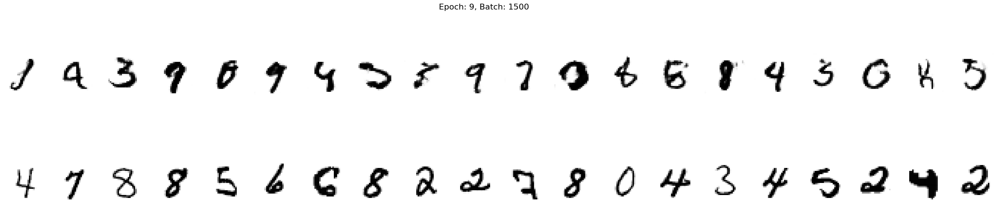

1550 [D loss: 0.4084,	 acc.: 85.94%]	[G loss: 1.4174]
1600 [D loss: 0.3733,	 acc.: 90.62%]	[G loss: 1.3581]
1650 [D loss: 0.4842,	 acc.: 75.00%]	[G loss: 1.7518]
1700 [D loss: 0.4596,	 acc.: 81.25%]	[G loss: 1.1598]
1750 [D loss: 0.4346,	 acc.: 79.69%]	[G loss: 1.5195]
1800 [D loss: 0.4946,	 acc.: 75.00%]	[G loss: 1.3525]
1850 [D loss: 0.3495,	 acc.: 82.81%]	[G loss: 1.5596]


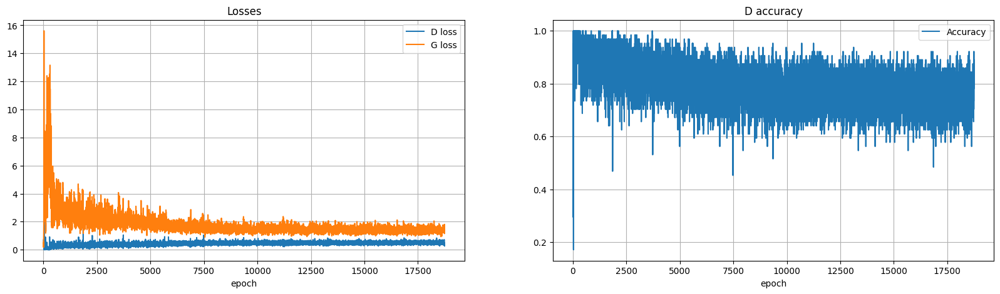

----EPOCH 10-----
0 [D loss: 0.4460,	 acc.: 76.56%]	[G loss: 1.4894]


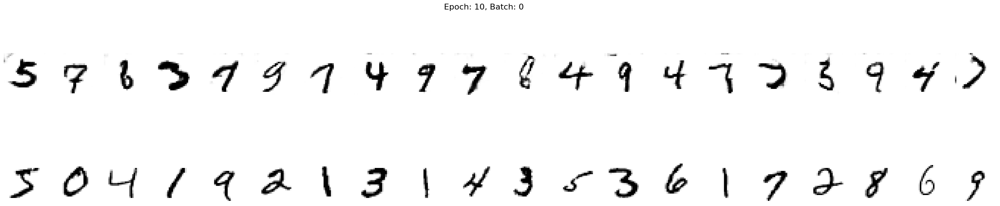

50 [D loss: 0.4206,	 acc.: 76.56%]	[G loss: 1.2841]
100 [D loss: 0.4436,	 acc.: 75.00%]	[G loss: 1.5205]
150 [D loss: 0.4761,	 acc.: 78.12%]	[G loss: 1.2727]
200 [D loss: 0.4203,	 acc.: 76.56%]	[G loss: 1.4533]
250 [D loss: 0.4708,	 acc.: 76.56%]	[G loss: 1.4353]
300 [D loss: 0.4649,	 acc.: 82.81%]	[G loss: 1.3273]
350 [D loss: 0.5234,	 acc.: 68.75%]	[G loss: 1.3014]
400 [D loss: 0.6087,	 acc.: 68.75%]	[G loss: 1.2789]
450 [D loss: 0.4848,	 acc.: 73.44%]	[G loss: 1.2462]
500 [D loss: 0.5813,	 acc.: 65.62%]	[G loss: 1.3856]


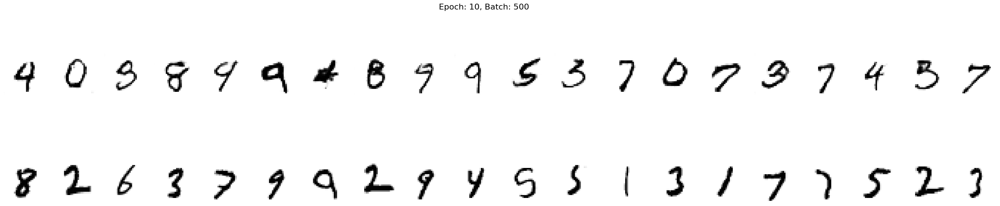

550 [D loss: 0.6078,	 acc.: 68.75%]	[G loss: 1.4405]
600 [D loss: 0.4525,	 acc.: 79.69%]	[G loss: 1.4737]
650 [D loss: 0.6119,	 acc.: 73.44%]	[G loss: 1.3971]
700 [D loss: 0.3896,	 acc.: 82.81%]	[G loss: 1.5132]
750 [D loss: 0.5101,	 acc.: 78.12%]	[G loss: 1.3783]
800 [D loss: 0.6159,	 acc.: 70.31%]	[G loss: 1.6281]
850 [D loss: 0.4502,	 acc.: 75.00%]	[G loss: 1.3346]
900 [D loss: 0.3615,	 acc.: 90.62%]	[G loss: 1.6395]
950 [D loss: 0.4539,	 acc.: 78.12%]	[G loss: 1.2952]
1000 [D loss: 0.6136,	 acc.: 59.38%]	[G loss: 1.3333]


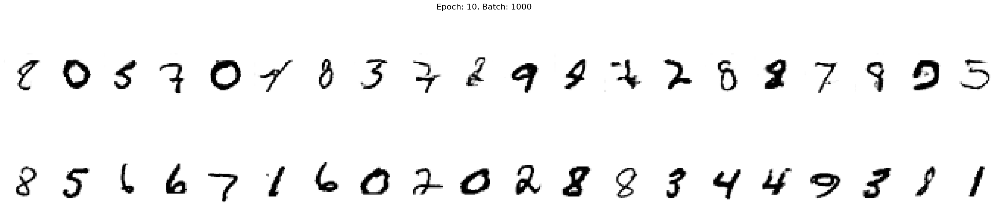

1050 [D loss: 0.5642,	 acc.: 68.75%]	[G loss: 1.3154]
1100 [D loss: 0.4555,	 acc.: 79.69%]	[G loss: 1.1634]
1150 [D loss: 0.5839,	 acc.: 65.62%]	[G loss: 1.3891]
1200 [D loss: 0.5080,	 acc.: 81.25%]	[G loss: 1.2695]
1250 [D loss: 0.4386,	 acc.: 81.25%]	[G loss: 1.1590]
1300 [D loss: 0.4267,	 acc.: 79.69%]	[G loss: 1.3971]
1350 [D loss: 0.4721,	 acc.: 85.94%]	[G loss: 1.2883]
1400 [D loss: 0.3984,	 acc.: 78.12%]	[G loss: 1.3998]
1450 [D loss: 0.4541,	 acc.: 81.25%]	[G loss: 1.4783]
1500 [D loss: 0.4682,	 acc.: 71.88%]	[G loss: 1.3676]


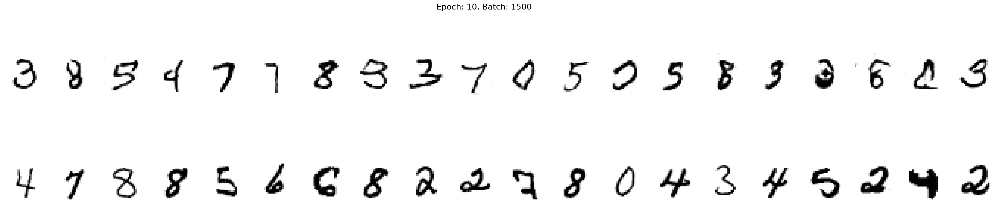

1550 [D loss: 0.3453,	 acc.: 89.06%]	[G loss: 1.5741]
1600 [D loss: 0.4576,	 acc.: 78.12%]	[G loss: 1.4047]
1650 [D loss: 0.5419,	 acc.: 78.12%]	[G loss: 1.3736]
1700 [D loss: 0.4818,	 acc.: 76.56%]	[G loss: 1.1548]
1750 [D loss: 0.4102,	 acc.: 81.25%]	[G loss: 1.1831]
1800 [D loss: 0.3892,	 acc.: 79.69%]	[G loss: 1.1763]
1850 [D loss: 0.2941,	 acc.: 90.62%]	[G loss: 1.6891]


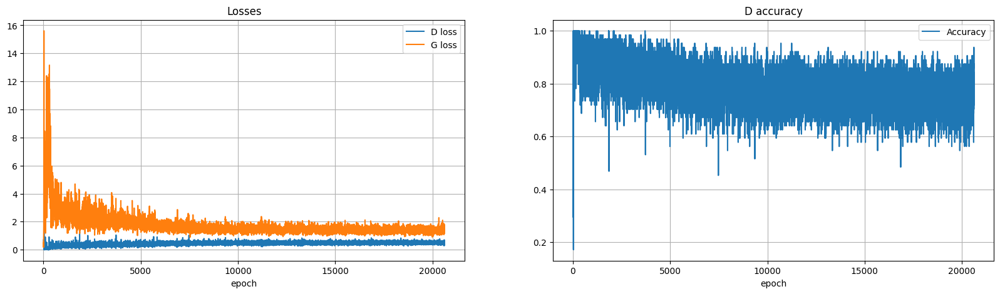

----EPOCH 11-----
0 [D loss: 0.5016,	 acc.: 68.75%]	[G loss: 1.7445]


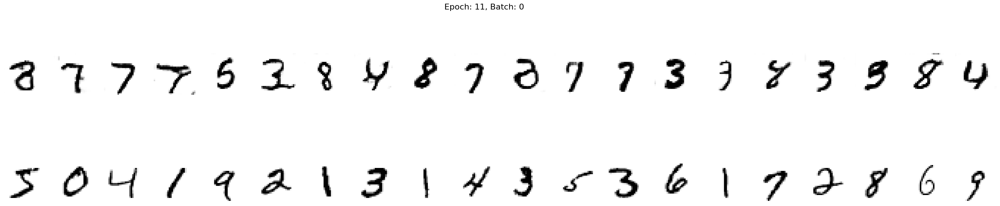

50 [D loss: 0.5056,	 acc.: 82.81%]	[G loss: 1.4171]
100 [D loss: 0.5138,	 acc.: 82.81%]	[G loss: 1.6503]
150 [D loss: 0.4554,	 acc.: 76.56%]	[G loss: 1.2915]
200 [D loss: 0.5227,	 acc.: 79.69%]	[G loss: 1.3902]
250 [D loss: 0.4266,	 acc.: 78.12%]	[G loss: 1.3063]
300 [D loss: 0.4163,	 acc.: 78.12%]	[G loss: 1.4103]
350 [D loss: 0.4840,	 acc.: 73.44%]	[G loss: 1.4413]
400 [D loss: 0.4505,	 acc.: 82.81%]	[G loss: 1.2589]
450 [D loss: 0.5508,	 acc.: 71.88%]	[G loss: 1.5766]
500 [D loss: 0.6918,	 acc.: 65.62%]	[G loss: 1.1628]


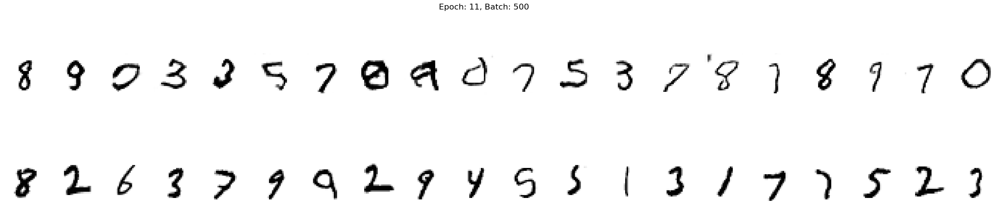

550 [D loss: 0.4702,	 acc.: 75.00%]	[G loss: 1.2661]
600 [D loss: 0.4607,	 acc.: 73.44%]	[G loss: 1.4616]
650 [D loss: 0.4073,	 acc.: 81.25%]	[G loss: 1.6730]
700 [D loss: 0.5076,	 acc.: 76.56%]	[G loss: 1.5057]
750 [D loss: 0.5463,	 acc.: 68.75%]	[G loss: 1.4773]
800 [D loss: 0.6894,	 acc.: 62.50%]	[G loss: 1.5168]
850 [D loss: 0.4005,	 acc.: 79.69%]	[G loss: 1.1197]
900 [D loss: 0.3917,	 acc.: 82.81%]	[G loss: 1.3043]
950 [D loss: 0.5329,	 acc.: 73.44%]	[G loss: 1.1532]
1000 [D loss: 0.5680,	 acc.: 65.62%]	[G loss: 1.3209]


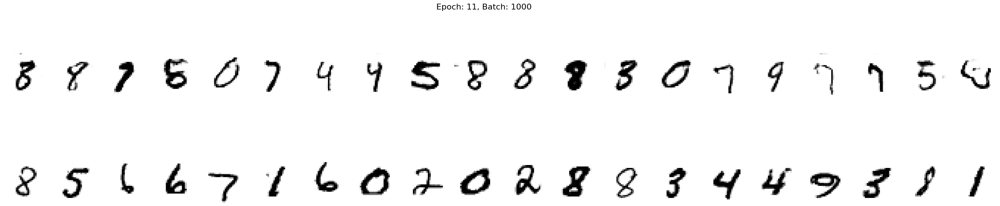

1050 [D loss: 0.5998,	 acc.: 76.56%]	[G loss: 1.3181]
1100 [D loss: 0.3889,	 acc.: 81.25%]	[G loss: 1.3788]
1150 [D loss: 0.4900,	 acc.: 71.88%]	[G loss: 1.3454]
1200 [D loss: 0.3401,	 acc.: 85.94%]	[G loss: 1.3761]
1250 [D loss: 0.5580,	 acc.: 73.44%]	[G loss: 1.2576]
1300 [D loss: 0.4642,	 acc.: 79.69%]	[G loss: 1.4635]
1350 [D loss: 0.5686,	 acc.: 73.44%]	[G loss: 0.9812]
1400 [D loss: 0.5302,	 acc.: 70.31%]	[G loss: 1.3479]
1450 [D loss: 0.4469,	 acc.: 76.56%]	[G loss: 1.3167]
1500 [D loss: 0.3977,	 acc.: 82.81%]	[G loss: 1.4798]


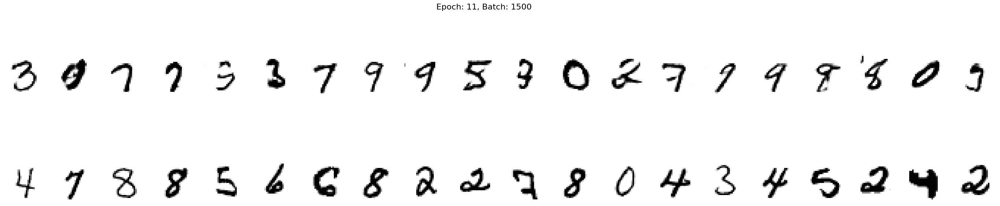

1550 [D loss: 0.4179,	 acc.: 81.25%]	[G loss: 1.0472]
1600 [D loss: 0.4665,	 acc.: 79.69%]	[G loss: 1.0138]
1650 [D loss: 0.5196,	 acc.: 81.25%]	[G loss: 1.5420]
1700 [D loss: 0.4697,	 acc.: 75.00%]	[G loss: 1.2410]
1750 [D loss: 0.3760,	 acc.: 87.50%]	[G loss: 1.2545]
1800 [D loss: 0.5307,	 acc.: 76.56%]	[G loss: 1.3265]
1850 [D loss: 0.3891,	 acc.: 82.81%]	[G loss: 1.4732]


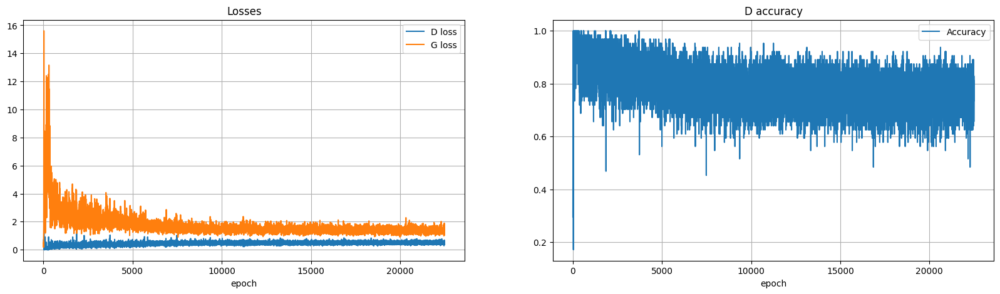

----EPOCH 12-----
0 [D loss: 0.4241,	 acc.: 75.00%]	[G loss: 1.3131]


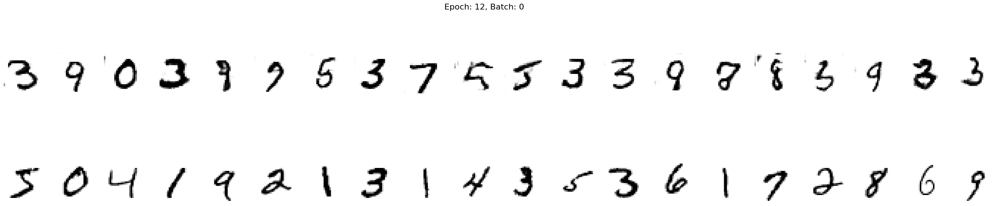

50 [D loss: 0.5624,	 acc.: 59.38%]	[G loss: 1.3313]
100 [D loss: 0.4659,	 acc.: 78.12%]	[G loss: 1.3770]
150 [D loss: 0.7812,	 acc.: 67.19%]	[G loss: 1.1091]
200 [D loss: 0.4527,	 acc.: 76.56%]	[G loss: 1.2911]
250 [D loss: 0.4955,	 acc.: 75.00%]	[G loss: 1.3342]
300 [D loss: 0.6178,	 acc.: 67.19%]	[G loss: 1.1237]
350 [D loss: 0.4337,	 acc.: 71.88%]	[G loss: 1.1053]
400 [D loss: 0.5582,	 acc.: 67.19%]	[G loss: 1.6963]
450 [D loss: 0.5043,	 acc.: 78.12%]	[G loss: 1.2372]
500 [D loss: 0.5511,	 acc.: 70.31%]	[G loss: 1.2945]


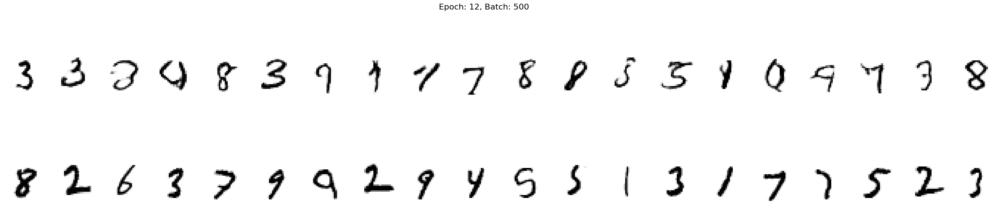

550 [D loss: 0.4420,	 acc.: 78.12%]	[G loss: 1.2771]
600 [D loss: 0.4722,	 acc.: 75.00%]	[G loss: 1.3576]
650 [D loss: 0.4971,	 acc.: 70.31%]	[G loss: 1.4042]
700 [D loss: 0.4405,	 acc.: 78.12%]	[G loss: 1.5638]
750 [D loss: 0.4682,	 acc.: 78.12%]	[G loss: 1.3218]
800 [D loss: 0.6278,	 acc.: 67.19%]	[G loss: 1.3716]
850 [D loss: 0.4702,	 acc.: 78.12%]	[G loss: 1.4322]
900 [D loss: 0.4306,	 acc.: 71.88%]	[G loss: 1.2114]
950 [D loss: 0.6192,	 acc.: 67.19%]	[G loss: 1.3197]
1000 [D loss: 0.4892,	 acc.: 73.44%]	[G loss: 1.4022]


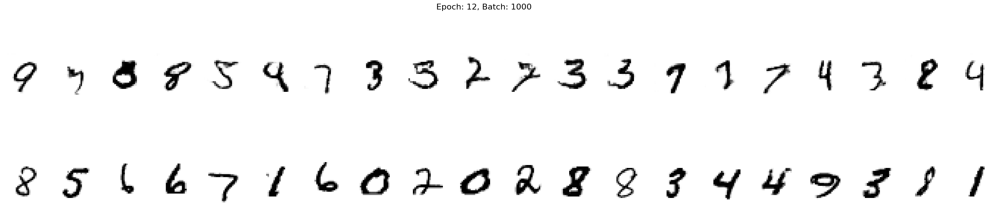

1050 [D loss: 0.4961,	 acc.: 73.44%]	[G loss: 1.4976]
1100 [D loss: 0.4464,	 acc.: 81.25%]	[G loss: 1.3837]
1150 [D loss: 0.5119,	 acc.: 71.88%]	[G loss: 1.3262]
1200 [D loss: 0.4468,	 acc.: 79.69%]	[G loss: 1.2607]
1250 [D loss: 0.4861,	 acc.: 79.69%]	[G loss: 1.5978]
1300 [D loss: 0.5489,	 acc.: 73.44%]	[G loss: 1.6486]
1350 [D loss: 0.4736,	 acc.: 76.56%]	[G loss: 1.0140]
1400 [D loss: 0.4947,	 acc.: 75.00%]	[G loss: 1.5192]
1450 [D loss: 0.5318,	 acc.: 64.06%]	[G loss: 1.1918]
1500 [D loss: 0.5297,	 acc.: 75.00%]	[G loss: 1.2774]


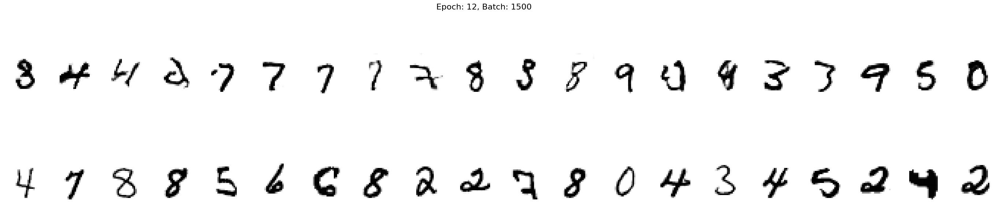

1550 [D loss: 0.3767,	 acc.: 87.50%]	[G loss: 1.4370]
1600 [D loss: 0.4611,	 acc.: 76.56%]	[G loss: 1.1804]
1650 [D loss: 0.7032,	 acc.: 67.19%]	[G loss: 1.1611]
1700 [D loss: 0.5508,	 acc.: 70.31%]	[G loss: 1.1629]
1750 [D loss: 0.5805,	 acc.: 68.75%]	[G loss: 1.3166]
1800 [D loss: 0.3884,	 acc.: 82.81%]	[G loss: 1.3118]
1850 [D loss: 0.4676,	 acc.: 76.56%]	[G loss: 1.5409]


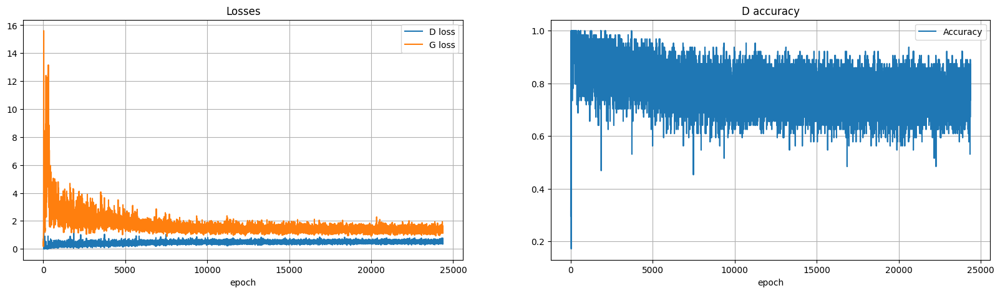

----EPOCH 13-----
0 [D loss: 0.4959,	 acc.: 79.69%]	[G loss: 1.5111]


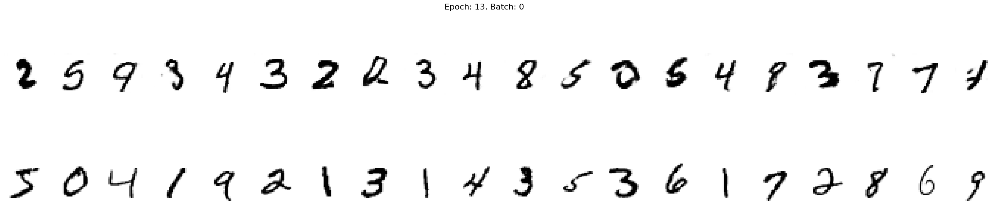

50 [D loss: 0.4907,	 acc.: 71.88%]	[G loss: 1.3010]
100 [D loss: 0.4305,	 acc.: 75.00%]	[G loss: 1.4369]
150 [D loss: 0.5302,	 acc.: 75.00%]	[G loss: 1.6408]
200 [D loss: 0.4063,	 acc.: 79.69%]	[G loss: 1.5494]
250 [D loss: 0.3595,	 acc.: 84.38%]	[G loss: 1.1943]
300 [D loss: 0.4222,	 acc.: 78.12%]	[G loss: 1.5030]
350 [D loss: 0.5318,	 acc.: 78.12%]	[G loss: 1.3964]
400 [D loss: 0.4418,	 acc.: 78.12%]	[G loss: 1.1940]
450 [D loss: 0.5261,	 acc.: 71.88%]	[G loss: 1.2086]
500 [D loss: 0.4826,	 acc.: 79.69%]	[G loss: 1.1993]


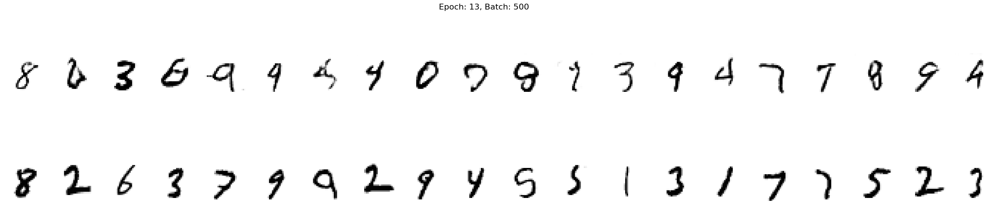

550 [D loss: 0.4677,	 acc.: 73.44%]	[G loss: 1.2960]
600 [D loss: 0.4550,	 acc.: 78.12%]	[G loss: 1.5391]
650 [D loss: 0.3904,	 acc.: 79.69%]	[G loss: 1.3931]
700 [D loss: 0.4522,	 acc.: 81.25%]	[G loss: 1.3087]
750 [D loss: 0.5329,	 acc.: 70.31%]	[G loss: 1.3911]
800 [D loss: 0.7268,	 acc.: 67.19%]	[G loss: 1.3824]
850 [D loss: 0.5200,	 acc.: 67.19%]	[G loss: 1.2977]
900 [D loss: 0.3794,	 acc.: 82.81%]	[G loss: 1.2351]
950 [D loss: 0.4835,	 acc.: 76.56%]	[G loss: 1.2701]
1000 [D loss: 0.4896,	 acc.: 76.56%]	[G loss: 1.1307]


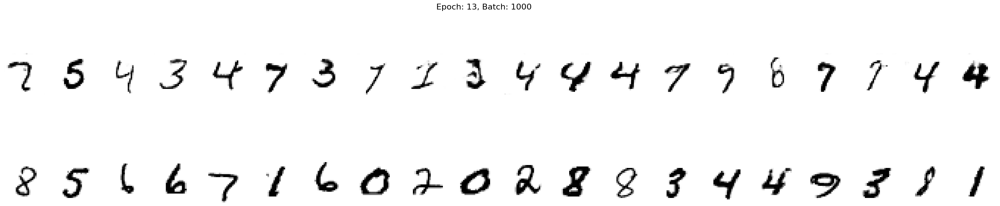

1050 [D loss: 0.4801,	 acc.: 76.56%]	[G loss: 1.2956]
1100 [D loss: 0.4411,	 acc.: 81.25%]	[G loss: 1.5124]
1150 [D loss: 0.4779,	 acc.: 71.88%]	[G loss: 1.5354]
1200 [D loss: 0.4488,	 acc.: 75.00%]	[G loss: 1.3205]
1250 [D loss: 0.6067,	 acc.: 64.06%]	[G loss: 1.2174]
1300 [D loss: 0.4519,	 acc.: 84.38%]	[G loss: 1.3921]
1350 [D loss: 0.3945,	 acc.: 82.81%]	[G loss: 1.4202]
1400 [D loss: 0.5111,	 acc.: 78.12%]	[G loss: 1.3714]
1450 [D loss: 0.4786,	 acc.: 78.12%]	[G loss: 1.3732]
1500 [D loss: 0.4777,	 acc.: 75.00%]	[G loss: 1.1603]


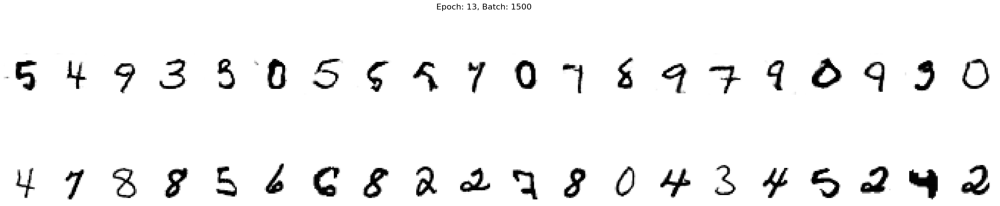

1550 [D loss: 0.4830,	 acc.: 78.12%]	[G loss: 1.0343]
1600 [D loss: 0.4511,	 acc.: 79.69%]	[G loss: 1.2189]
1650 [D loss: 0.5534,	 acc.: 71.88%]	[G loss: 1.2228]
1700 [D loss: 0.4861,	 acc.: 76.56%]	[G loss: 1.2913]
1750 [D loss: 0.5539,	 acc.: 76.56%]	[G loss: 1.3838]
1800 [D loss: 0.5277,	 acc.: 68.75%]	[G loss: 1.4569]
1850 [D loss: 0.4450,	 acc.: 78.12%]	[G loss: 2.0816]


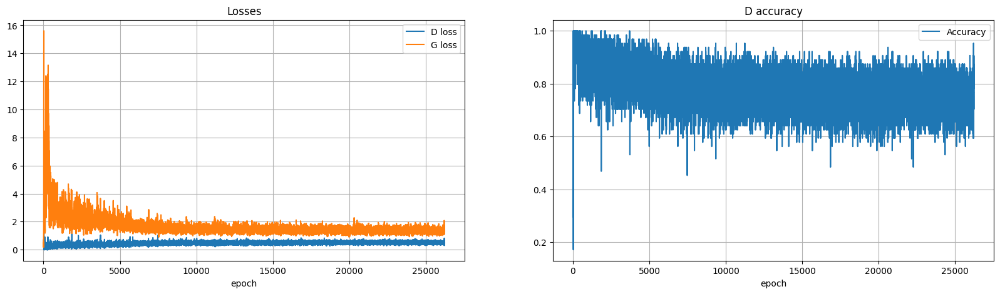

----EPOCH 14-----
0 [D loss: 0.4082,	 acc.: 79.69%]	[G loss: 1.6279]


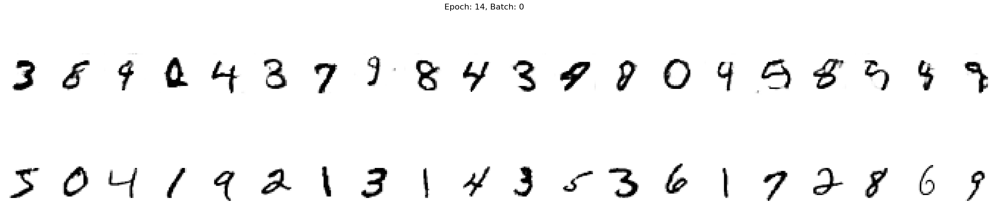

50 [D loss: 0.5026,	 acc.: 76.56%]	[G loss: 1.2275]
100 [D loss: 0.4341,	 acc.: 79.69%]	[G loss: 1.2451]
150 [D loss: 0.4721,	 acc.: 78.12%]	[G loss: 1.6125]
200 [D loss: 0.5144,	 acc.: 73.44%]	[G loss: 1.6240]
250 [D loss: 0.4848,	 acc.: 76.56%]	[G loss: 1.2772]
300 [D loss: 0.6174,	 acc.: 67.19%]	[G loss: 1.1815]
350 [D loss: 0.5700,	 acc.: 75.00%]	[G loss: 1.1072]
400 [D loss: 0.4099,	 acc.: 79.69%]	[G loss: 1.1653]
450 [D loss: 0.4736,	 acc.: 78.12%]	[G loss: 1.0889]
500 [D loss: 0.4782,	 acc.: 75.00%]	[G loss: 1.7080]


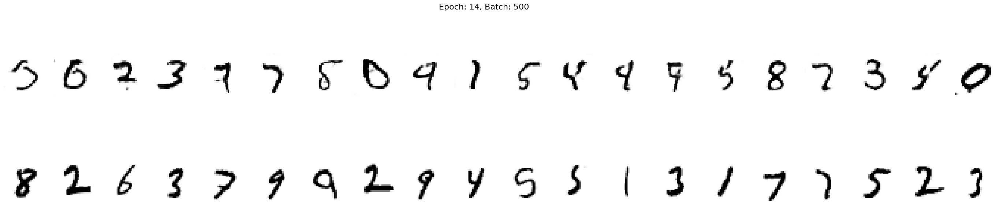

550 [D loss: 0.5417,	 acc.: 73.44%]	[G loss: 1.2405]
600 [D loss: 0.4084,	 acc.: 79.69%]	[G loss: 1.4626]
650 [D loss: 0.4193,	 acc.: 79.69%]	[G loss: 1.1986]
700 [D loss: 0.5886,	 acc.: 68.75%]	[G loss: 1.6546]
750 [D loss: 0.6168,	 acc.: 64.06%]	[G loss: 1.2672]
800 [D loss: 0.4841,	 acc.: 73.44%]	[G loss: 1.5672]
850 [D loss: 0.3978,	 acc.: 82.81%]	[G loss: 1.3241]
900 [D loss: 0.4739,	 acc.: 76.56%]	[G loss: 1.3208]
950 [D loss: 0.4785,	 acc.: 76.56%]	[G loss: 1.3070]
1000 [D loss: 0.5704,	 acc.: 68.75%]	[G loss: 1.3416]


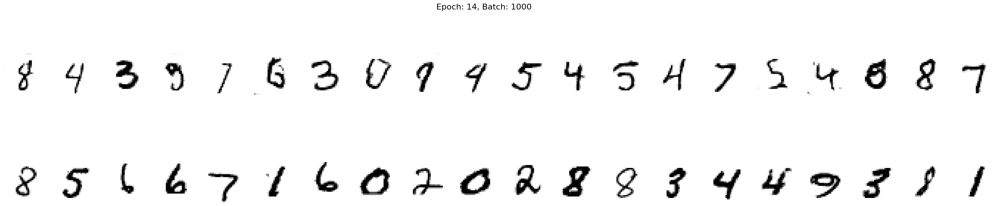

1050 [D loss: 0.5984,	 acc.: 70.31%]	[G loss: 1.5200]
1100 [D loss: 0.4395,	 acc.: 78.12%]	[G loss: 1.4744]
1150 [D loss: 0.5697,	 acc.: 68.75%]	[G loss: 1.3043]
1200 [D loss: 0.4263,	 acc.: 79.69%]	[G loss: 1.3885]
1250 [D loss: 0.4907,	 acc.: 71.88%]	[G loss: 1.3198]
1300 [D loss: 0.6275,	 acc.: 64.06%]	[G loss: 1.3739]
1350 [D loss: 0.5296,	 acc.: 71.88%]	[G loss: 1.3434]
1400 [D loss: 0.4328,	 acc.: 85.94%]	[G loss: 1.3151]
1450 [D loss: 0.5177,	 acc.: 67.19%]	[G loss: 1.4608]
1500 [D loss: 0.5639,	 acc.: 68.75%]	[G loss: 1.5792]


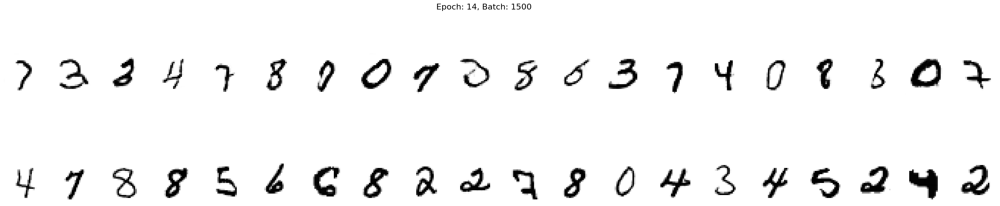

1550 [D loss: 0.4884,	 acc.: 76.56%]	[G loss: 1.3658]
1600 [D loss: 0.4876,	 acc.: 78.12%]	[G loss: 1.2102]
1650 [D loss: 0.5863,	 acc.: 71.88%]	[G loss: 1.2376]
1700 [D loss: 0.4916,	 acc.: 67.19%]	[G loss: 1.1954]
1750 [D loss: 0.4556,	 acc.: 84.38%]	[G loss: 1.1602]
1800 [D loss: 0.4652,	 acc.: 81.25%]	[G loss: 1.3637]
1850 [D loss: 0.4227,	 acc.: 82.81%]	[G loss: 1.5722]


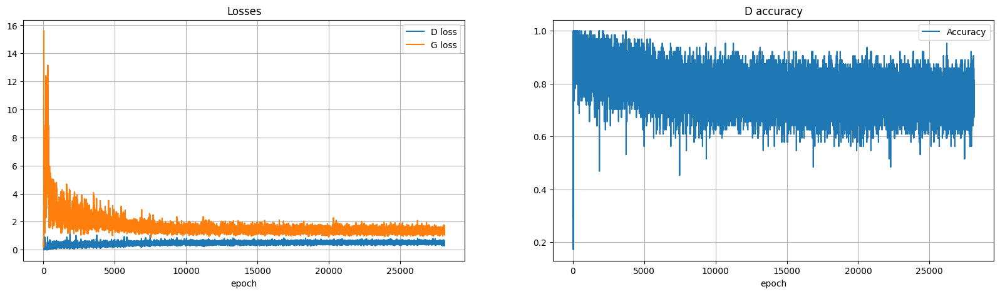

In [ ]:
train(X_train, generator, discriminator, combined, epochs=15, batch_size=32, sample_interval=100)

> Creo que este modelo es el mejor de todos con los que he estado trabajando. Considero que es el mejor no solo por la calidad (aunque en varios epoch a veces cuesta diferenciar cual es el real y cual es el generado) de la imagen sino también por la variedad. El principal problema con el que me he topado desde un principio es el del colapso modal, dado que la DCGAN tendía a quedarse con los mismo números, creo que con este modelo "combato" este problema, ya que en el último epoch podemos observar los 10 números del mnist hecho que en el baseline o en cualquier otro caso era imposible de ver. Además de este inconveniente, el otro fue lidiar con el accuracy ya que tendía a ser alto (85-100) y el loss muy bajo, creo que he "mitigado" este problema en la mediada de lo posible.

> Como conclusión general, trabajar con DCGANs no es sencillo, ya solo el simple hecho de entrenarlas requiere de mucha paciencia, por otro lado es díficil evaluarlas ya que es complicado saber si va por buen camino o no.

# Otras ideas


> Intenté modificar el train, jugando con el batch_size y sinceramente no conseguí mucho:



```
train(X_train, generator, discriminator, combined, epochs=10, batch_size=8, sample_interval=100)
```

> Rompí el Google Colab por falta de RAM a mitad del entrenamiento, y luego subiendo el batch_size conseguí aumentar la velocidad del fit pero los resultado fueron similares o ligeramente peores.

> No voy a mostrar los resultados ya que serían casi reduntantes




Creado por **Guillermo Iglesias** (guillermo.iglesias@upm.es)

<img src="https://licensebuttons.net/l/by-nc-sa/3.0/88x31.png">